# Load libraries and functions and Initialize  

In [1]:
# reload
#%reset
%load_ext autoreload
%autoreload 2 

import warnings
import logging
import os

# DEBUG MODE
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
warnings.filterwarnings('ignore')
logging.getLogger('tensorflow').setLevel(logging.FATAL)
#tf.get_logger().setLevel('ERROR')
    

from helper_functions import *


# Sets the random seed
# If you want to set a specific seed then pass it as an argument 
initialize(561)

Run with random seed:  561
GPU is available.
1


# Set string for saving results and code 

In [2]:
notebook_save_str = 'sup_5Steps_nextWindow_mlp'#'sup_singleStep_nextWindow_mlp' # template 'sup_past5Steps_nextWindow_xgb'
#notebook_save_str = 'tmp'

# Set Experiment Parameters

In [3]:
#========================================
# Experiment Parameters: Check carefully!
#========================================

# This is where models are saved and loaded from
dataset_folder = '../../../dataset_ver1/parsed_data_5steps/' # 500 ms with 5 100ms steps 
#dataset_folder = '../../../dataset_ver1/parsed_data4/' # 500 ms single steps
models_folder = 'models/mlp_models/'
pretrain_slice = 'all' #['macro', 'micro', 'slow', 'fast', 'all']
train_slice = 'all' #['macro', 'micro', 'slow', 'fast', 'all', 'only_delay']
test_slice = 'all' #['macro', 'micro', 'slow', 'fast', 'all']
EXP_PARAM = {
    'scaler': 'standard', #'minmax', 'standard', 'robust', 'maxabs', 'l2norm'
    'num_rand_runs': 3, # number of runs with each run doing a different random sample of size label_no from the set of labeled samples 
}

num_samples_list = [100, 1*K, 10*K, 20*K] 
#num_samples_list = [20*K]

scaler_to_save_name = EXP_PARAM['scaler']+'_scaler'

#==================================
# Pretraining Experiment Parameters
#==================================

pretrain = False
pretrain_type = 'vime' #['dae', 'tabnet']
pretrain_model_to_save_name = pretrain_slice+'_vime_ssl_defhyp'

#==========================================
# Supervised Training Experiment Parameters
#==========================================

# Load an existing sup model to evaluate 
load_sup_model = False
sup_model_to_load_type = 'tabnet'
sup_model_to_load_name = train_slice+'_vime_suptrain_no_pretrain'

# Load an existing pretrained model to use as encoding for sup model 
use_pretrained_model = False
pretrain_model_to_load_type = 'vime' #['dae', 'tabnet']
pretrain_model_to_load_name = pretrain_slice+'_vime_ssl_defhyp.h5' #'vime_encoder_model.h5'
scaler_to_load_name = 'minmax_scaler.pkl'

# Train a sup model with or without using a pretrained model 
sup_model_type = 'mlp' #['mlp', 'xgb', 'tabnet', 'vime']
suptrain_model_to_save_name = train_slice+'_mlp' # could also be sup_model_with_pretrain 


#==================================================
# Experiment Parameters: Not often changed
#==================================================

time_step_size = '500ms'

# When input features are NA 
# Could experiment with forward fill imputation 
# If the label is NA during supervised training then the sample is dropped  
impute_method = 'forward_fill'# ['forward_fill', 'zero_fill']
                              
# These are the ones we have chosen to work with  
#learning_tasks = ['httpClientRtt_trace.txt_page_load_time']
learning_tasks = ['dashClient_trace.txt_newBitRate_bps', 
                  'vrFragment_trace.txt_vr_frag_thput_mbps', 'vrFragment_trace.txt_vr_burst_thput_mbps',
                  'vrFragment_trace.txt_vr_frag_time', 'vrFragment_trace.txt_vr_burst_time', 
                  #'httpClientRtt_trace.txt_page_load_time',
                  'delay_trace.txt_ul_delay', 'delay_trace.txt_dl_delay']
# index matched with the learning_tasks above
#learning_task_types = ['reg']
learning_task_types = ['clas', 
                       'reg', 'reg', 
                       'reg', 'reg',
                       #'reg',
                       'reg', 'reg']

# If True then we are predicting one window ahead if False then we are predicting on the same window 
shift_samp_for_predict = True

# If you want the test samples to be sorted by delay value to see the error differences for the low delay and high delay cases 
sort_test_samples = False

use_all_feats = True
# take the top n features of each run and add it to the top_n_features list  
# If use_all_feats = True then thes will not be used 
feat_filter = 10 
top_n_features = []
# Only valid when use_all_feats = False 
selected_features = []

# All delay values above this will be clipped to the threshold value
clip_outliers = True
delay_clip_th = 5000 # ms

# Set Model Hyperparameters

In [4]:
# Hyperparameters for SSL using DAE 
hypp_ssl_dae={
    'swap_noise_prob': 0.50,
    'batch_size': 128,   

    # used if 'deepbottleneck'
    #'arch': 'deepbottleneck',
    #'hid_size': 150,
    #'bottle_neck_size': 40,
    #'num_layers': 5
    
    # used if 'deepstack'
    'arch': 'deepstack',
    'hid_size': 414,
    'num_layers': 3
} 

s3l_hyp_ssl_dae={
    'metric': "accuracy_score",
    'hidden_dim': 512,
    'encoder_depth': 4,
    'head_depth': 2,
    'noise_type': "Swap",
    'noise_ratio': 0.3,
    'max_epochs': 100,
    'batch_size': 128
}

# Hyperparameters for SSL using TabNet
hypp_ssl_tabnet={
    #'lambda_sparse': , # default = 1e-3
    # This is the extra sparsity loss coefficient as proposed in the original paper. The bigger this coefficient is, the sparser your model will be in terms of feature selection. Depending on the difficulty of your problem, reducing this value could help.
    'mask_type': 'entmax', # 'entmax' # default='sparsemax'
    'n_da': 8, # between 8-64 # default=8
    'n_steps': 3, # between 3-10 # default=3
    'n_independent': 2, # between 1-5 # default=2
    'n_shared': 2, # between 1-5 # default=2
    'n_shared_decoder': 1, # default=1
    'n_indep_decoder': 1, # default=1
    'noise_ratio': 0.30,
    'batch_size': 1024, #default=1024
    'max_epochs': 200, # default=200
    'patience': 15 # default=10
}

hyp_ssl_semi_vime={
    # self supervised learning hyperparameters
    'p_m': 0.3, # Corruption probability for self-supervised learning
    'alpha': 2.0, # Hyper-parameter to control the weights of feature and mask losses
    'K': 3, # Number of augmented samples
    'beta': 1.0, # Hyperparameter to control supervised and unsupervised losses
    'batch_size': 128,
    'epochs': 100,
    # semi supervised learning hyperparameters
    'semi_hidden_dim': 100,
    'semi_batch_size': 128,
    'semi_iterations': 5000
}



# Hyperparameters for supervised XGB training 
hypp_sup_xgb={
    'loss':{'reg':'mse',
            'clas':'categorical_crossentropy'}
} 
# Hyperparameters for supervised MLP training
hypp_sup_mlp={
    'fc_layers': [500, 100], # the hidden layers
    'batch_size': 64,  
    'max_epochs': 500,
    'patience': 15,
    'learning_rate': 0.0001,
    'loss':{'reg':'mse',#'mean_absolute_error' 'mean_absolute_percentage_error'
            'clas':'categorical_crossentropy'},
    'metrics':{'reg':['MeanAbsolutePercentageError'],
               'clas':['Recall']},#'F1Score' does nto work needs a different dimension 
    'out_activation':{'reg':'linear', 
                      'clas':'softmax'} 
} 

# Hyperparameters for supervised TabNet training
hypp_sup_tabnet={
    #'lambda_sparse': , # default = 1e-3
    # This is the extra sparsity loss coefficient as proposed in the original paper. The bigger this coefficient is, the sparser your model will be in terms of feature selection. Depending on the difficulty of your problem, reducing this value could help.
    'mask_type': 'sparsemax', # 'entmax' # default='sparsemax'
    'n_da': 8, # between 8-64 # default=8
    'n_steps': 3, # between 3-10 # default=3
    'n_independent': 2, # between 1-5 # default=2
    'n_shared': 2, # between 1-5 # default=2 
    'batch_size': 1024, #default=1024
    'max_epochs': 200, # default=200
    'patience': 15 # default=10
} 

if sup_model_type == 'tabnet':
    sup_hyper_params=hypp_sup_tabnet
elif sup_model_type == 'mlp':
    sup_hyper_params=hypp_sup_mlp
elif sup_model_type == 'xgb':
    sup_hyper_params=hypp_sup_xgb    


#pretrain_runs = range(1, 10 + 1)
#train_runs = range(11, 17 + 1)
#test_runs = range(18, 20 + 1)

num_pretrain_runs = 10
num_train_runs = 7
num_test_runs = 3
train_test_run_nums = np.array(range(11, 20+1))

# Create the models_folder if it does not already exist
if not os.path.isdir(models_folder):
    os.makedirs(models_folder)

# Load pretraining runs

In [ ]:
pretrain_runs = range(1, 10 + 1)
pretrain_data = read_and_concatenate_runs(pretrain_runs, dataset_folder, pretrain_slice, network_info, time_step_size, 
                                          use_all_feats, drop_col_substr, learning_tasks, shift_samp_for_predict, 
                                          impute_method, sum_cols_substr, all_learning_tasks_in_data)

# Pretrain using TabularS3L

In [ ]:
# Prepare the DAELightning Module
from ts3l.pl_modules import DAELightning
from ts3l.utils.dae_utils import DAEDataset, DAECollateFN
from ts3l.utils import TS3LDataModule
from ts3l.utils.dae_utils import DAEConfig
from pytorch_lightning import Trainer

In [ ]:
if pretrain:
    # Remove the labels of all prediction tasks which are also in the datset 
    X_pretrain = pretrain_data.drop(all_learning_tasks_in_data, axis=1, errors='ignore')
    print(X_pretrain.shape)

    # Create, save and use scaler
    val_scaler = create_scaler(X_pretrain, EXP_PARAM['scaler'])
    with open(models_folder + scaler_to_save_name +'.pkl', 'wb') as f:
        pickle.dump(val_scaler, f)
    X_pretrain = val_scaler.transform(X_pretrain).copy()
    
    if pretrain_type == 'dae':
        pretrain_model = s3l_pretrain_with_dae(pd.DataFrame(X_pretrain), s3l_hyp_ssl_dae)
        # save this pretrained model for later use 
        pretrain_model.save(models_folder+pretrain_model_to_save_name)
    elif pretrain_type == 'tabnet':
        X_pretrain, X_pretrain_val = train_test_split(X_pretrain, test_size=0.2, shuffle=True) 
        pretrain_model = pretrain_with_tabnet(pd.DataFrame(X_pretrain),  pd.DataFrame(X_pretrain_val))
        pretrain_model.save_model(models_folder+pretrain_model_to_save_name)
        # show the results of feature importance
        tabnet_explain(pretrain_model, X_pretrain_val)
    elif pretrain_type == 'vime':
        # Train VIME-Self
        vime_self_parameters = dict()
        vime_self_parameters['batch_size'] = hyp_ssl_semi_vime['batch_size']
        vime_self_parameters['epochs'] = hyp_ssl_semi_vime['epochs'] 
        vime_self_encoder = vime_self(X_pretrain, hyp_ssl_semi_vime['p_m'], hyp_ssl_semi_vime['alpha'], vime_self_parameters)  
        # Save encoder
        vime_self_encoder.save(models_folder+pretrain_model_to_save_name+'.h5')

# Pretrain a new model

In [26]:
if pretrain:
    # Separate the X and the ys from the data
    # remove the labels of all prediction tasks which are also in the datset 
    X_pretrain = pretrain_data.drop(all_learning_tasks_in_data, axis=1, errors='ignore')
    print(X_pretrain.shape)
  
    val_scaler = create_scaler(X_pretrain, EXP_PARAM['scaler'])
    # Save the scaler for later use when doing supervised training 
    with open(models_folder + scaler_to_save_name +'.pkl', 'wb') as f:
        pickle.dump(val_scaler, f)

    # Use the scaler to scale
    X_pretrain = val_scaler.transform(X_pretrain).copy()
    
    if pretrain_type == 'dae':
        pretrain_model = pretrain_with_dae(pd.DataFrame(X_pretrain))
        # save this pretrained model for later use 
        pretrain_model.save(models_folder+pretrain_model_to_save_name)
    elif pretrain_type == 'tabnet':
        X_pretrain, X_pretrain_val = train_test_split(X_pretrain, test_size=0.2, shuffle=True) 
        pretrain_model = pretrain_with_tabnet(pd.DataFrame(X_pretrain),  pd.DataFrame(X_pretrain_val))
        pretrain_model.save_model(models_folder+pretrain_model_to_save_name)
        # show the results of feature importance
        tabnet_explain(pretrain_model, X_pretrain_val)
    elif pretrain_type == 'vime':
        # Train VIME-Self
        vime_self_parameters = dict()
        vime_self_parameters['batch_size'] = hyp_ssl_semi_vime['batch_size']
        vime_self_parameters['epochs'] = hyp_ssl_semi_vime['epochs'] 
        vime_self_encoder = vime_self(X_pretrain, hyp_ssl_semi_vime['p_m'], hyp_ssl_semi_vime['alpha'], vime_self_parameters)  
        # Save encoder
        vime_self_encoder.save(models_folder+pretrain_model_to_save_name+'.h5')

# Load Tabnet pretrained model for explainability results

In [22]:
# Load a pretrained model for getting explainability results
# Load the pretrained model and scaler 
#with open(models_folder + scaler_to_load_name + '.pkl', 'rb') as f:
#    val_scaler = pickle.load(f)
#
#
## remove the labels of all prediction tasks which are also in the datset 
#X_pretrain_val = test_data.drop(all_learning_tasks_in_data, axis=1, errors='ignore')
#print(X_pretrain_val.shape)
#
## Fill with 0 the values that are missing in the input features so that the sample can still be used
#X_pretrain_val = impute_data(X_pretrain_val, impute_method, sum_cols_substr)
#
#X_pretrain_val = val_scaler.transform(X_pretrain_val).copy()
# 
#if pretrain_model_to_load_type == 'tabnet':
#    pretrain_model = TabNetPretrainer()
#    pretrain_model.load_model(models_folder+pretrain_model_to_load_name)
#    X_pretrain_val = pretrain_model.predict(X_pretrain_val)[0]
#    tabnet_explain(pretrain_model, X_pretrain_val)
#else:
#    print('Do not have explainability functionality for this model type')

# Iterate over num. labeled samples
# Iterate over different random initializations  
# Iterate over learning_tasks

# Pre-process data 
# Train model
# Evaluate model


NUM. LABELLED SAMPLES:  100
Random iteration:  0
# train runs used  7
# test runs used  3
Concatenating runs:  [15 18 16 13 17 14 11]
Time to read csv file for run:  15.572725534439087
Loaded run 15
Time to read csv file for run:  14.987071990966797
Loaded run 18
Time to read csv file for run:  13.213172197341919
Loaded run 16
Time to read csv file for run:  14.453674793243408
Loaded run 13
Time to read csv file for run:  14.72845458984375
Loaded run 17
Time to read csv file for run:  14.19232702255249
Loaded run 14
Time to read csv file for run:  14.08500051498413
Loaded run 11
Concatenating runs:  [12 19 20]
Time to read csv file for run:  14.129814624786377
Loaded run 12
Time to read csv file for run:  12.818491220474243
Loaded run 19
Time to read csv file for run:  13.707532405853271
Loaded run 20
Time to read data:  384.22620391845703
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping rows for which this learning_tasks label is NA, since there is no grou

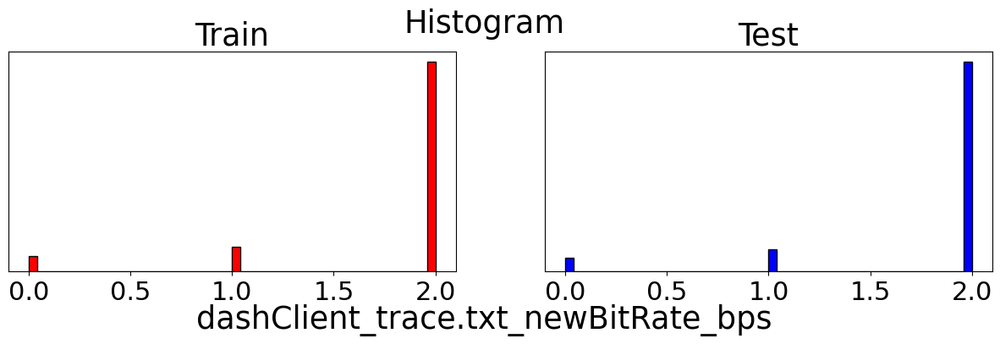

Time to process data for one learning task:  2.407325267791748
Instructions for updating:
Colocations handled automatically by placer.
Epoch: 10, Loss: 0.6421269130706787
Epoch: 20, Loss: 0.3907525157928467
Epoch: 30, Loss: 0.2926316785812378
Epoch: 40, Loss: 0.26086560368537903
Epoch: 50, Loss: 0.2615317797660828
Epoch: 60, Loss: 0.14552487313747406
Epoch: 70, Loss: 0.13626067250967025
Epoch: 80, Loss: 0.14318712592124938
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


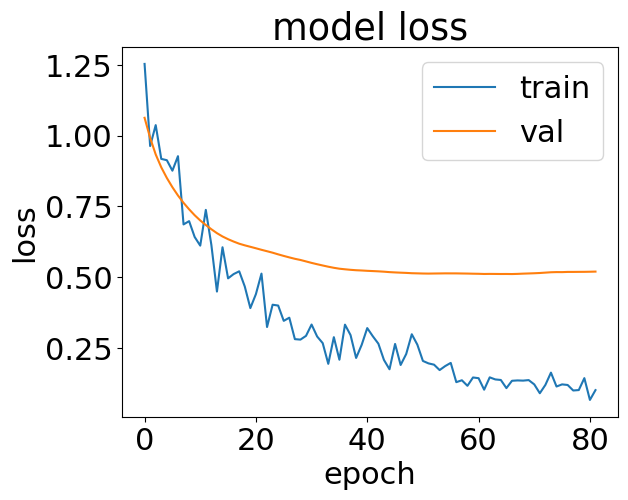

Time to train model:  18.715988874435425


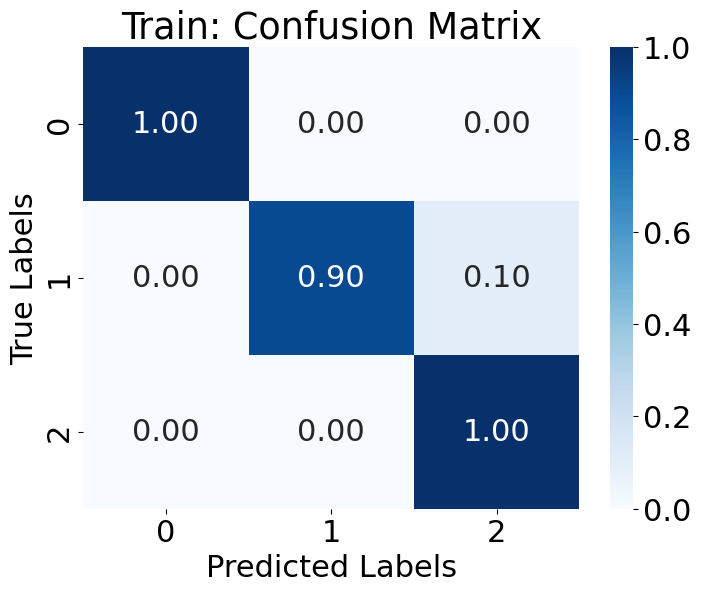

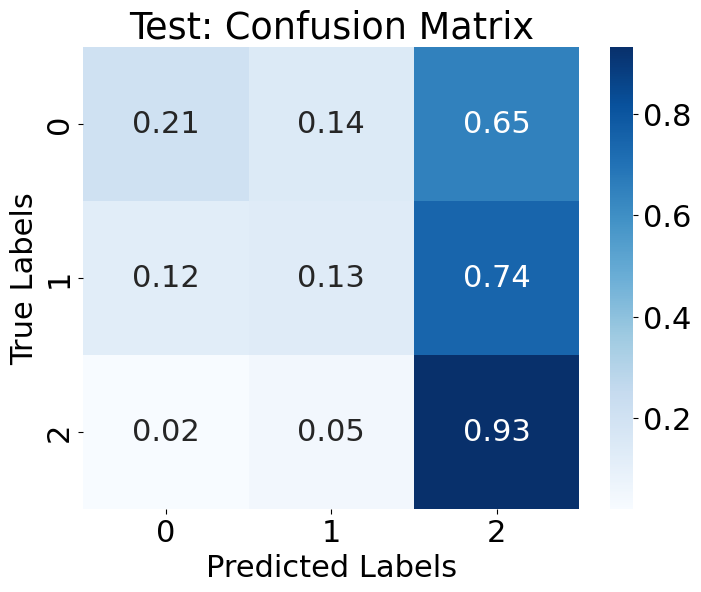



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23124, 470)
(9862, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [17189  1627  1404  1773   881]
After removing bins that are not populated enough
[0 1 2 3 4] [17189  1627  1404  1773   881]
(22874, 460)
(22874,)
(22874,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [5061 1152 1285 1528  717]
After removing bins that are not populated enough
[0 1 2 3 4] [5061 1152 1285 1528  717]
(9743, 460)
(9743,)
(9743,)
Train data shape (100, 460)
Test data shape (7307, 460)
Val data shape (2436, 460)


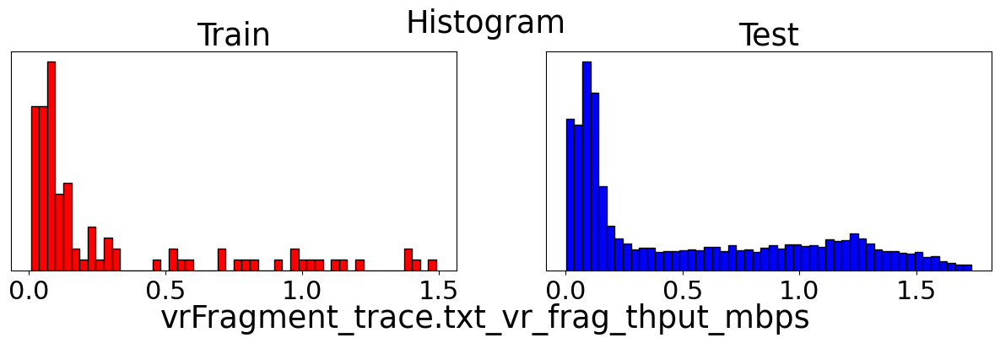

Time to process data for one learning task:  0.6515860557556152
Epoch: 10, Loss: 4.502492637634277
Epoch: 20, Loss: 2.1276652812957764
Epoch: 30, Loss: 2.424065179824829
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


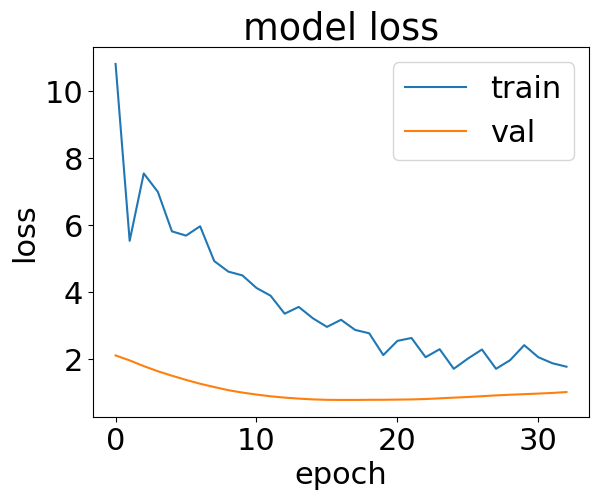

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  5.180553913116455


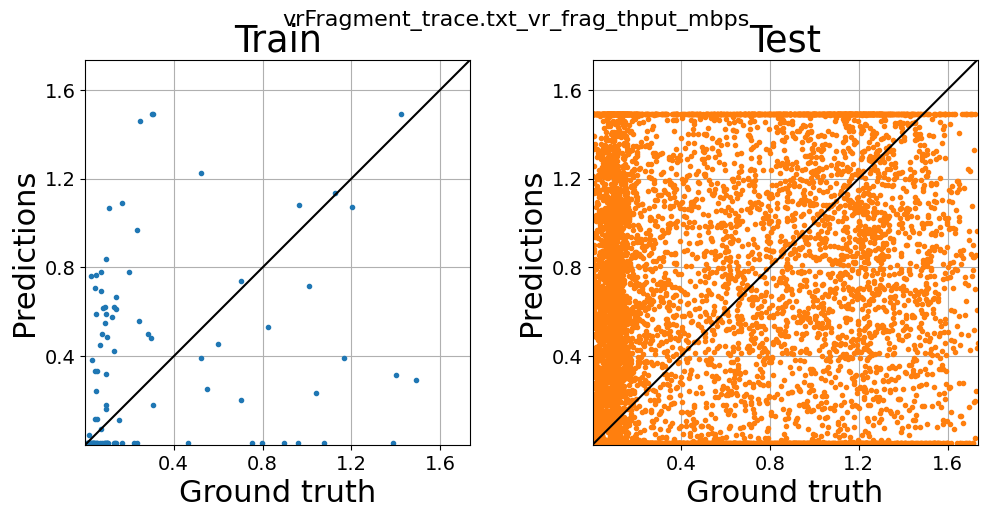



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23113, 470)
(9838, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [17402  1632  1469  1558   804]
After removing bins that are not populated enough
[0 1 2 3 4] [17402  1632  1469  1558   804]
(22865, 460)
(22865,)
(22865,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [5012 1047 1327 1569  765]
After removing bins that are not populated enough
[0 1 2 3 4] [5012 1047 1327 1569  765]
(9720, 460)
(9720,)
(9720,)
Train data shape (100, 460)
Test data shape (7290, 460)
Val data shape (2430, 460)


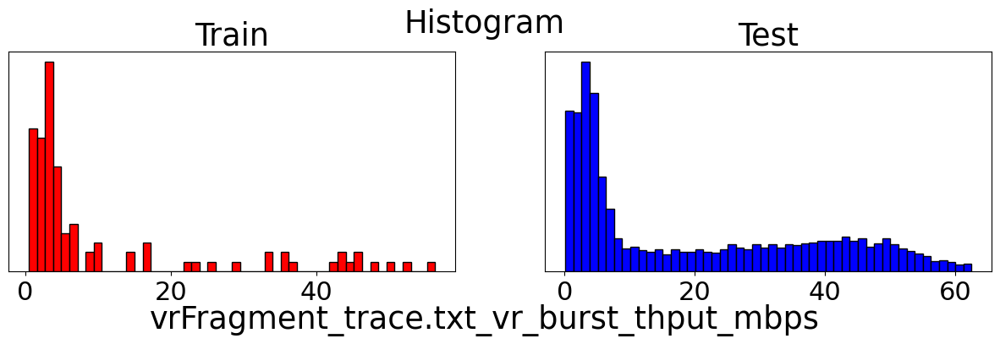

Time to process data for one learning task:  0.6048293113708496
Epoch: 10, Loss: 259.94773559570314
Epoch: 20, Loss: 229.2338720703125
Epoch: 30, Loss: 195.38968872070313
Epoch: 40, Loss: 164.02651489257812
Epoch: 50, Loss: 132.74786499023438
Epoch: 60, Loss: 106.86746887207032
Epoch: 70, Loss: 86.0478271484375
Epoch: 80, Loss: 76.1251927947998
Epoch: 90, Loss: 62.790217895507816
Epoch: 100, Loss: 41.825261993408205
Epoch: 110, Loss: 45.59464385986328
Epoch: 120, Loss: 30.331984558105468
Epoch: 130, Loss: 28.330336227416993
Epoch: 140, Loss: 23.964079666137696
Epoch: 150, Loss: 22.44522476196289
Epoch: 160, Loss: 18.794068374633788
Epoch: 170, Loss: 23.564614868164064
Epoch: 180, Loss: 11.912203674316407
Epoch: 190, Loss: 34.14522155761719
Epoch: 200, Loss: 12.590511703491211
Epoch: 210, Loss: 14.213712768554688
Epoch: 220, Loss: 18.001710929870605
Epoch: 230, Loss: 11.311821746826173
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


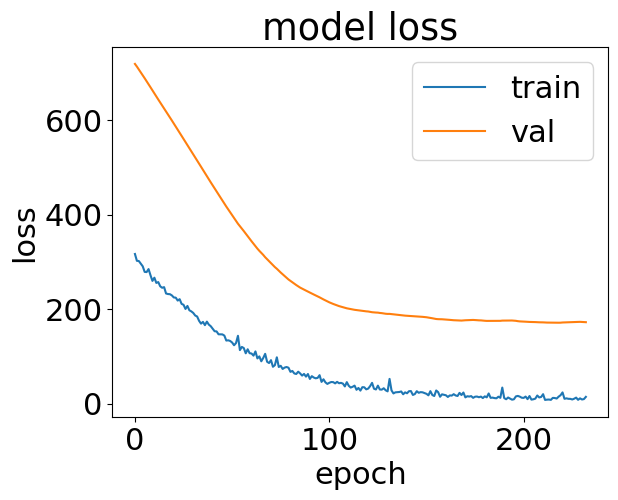

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  21.923978090286255


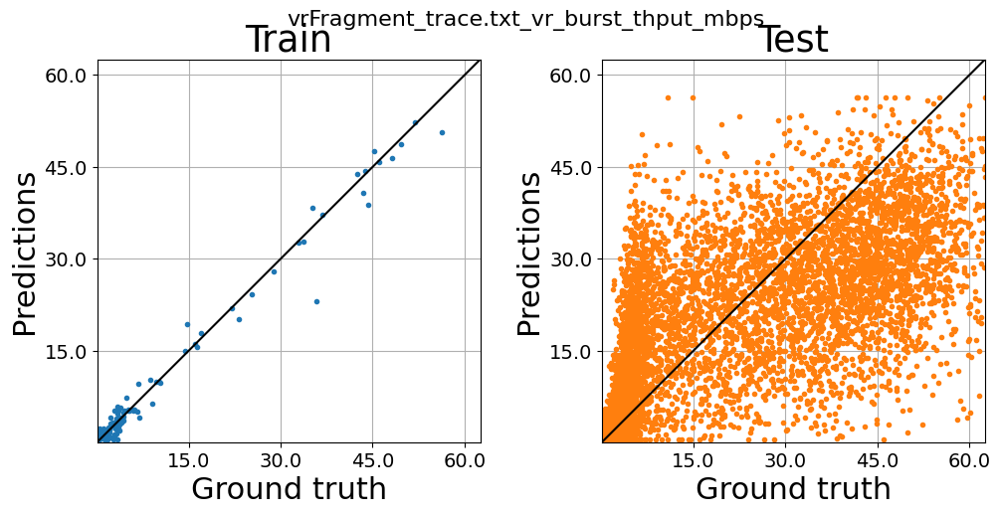



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23124, 470)
(9862, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [17589  3246  1263   533   243]
After removing bins that are not populated enough
[0 1 2 3 4] [17589  3246  1263   533   243]
(22874, 460)
(22874,)
(22874,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8719  627  223  111   63]
After removing bins that are not populated enough
[0 1 2 3 4] [8719  627  223  111   63]
(9680, 460)
(9680,)
(9680,)
Train data shape (100, 460)
Test data shape (7260, 460)
Val data shape (2420, 460)


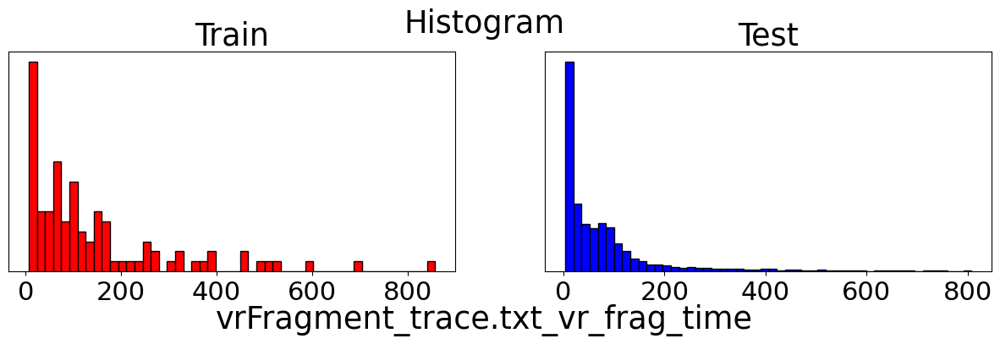

Time to process data for one learning task:  0.7057287693023682
Epoch: 10, Loss: 46947.235078125
Epoch: 20, Loss: 45842.035
Epoch: 30, Loss: 45003.4459375
Epoch: 40, Loss: 44022.9325
Epoch: 50, Loss: 42800.110625
Epoch: 60, Loss: 41440.006328125
Epoch: 70, Loss: 39919.86640625
Epoch: 80, Loss: 38117.3203125
Epoch: 90, Loss: 35827.94234375
Epoch: 100, Loss: 34125.32390625
Epoch: 110, Loss: 31622.504375
Epoch: 120, Loss: 30022.9344140625
Epoch: 130, Loss: 27441.058125
Epoch: 140, Loss: 24803.21796875
Epoch: 150, Loss: 22013.35828125
Epoch: 160, Loss: 20250.365859375
Epoch: 170, Loss: 18361.8344921875
Epoch: 180, Loss: 16270.58203125
Epoch: 190, Loss: 14924.2035546875
Epoch: 200, Loss: 12460.52546875
Epoch: 210, Loss: 11399.36140625
Epoch: 220, Loss: 10514.72341796875
Epoch: 230, Loss: 8487.242265625
Epoch: 240, Loss: 7659.18927734375
Epoch: 250, Loss: 7232.40046875
Epoch: 260, Loss: 6884.72611328125
Epoch: 270, Loss: 5275.531015625
Epoch: 280, Loss: 5280.5691015625
Epoch: 290, Loss: 4996

INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


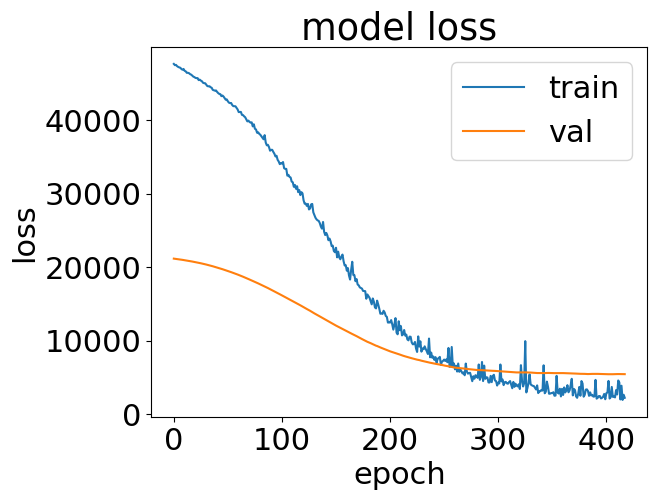

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  38.56229758262634


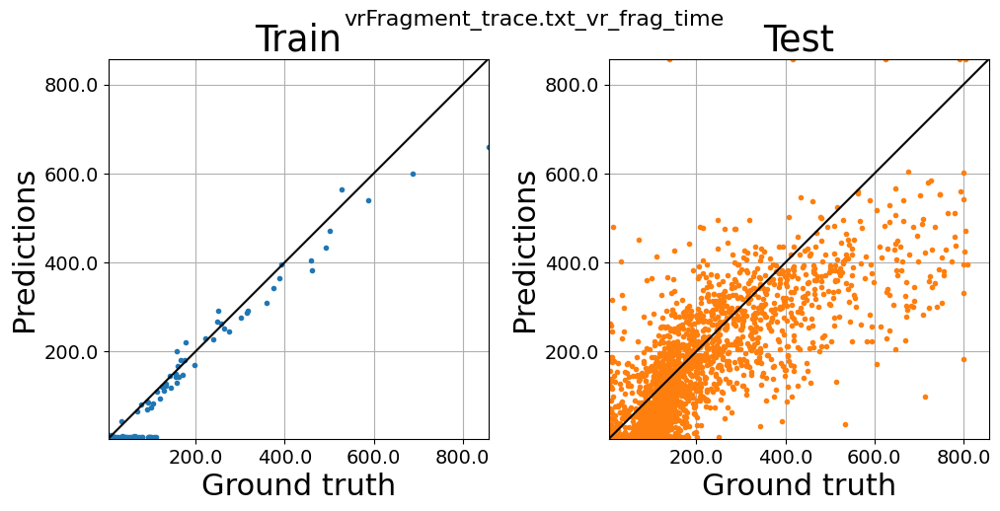



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23113, 470)
(9838, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [17523  3258  1274   558   252]
After removing bins that are not populated enough
[0 1 2 3 4] [17523  3258  1274   558   252]
(22865, 460)
(22865,)
(22865,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8694  623  237  105   61]
After removing bins that are not populated enough
[0 1 2 3 4] [8694  623  237  105   61]
(9659, 460)
(9659,)
(9659,)
Train data shape (100, 460)
Test data shape (7244, 460)
Val data shape (2415, 460)


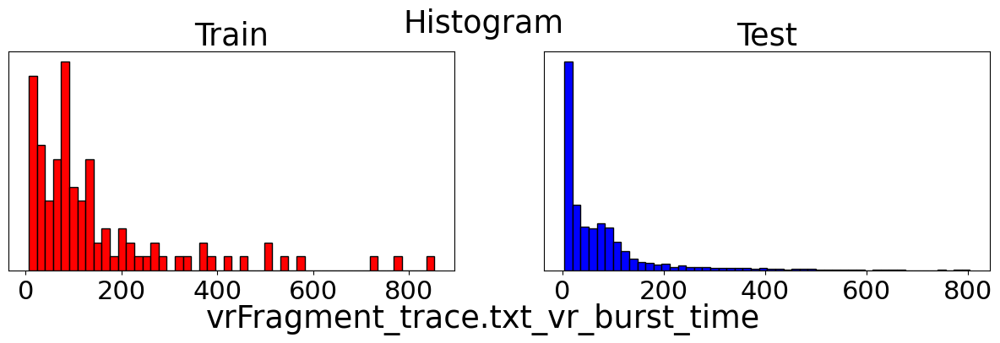

Time to process data for one learning task:  3.052117109298706
Epoch: 10, Loss: 50173.301875
Epoch: 20, Loss: 49405.1503125
Epoch: 30, Loss: 48331.7015625
Epoch: 40, Loss: 46946.5759375
Epoch: 50, Loss: 45484.80875
Epoch: 60, Loss: 43668.38265625
Epoch: 70, Loss: 41150.424375
Epoch: 80, Loss: 39328.248125
Epoch: 90, Loss: 37006.11671875
Epoch: 100, Loss: 34168.650625
Epoch: 110, Loss: 31894.0175
Epoch: 120, Loss: 29464.2141796875
Epoch: 130, Loss: 27615.4503125
Epoch: 140, Loss: 24119.8573828125
Epoch: 150, Loss: 22144.08828125
Epoch: 160, Loss: 19821.67296875
Epoch: 170, Loss: 17235.037578125
Epoch: 180, Loss: 16102.614765625
Epoch: 190, Loss: 13550.555390625
Epoch: 200, Loss: 12669.25734375
Epoch: 210, Loss: 10312.0224609375
Epoch: 220, Loss: 10228.0818359375
Epoch: 230, Loss: 13133.46904296875
Epoch: 240, Loss: 8091.18171875
Epoch: 250, Loss: 7563.63830078125
Epoch: 260, Loss: 7334.910078125
Epoch: 270, Loss: 5975.014921875
Epoch: 280, Loss: 5987.13064453125
Epoch: 290, Loss: 5466.1

INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


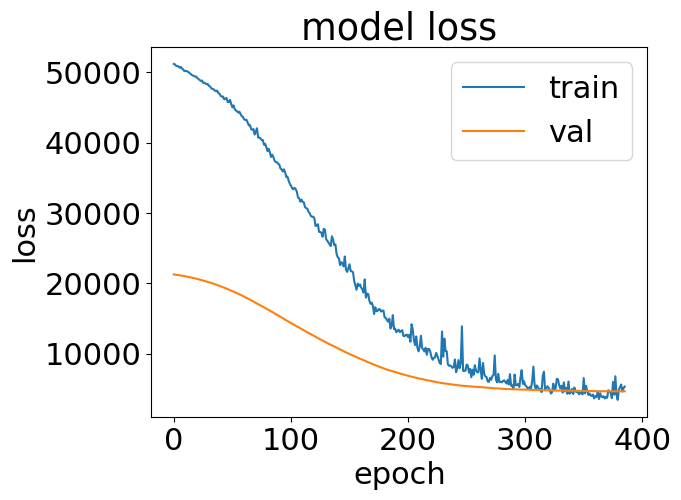

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  36.126243591308594


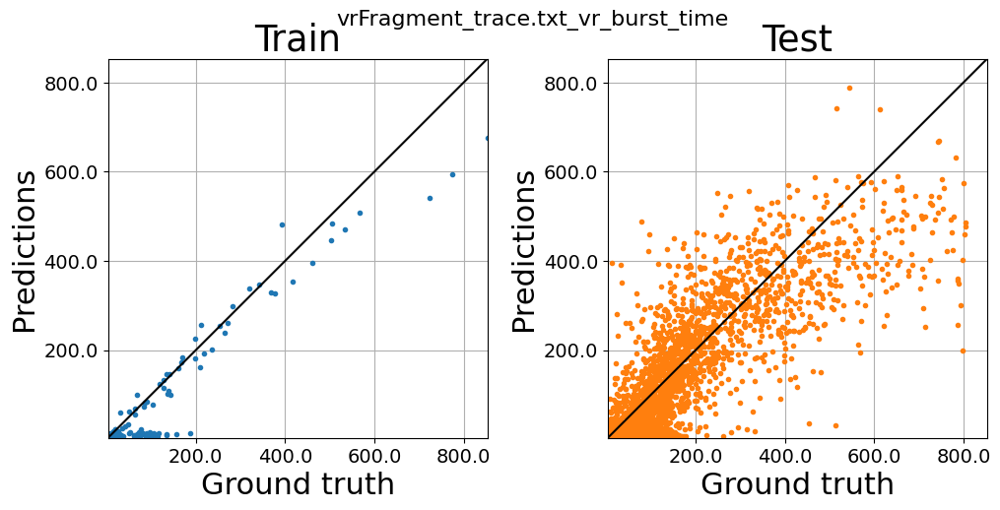



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1186349, 470)
(509361, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1164135    4807    2464    1727    1324]
After removing bins that are not populated enough
[0 1 2 3 4] [1164135    4807    2464    1727    1324]
(1164135, 460)
(1164135,)
(1164135,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [500082   1999   1009    670    496]
After removing bins that are not populated enough
[0 1 2 3 4] [500082   1999   1009    670    496]
(500082, 460)
(500082,)
(500082,)
Train data shape (100, 460)
Test data shape (375

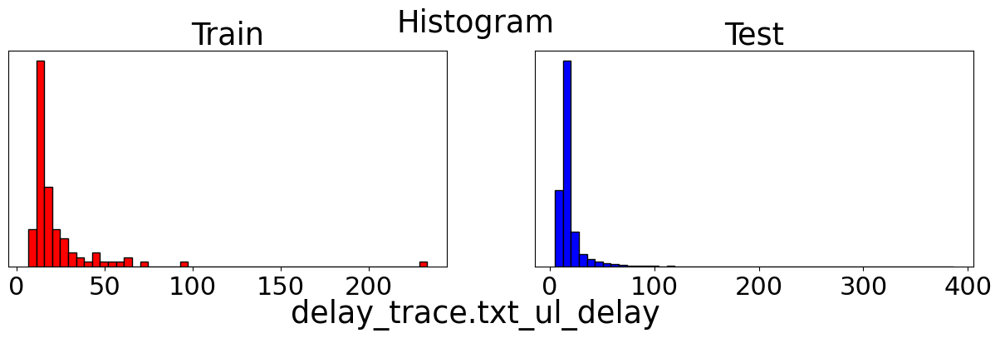

Time to process data for one learning task:  18.802948474884033
Epoch: 10, Loss: 1121.198828125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


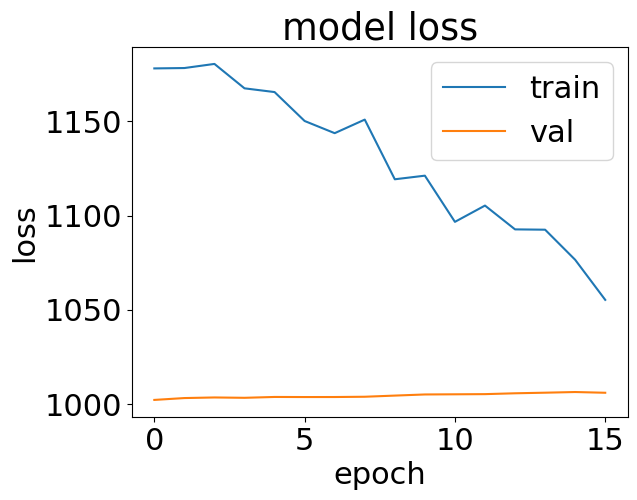

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  83.85512089729309


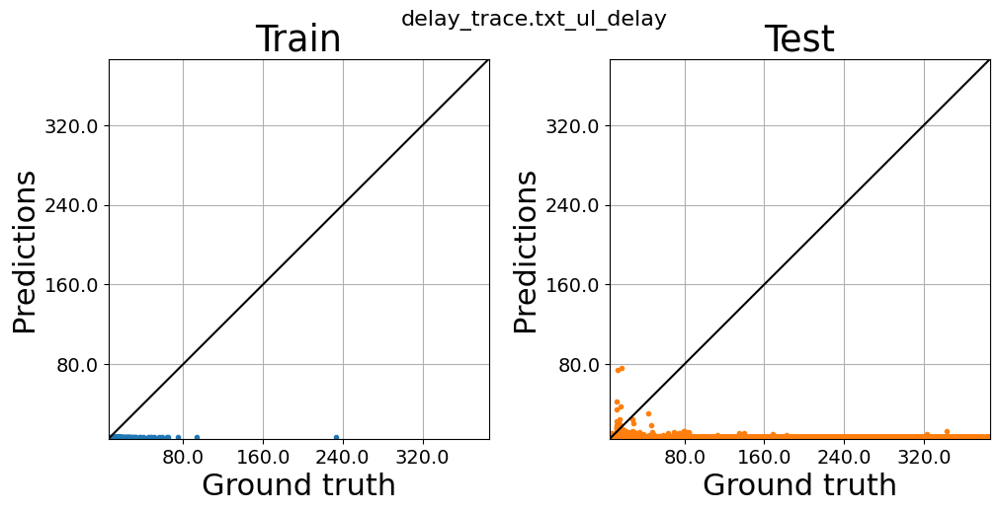



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257498, 470)
(539035, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1154847   51204   21078   10283    6017]
After removing bins that are not populated enough
[0 1 2 3 4] [1154847   51204   21078   10283    6017]
(1227129, 460)
(1227129,)
(1227129,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [495714  20751   8973   4835   2618]
After removing bins that are not populated enough
[0 1 2 3 4] [495714  20751   8973   4835   2618]
(525438, 460)
(525438,)
(525438,)
Train data shape (100, 460)
Test data shape (394

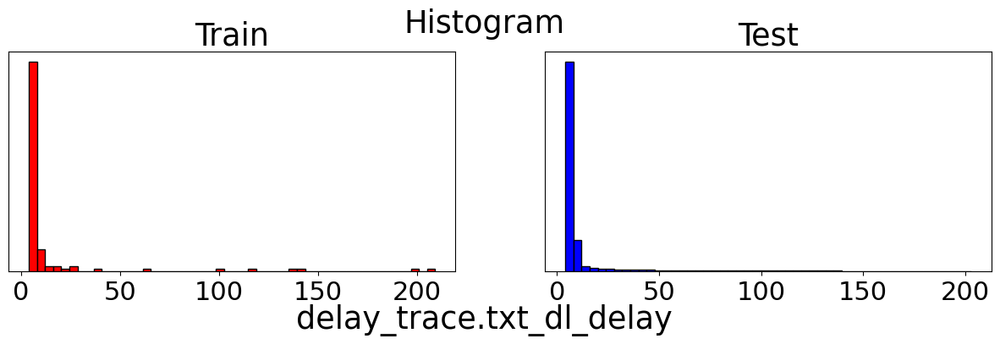

Time to process data for one learning task:  19.901411056518555
Epoch: 10, Loss: 1498.57326171875
Epoch: 20, Loss: 1394.991396484375
Epoch: 30, Loss: 1320.3701220703124
Epoch: 40, Loss: 1225.634991455078
Epoch: 50, Loss: 1159.5674560546875
Epoch: 60, Loss: 1072.1306176757812
Epoch: 70, Loss: 1003.5135986328125
Epoch: 80, Loss: 869.4825317382813
Epoch: 90, Loss: 749.7717321777344
Epoch: 100, Loss: 695.4210327148437
Epoch: 110, Loss: 547.3832958984375
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


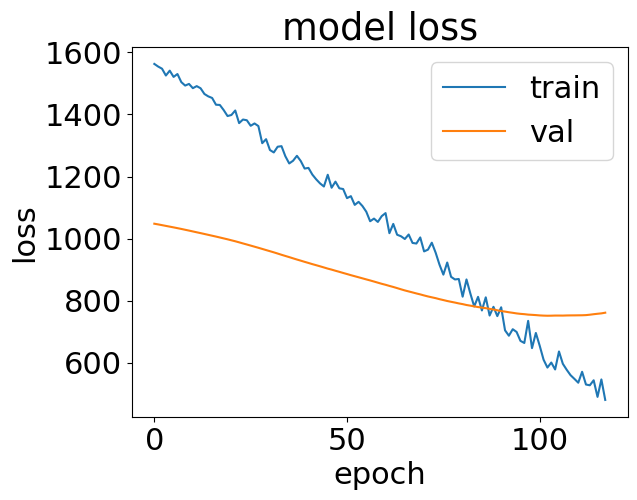

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  500.0798993110657


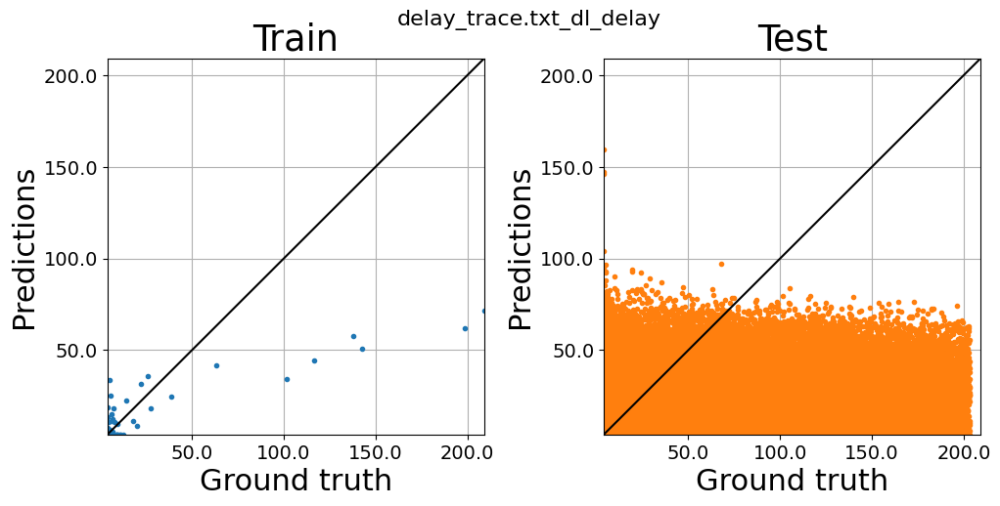



===============================  DONE  ===================================================
Random iteration:  1
# train runs used  7
# test runs used  3
Concatenating runs:  [18 11 14 12 13 16 20]
Time to read csv file for run:  12.9763925075531
Loaded run 18
Time to read csv file for run:  14.865136861801147
Loaded run 11
Time to read csv file for run:  14.899043321609497
Loaded run 14
Time to read csv file for run:  13.95777416229248
Loaded run 12
Time to read csv file for run:  12.841355323791504
Loaded run 13
Time to read csv file for run:  14.029874086380005
Loaded run 16
Time to read csv file for run:  14.681933403015137
Loaded run 20
Concatenating runs:  [17 15 19]
Time to read csv file for run:  13.684353828430176
Loaded run 17
Time to read csv file for run:  12.977138996124268
Loaded run 15
Time to read csv file for run:  12.682893514633179
Loaded run 19
Time to read data:  379.6773405075073
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping rows f

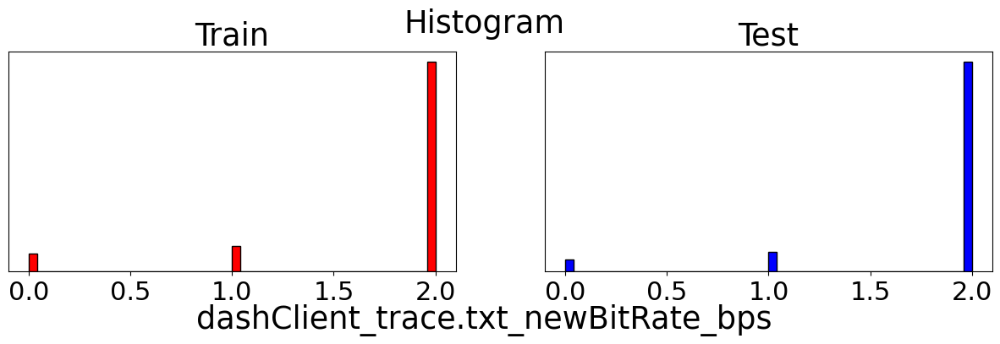

Time to process data for one learning task:  2.0895068645477295
Epoch: 10, Loss: 1.0320328545570374
Epoch: 20, Loss: 0.5404133379459382
Epoch: 30, Loss: 0.37497311472892764
Epoch: 40, Loss: 0.23669176876544953
Epoch: 50, Loss: 0.2094777476787567
Epoch: 60, Loss: 0.17177097797393798
Epoch: 70, Loss: 0.07930148094892502
Epoch: 80, Loss: 0.09201546549797059
Epoch: 90, Loss: 0.08275656431913375
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


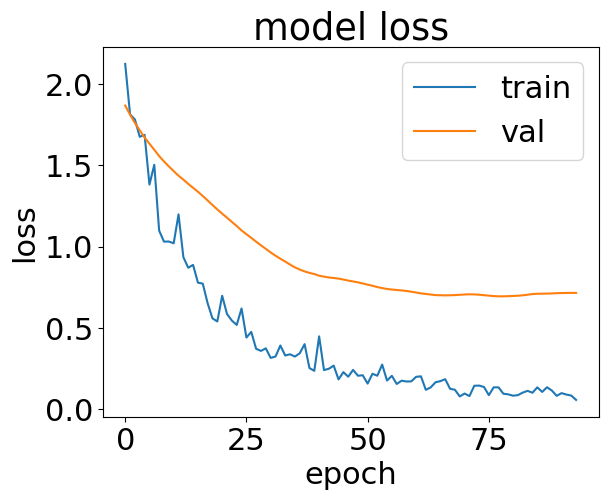

Time to train model:  22.055277824401855


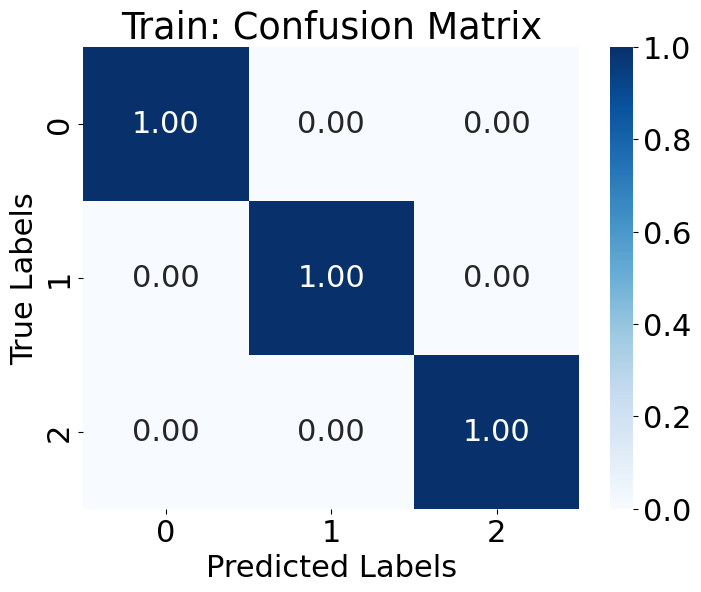

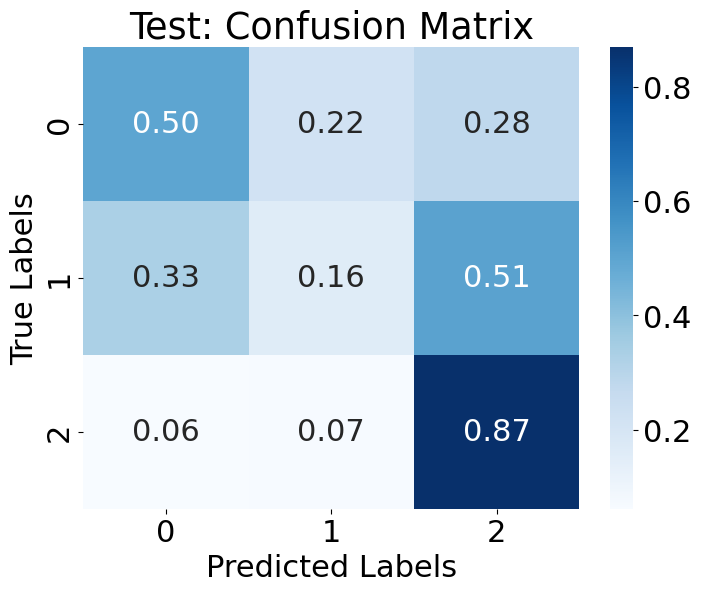



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23066, 470)
(9920, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15855  1885  1783  2254  1043]
After removing bins that are not populated enough
[0 1 2 3 4] [15855  1885  1783  2254  1043]
(22820, 460)
(22820,)
(22820,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6445  912  864 1051  526]
After removing bins that are not populated enough
[0 1 2 3 4] [6445  912  864 1051  526]
(9798, 460)
(9798,)
(9798,)
Train data shape (100, 460)
Test data shape (7348, 460)
Val data shape (2450, 460)


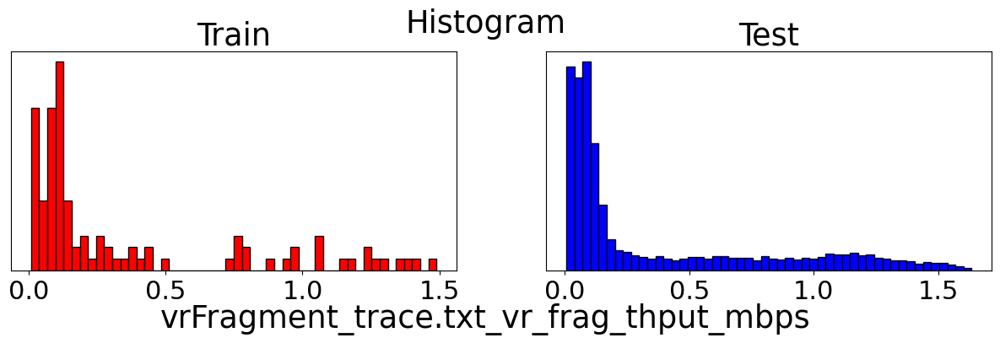

Time to process data for one learning task:  0.7364187240600586
Epoch: 10, Loss: 1.9744750308990477
Epoch: 20, Loss: 2.0623738098144533
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


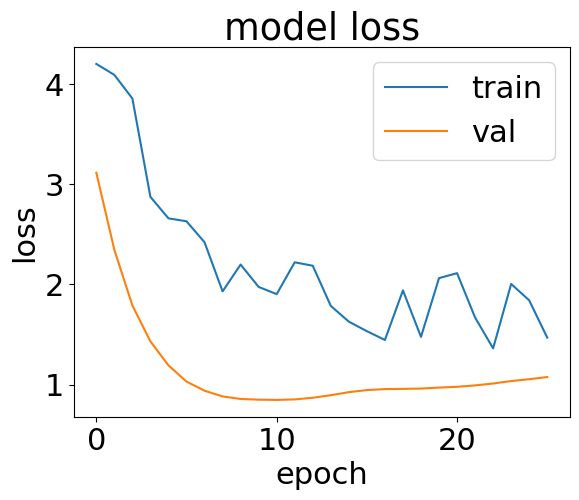

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  6.126154184341431


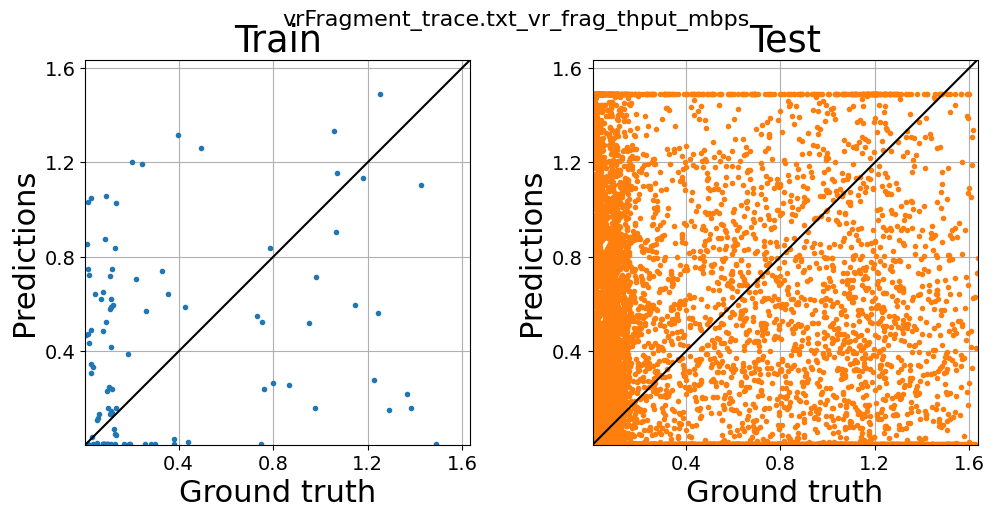



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23034, 470)
(9917, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15927  1854  1889  2068  1052]
After removing bins that are not populated enough
[0 1 2 3 4] [15927  1854  1889  2068  1052]
(22790, 460)
(22790,)
(22790,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6491  819  910  999  576]
After removing bins that are not populated enough
[0 1 2 3 4] [6491  819  910  999  576]
(9795, 460)
(9795,)
(9795,)
Train data shape (100, 460)
Test data shape (7346, 460)
Val data shape (2449, 460)


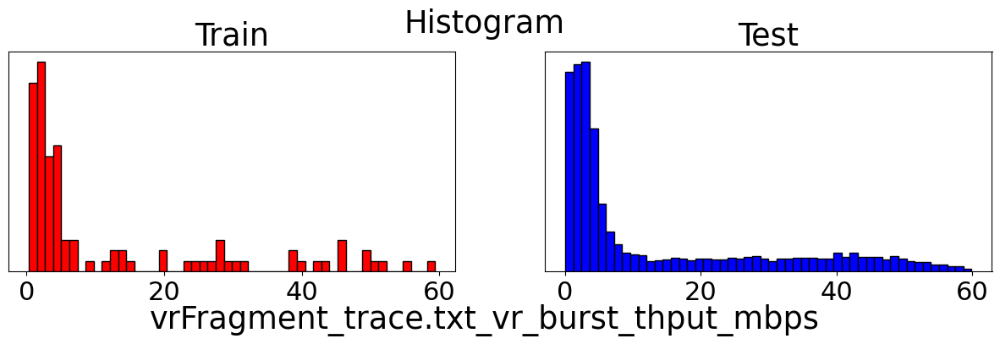

Time to process data for one learning task:  0.7058005332946777
Epoch: 10, Loss: 391.08753662109376
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


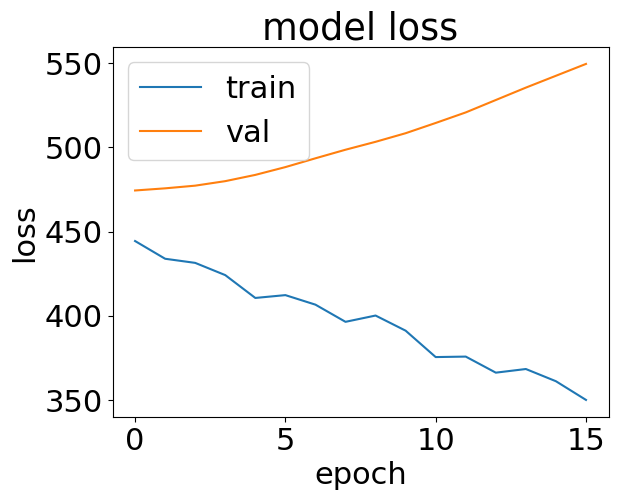

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  5.343831300735474


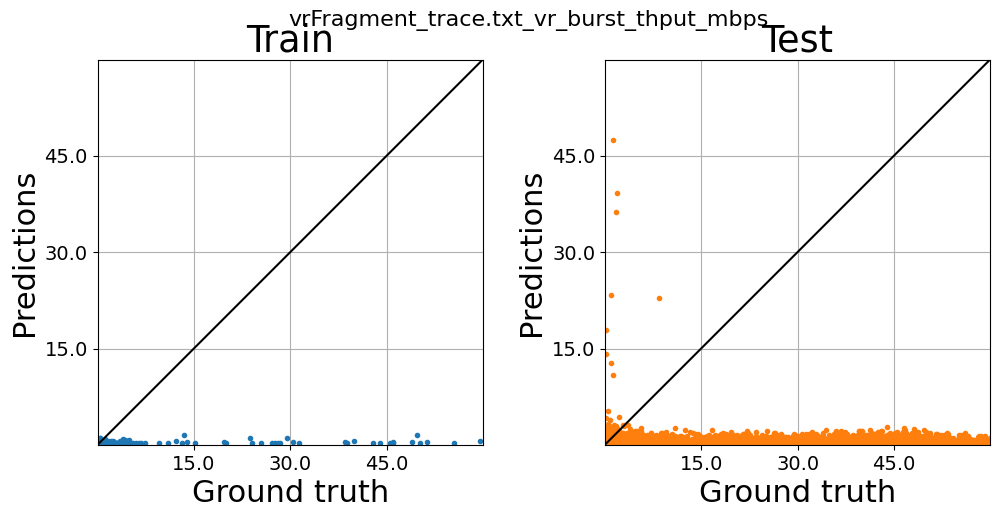



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23066, 470)
(9920, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18576  2699   917   412   216]
After removing bins that are not populated enough
[0 1 2 3 4] [18576  2699   917   412   216]
(22604, 460)
(22604,)
(22604,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7707 1180  566  250   95]
After removing bins that are not populated enough
[0 1 2 3 4] [7707 1180  566  250   95]
(9703, 460)
(9703,)
(9703,)
Train data shape (100, 460)
Test data shape (7277, 460)
Val data shape (2426, 460)


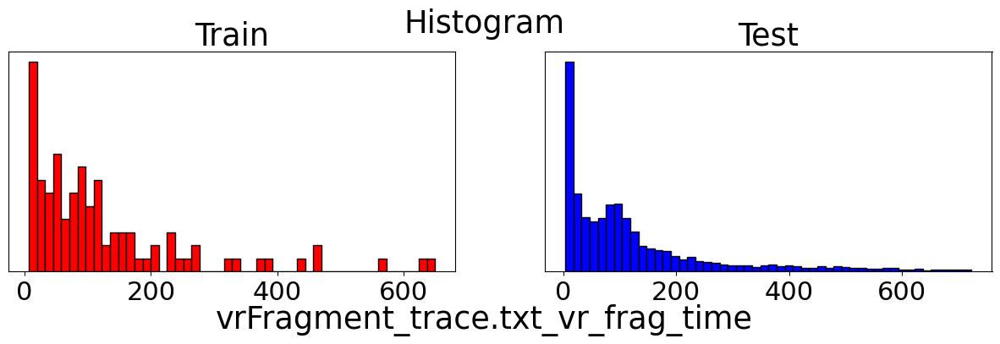

Time to process data for one learning task:  0.708350419998169
Epoch: 10, Loss: 33669.50640625
Epoch: 20, Loss: 32922.1396875
Epoch: 30, Loss: 31908.1565625
Epoch: 40, Loss: 30734.7190625
Epoch: 50, Loss: 29361.21328125
Epoch: 60, Loss: 28047.88265625
Epoch: 70, Loss: 26416.6484375
Epoch: 80, Loss: 24642.0975
Epoch: 90, Loss: 23051.54515625
Epoch: 100, Loss: 21312.648203125
Epoch: 110, Loss: 19493.07265625
Epoch: 120, Loss: 17679.46671875
Epoch: 130, Loss: 15987.6922265625
Epoch: 140, Loss: 14388.699140625
Epoch: 150, Loss: 12705.225625
Epoch: 160, Loss: 11776.21125
Epoch: 170, Loss: 10725.354296875
Epoch: 180, Loss: 8940.07296875
Epoch: 190, Loss: 8946.421328125
Epoch: 200, Loss: 7326.12158203125
Epoch: 210, Loss: 6575.54666015625
Epoch: 220, Loss: 6902.467861328125
Epoch: 230, Loss: 5818.74296875
Epoch: 240, Loss: 4468.039140625
Epoch: 250, Loss: 4322.87072265625
Epoch: 260, Loss: 3865.25771484375
Epoch: 270, Loss: 3311.93216796875
Epoch: 280, Loss: 3821.286435546875
Epoch: 290, Loss

INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


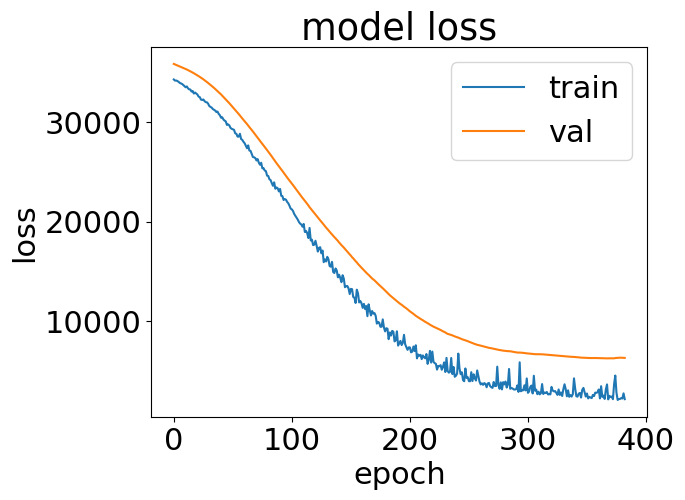

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  39.20993137359619


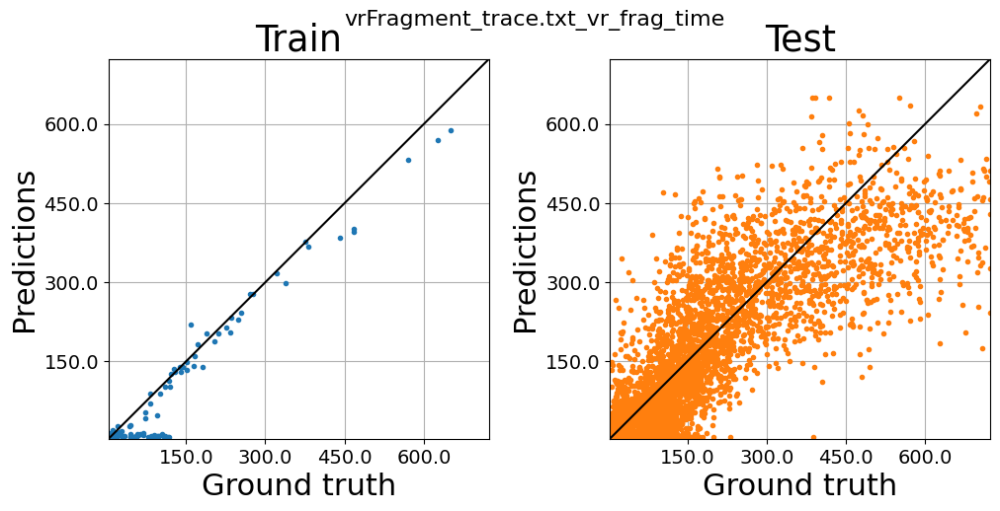



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23034, 470)
(9917, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18514  2705   932   417   222]
After removing bins that are not populated enough
[0 1 2 3 4] [18514  2705   932   417   222]
(22568, 460)
(22568,)
(22568,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7674 1189  574  264   94]
After removing bins that are not populated enough
[0 1 2 3 4] [7674 1189  574  264   94]
(9701, 460)
(9701,)
(9701,)
Train data shape (100, 460)
Test data shape (7275, 460)
Val data shape (2426, 460)


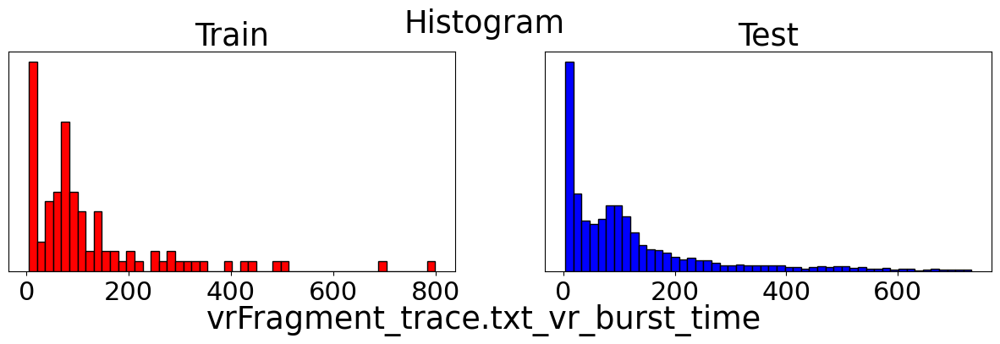

Time to process data for one learning task:  0.6670305728912354
Epoch: 10, Loss: 35599.15
Epoch: 20, Loss: 34859.727578125
Epoch: 30, Loss: 34139.38015625
Epoch: 40, Loss: 33193.05671875
Epoch: 50, Loss: 32092.160234375
Epoch: 60, Loss: 30691.19203125
Epoch: 70, Loss: 29318.9390625
Epoch: 80, Loss: 27335.75109375
Epoch: 90, Loss: 25910.63125
Epoch: 100, Loss: 23122.72578125
Epoch: 110, Loss: 22061.2910546875
Epoch: 120, Loss: 19504.8928125
Epoch: 130, Loss: 17497.4025390625
Epoch: 140, Loss: 17194.479873046876
Epoch: 150, Loss: 14387.7430859375
Epoch: 160, Loss: 12288.808828125
Epoch: 170, Loss: 10884.283125
Epoch: 180, Loss: 11246.166708984376
Epoch: 190, Loss: 8646.0697265625
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


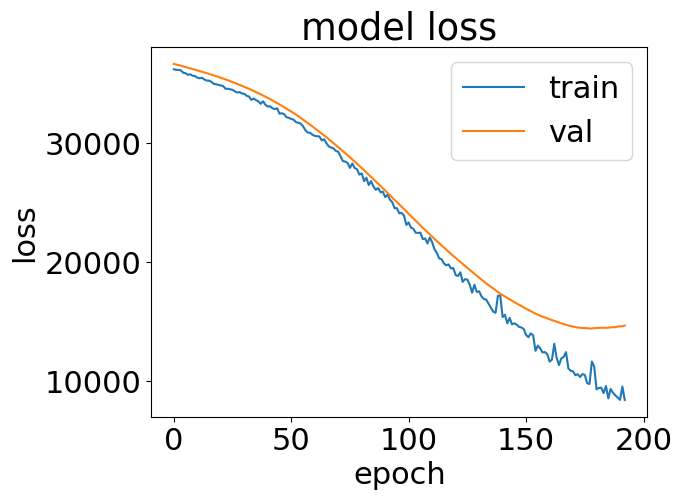

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  21.51408052444458


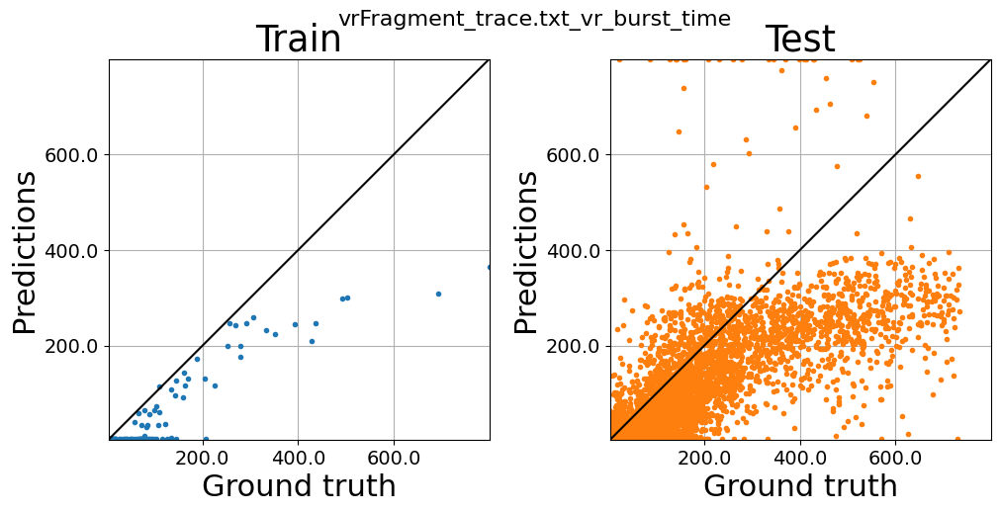



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1185925, 470)
(509785, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1163736    4833    2478    1695    1296]
After removing bins that are not populated enough
[0 1 2 3 4] [1163736    4833    2478    1695    1296]
(1163736, 460)
(1163736,)
(1163736,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [500528   1974    958    685    531]
After removing bins that are not populated enough
[0 1 2 3 4] [500528   1974    958    685    531]
(500528, 460)
(500528,)
(500528,)
Train data shape (100, 460)
Test data shape (375

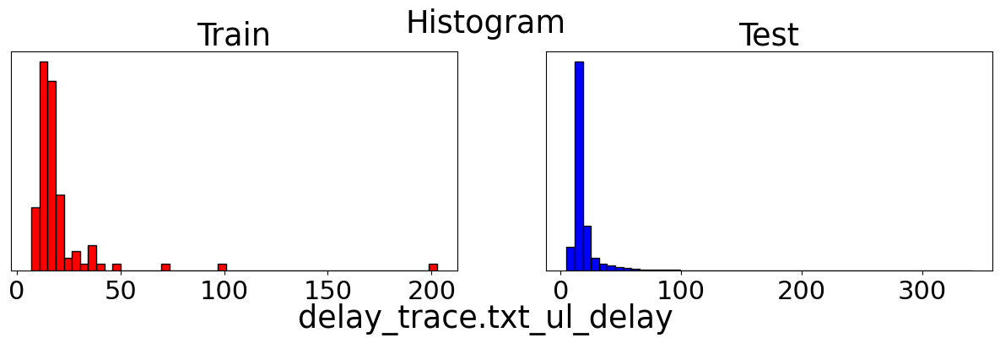

Time to process data for one learning task:  18.8015193939209
Epoch: 10, Loss: 828.8513171386719
Epoch: 20, Loss: 763.4560766601562
Epoch: 30, Loss: 734.6919787597657
Epoch: 40, Loss: 682.1670678710938
Epoch: 50, Loss: 615.1586303710938
Epoch: 60, Loss: 561.4108532714844
Epoch: 70, Loss: 491.71900939941406
Epoch: 80, Loss: 448.3517724609375
Epoch: 90, Loss: 409.3160681152344
Epoch: 100, Loss: 335.8496337890625
Epoch: 110, Loss: 324.4707177734375
Epoch: 120, Loss: 268.6470642089844
Epoch: 130, Loss: 172.51685775756835
Epoch: 140, Loss: 169.6869030761719
Epoch: 150, Loss: 159.85210876464845
Epoch: 160, Loss: 104.54272125244141
Epoch: 170, Loss: 101.73275939941406
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


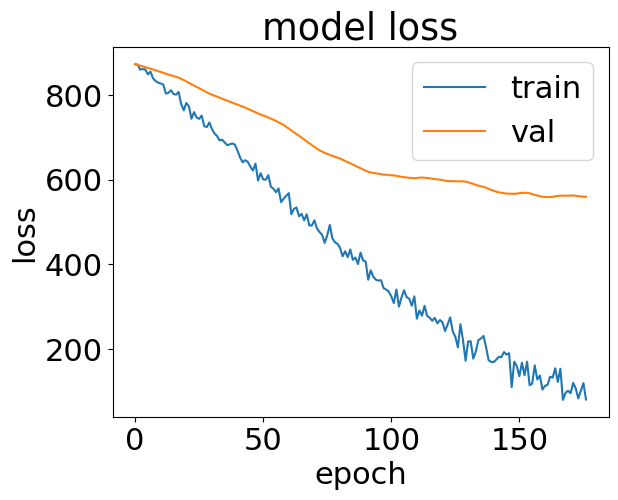

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  718.3859815597534


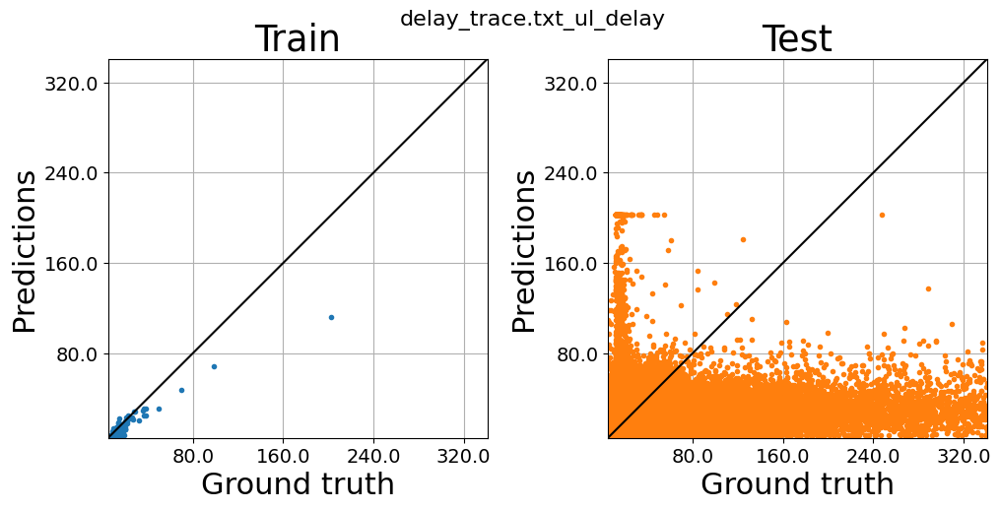



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257684, 470)
(538849, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1152587   51779   21782   10839    6358]
After removing bins that are not populated enough
[0 1 2 3 4] [1152587   51779   21782   10839    6358]
(1226148, 460)
(1226148,)
(1226148,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [497439  20782   8190   4233   2327]
After removing bins that are not populated enough
[0 1 2 3 4] [497439  20782   8190   4233   2327]
(526411, 460)
(526411,)
(526411,)
Train data shape (100, 460)
Test data shape (394

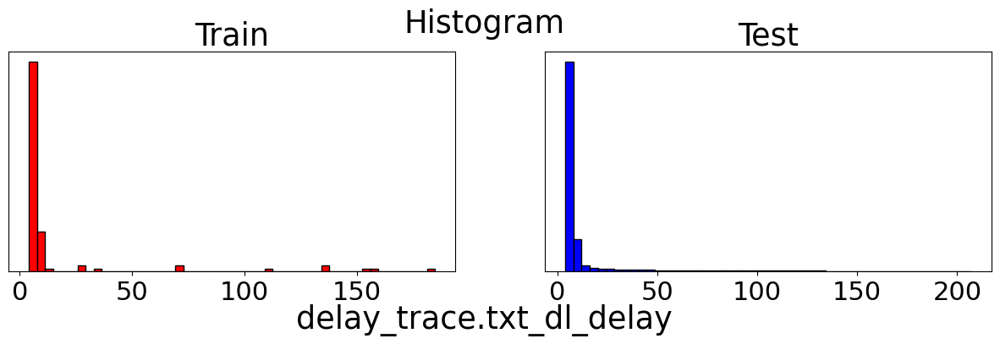

Time to process data for one learning task:  19.964465379714966
Epoch: 10, Loss: 1405.5330493164063
Epoch: 20, Loss: 1329.891015625
Epoch: 30, Loss: 1190.1541357421875
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


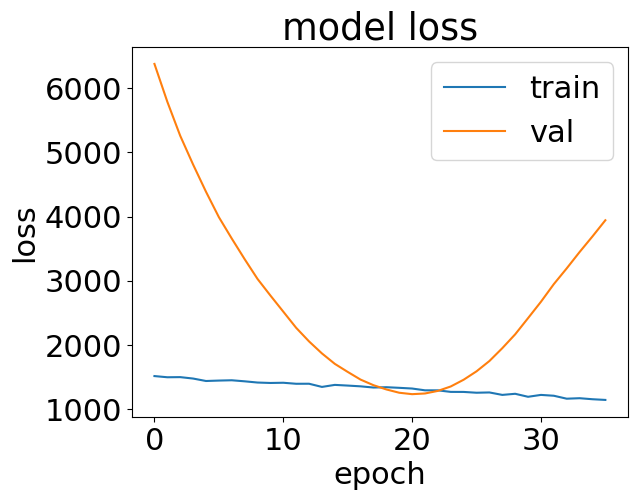

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  173.05984687805176


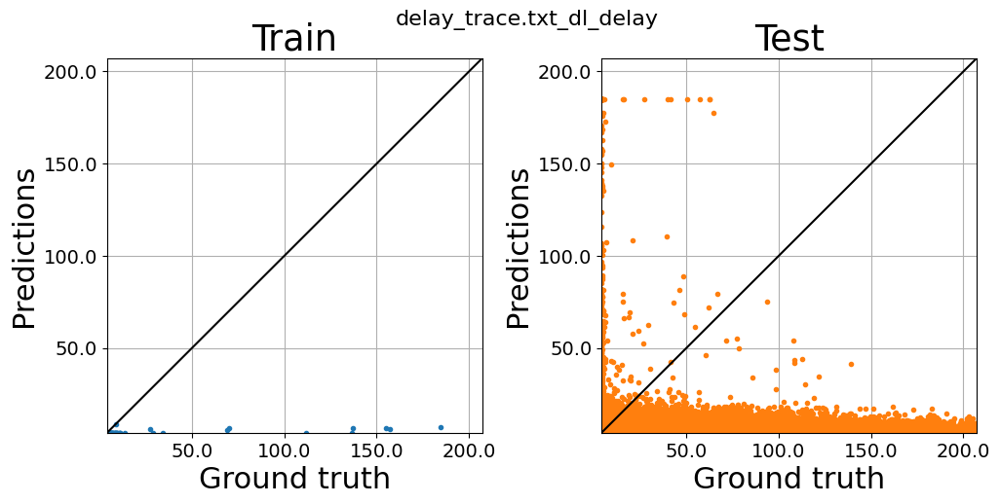



===============================  DONE  ===================================================
Random iteration:  2
# train runs used  7
# test runs used  3
Concatenating runs:  [16 18 20 12 11 13 14]
Time to read csv file for run:  14.249717235565186
Loaded run 16
Time to read csv file for run:  14.494872570037842
Loaded run 18
Time to read csv file for run:  13.59067964553833
Loaded run 20
Time to read csv file for run:  13.420837640762329
Loaded run 12
Time to read csv file for run:  13.246394872665405
Loaded run 11
Time to read csv file for run:  14.363794088363647
Loaded run 13
Time to read csv file for run:  14.07839059829712
Loaded run 14
Concatenating runs:  [19 17 15]
Time to read csv file for run:  14.948243618011475
Loaded run 19
Time to read csv file for run:  14.062321424484253
Loaded run 17
Time to read csv file for run:  13.948263168334961
Loaded run 15
Time to read data:  383.68359112739563
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping rows

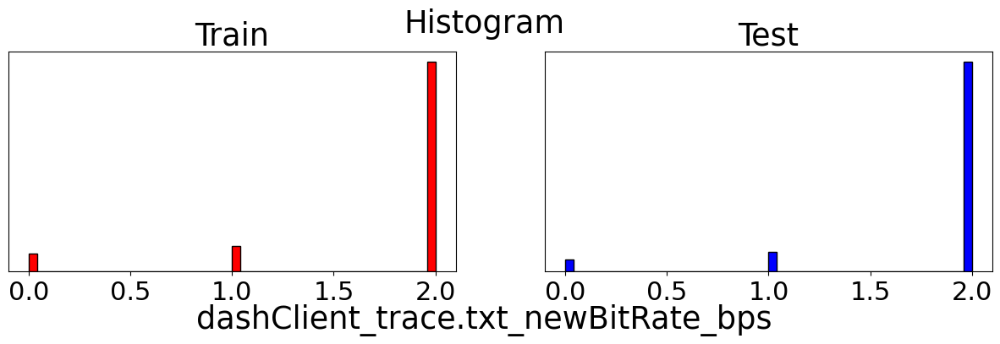

Time to process data for one learning task:  2.0302574634552
Epoch: 10, Loss: 0.9494633626937866
Epoch: 20, Loss: 0.6205969095230103
Epoch: 30, Loss: 0.3287704026699066
Epoch: 40, Loss: 0.3149288284778595
Epoch: 50, Loss: 0.2806887221336365
Epoch: 60, Loss: 0.18457943260669707
Epoch: 70, Loss: 0.11722378611564636
Epoch: 80, Loss: 0.13112746596336364
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


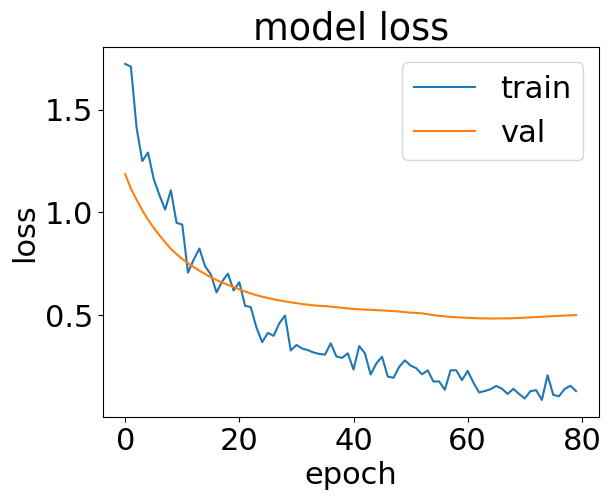

Time to train model:  21.99787926673889


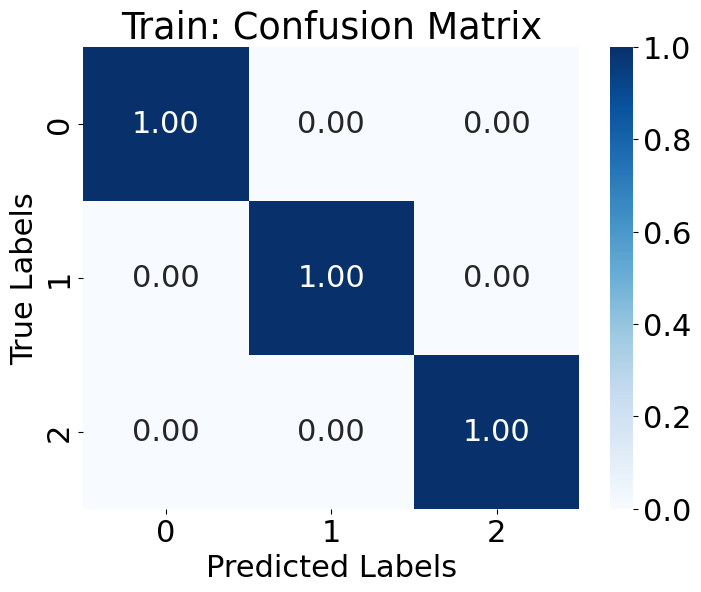

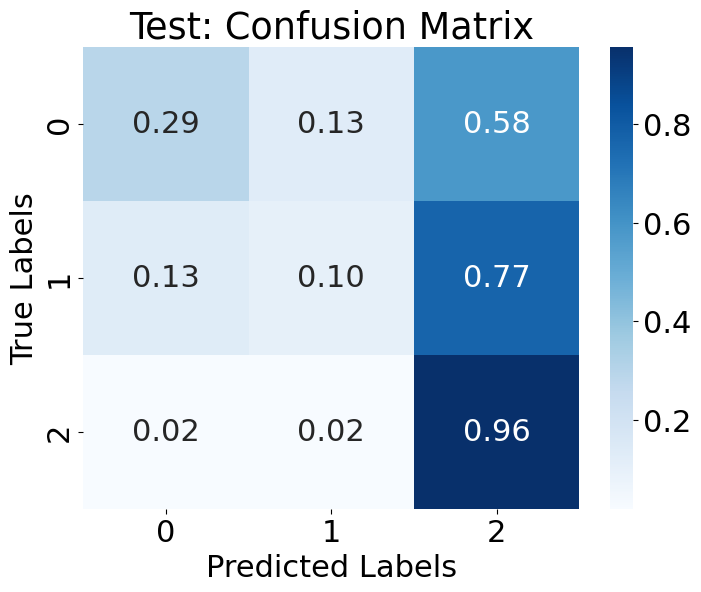



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23066, 470)
(9920, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15855  1885  1783  2254  1043]
After removing bins that are not populated enough
[0 1 2 3 4] [15855  1885  1783  2254  1043]
(22820, 460)
(22820,)
(22820,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6445  912  864 1051  526]
After removing bins that are not populated enough
[0 1 2 3 4] [6445  912  864 1051  526]
(9798, 460)
(9798,)
(9798,)
Train data shape (100, 460)
Test data shape (7348, 460)
Val data shape (2450, 460)


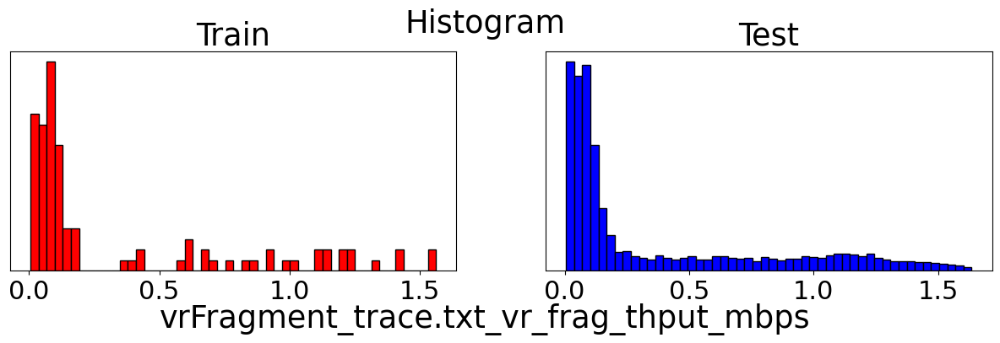

Time to process data for one learning task:  0.6737964153289795
Epoch: 10, Loss: 1.955122423171997
Epoch: 20, Loss: 1.1808211755752565
Epoch: 30, Loss: 1.2462454271316528
Epoch: 40, Loss: 1.5372150659561157
Epoch: 50, Loss: 0.7753518748283387
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


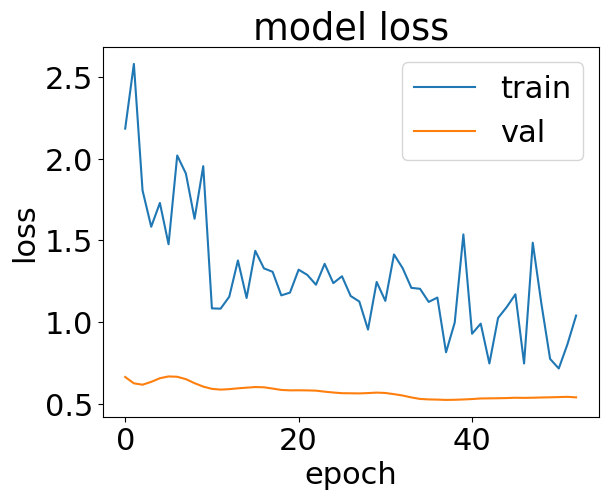

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  10.499515056610107


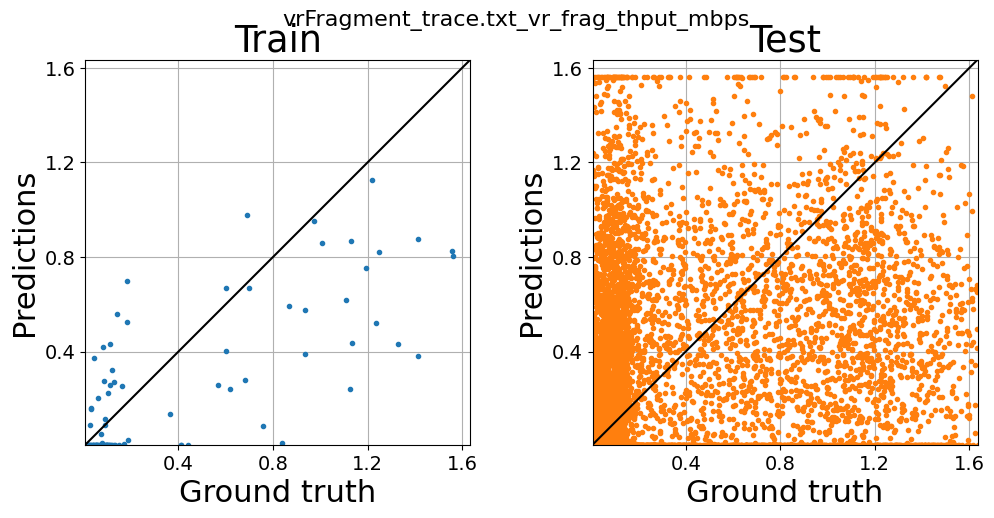



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23034, 470)
(9917, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15927  1854  1889  2068  1052]
After removing bins that are not populated enough
[0 1 2 3 4] [15927  1854  1889  2068  1052]
(22790, 460)
(22790,)
(22790,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6491  819  910  999  576]
After removing bins that are not populated enough
[0 1 2 3 4] [6491  819  910  999  576]
(9795, 460)
(9795,)
(9795,)
Train data shape (100, 460)
Test data shape (7346, 460)
Val data shape (2449, 460)


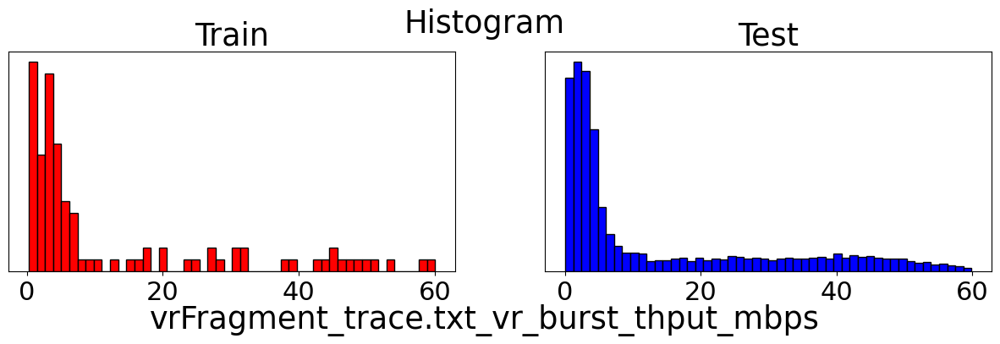

Time to process data for one learning task:  0.7338252067565918
Epoch: 10, Loss: 372.44012329101565
Epoch: 20, Loss: 316.8476904296875
Epoch: 30, Loss: 270.6775048828125
Epoch: 40, Loss: 232.124072265625
Epoch: 50, Loss: 192.86805908203124
Epoch: 60, Loss: 164.828681640625
Epoch: 70, Loss: 137.24769165039064
Epoch: 80, Loss: 113.67419036865235
Epoch: 90, Loss: 90.30759185791015
Epoch: 100, Loss: 78.85773040771484
Epoch: 110, Loss: 73.3357032775879
Epoch: 120, Loss: 72.78040740966797
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


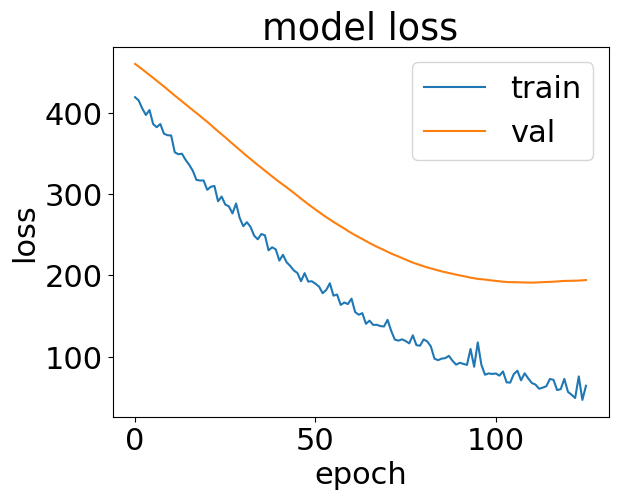

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  17.56934380531311


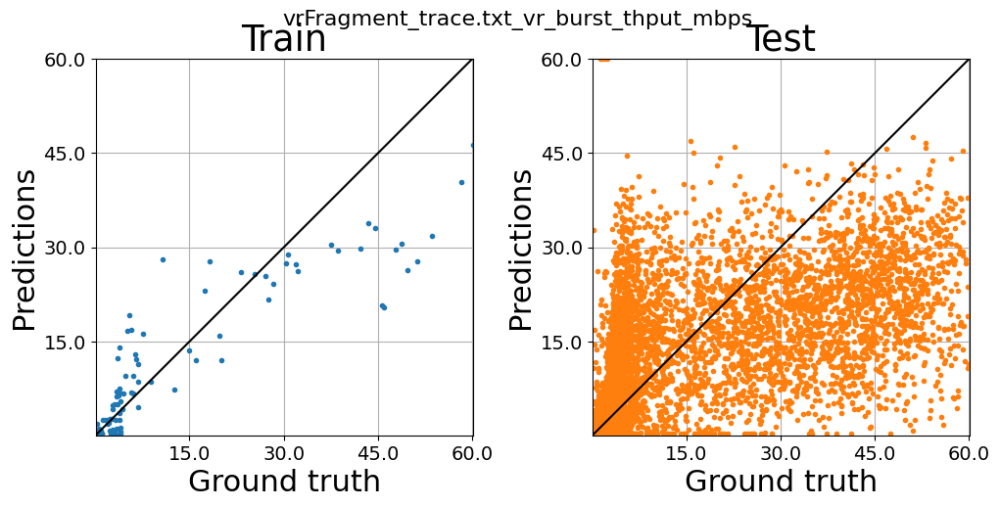



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23066, 470)
(9920, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18576  2699   917   412   216]
After removing bins that are not populated enough
[0 1 2 3 4] [18576  2699   917   412   216]
(22604, 460)
(22604,)
(22604,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7707 1180  566  250   95]
After removing bins that are not populated enough
[0 1 2 3 4] [7707 1180  566  250   95]
(9703, 460)
(9703,)
(9703,)
Train data shape (100, 460)
Test data shape (7277, 460)
Val data shape (2426, 460)


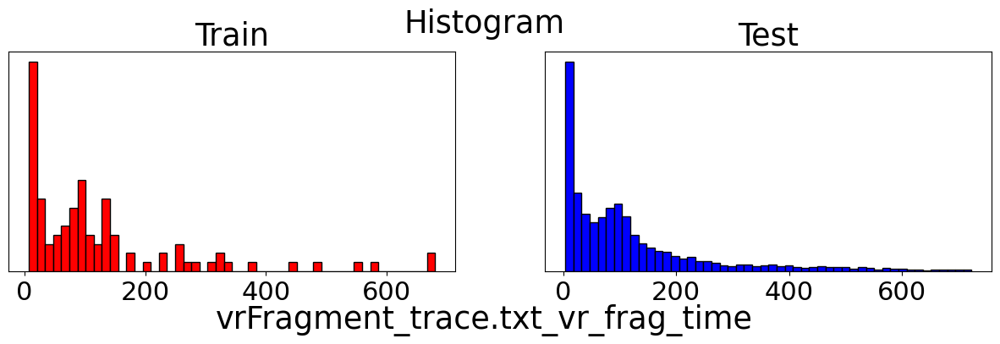

Time to process data for one learning task:  0.648383378982544
Epoch: 10, Loss: 34686.265625
Epoch: 20, Loss: 33880.99375
Epoch: 30, Loss: 32782.21265625
Epoch: 40, Loss: 31274.145234375
Epoch: 50, Loss: 29645.9109375
Epoch: 60, Loss: 28145.778125
Epoch: 70, Loss: 26055.050625
Epoch: 80, Loss: 24388.5084375
Epoch: 90, Loss: 21752.826328125
Epoch: 100, Loss: 20281.000234375
Epoch: 110, Loss: 18278.836171875
Epoch: 120, Loss: 16423.87671875
Epoch: 130, Loss: 15473.88490234375
Epoch: 140, Loss: 13040.3553125
Epoch: 150, Loss: 11426.11724609375
Epoch: 160, Loss: 10084.68015625
Epoch: 170, Loss: 9110.6076953125
Epoch: 180, Loss: 8446.93984375
Epoch: 190, Loss: 8351.358203125
Epoch: 200, Loss: 6542.4336328125
Epoch: 210, Loss: 5853.59044921875
Epoch: 220, Loss: 5111.93095703125
Epoch: 230, Loss: 5431.626484375
Epoch: 240, Loss: 3971.009375
Epoch: 250, Loss: 5074.52908203125
Epoch: 260, Loss: 3988.1667578125
Epoch: 270, Loss: 4225.05525390625
Epoch: 280, Loss: 3694.0446484375
Epoch: 290, Loss

INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


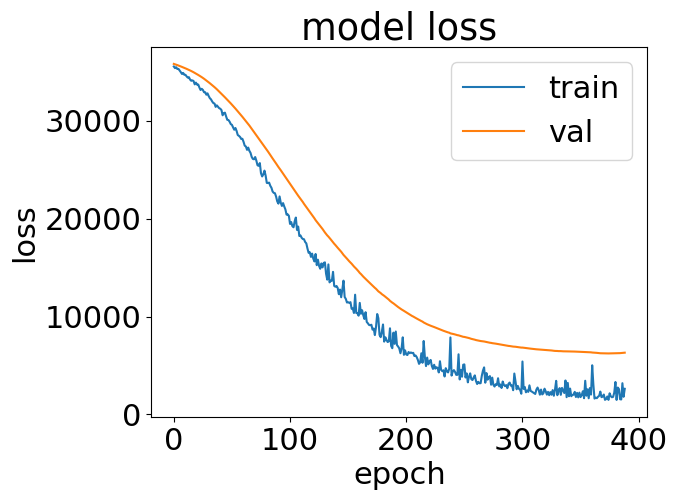

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  41.93094825744629


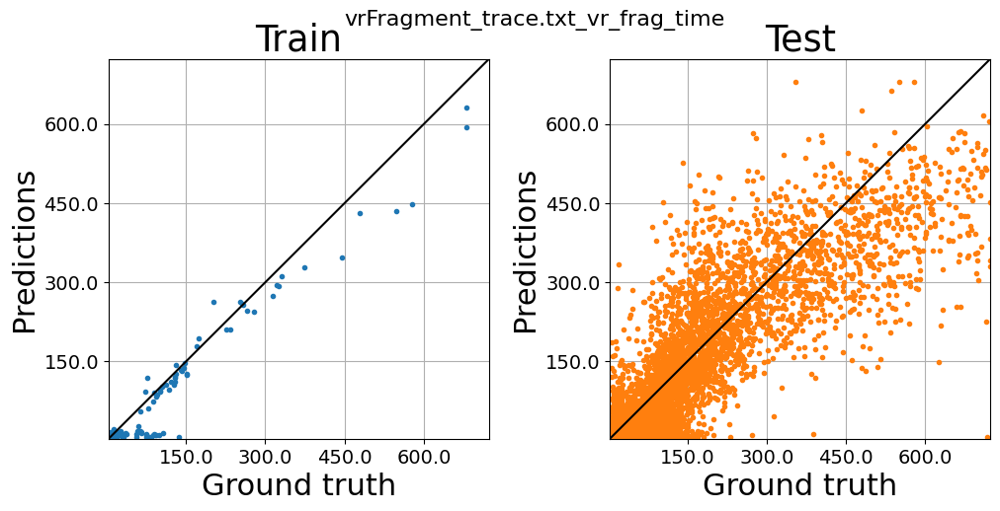



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23034, 470)
(9917, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18514  2705   932   417   222]
After removing bins that are not populated enough
[0 1 2 3 4] [18514  2705   932   417   222]
(22568, 460)
(22568,)
(22568,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7674 1189  574  264   94]
After removing bins that are not populated enough
[0 1 2 3 4] [7674 1189  574  264   94]
(9701, 460)
(9701,)
(9701,)
Train data shape (100, 460)
Test data shape (7275, 460)
Val data shape (2426, 460)


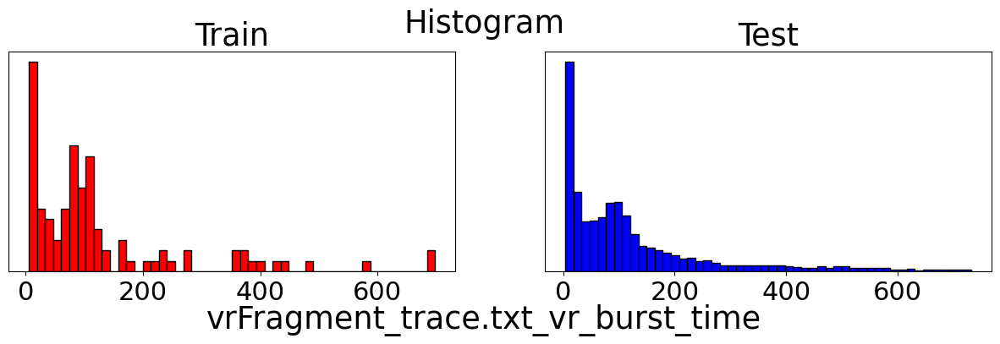

Time to process data for one learning task:  0.6559505462646484
Epoch: 10, Loss: 36585.5625
Epoch: 20, Loss: 35909.286875
Epoch: 30, Loss: 35153.45796875
Epoch: 40, Loss: 34027.05
Epoch: 50, Loss: 32878.86625
Epoch: 60, Loss: 31694.28484375
Epoch: 70, Loss: 30026.2759375
Epoch: 80, Loss: 28434.66015625
Epoch: 90, Loss: 26721.7709375
Epoch: 100, Loss: 25079.31203125
Epoch: 110, Loss: 23090.4524609375
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


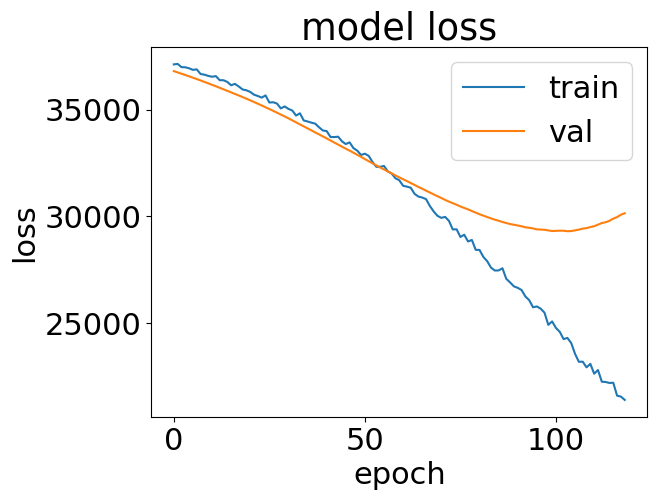

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  17.109826803207397


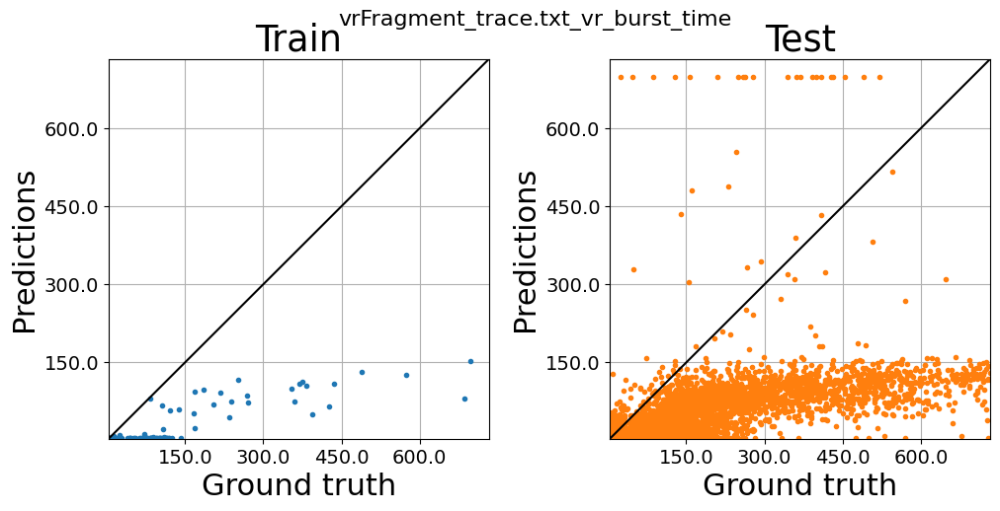



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1185925, 470)
(509785, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1163736    4833    2478    1695    1296]
After removing bins that are not populated enough
[0 1 2 3 4] [1163736    4833    2478    1695    1296]
(1163736, 460)
(1163736,)
(1163736,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [500528   1974    958    685    531]
After removing bins that are not populated enough
[0 1 2 3 4] [500528   1974    958    685    531]
(500528, 460)
(500528,)
(500528,)
Train data shape (100, 460)
Test data shape (375

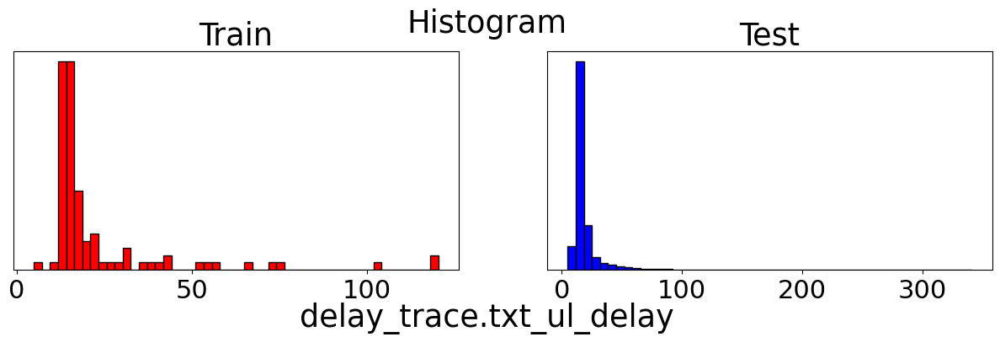

Time to process data for one learning task:  18.803786754608154
Epoch: 10, Loss: 945.47908203125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


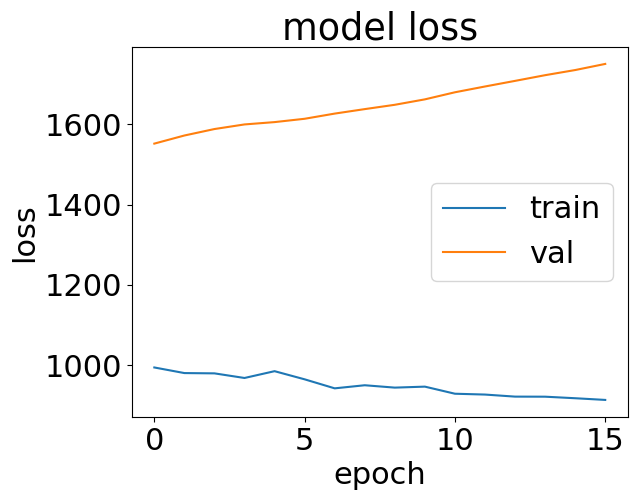

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  93.00608587265015


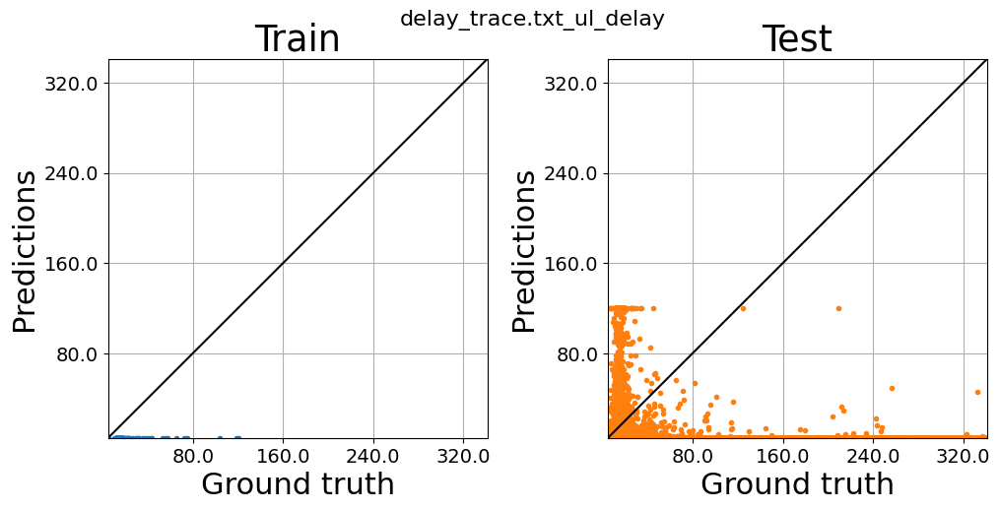



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257684, 470)
(538849, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1152587   51779   21782   10839    6358]
After removing bins that are not populated enough
[0 1 2 3 4] [1152587   51779   21782   10839    6358]
(1226148, 460)
(1226148,)
(1226148,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [497439  20782   8190   4233   2327]
After removing bins that are not populated enough
[0 1 2 3 4] [497439  20782   8190   4233   2327]
(526411, 460)
(526411,)
(526411,)
Train data shape (100, 460)
Test data shape (394

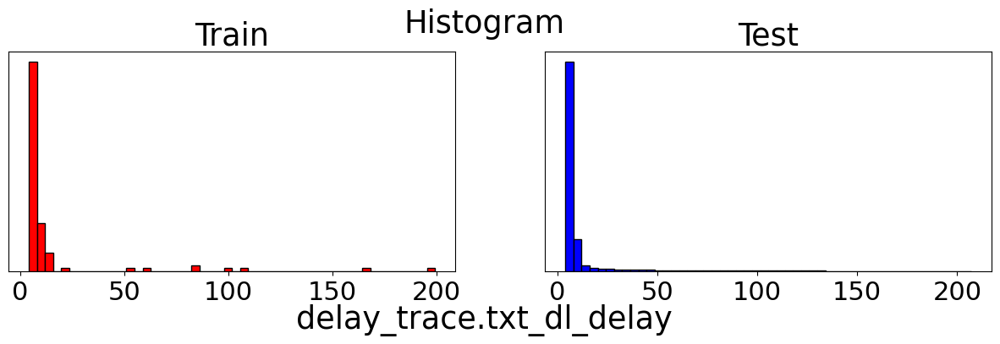

Time to process data for one learning task:  19.952026844024658
Epoch: 10, Loss: 1039.9085305786132
Epoch: 20, Loss: 966.7601206207275
Epoch: 30, Loss: 858.3891455078125
Epoch: 40, Loss: 776.9584057617187
Epoch: 50, Loss: 691.2033349609375
Epoch: 60, Loss: 597.4916625976563
Epoch: 70, Loss: 556.8018933105469
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


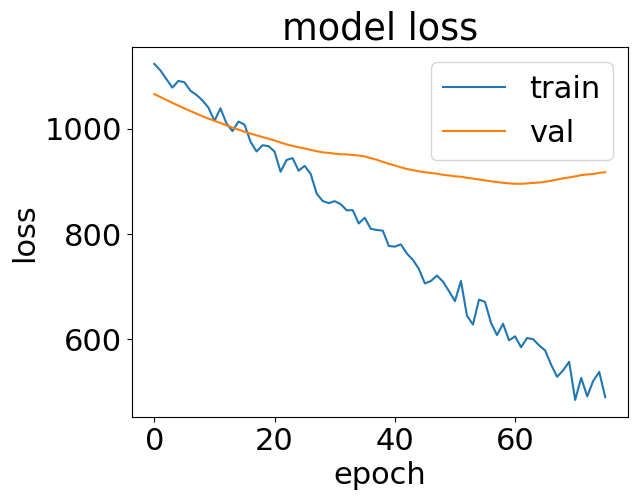

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  357.3146002292633


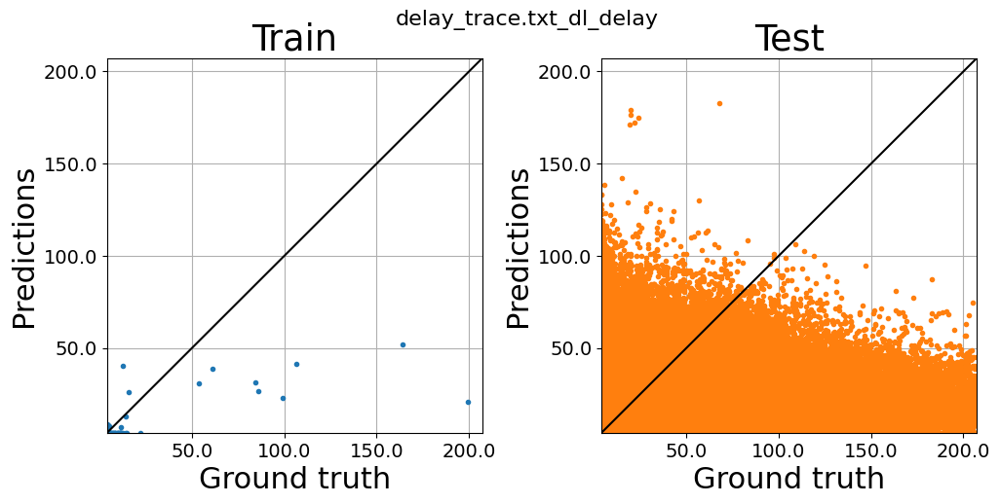



===============================  DONE  ===================================================
============================= Train set mean over runs ===================================
                                                MAE      MAPE        R2
dashClient_trace.txt_newBitRate_bps        0.996667  0.996589  1.000000
vrFragment_trace.txt_vr_frag_thput_mbps    0.315237  3.014747 -0.211434
vrFragment_trace.txt_vr_burst_thput_mbps   6.055266  0.605602  0.399594
vrFragment_trace.txt_vr_frag_time         30.727817  0.388189  0.908071
vrFragment_trace.txt_vr_burst_time        69.736642  0.601561  0.437869
delay_trace.txt_ul_delay                  13.377349  0.507041 -0.146053
delay_trace.txt_dl_delay                   9.607896  0.324203  0.242400
=============================== Test set results =========================================
                                                             MAE  \
dashClient_trace.txt_newBitRate_bps          [0.821 0.794 0.853]   
vrFragment_tr

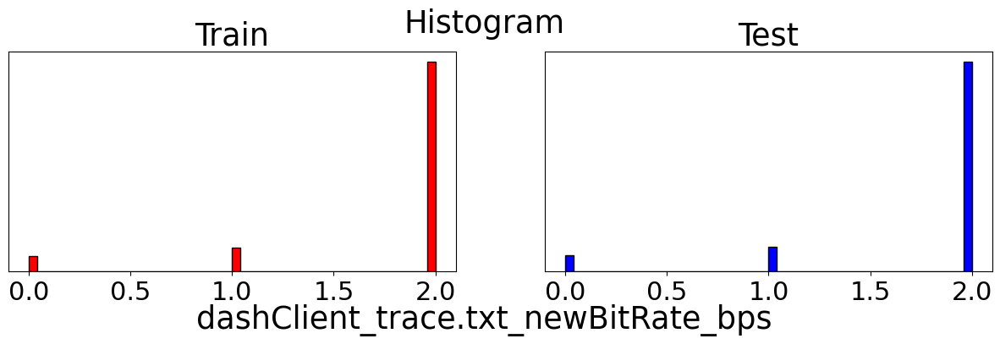

Time to process data for one learning task:  2.0037131309509277
Epoch: 10, Loss: 0.5209607267379761
Epoch: 20, Loss: 0.3844340178966522
Epoch: 30, Loss: 0.33056301093101503
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


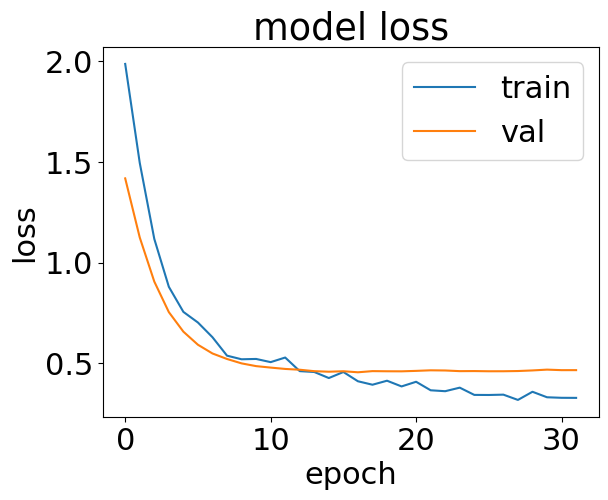

Time to train model:  16.703196048736572


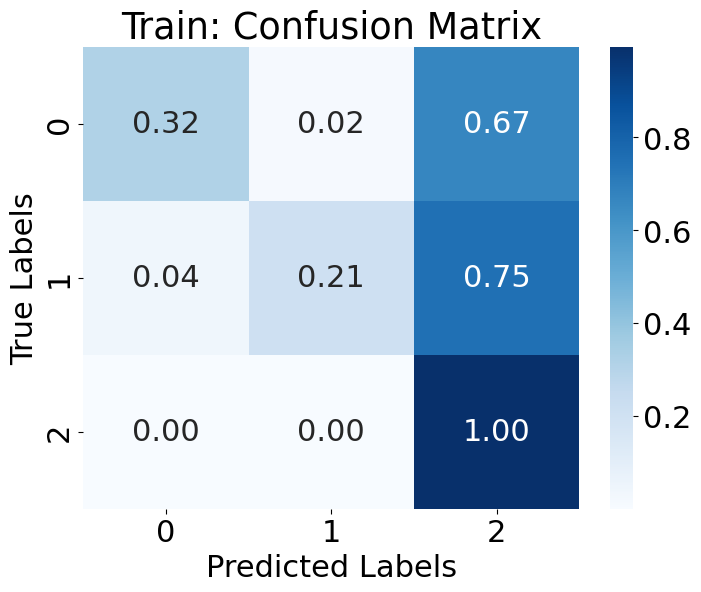

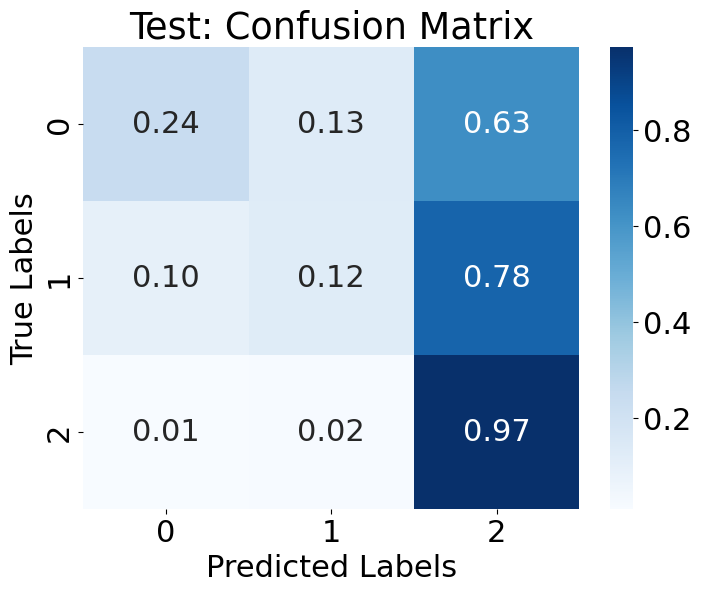



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23107, 470)
(9879, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [16708  1807  1580  1825   938]
After removing bins that are not populated enough
[0 1 2 3 4] [16708  1807  1580  1825   938]
(22858, 460)
(22858,)
(22858,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [5575  988 1151 1456  590]
After removing bins that are not populated enough
[0 1 2 3 4] [5575  988 1151 1456  590]
(9760, 460)
(9760,)
(9760,)
Train data shape (1000, 460)
Test data shape (7320, 460)
Val data shape (2440, 460)


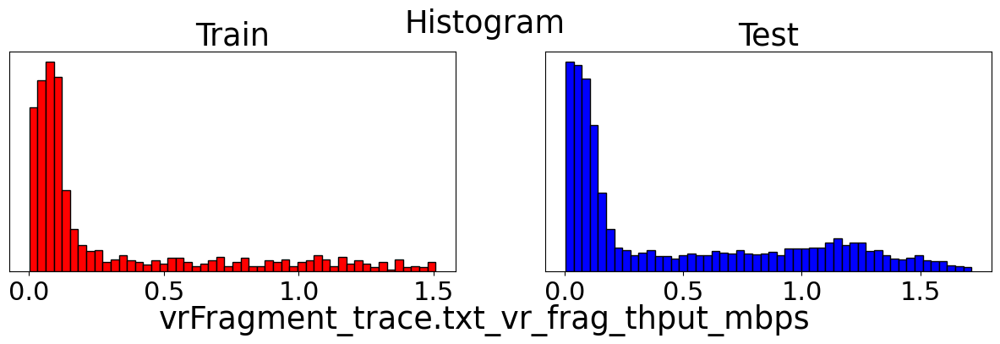

Time to process data for one learning task:  0.5578901767730713
Epoch: 10, Loss: 1.1255057859420776
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


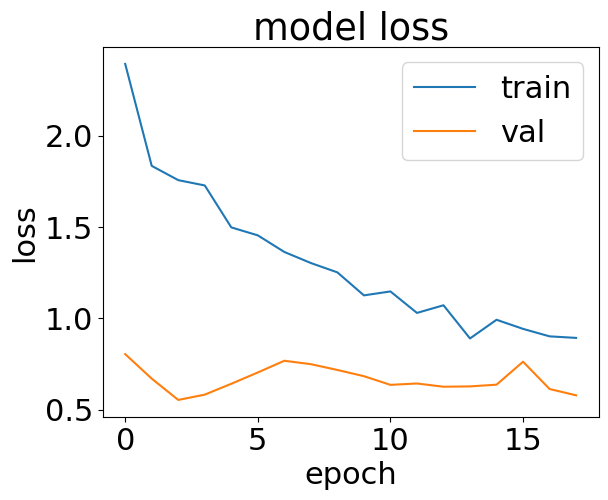

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  10.240959644317627


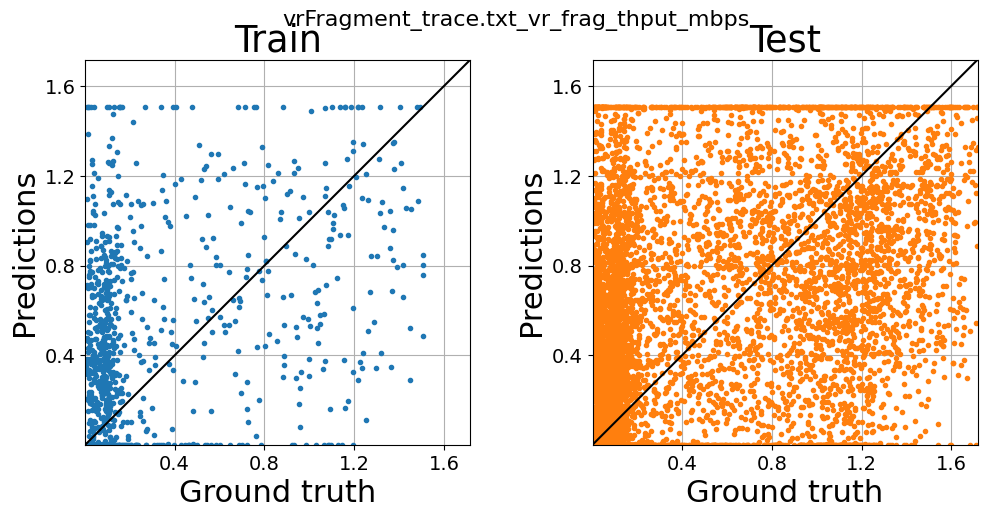



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23093, 470)
(9858, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [16854  1721  1649  1666   955]
After removing bins that are not populated enough
[0 1 2 3 4] [16854  1721  1649  1666   955]
(22845, 460)
(22845,)
(22845,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [5563  945 1158 1428  646]
After removing bins that are not populated enough
[0 1 2 3 4] [5563  945 1158 1428  646]
(9740, 460)
(9740,)
(9740,)
Train data shape (1000, 460)
Test data shape (7305, 460)
Val data shape (2435, 460)


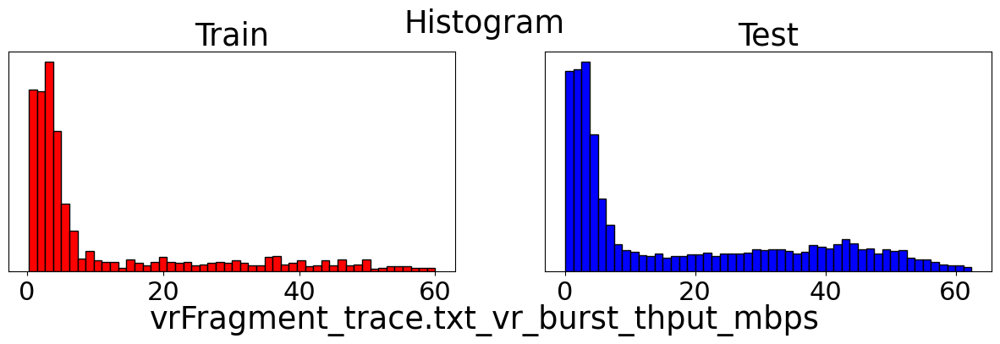

Time to process data for one learning task:  0.5609743595123291
Epoch: 10, Loss: 148.12979907226563
Epoch: 20, Loss: 95.06803149414063
Epoch: 30, Loss: 81.91457067871093
Epoch: 40, Loss: 67.58763409423828
Epoch: 50, Loss: 67.05144689941406
Epoch: 60, Loss: 52.22915783691406
Epoch: 70, Loss: 47.230375549316406
Epoch: 80, Loss: 42.24687161254883
Epoch: 90, Loss: 38.34584701538086
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


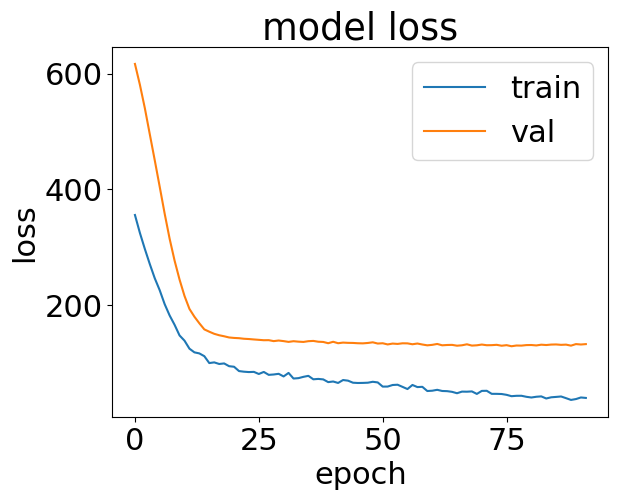

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  21.94128966331482


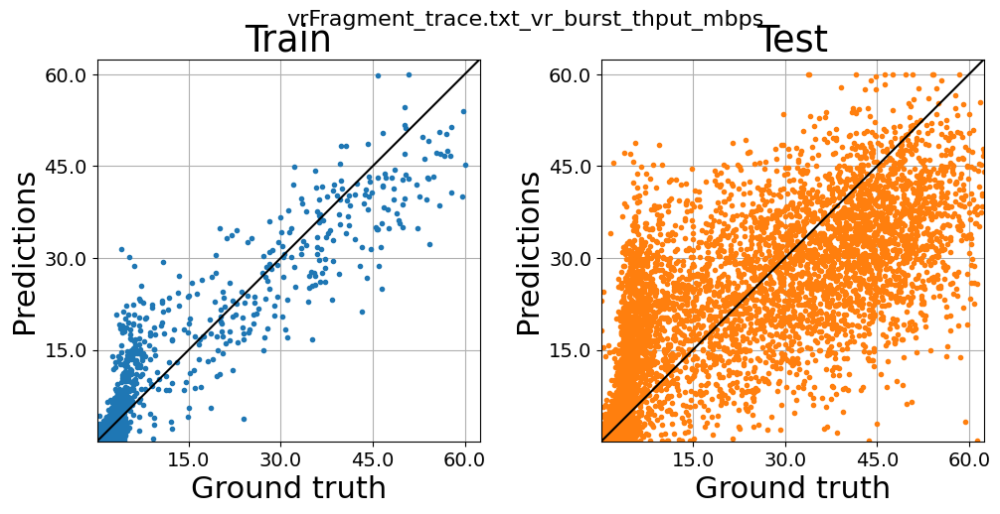



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23107, 470)
(9879, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18018  2912  1209   497   222]
After removing bins that are not populated enough
[0 1 2 3 4] [18018  2912  1209   497   222]
(22636, 460)
(22636,)
(22636,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8258  966  287  157   92]
After removing bins that are not populated enough
[0 1 2 3 4] [8258  966  287  157   92]
(9668, 460)
(9668,)
(9668,)
Train data shape (1000, 460)
Test data shape (7251, 460)
Val data shape (2417, 460)


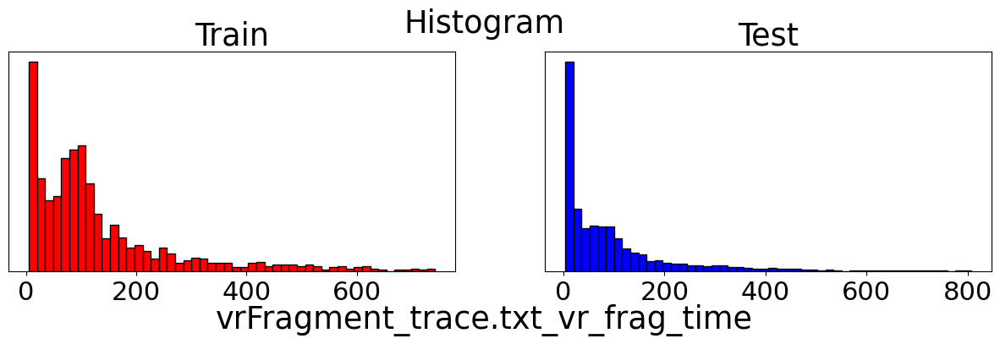

Time to process data for one learning task:  0.5698070526123047
Epoch: 10, Loss: 27687.4038125
Epoch: 20, Loss: 14029.0050546875
Epoch: 30, Loss: 7204.15697265625
Epoch: 40, Loss: 5877.62113671875
Epoch: 50, Loss: 5230.1436328125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


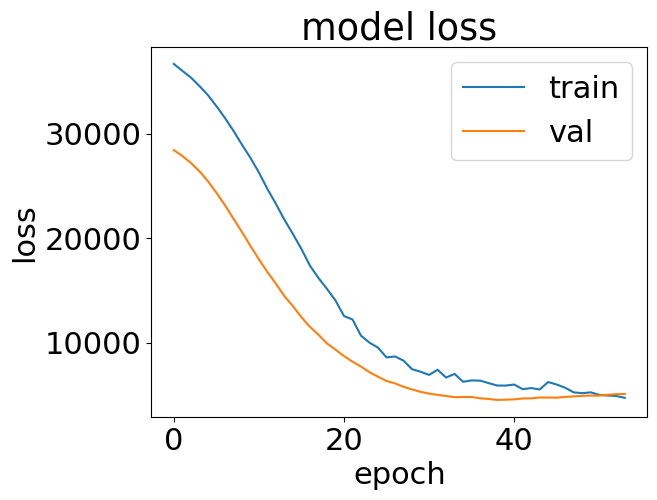

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  16.392433404922485


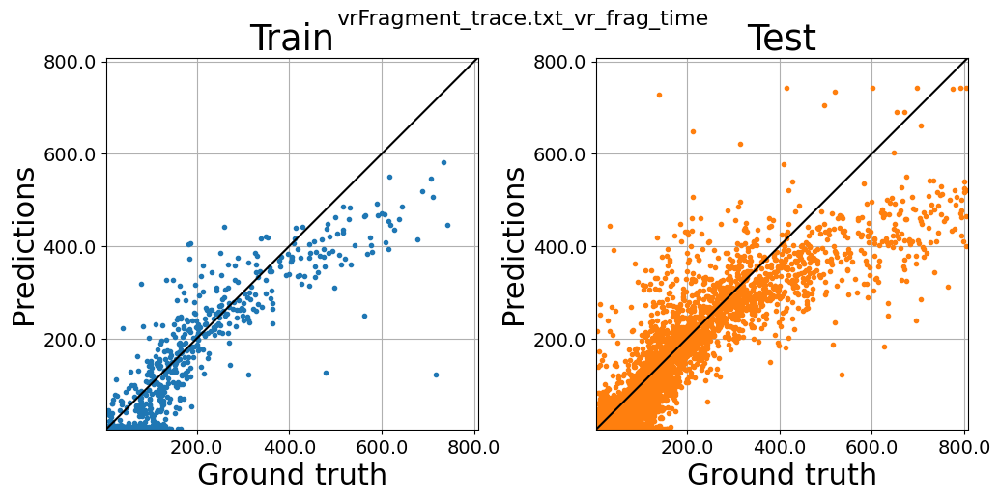



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23093, 470)
(9858, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [17952  2927  1224   512   230]
After removing bins that are not populated enough
[0 1 2 3 4] [17952  2927  1224   512   230]
(22615, 460)
(22615,)
(22615,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8238  962  298  150   92]
After removing bins that are not populated enough
[0 1 2 3 4] [8238  962  298  150   92]
(9648, 460)
(9648,)
(9648,)
Train data shape (1000, 460)
Test data shape (7236, 460)
Val data shape (2412, 460)


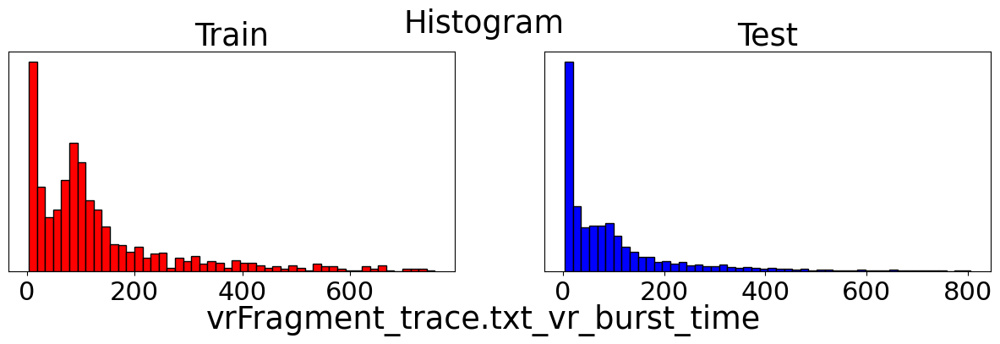

Time to process data for one learning task:  0.569882869720459
Epoch: 10, Loss: 31590.438171875
Epoch: 20, Loss: 17764.279703125
Epoch: 30, Loss: 9123.0577421875
Epoch: 40, Loss: 6348.21578125
Epoch: 50, Loss: 5793.11946875
Epoch: 60, Loss: 5241.73410546875
Epoch: 70, Loss: 4393.7127421875
Epoch: 80, Loss: 4138.69950390625
Epoch: 90, Loss: 4057.72877734375
Epoch: 100, Loss: 3823.337248046875
Epoch: 110, Loss: 3225.0339765625
Epoch: 120, Loss: 3662.43829296875
Epoch: 130, Loss: 3009.1685625
Epoch: 140, Loss: 2838.808033203125
Epoch: 150, Loss: 2458.53303125
Epoch: 160, Loss: 2429.1161630859374
Epoch: 170, Loss: 2204.6637509765624
Epoch: 180, Loss: 2297.150390625
Epoch: 190, Loss: 1919.90847265625
Epoch: 200, Loss: 1747.189224609375
Epoch: 210, Loss: 1647.4619736328125
Epoch: 220, Loss: 1638.96561328125
Epoch: 230, Loss: 1704.041732421875
Epoch: 240, Loss: 1568.7066806640626
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


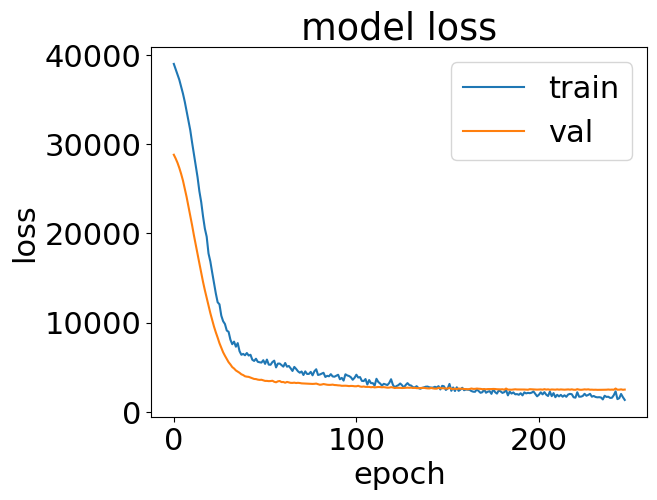

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  47.11839485168457


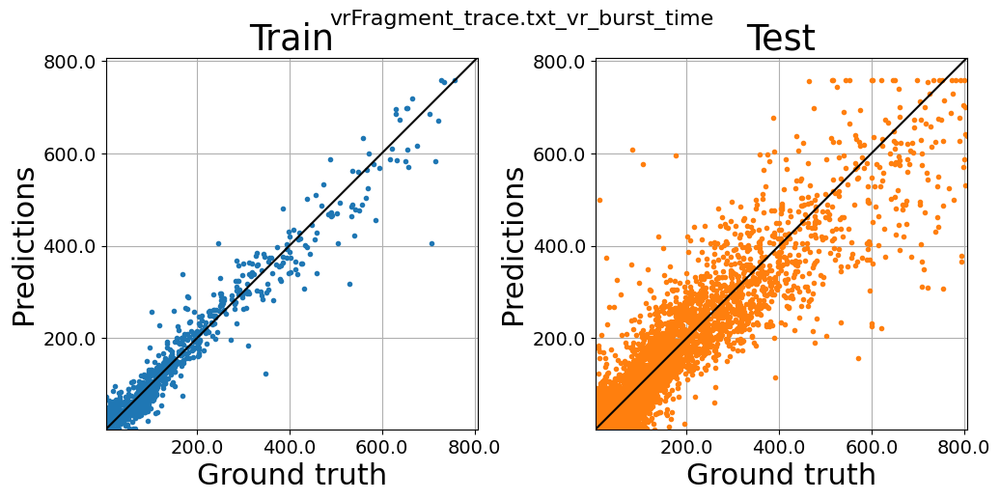



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1186543, 470)
(509167, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1164591    4692    2402    1680    1286]
After removing bins that are not populated enough
[0 1 2 3 4] [1164591    4692    2402    1680    1286]
(1164591, 460)
(1164591,)
(1164591,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [499590   2139   1070    712    551]
After removing bins that are not populated enough
[0 1 2 3 4] [499590   2139   1070    712    551]
(499590, 460)
(499590,)
(499590,)
Train data shape (1000, 460)
Test data shape (37

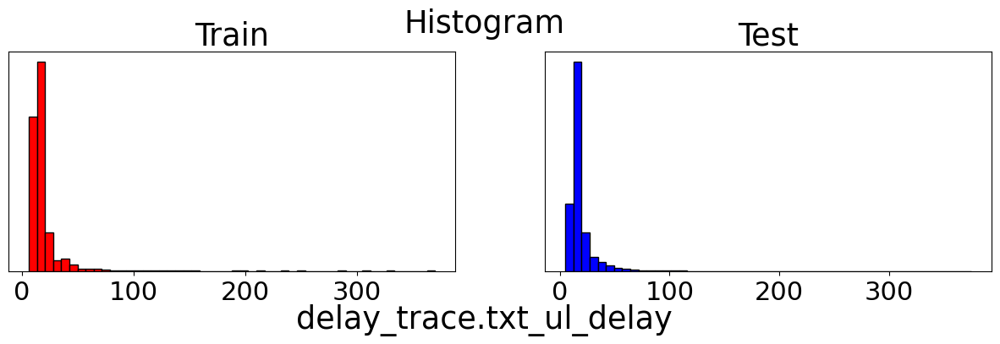

Time to process data for one learning task:  18.595239877700806
Epoch: 10, Loss: 1115.5173623046876
Epoch: 20, Loss: 802.9634658203125
Epoch: 30, Loss: 652.6166947021485
Epoch: 40, Loss: 566.4878646240235
Epoch: 50, Loss: 473.8213720703125
Epoch: 60, Loss: 398.1341271972656
Epoch: 70, Loss: 317.6494639892578
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


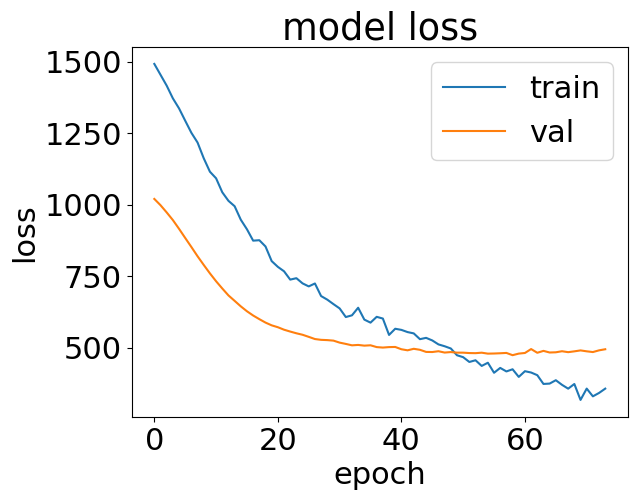

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  350.20202255249023


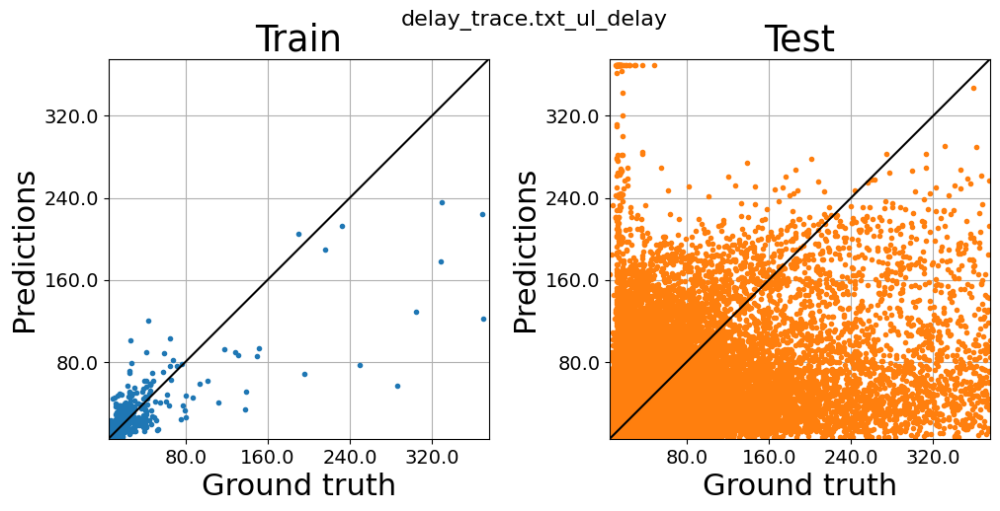



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257550, 470)
(538983, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1156708   50160   20251   10229    5914]
After removing bins that are not populated enough
[0 1 2 3 4] [1156708   50160   20251   10229    5914]
(1227119, 460)
(1227119,)
(1227119,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [493879  21812   9785   4832   2749]
After removing bins that are not populated enough
[0 1 2 3 4] [493879  21812   9785   4832   2749]
(525476, 460)
(525476,)
(525476,)
Train data shape (1000, 460)
Test data shape (39

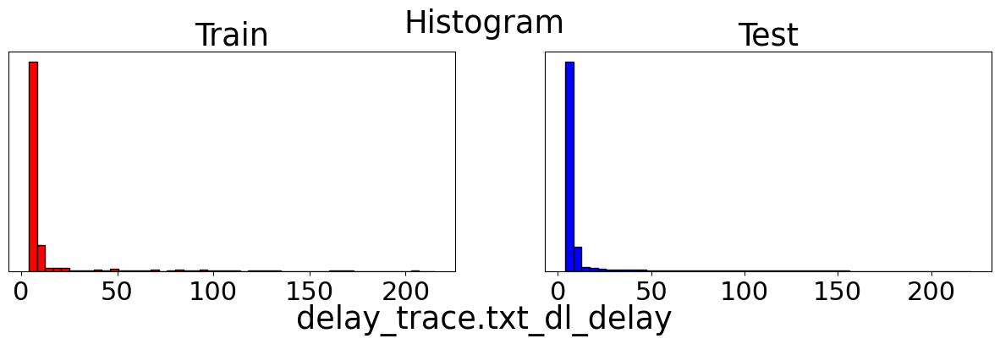

Time to process data for one learning task:  19.811566591262817
Epoch: 10, Loss: 743.3054409179688
Epoch: 20, Loss: 382.52227856445313
Epoch: 30, Loss: 259.37510961914063
Epoch: 40, Loss: 184.97628466796874
Epoch: 50, Loss: 162.46594848632813
Epoch: 60, Loss: 132.28062939453125
Epoch: 70, Loss: 109.98843859863281
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


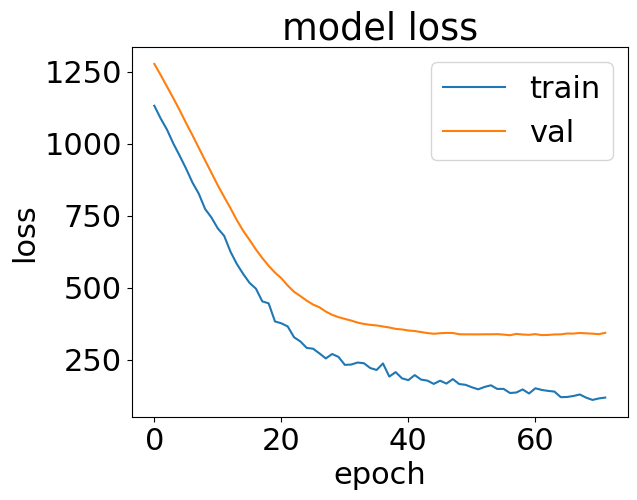

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  362.1016888618469


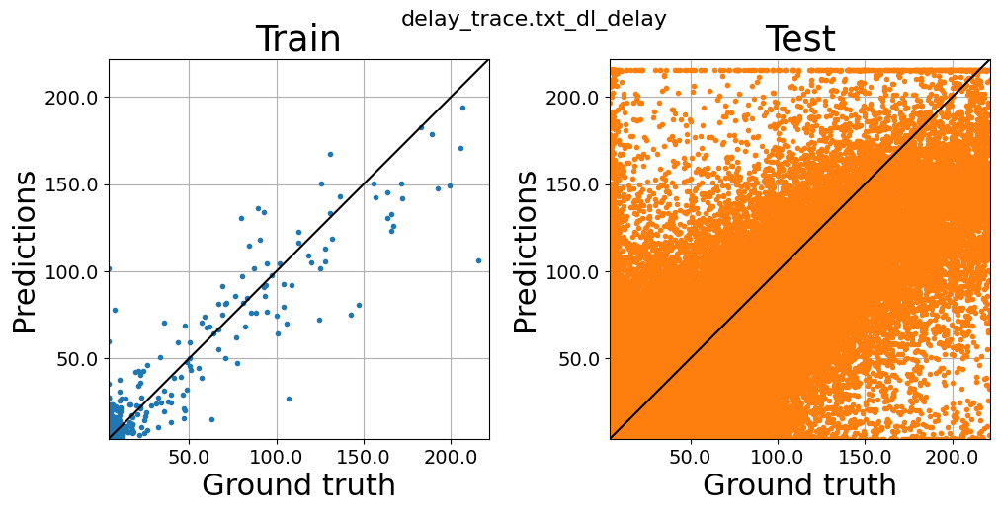



===============================  DONE  ===================================================
Random iteration:  1
# train runs used  7
# test runs used  3
Concatenating runs:  [17 19 15 16 18 20 14]
Time to read csv file for run:  12.98442554473877
Loaded run 17
Time to read csv file for run:  13.622227668762207
Loaded run 19
Time to read csv file for run:  12.771098136901855
Loaded run 15
Time to read csv file for run:  12.927528858184814
Loaded run 16
Time to read csv file for run:  13.277209520339966
Loaded run 18
Time to read csv file for run:  12.871950149536133
Loaded run 20
Time to read csv file for run:  12.836928606033325
Loaded run 14
Concatenating runs:  [11 13 12]
Time to read csv file for run:  12.890336275100708
Loaded run 11
Time to read csv file for run:  12.936727285385132
Loaded run 13
Time to read csv file for run:  13.077188491821289
Loaded run 12
Time to read data:  371.8887484073639
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping rows

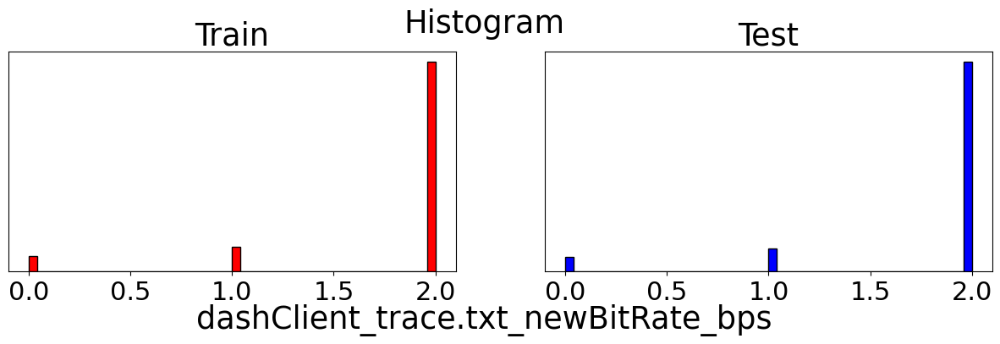

Time to process data for one learning task:  1.9559462070465088
Epoch: 10, Loss: 0.4784995756149292
Epoch: 20, Loss: 0.40025715351104735
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


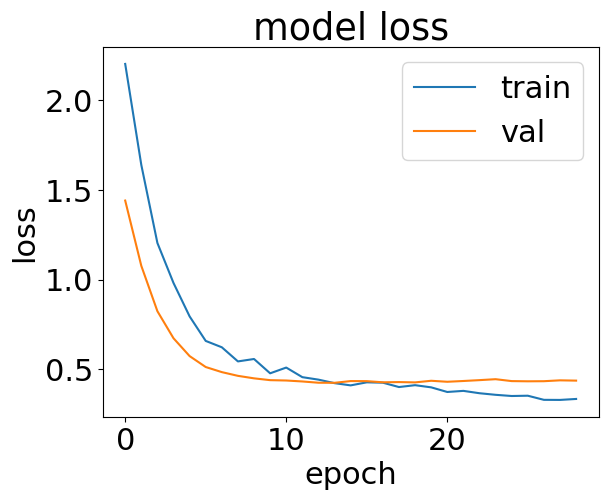

Time to train model:  18.546245098114014


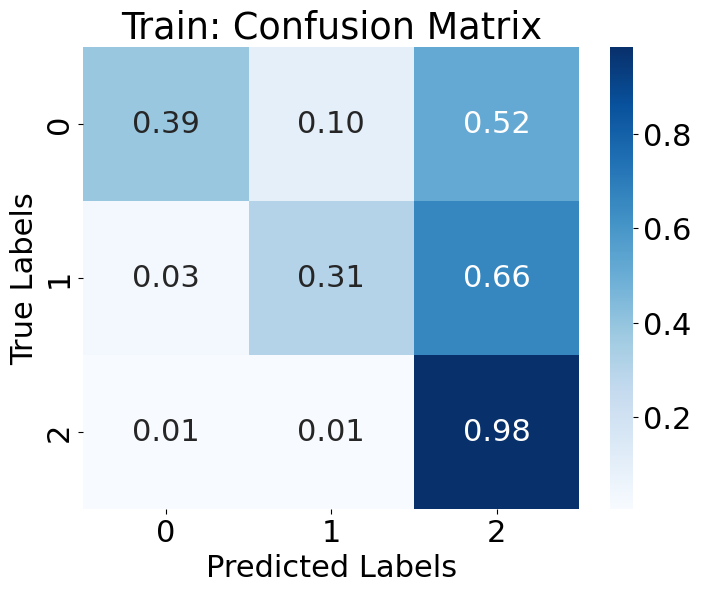

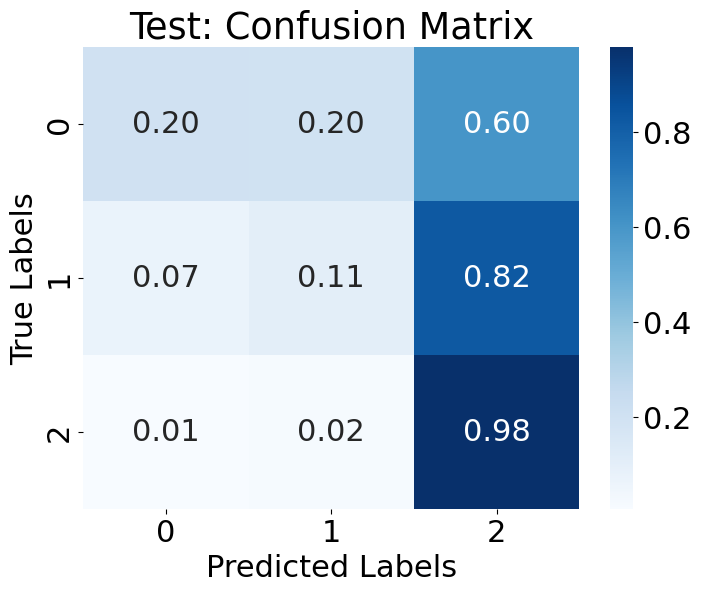



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23106, 470)
(9880, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15522  1911  1849  2441  1128]
After removing bins that are not populated enough
[0 1 2 3 4] [15522  1911  1849  2441  1128]
(22851, 460)
(22851,)
(22851,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6763  886  800  879  439]
After removing bins that are not populated enough
[0 1 2 3 4] [6763  886  800  879  439]
(9767, 460)
(9767,)
(9767,)
Train data shape (1000, 460)
Test data shape (7325, 460)
Val data shape (2442, 460)


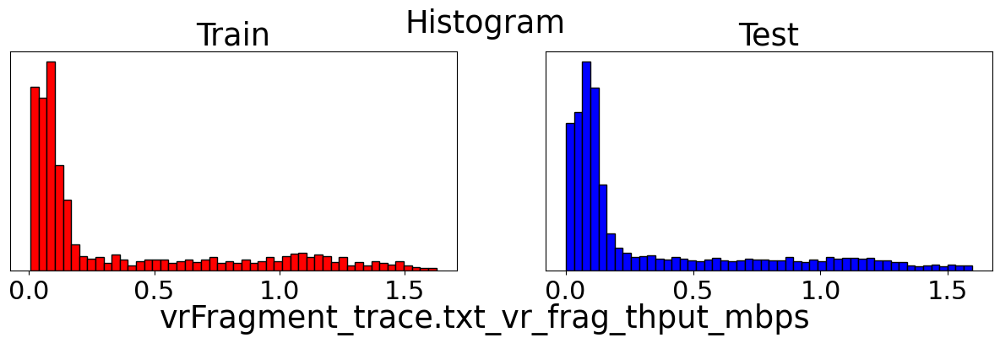

Time to process data for one learning task:  0.601992130279541
Epoch: 10, Loss: 1.1448713254928589
Epoch: 20, Loss: 0.7166287908554078
Epoch: 30, Loss: 0.6073349781036377
Epoch: 40, Loss: 0.49122764110565187
Epoch: 50, Loss: 0.40050915932655334
Epoch: 60, Loss: 0.3875682168006897
Epoch: 70, Loss: 0.3565580520629883
Epoch: 80, Loss: 0.31783336353302
Epoch: 90, Loss: 0.2847169897556305
Epoch: 100, Loss: 0.25956262385845186
Epoch: 110, Loss: 0.2680037653446197
Epoch: 120, Loss: 0.254656365275383
Epoch: 130, Loss: 0.23584351563453673
Epoch: 140, Loss: 0.22805091691017151
Epoch: 150, Loss: 0.19420586955547334
Epoch: 160, Loss: 0.1741305434703827
Epoch: 170, Loss: 0.18192206311225892
Epoch: 180, Loss: 0.1666819915175438
Epoch: 190, Loss: 0.14652147507667543
Epoch: 200, Loss: 0.13010696256160736
Epoch: 210, Loss: 0.1367715539932251
Epoch: 220, Loss: 0.12474567985534668
Epoch: 230, Loss: 0.12361365699768066
Epoch: 240, Loss: 0.1156177340745926
INFO:tensorflow:Assets written to: models/mlp_mode

INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


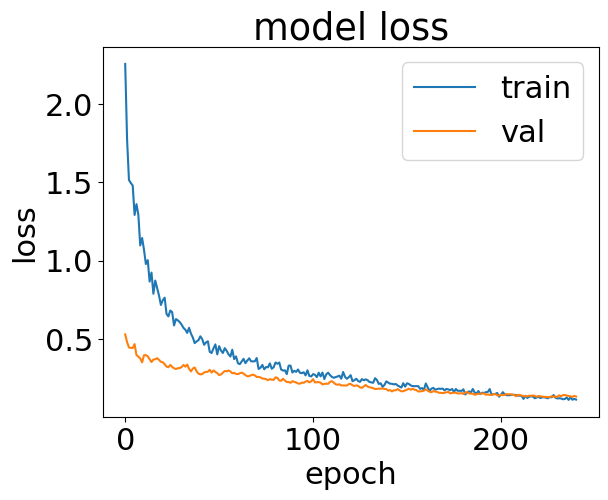

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  48.22432017326355


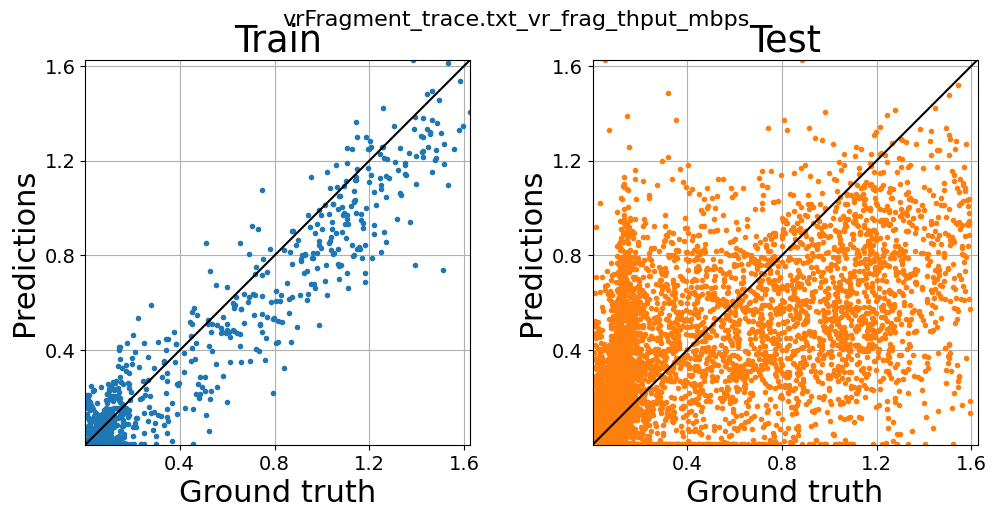



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23078, 470)
(9873, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15632  1851  1961  2255  1125]
After removing bins that are not populated enough
[0 1 2 3 4] [15632  1851  1961  2255  1125]
(22824, 460)
(22824,)
(22824,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6797  799  826  841  498]
After removing bins that are not populated enough
[0 1 2 3 4] [6797  799  826  841  498]
(9761, 460)
(9761,)
(9761,)
Train data shape (1000, 460)
Test data shape (7320, 460)
Val data shape (2441, 460)


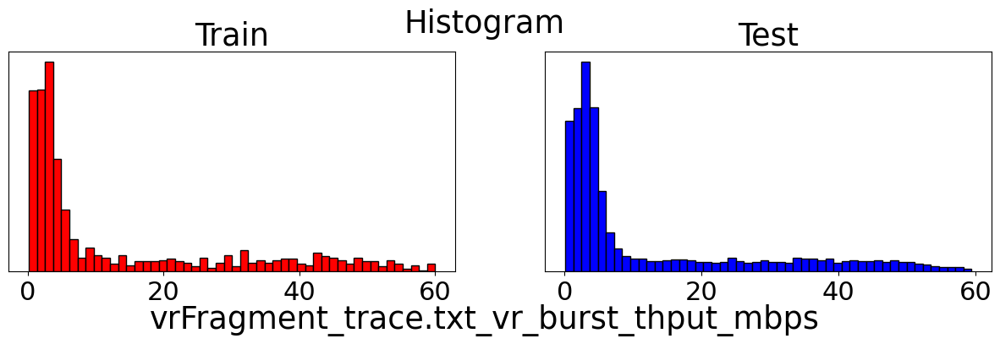

Time to process data for one learning task:  0.6377155780792236
Epoch: 10, Loss: 179.00976782226562
Epoch: 20, Loss: 102.91725573730469
Epoch: 30, Loss: 88.42909149169923
Epoch: 40, Loss: 74.03317199707031
Epoch: 50, Loss: 71.4586496887207
Epoch: 60, Loss: 66.71435079956055
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


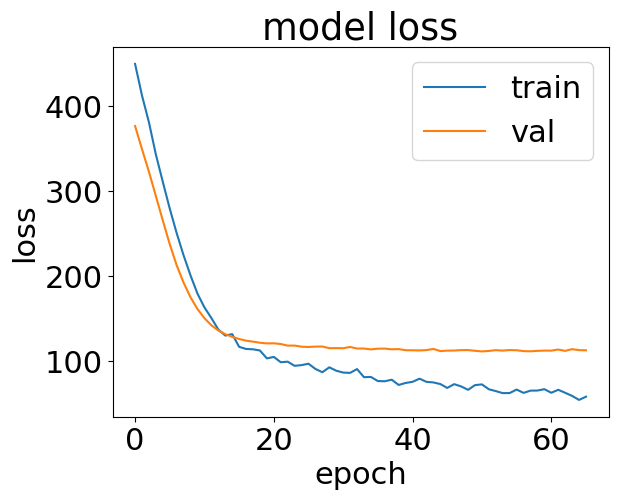

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  20.05018377304077


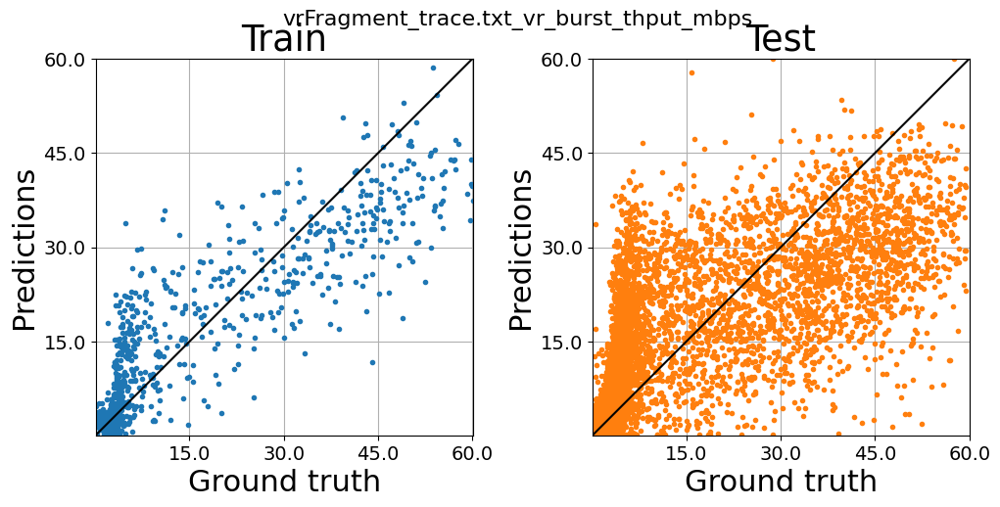



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23106, 470)
(9880, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18329  2769  1043   479   231]
After removing bins that are not populated enough
[0 1 2 3 4] [18329  2769  1043   479   231]
(22851, 460)
(22851,)
(22851,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7948 1087  462  195   75]
After removing bins that are not populated enough
[0 1 2 3 4] [7948 1087  462  195   75]
(9692, 460)
(9692,)
(9692,)
Train data shape (1000, 460)
Test data shape (7269, 460)
Val data shape (2423, 460)


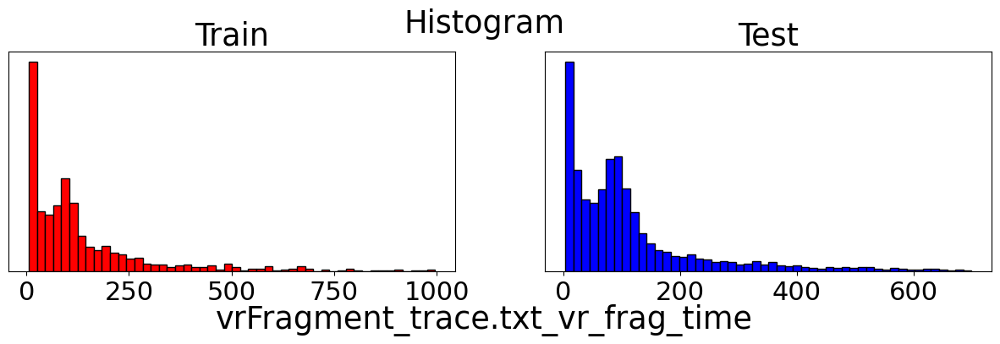

Time to process data for one learning task:  0.5992674827575684
Epoch: 10, Loss: 35656.832875
Epoch: 20, Loss: 19808.99903125
Epoch: 30, Loss: 10307.6268515625
Epoch: 40, Loss: 7223.1601640625
Epoch: 50, Loss: 6152.66843359375
Epoch: 60, Loss: 4802.7575234375
Epoch: 70, Loss: 4622.2497734375
Epoch: 80, Loss: 4741.922916015625
Epoch: 90, Loss: 4047.63103125
Epoch: 100, Loss: 3186.839296875
Epoch: 110, Loss: 3397.91328125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


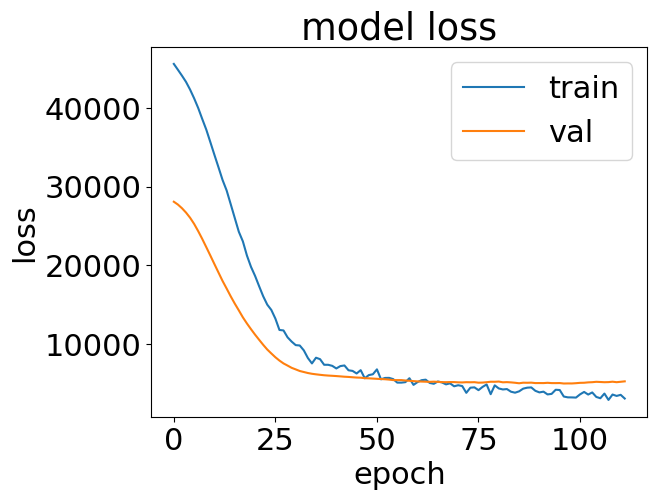

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  27.67009210586548


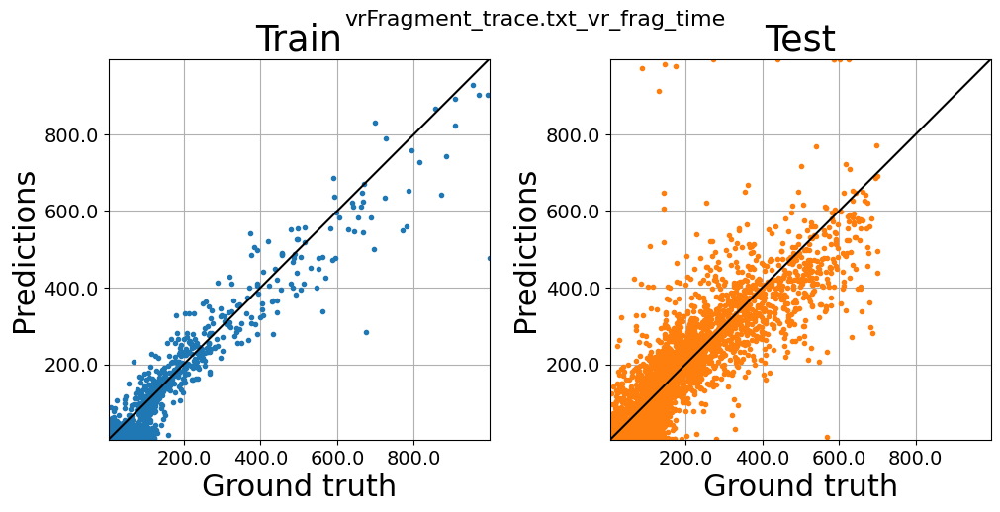



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23078, 470)
(9873, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18247  2777  1070   496   234]
After removing bins that are not populated enough
[0 1 2 3 4] [18247  2777  1070   496   234]
(22824, 460)
(22824,)
(22824,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7936 1085  477  189   74]
After removing bins that are not populated enough
[0 1 2 3 4] [7936 1085  477  189   74]
(9687, 460)
(9687,)
(9687,)
Train data shape (1000, 460)
Test data shape (7265, 460)
Val data shape (2422, 460)


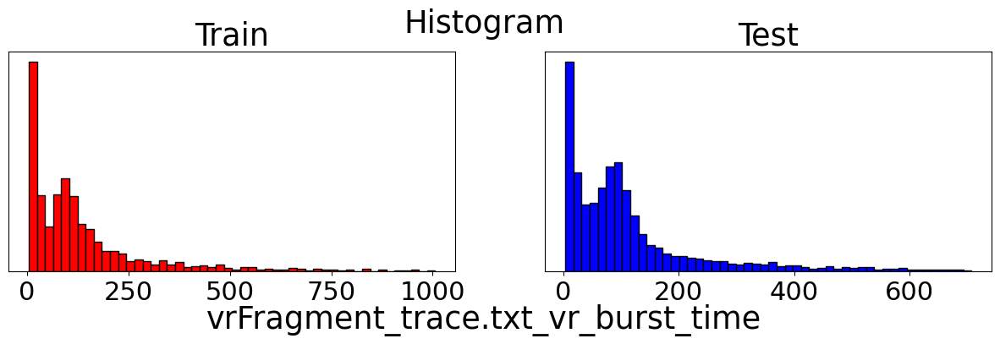

Time to process data for one learning task:  0.6261610984802246
Epoch: 10, Loss: 36748.322671875
Epoch: 20, Loss: 19667.01734375
Epoch: 30, Loss: 9698.65934375
Epoch: 40, Loss: 7106.48986328125
Epoch: 50, Loss: 6248.3024765625
Epoch: 60, Loss: 4987.16885546875
Epoch: 70, Loss: 4972.181484375
Epoch: 80, Loss: 3717.768998046875
Epoch: 90, Loss: 3933.9730390625
Epoch: 100, Loss: 3979.7454140625
Epoch: 110, Loss: 3783.262453125
Epoch: 120, Loss: 2923.974642578125
Epoch: 130, Loss: 2701.144095703125
Epoch: 140, Loss: 2565.4800380859374
Epoch: 150, Loss: 3330.9018828125
Epoch: 160, Loss: 1946.2692504882812
Epoch: 170, Loss: 2428.491599609375
Epoch: 180, Loss: 2072.134033203125
Epoch: 190, Loss: 1831.4701650390625
Epoch: 200, Loss: 1955.969669921875
Epoch: 210, Loss: 1765.4249013671874
Epoch: 220, Loss: 1880.03800390625
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


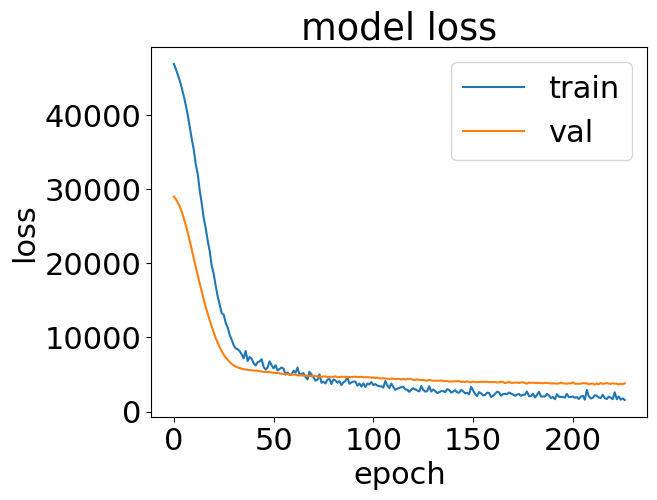

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  47.72050404548645


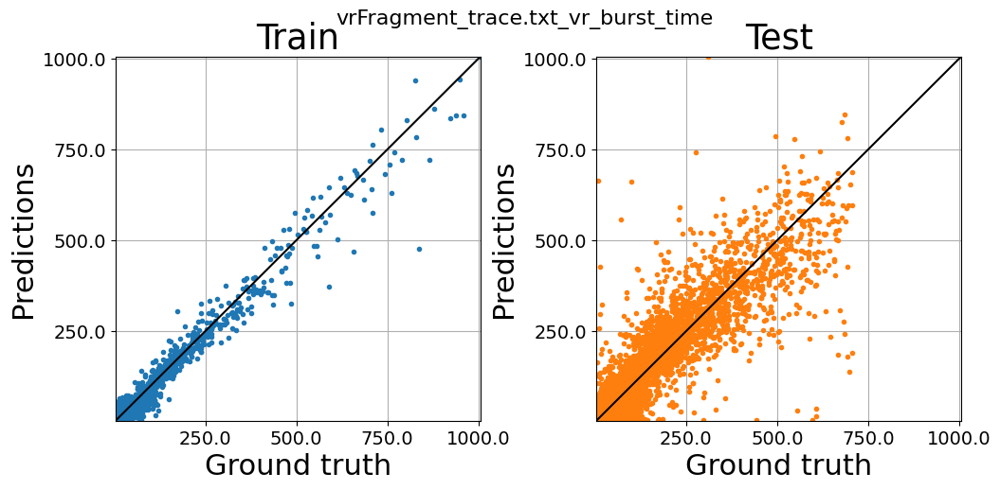



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1185708, 470)
(510002, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1163614    4767    2434    1698    1310]
After removing bins that are not populated enough
[0 1 2 3 4] [1163614    4767    2434    1698    1310]
(1163614, 460)
(1163614,)
(1163614,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [500604   2020   1047    695    525]
After removing bins that are not populated enough
[0 1 2 3 4] [500604   2020   1047    695    525]
(500604, 460)
(500604,)
(500604,)
Train data shape (1000, 460)
Test data shape (37

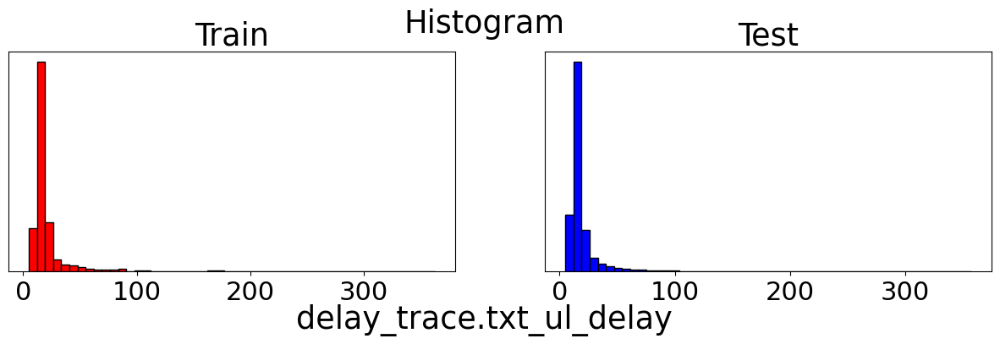

Time to process data for one learning task:  18.731788873672485
Epoch: 10, Loss: 756.7459140625
Epoch: 20, Loss: 485.666517578125
Epoch: 30, Loss: 385.4804206542969
Epoch: 40, Loss: 308.07165795898436
Epoch: 50, Loss: 225.61214233398437
Epoch: 60, Loss: 212.9191430053711
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


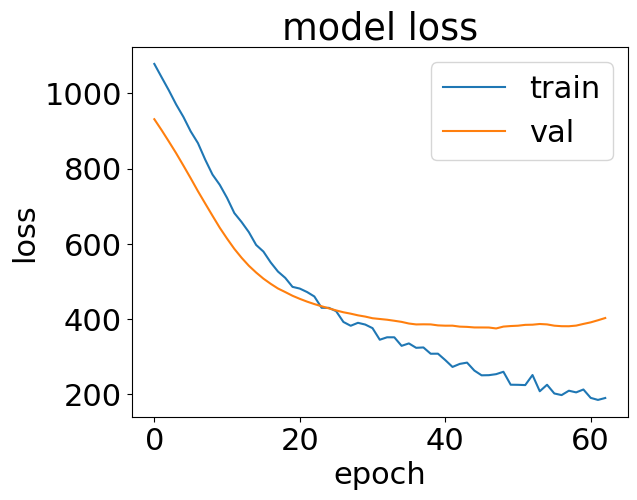

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  314.93663144111633


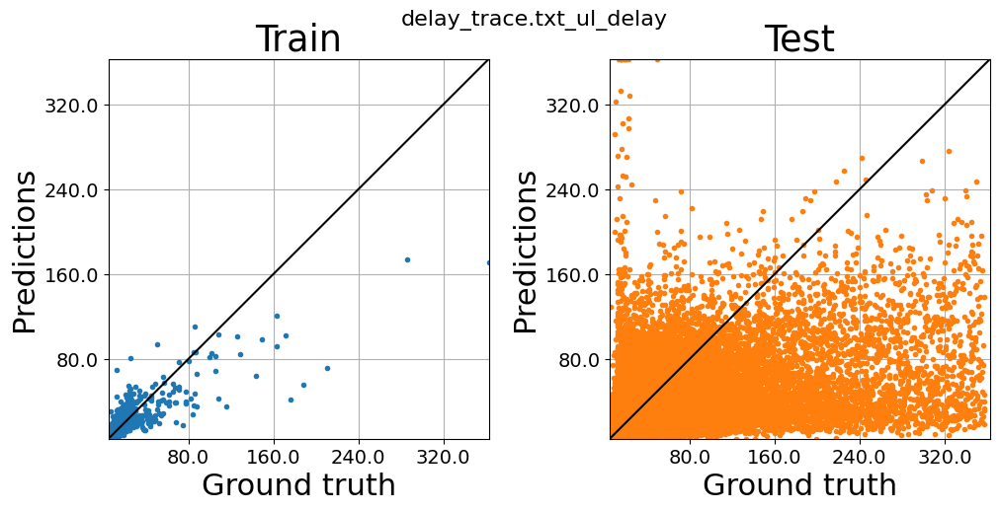



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257449, 470)
(539084, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1155599   50255   21147   10432    6091]
After removing bins that are not populated enough
[0 1 2 3 4] [1155599   50255   21147   10432    6091]
(1227001, 460)
(1227001,)
(1227001,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [494833  21861   8797   4667   2639]
After removing bins that are not populated enough
[0 1 2 3 4] [494833  21861   8797   4667   2639]
(525491, 460)
(525491,)
(525491,)
Train data shape (1000, 460)
Test data shape (39

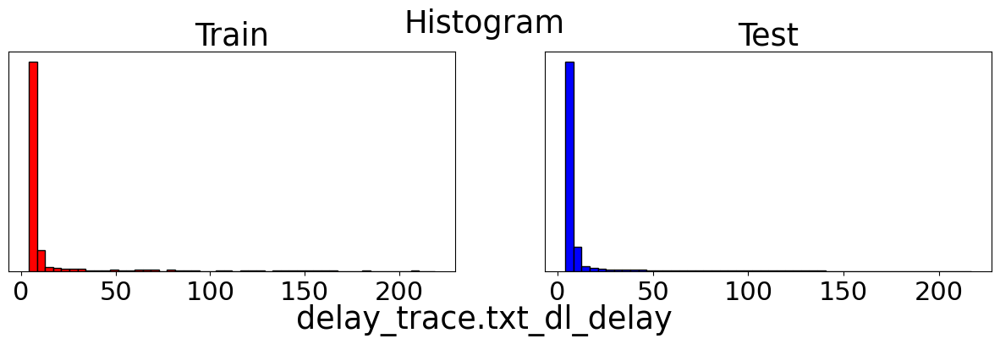

Time to process data for one learning task:  19.796475410461426
Epoch: 10, Loss: 791.6918763427734
Epoch: 20, Loss: 466.3132822265625
Epoch: 30, Loss: 338.99868142700194
Epoch: 40, Loss: 239.20926538085936
Epoch: 50, Loss: 192.1582265625
Epoch: 60, Loss: 164.8586576538086
Epoch: 70, Loss: 134.5823173828125
Epoch: 80, Loss: 124.01365991210938
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


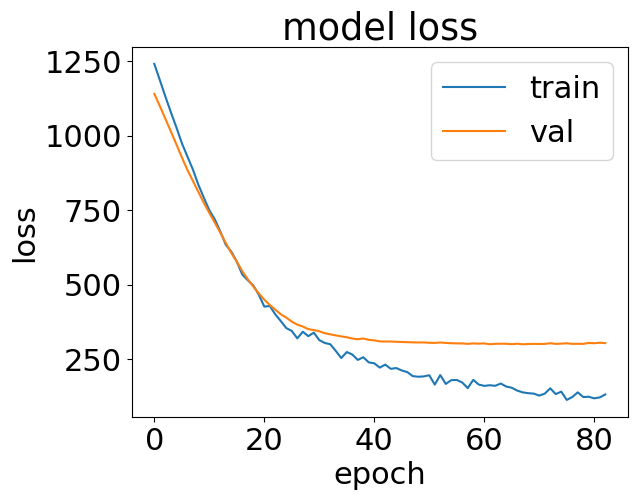

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  424.0516982078552


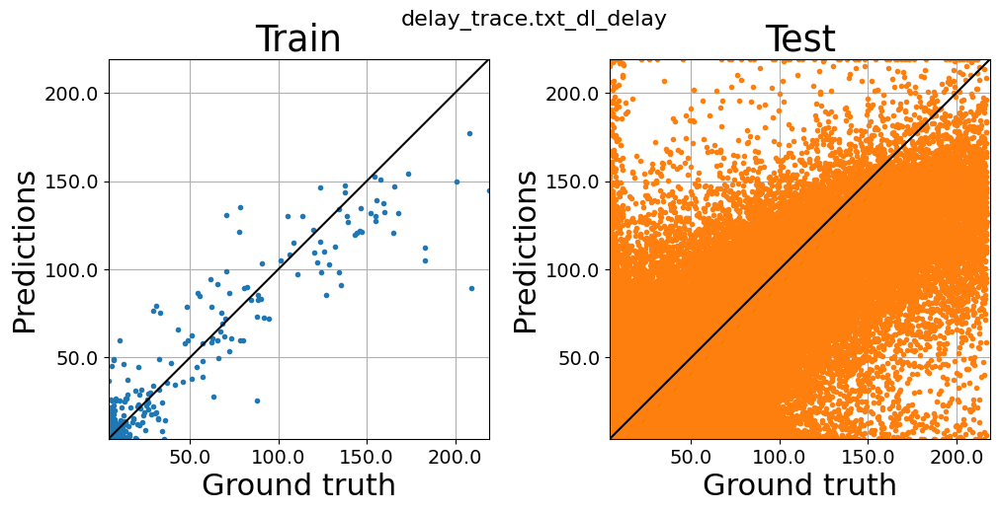



===============================  DONE  ===================================================
Random iteration:  2
# train runs used  7
# test runs used  3
Concatenating runs:  [19 15 12 17 11 13 16]
Time to read csv file for run:  15.163209915161133
Loaded run 19
Time to read csv file for run:  14.828301668167114
Loaded run 15
Time to read csv file for run:  14.907084226608276
Loaded run 12
Time to read csv file for run:  15.227437019348145
Loaded run 17
Time to read csv file for run:  15.198365449905396
Loaded run 11
Time to read csv file for run:  15.205235004425049
Loaded run 13
Time to read csv file for run:  15.309743881225586
Loaded run 16
Concatenating runs:  [18 14 20]
Time to read csv file for run:  14.527348518371582
Loaded run 18
Time to read csv file for run:  15.32943081855774
Loaded run 14
Time to read csv file for run:  15.191202878952026
Loaded run 20
Time to read data:  396.32991647720337
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping row

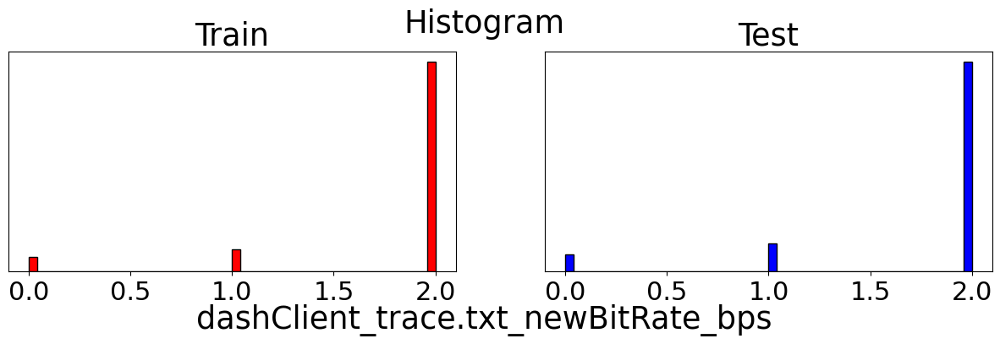

Time to process data for one learning task:  2.1864280700683594
Epoch: 10, Loss: 0.512078598499298
Epoch: 20, Loss: 0.3692865355014801
Epoch: 30, Loss: 0.32681952393054964
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


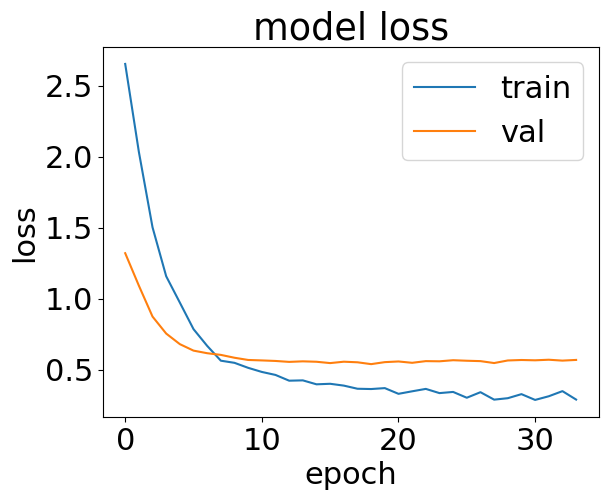

Time to train model:  21.343072414398193


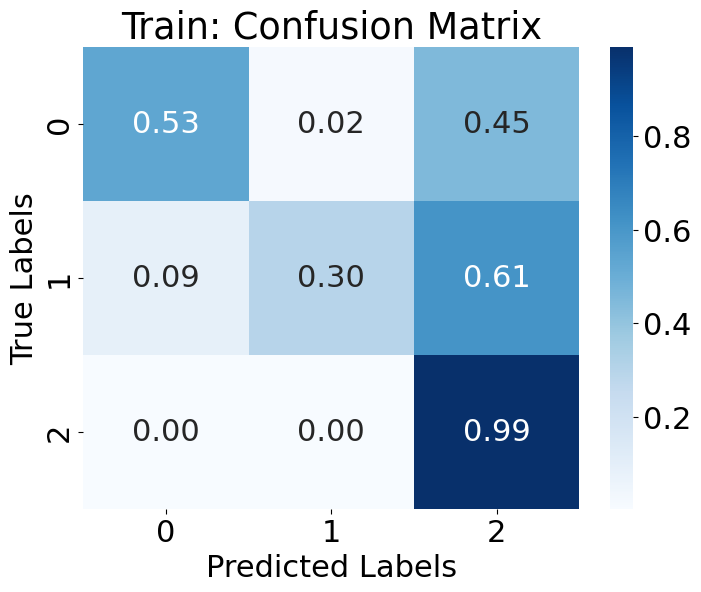

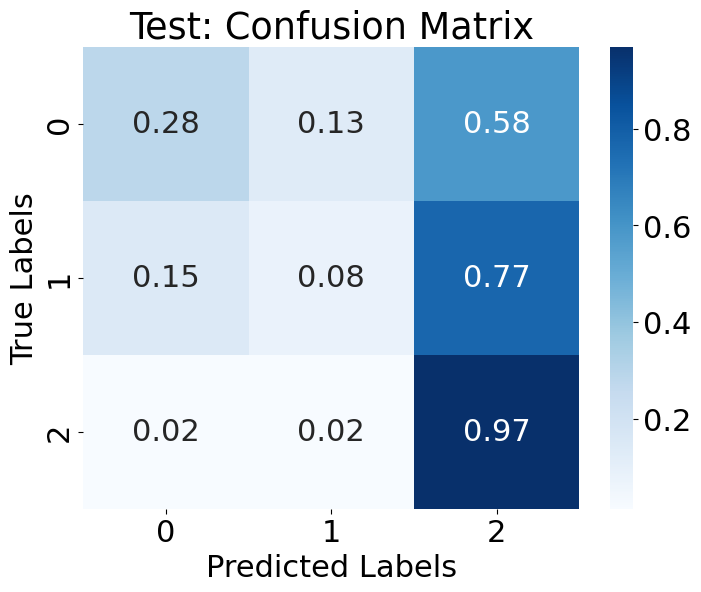



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23102, 470)
(9884, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15748  1936  1834  2283  1033]
After removing bins that are not populated enough
[0 1 2 3 4] [15748  1936  1834  2283  1033]
(22834, 460)
(22834,)
(22834,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6528  867  827 1040  522]
After removing bins that are not populated enough
[0 1 2 3 4] [6528  867  827 1040  522]
(9784, 460)
(9784,)
(9784,)
Train data shape (1000, 460)
Test data shape (7338, 460)
Val data shape (2446, 460)


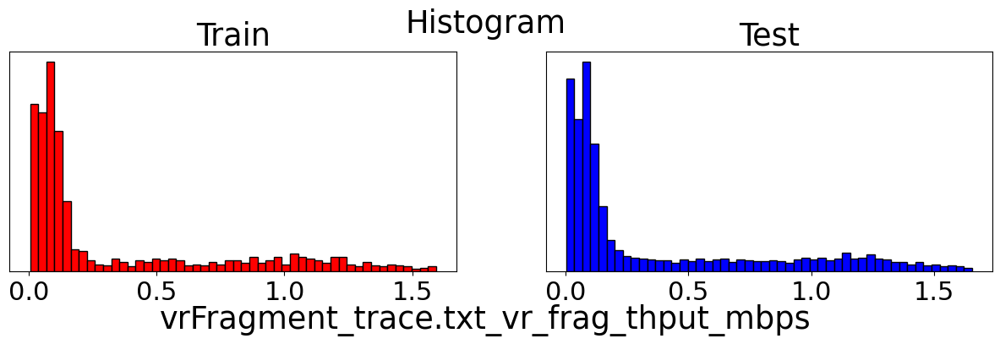

Time to process data for one learning task:  0.6908106803894043
Epoch: 10, Loss: 1.5133695888519287
Epoch: 20, Loss: 0.9299546613693237
Epoch: 30, Loss: 0.8774690713882446
Epoch: 40, Loss: 0.6344994630813598
Epoch: 50, Loss: 0.6082729578018189
Epoch: 60, Loss: 0.48123511695861815
Epoch: 70, Loss: 0.46531361794471743
Epoch: 80, Loss: 0.435244035243988
Epoch: 90, Loss: 0.37436594915390015
Epoch: 100, Loss: 0.37550857138633725
Epoch: 110, Loss: 0.35300760793685915
Epoch: 120, Loss: 0.3066905709505081
Epoch: 130, Loss: 0.2849699200391769
Epoch: 140, Loss: 0.26197065496444705
Epoch: 150, Loss: 0.23331737017631532
Epoch: 160, Loss: 0.20812289929389954
Epoch: 170, Loss: 0.19899101400375366
Epoch: 180, Loss: 0.19235159862041473
Epoch: 190, Loss: 0.15645277857780457
Epoch: 200, Loss: 0.13613986372947692
Epoch: 210, Loss: 0.14946032428741454
Epoch: 220, Loss: 0.13699946320056916
Epoch: 230, Loss: 0.13058039164543153
Epoch: 240, Loss: 0.1061133941411972
Epoch: 250, Loss: 0.10654323101043701
Epoch

INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


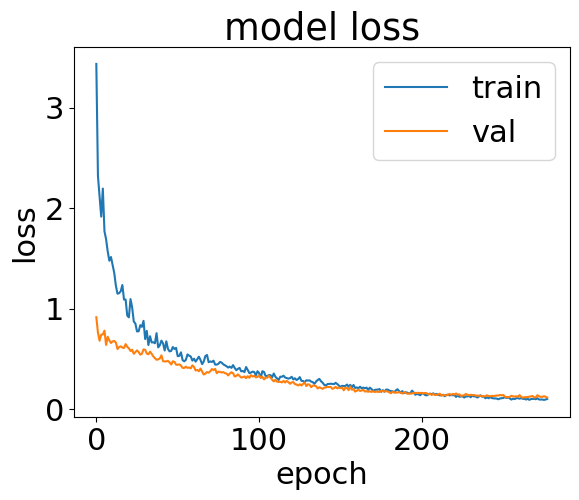

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  57.13022232055664


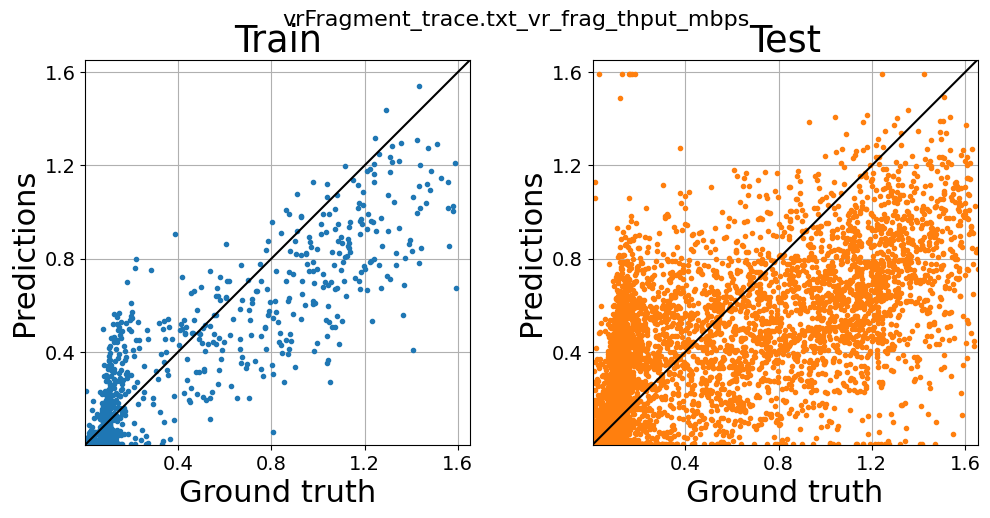



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23091, 470)
(9860, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15864  1768  1902  2101  1189]
After removing bins that are not populated enough
[0 1 2 3 4] [15864  1768  1902  2101  1189]
(22824, 460)
(22824,)
(22824,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6553  853  897  990  468]
After removing bins that are not populated enough
[0 1 2 3 4] [6553  853  897  990  468]
(9761, 460)
(9761,)
(9761,)
Train data shape (1000, 460)
Test data shape (7320, 460)
Val data shape (2441, 460)


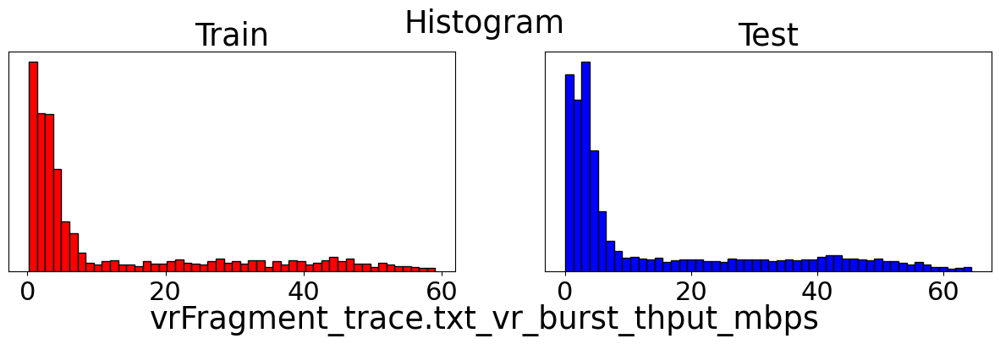

Time to process data for one learning task:  0.6818957328796387
Epoch: 10, Loss: 148.5548525390625
Epoch: 20, Loss: 90.1022685546875
Epoch: 30, Loss: 85.84760290527343
Epoch: 40, Loss: 74.36020874023437
Epoch: 50, Loss: 67.77660528564454
Epoch: 60, Loss: 60.676660064697266
Epoch: 70, Loss: 54.11722869873047
Epoch: 80, Loss: 53.60807281494141
Epoch: 90, Loss: 45.141848693847656
Epoch: 100, Loss: 41.915516387939455
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


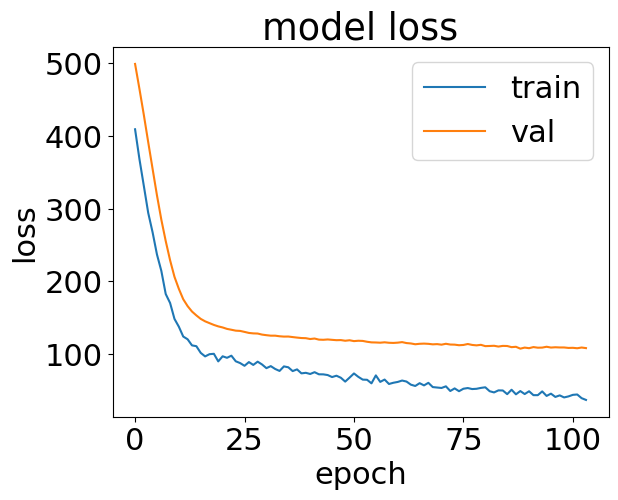

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  29.569055557250977


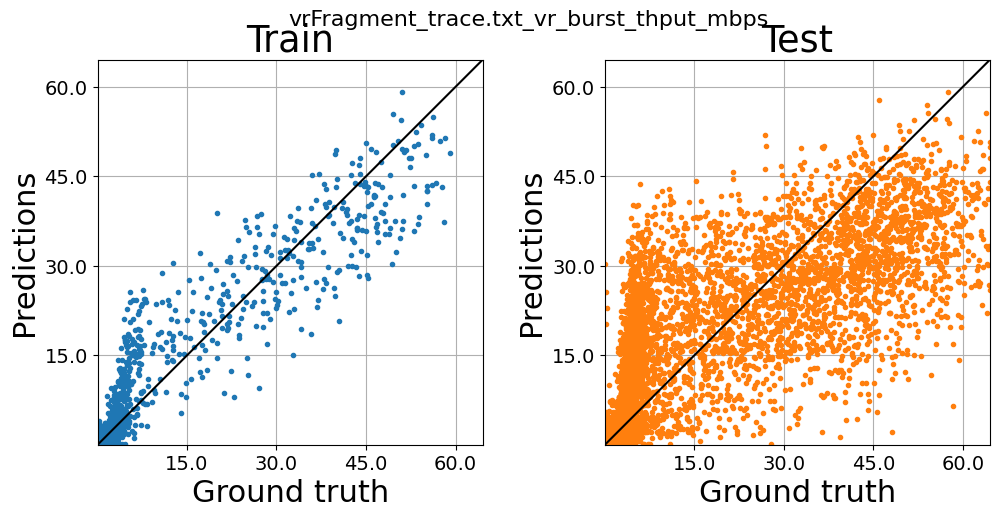



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23102, 470)
(9884, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18115  2880  1141   495   203]
After removing bins that are not populated enough
[0 1 2 3 4] [18115  2880  1141   495   203]
(22631, 460)
(22631,)
(22631,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8131 1021  365  168   99]
After removing bins that are not populated enough
[0 1 2 3 4] [8131 1021  365  168   99]
(9784, 460)
(9784,)
(9784,)
Train data shape (1000, 460)
Test data shape (7338, 460)
Val data shape (2446, 460)


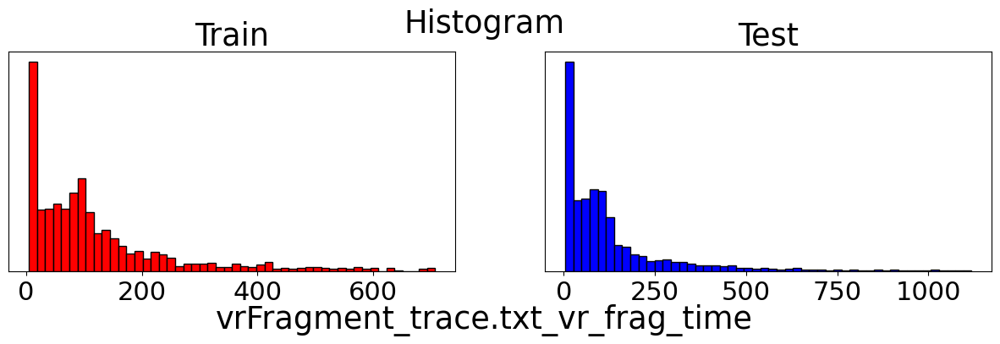

Time to process data for one learning task:  0.6877138614654541
Epoch: 10, Loss: 26154.4048046875
Epoch: 20, Loss: 13838.26246875
Epoch: 30, Loss: 6698.490455078125
Epoch: 40, Loss: 4910.35833203125
Epoch: 50, Loss: 4247.09778125
Epoch: 60, Loss: 3559.782904296875
Epoch: 70, Loss: 3016.8784453125
Epoch: 80, Loss: 3179.581630859375
Epoch: 90, Loss: 2989.621267578125
Epoch: 100, Loss: 2823.59985546875
Epoch: 110, Loss: 2613.68701953125
Epoch: 120, Loss: 2608.8348447265626
Epoch: 130, Loss: 2203.939689453125
Epoch: 140, Loss: 2102.038642578125
Epoch: 150, Loss: 1851.84609375
Epoch: 160, Loss: 1720.383146484375
Epoch: 170, Loss: 1662.677396484375
Epoch: 180, Loss: 1764.847935546875
Epoch: 190, Loss: 1483.1159013671875
Epoch: 200, Loss: 1611.684373046875
Epoch: 210, Loss: 1397.3193125
Epoch: 220, Loss: 1494.6654912109375
Epoch: 230, Loss: 1559.082033203125
Epoch: 240, Loss: 1285.076365234375
Epoch: 250, Loss: 1353.7475830078124
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/as

INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


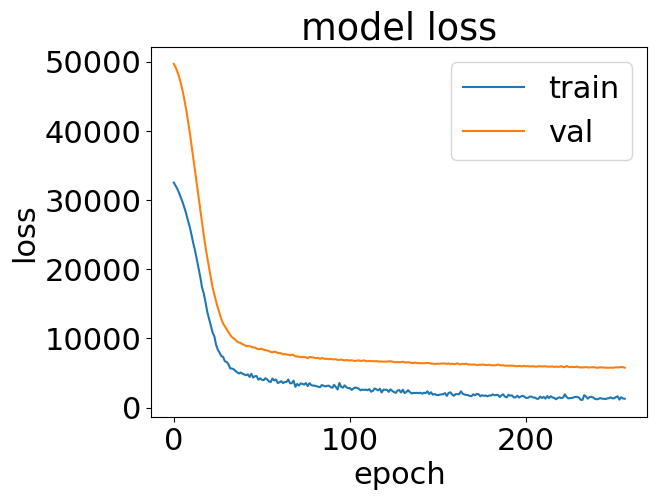

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  54.888235092163086


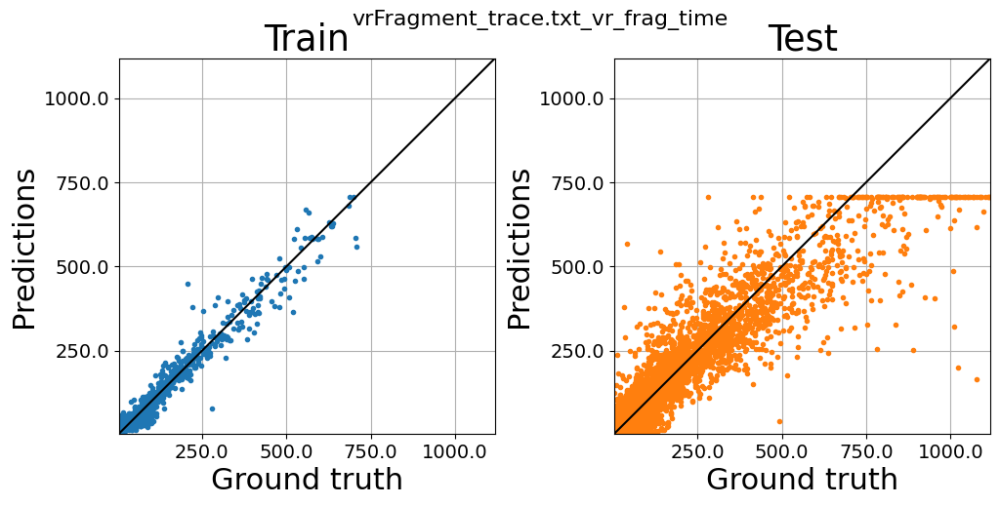



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23091, 470)
(9860, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18053  2874  1173   519   205]
After removing bins that are not populated enough
[0 1 2 3 4] [18053  2874  1173   519   205]
(22619, 460)
(22619,)
(22619,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8097 1033  366  164  101]
After removing bins that are not populated enough
[0 1 2 3 4] [8097 1033  366  164  101]
(9761, 460)
(9761,)
(9761,)
Train data shape (1000, 460)
Test data shape (7320, 460)
Val data shape (2441, 460)


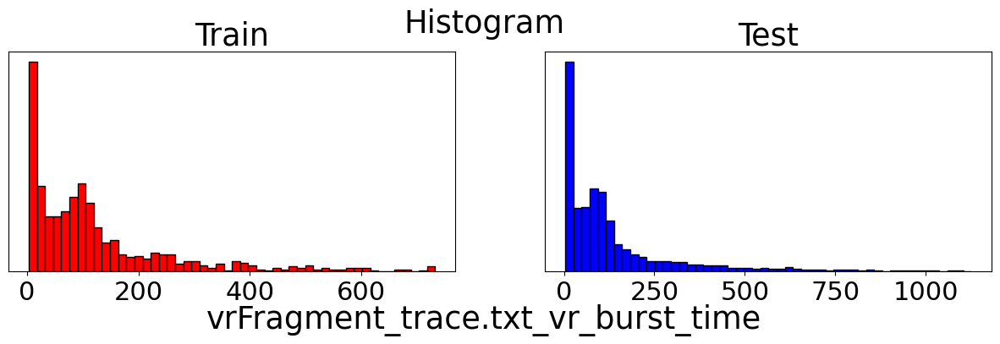

Time to process data for one learning task:  0.6765804290771484
Epoch: 10, Loss: 25315.840703125
Epoch: 20, Loss: 13348.017609375
Epoch: 30, Loss: 7297.80968359375
Epoch: 40, Loss: 5489.03996875
Epoch: 50, Loss: 5023.075396484375
Epoch: 60, Loss: 4495.536859375
Epoch: 70, Loss: 4020.96548046875
Epoch: 80, Loss: 3523.566390625
Epoch: 90, Loss: 3444.927859375
Epoch: 100, Loss: 3377.831123046875
Epoch: 110, Loss: 3071.492177734375
Epoch: 120, Loss: 2744.515029296875
Epoch: 130, Loss: 2608.0611640625
Epoch: 140, Loss: 2657.244595703125
Epoch: 150, Loss: 2640.612234375
Epoch: 160, Loss: 2212.0469921875
Epoch: 170, Loss: 1790.288087890625
Epoch: 180, Loss: 1897.353021484375
Epoch: 190, Loss: 2313.052591796875
Epoch: 200, Loss: 1860.5089140625
Epoch: 210, Loss: 2193.53884375
Epoch: 220, Loss: 1576.907107421875
Epoch: 230, Loss: 1615.4972690429688
Epoch: 240, Loss: 1230.512291015625
Epoch: 250, Loss: 1429.292587890625
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


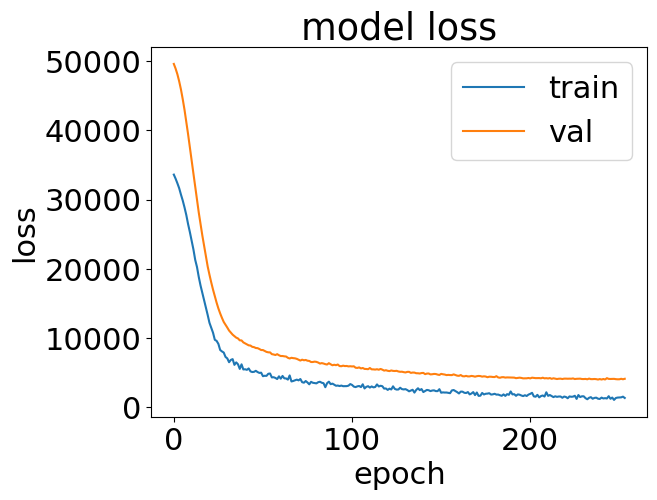

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  54.927239656448364


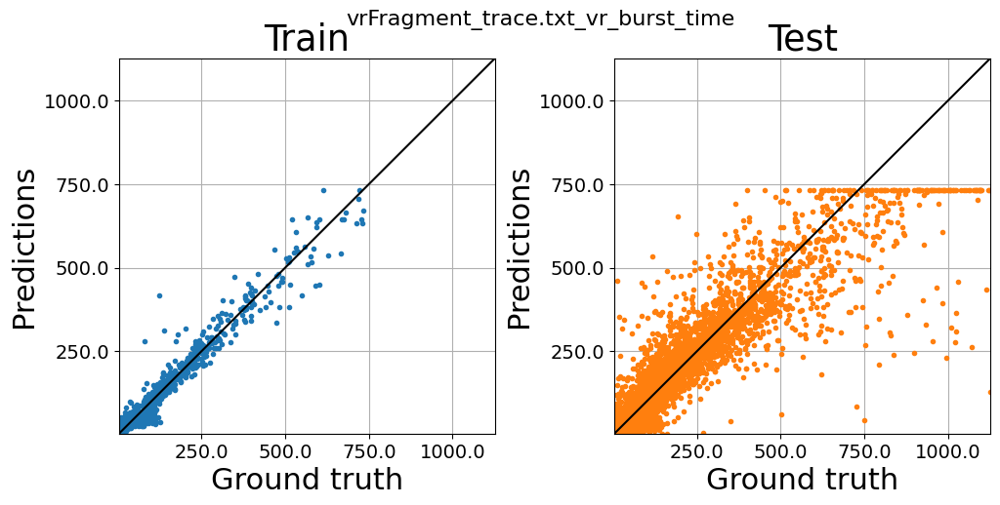



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1188884, 470)
(506826, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1166923    4767    2397    1637    1246]
After removing bins that are not populated enough
[0 1 2 3 4] [1166923    4767    2397    1637    1246]
(1166923, 460)
(1166923,)
(1166923,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [497309   2052   1067    743    572]
After removing bins that are not populated enough
[0 1 2 3 4] [497309   2052   1067    743    572]
(497309, 460)
(497309,)
(497309,)
Train data shape (1000, 460)
Test data shape (37

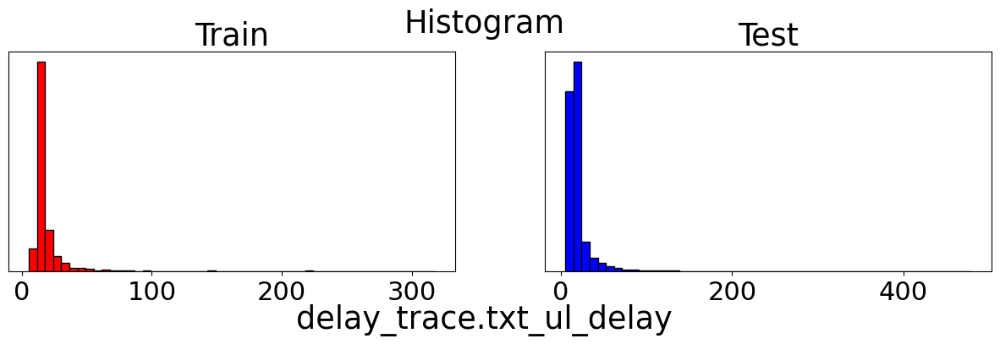

Time to process data for one learning task:  18.824493646621704
Epoch: 10, Loss: 743.710068359375
Epoch: 20, Loss: 542.2389965820313
Epoch: 30, Loss: 438.3926091308594
Epoch: 40, Loss: 390.3135622558594
Epoch: 50, Loss: 343.2593178100586
Epoch: 60, Loss: 304.53607763671874
Epoch: 70, Loss: 268.9705002441406
Epoch: 80, Loss: 246.25873483276368
Epoch: 90, Loss: 212.37239453125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


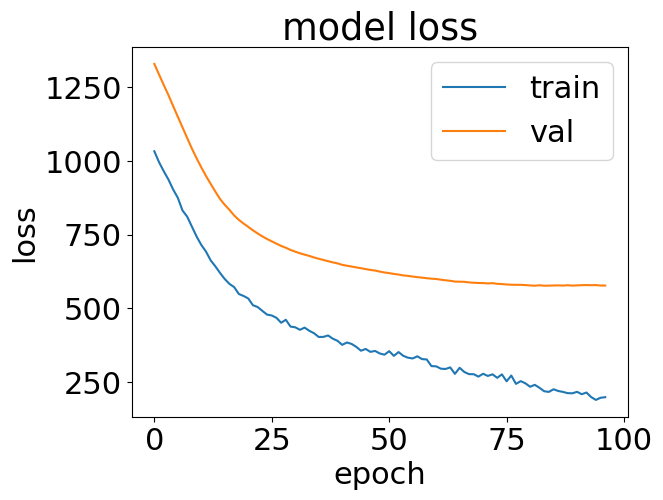

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  484.7701094150543


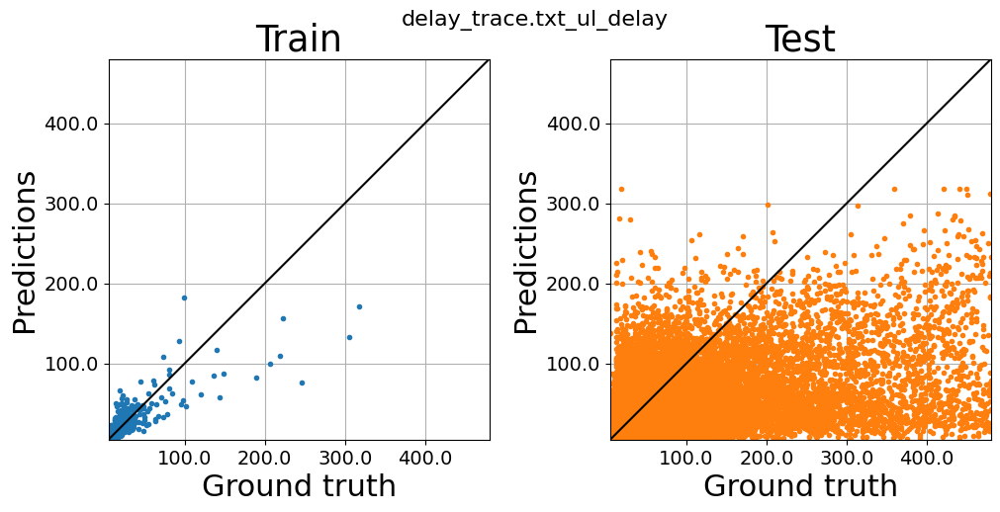



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257584, 470)
(538949, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1155659   50612   20681   10561    5892]
After removing bins that are not populated enough
[0 1 2 3 4] [1155659   50612   20681   10561    5892]
(1226952, 460)
(1226952,)
(1226952,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [494481  21790   9273   4576   2792]
After removing bins that are not populated enough
[0 1 2 3 4] [494481  21790   9273   4576   2792]
(525544, 460)
(525544,)
(525544,)
Train data shape (1000, 460)
Test data shape (39

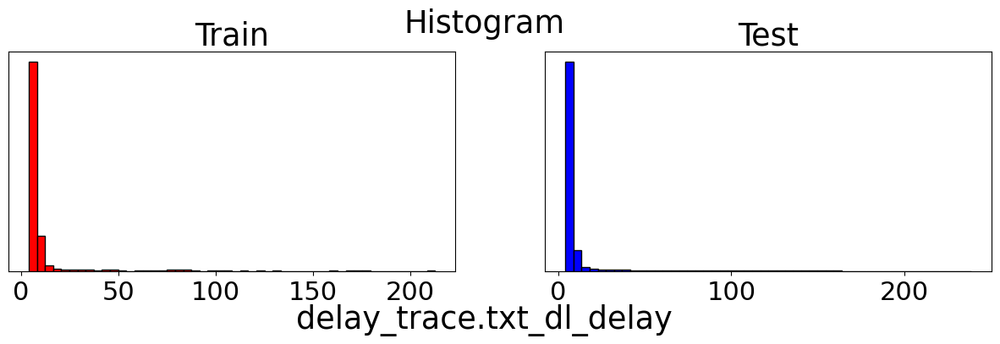

Time to process data for one learning task:  19.95420217514038
Epoch: 10, Loss: 708.9697260742188
Epoch: 20, Loss: 415.0739364013672
Epoch: 30, Loss: 260.50860736083985
Epoch: 40, Loss: 204.1142275390625
Epoch: 50, Loss: 166.53798388671876
Epoch: 60, Loss: 141.4851845703125
Epoch: 70, Loss: 124.80517288208007
Epoch: 80, Loss: 115.36711114501954
Epoch: 90, Loss: 106.33649645996094
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


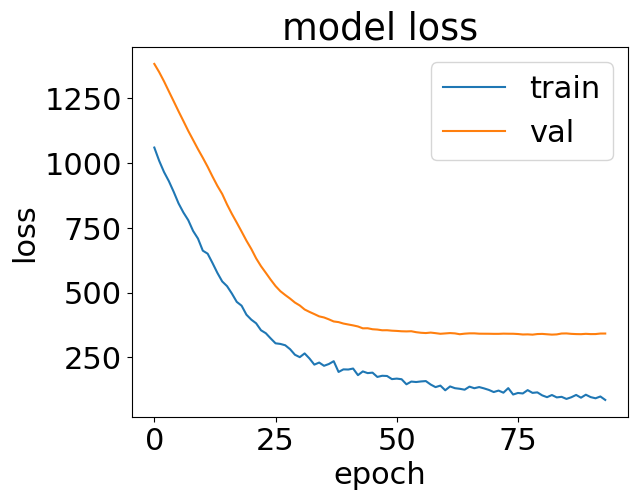

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  503.7945234775543


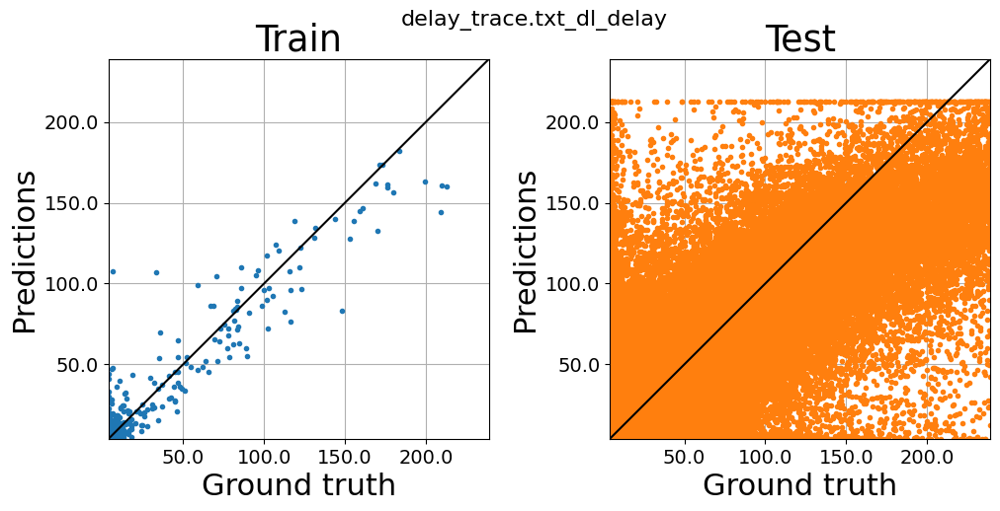



===============================  DONE  ===================================================
============================= Train set mean over runs ===================================
                                                MAE      MAPE        R2
dashClient_trace.txt_newBitRate_bps        0.888000  0.865409  0.917224
vrFragment_trace.txt_vr_frag_thput_mbps    0.194728  2.070551  0.397407
vrFragment_trace.txt_vr_burst_thput_mbps   4.219418  0.811938  0.838172
vrFragment_trace.txt_vr_frag_time         36.357128  0.548988  0.859113
vrFragment_trace.txt_vr_burst_time        21.472061  0.458274  0.952168
delay_trace.txt_ul_delay                   6.969683  0.300152  0.627131
delay_trace.txt_dl_delay                   4.178875  0.375754  0.896547
=============================== Test set results =========================================
                                                             MAE  \
dashClient_trace.txt_newBitRate_bps          [0.844 0.853 0.825]   
vrFragment_tr

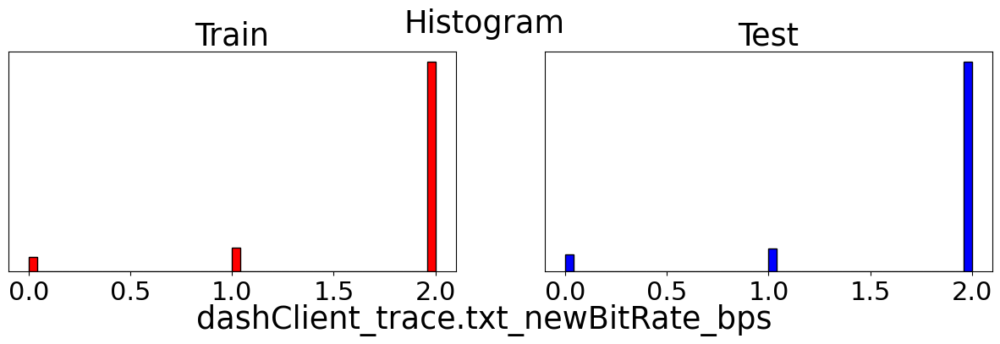

Time to process data for one learning task:  2.2038142681121826
Epoch: 10, Loss: 0.3939459812760353
Epoch: 20, Loss: 0.3521988006591797
Epoch: 30, Loss: 0.32559628353118897
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


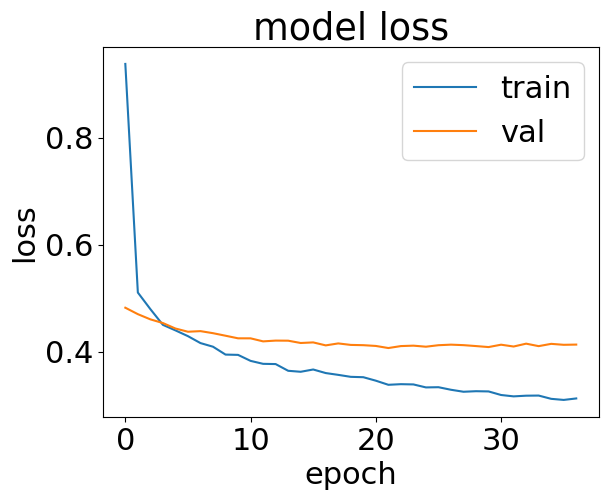

Time to train model:  49.30266809463501


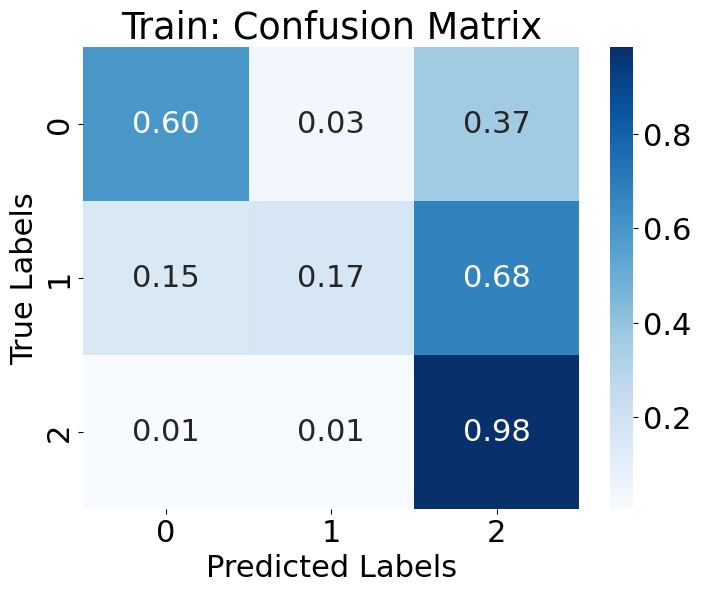

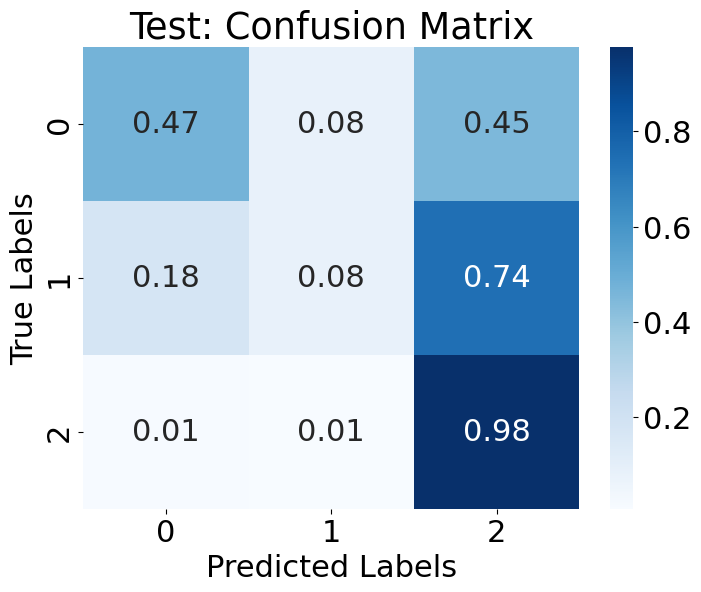



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23075, 470)
(9911, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15928  1948  1794  2091  1068]
After removing bins that are not populated enough
[0 1 2 3 4] [15928  1948  1794  2091  1068]
(22829, 460)
(22829,)
(22829,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6368  860  853 1208  500]
After removing bins that are not populated enough
[0 1 2 3 4] [6368  860  853 1208  500]
(9789, 460)
(9789,)
(9789,)
Train data shape (10000, 460)
Test data shape (7341, 460)
Val data shape (2448, 460)


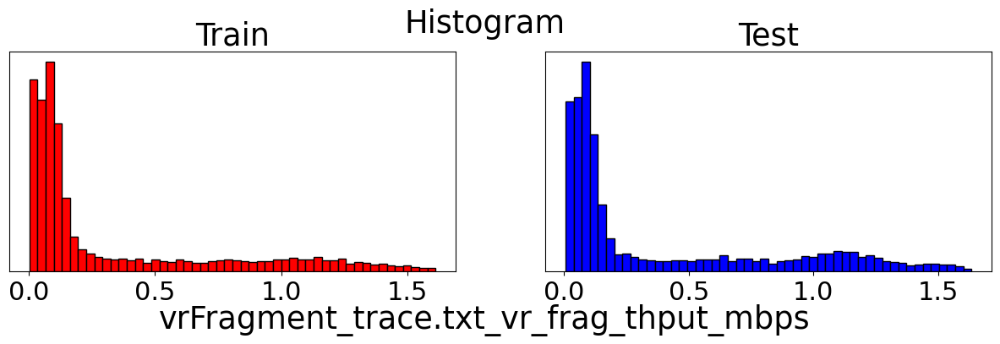

Time to process data for one learning task:  0.6634750366210938
Epoch: 10, Loss: 0.4276392687797546
Epoch: 20, Loss: 0.22760808596611024
Epoch: 30, Loss: 0.1369365146636963
Epoch: 40, Loss: 0.09599387609958648
Epoch: 50, Loss: 0.07690504517555237
Epoch: 60, Loss: 0.07141299493312836
Epoch: 70, Loss: 0.06656460944414139
Epoch: 80, Loss: 0.06311771567463875
Epoch: 90, Loss: 0.05867727658748627
Epoch: 100, Loss: 0.05503724844455719
Epoch: 110, Loss: 0.05230539426803589
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


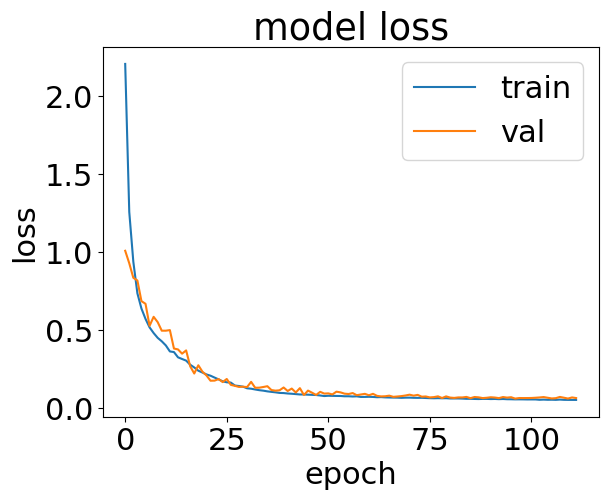

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  104.35576248168945


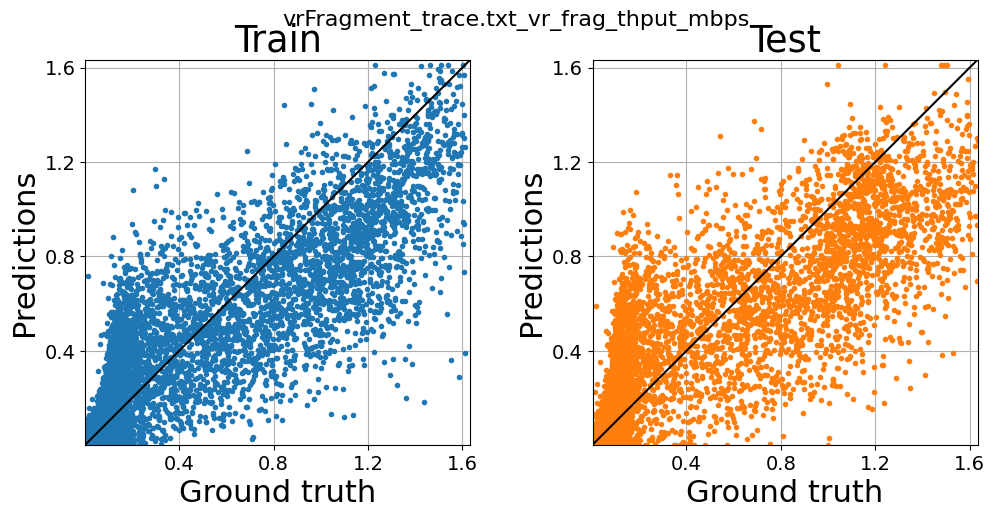



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23044, 470)
(9907, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [16004  1885  1899  1972  1040]
After removing bins that are not populated enough
[0 1 2 3 4] [16004  1885  1899  1972  1040]
(22800, 460)
(22800,)
(22800,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6420  779  897 1092  597]
After removing bins that are not populated enough
[0 1 2 3 4] [6420  779  897 1092  597]
(9785, 460)
(9785,)
(9785,)
Train data shape (10000, 460)
Test data shape (7338, 460)
Val data shape (2447, 460)


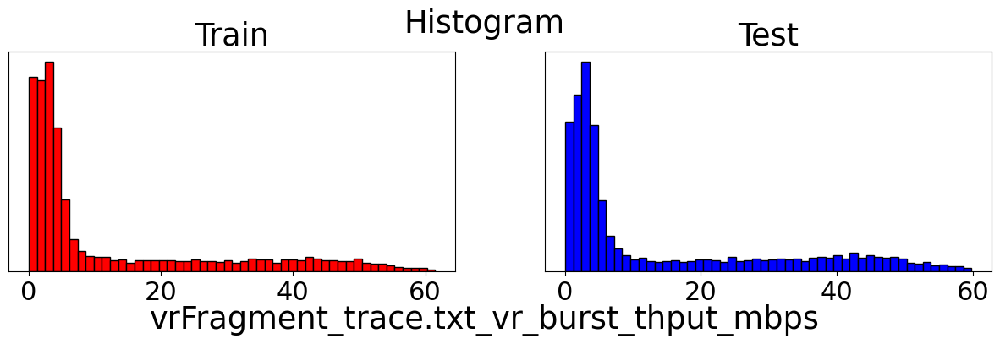

Time to process data for one learning task:  0.6316115856170654
Epoch: 10, Loss: 89.45068995361328
Epoch: 20, Loss: 76.86729592285157
Epoch: 30, Loss: 68.61264128417969
Epoch: 40, Loss: 65.5615736694336
Epoch: 50, Loss: 60.554593173217775
Epoch: 60, Loss: 58.033583074951174
Epoch: 70, Loss: 54.90114512939453
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


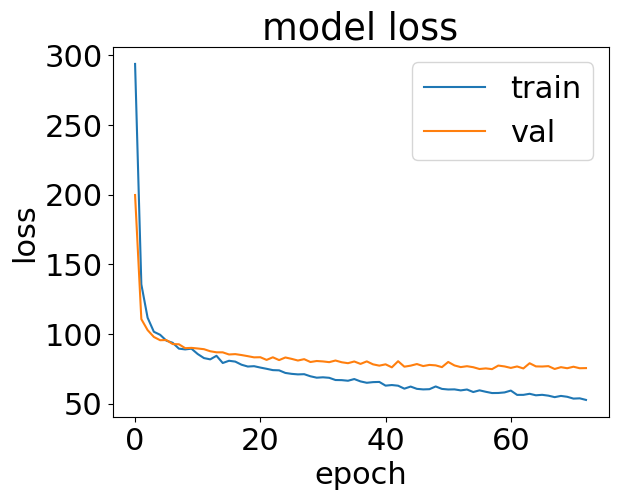

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  72.83191466331482


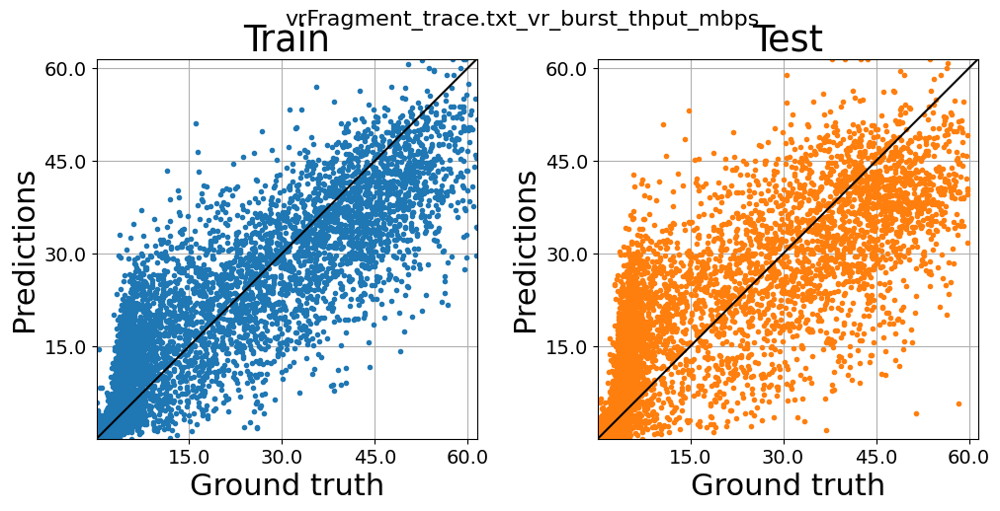



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23075, 470)
(9911, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18298  2747  1090   470   224]
After removing bins that are not populated enough
[0 1 2 3 4] [18298  2747  1090   470   224]
(22605, 460)
(22605,)
(22605,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7960 1164  428  147   90]
After removing bins that are not populated enough
[0 1 2 3 4] [7960 1164  428  147   90]
(9699, 460)
(9699,)
(9699,)
Train data shape (10000, 460)
Test data shape (7274, 460)
Val data shape (2425, 460)


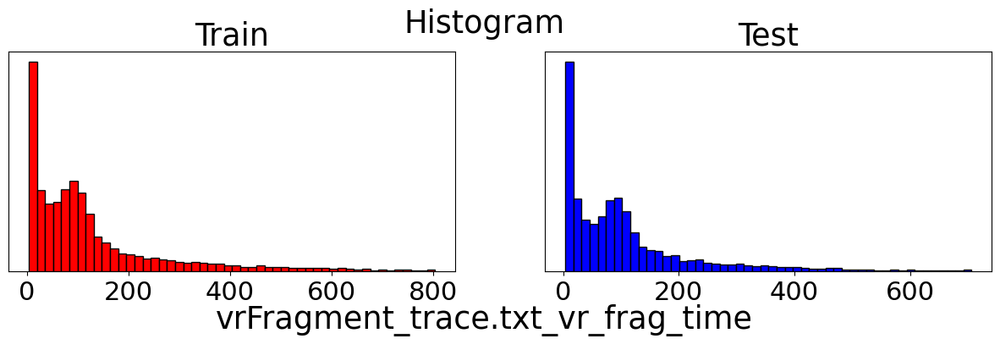

Time to process data for one learning task:  0.6336002349853516
Epoch: 10, Loss: 4741.6859671875
Epoch: 20, Loss: 3484.18992265625
Epoch: 30, Loss: 2989.640908203125
Epoch: 40, Loss: 2807.3067869140623
Epoch: 50, Loss: 2562.374350390625
Epoch: 60, Loss: 2409.163022265625
Epoch: 70, Loss: 2194.3806921875
Epoch: 80, Loss: 2205.581895703125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


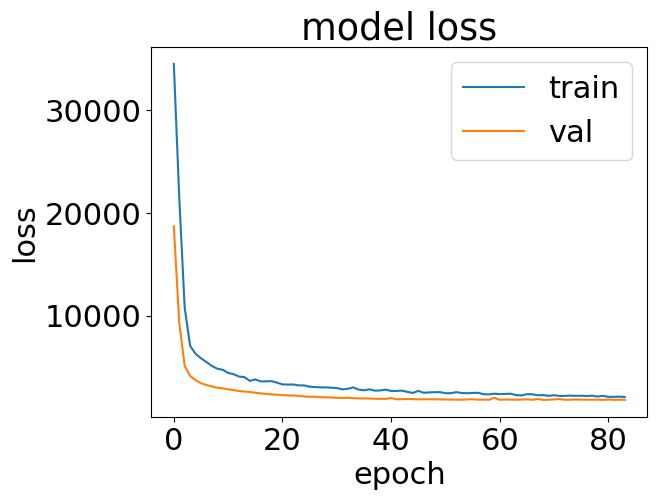

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  82.31331777572632


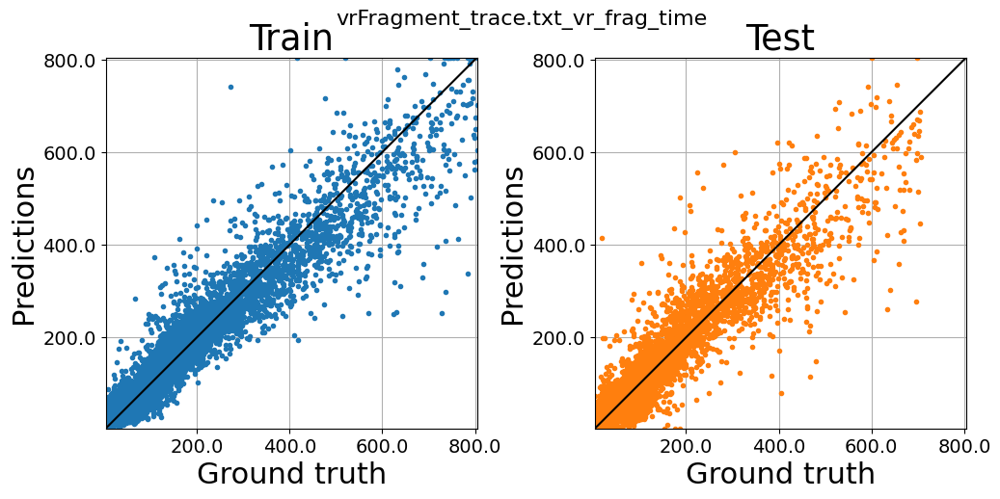



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23044, 470)
(9907, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18207  2759  1120   483   231]
After removing bins that are not populated enough
[0 1 2 3 4] [18207  2759  1120   483   231]
(22800, 460)
(22800,)
(22800,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7950 1167  436  143   89]
After removing bins that are not populated enough
[0 1 2 3 4] [7950 1167  436  143   89]
(9696, 460)
(9696,)
(9696,)
Train data shape (10000, 460)
Test data shape (7272, 460)
Val data shape (2424, 460)


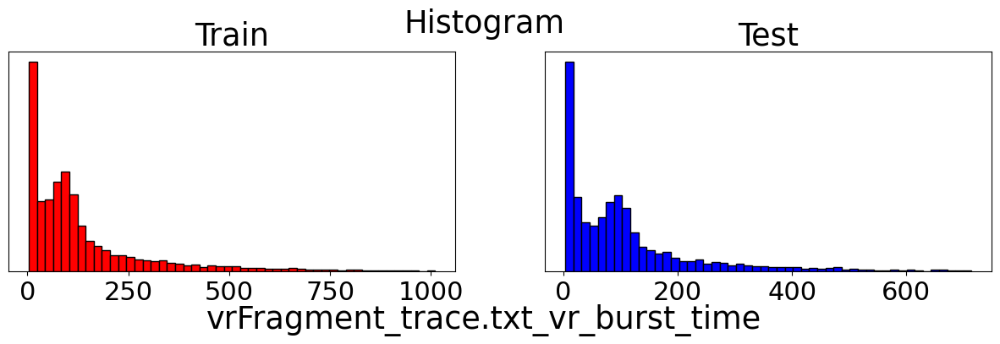

Time to process data for one learning task:  0.6482079029083252
Epoch: 10, Loss: 6094.4939171875
Epoch: 20, Loss: 4350.576601171875
Epoch: 30, Loss: 3869.094258984375
Epoch: 40, Loss: 3518.05869921875
Epoch: 50, Loss: 3435.3870171875
Epoch: 60, Loss: 3098.832510839844
Epoch: 70, Loss: 2949.30871796875
Epoch: 80, Loss: 2831.52595078125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


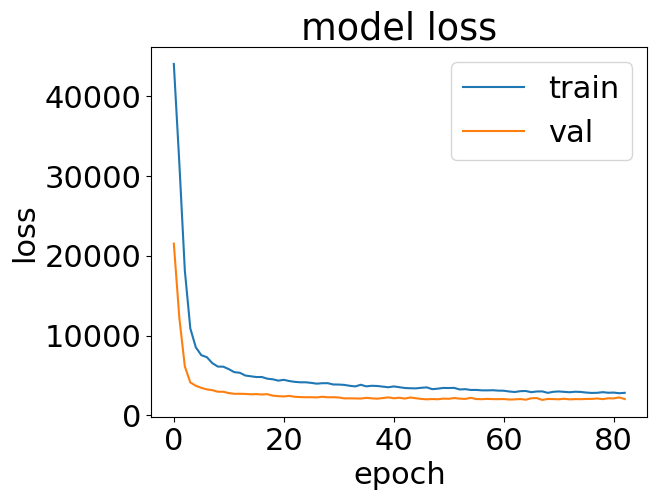

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  81.2496690750122


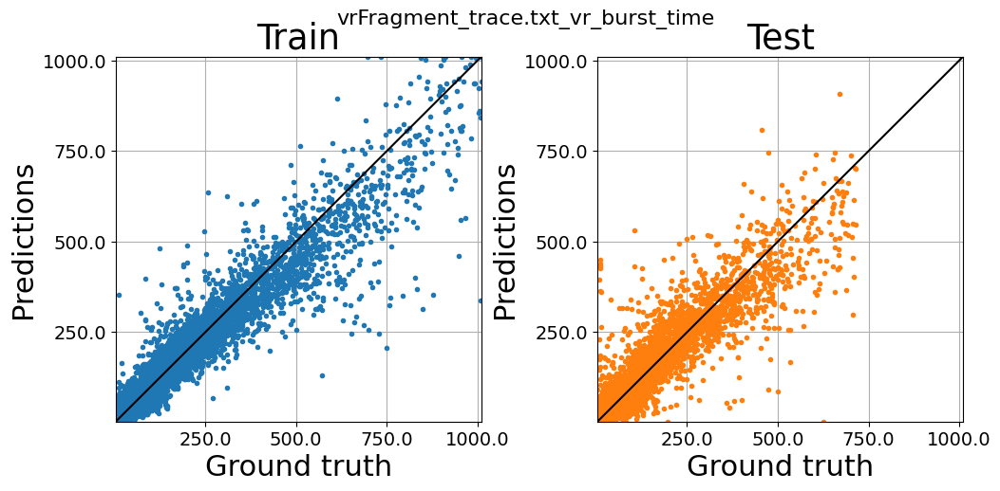



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1188590, 470)
(507120, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1166668    4703    2405    1638    1262]
After removing bins that are not populated enough
[0 1 2 3 4] [1166668    4703    2405    1638    1262]
(1166668, 460)
(1166668,)
(1166668,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [497555   2084   1068    766    564]
After removing bins that are not populated enough
[0 1 2 3 4] [497555   2084   1068    766    564]
(497555, 460)
(497555,)
(497555,)
Train data shape (10000, 460)
Test data shape (3

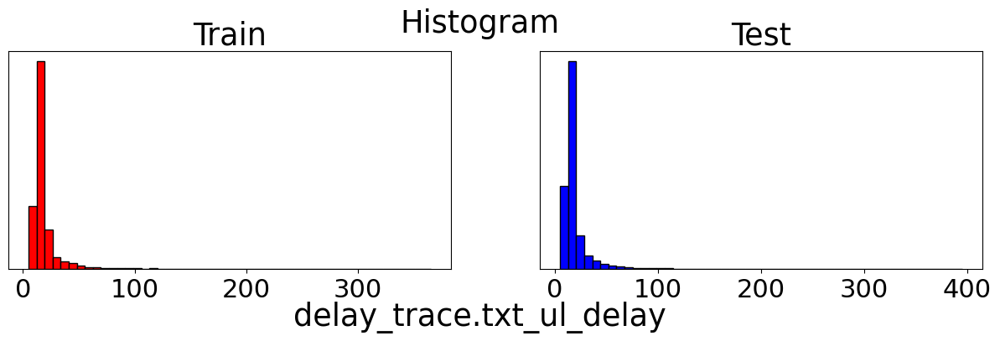

Time to process data for one learning task:  18.560811281204224
Epoch: 10, Loss: 313.44580180664065
Epoch: 20, Loss: 282.0582254333496
Epoch: 30, Loss: 263.6617671630859
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


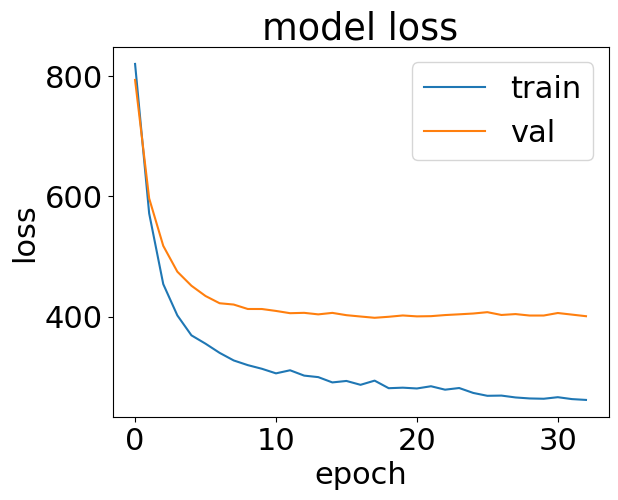

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  216.62735414505005


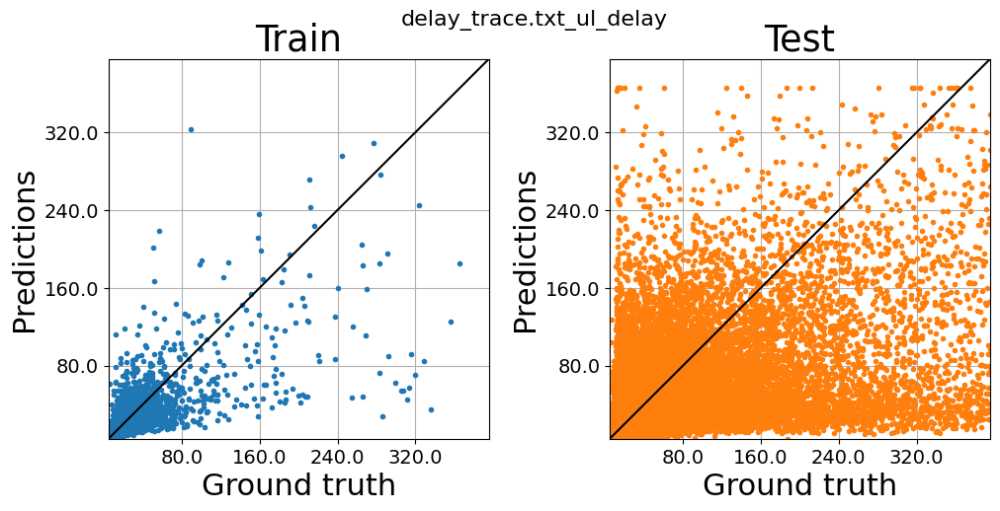



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257547, 470)
(538986, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1155107   50461   20970   10590    6164]
After removing bins that are not populated enough
[0 1 2 3 4] [1155107   50461   20970   10590    6164]
(1226538, 460)
(1226538,)
(1226538,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [495357  21621   9056   4474   2518]
After removing bins that are not populated enough
[0 1 2 3 4] [495357  21621   9056   4474   2518]
(526034, 460)
(526034,)
(526034,)
Train data shape (10000, 460)
Test data shape (3

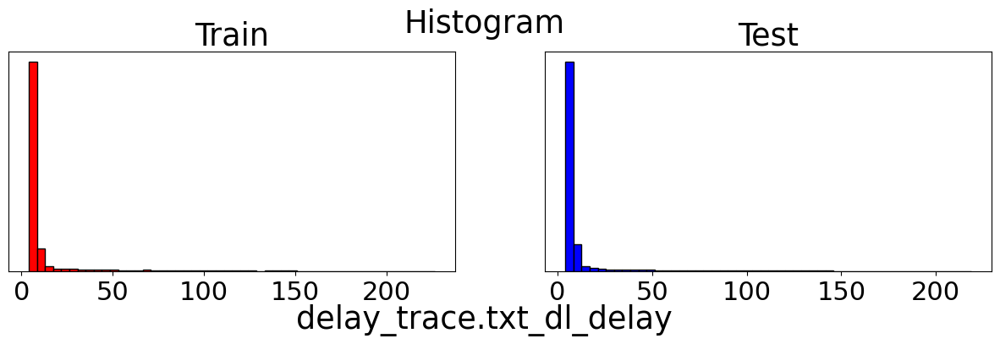

Time to process data for one learning task:  19.727058172225952
Epoch: 10, Loss: 284.9109953613281
Epoch: 20, Loss: 237.93675400390626
Epoch: 30, Loss: 212.84955688476563
Epoch: 40, Loss: 203.69050323791504
Epoch: 50, Loss: 179.2543709716797
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


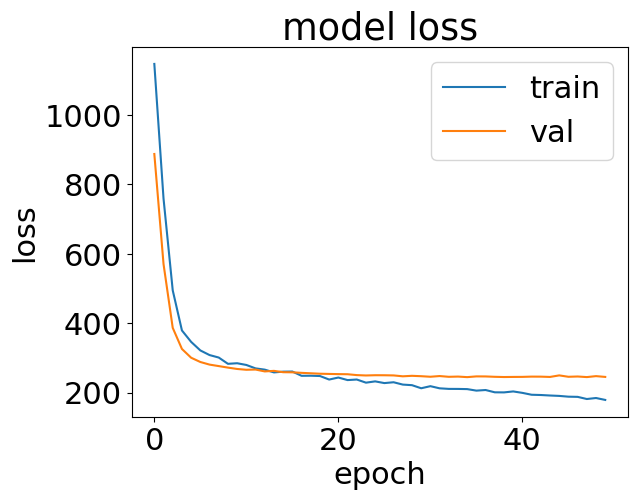

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  321.7493426799774


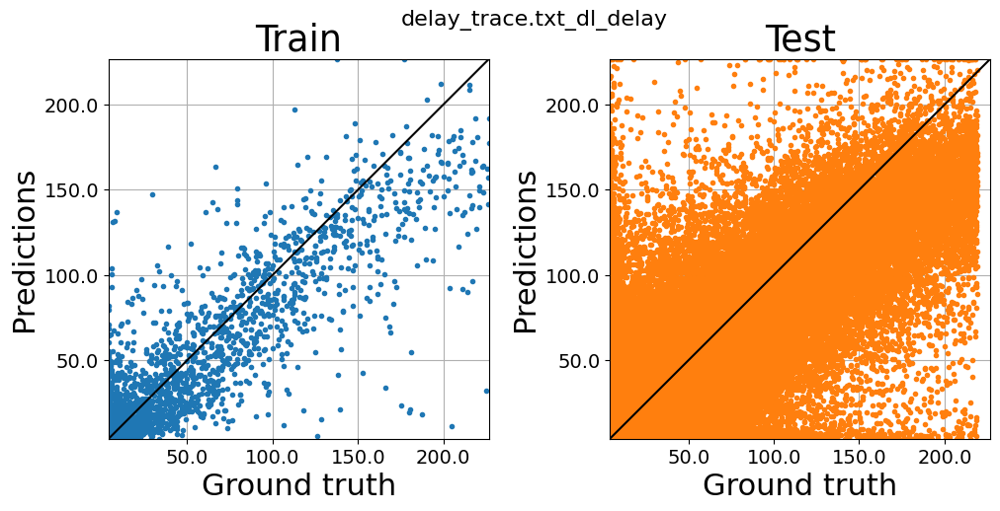



===============================  DONE  ===================================================
Random iteration:  1
# train runs used  7
# test runs used  3
Concatenating runs:  [20 19 12 16 11 14 13]
Time to read csv file for run:  15.288985967636108
Loaded run 20
Time to read csv file for run:  15.688005685806274
Loaded run 19
Time to read csv file for run:  15.780855655670166
Loaded run 12
Time to read csv file for run:  15.558106422424316
Loaded run 16
Time to read csv file for run:  16.029330015182495
Loaded run 11
Time to read csv file for run:  15.431657552719116
Loaded run 14
Time to read csv file for run:  14.676602840423584
Loaded run 13
Concatenating runs:  [18 15 17]
Time to read csv file for run:  15.689510583877563
Loaded run 18
Time to read csv file for run:  15.564045667648315
Loaded run 15
Time to read csv file for run:  15.969522476196289
Loaded run 17
Time to read data:  399.5066337585449
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping row

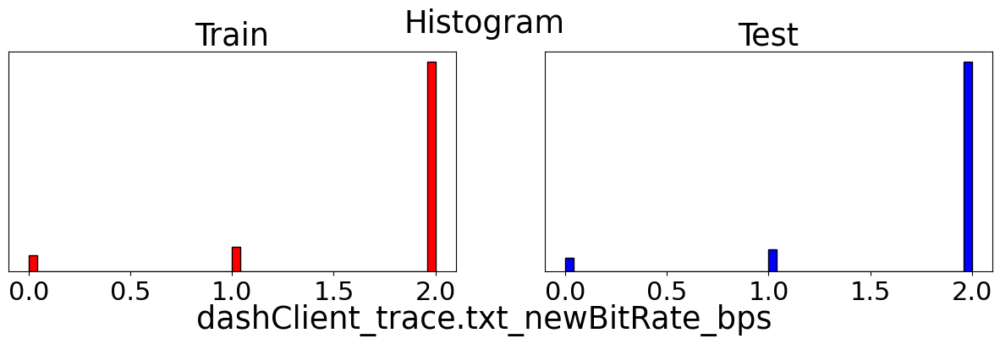

Time to process data for one learning task:  2.3870315551757812
Epoch: 10, Loss: 0.4067012456893921
Epoch: 20, Loss: 0.36102209620475767
Epoch: 30, Loss: 0.33319783020019533
Epoch: 40, Loss: 0.30998391287326815
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


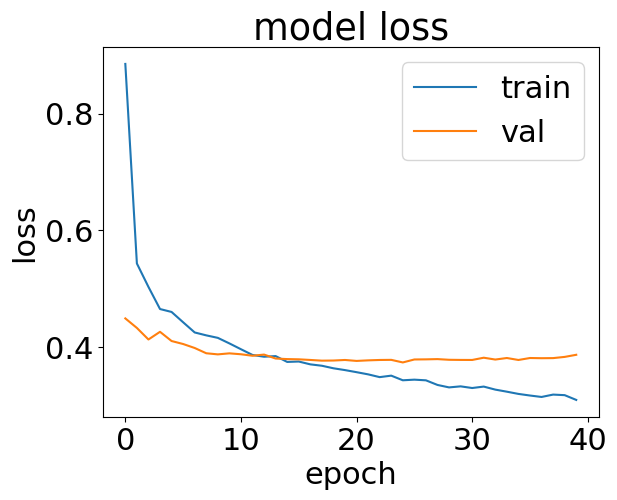

Time to train model:  55.51652216911316


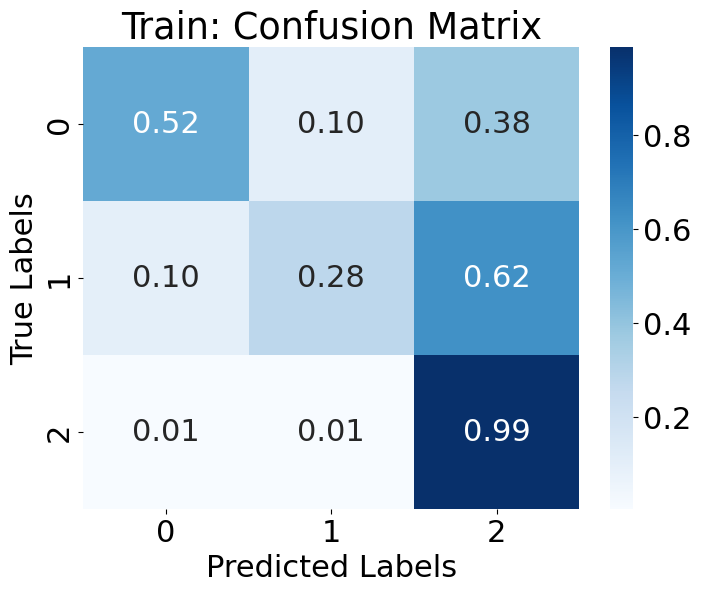

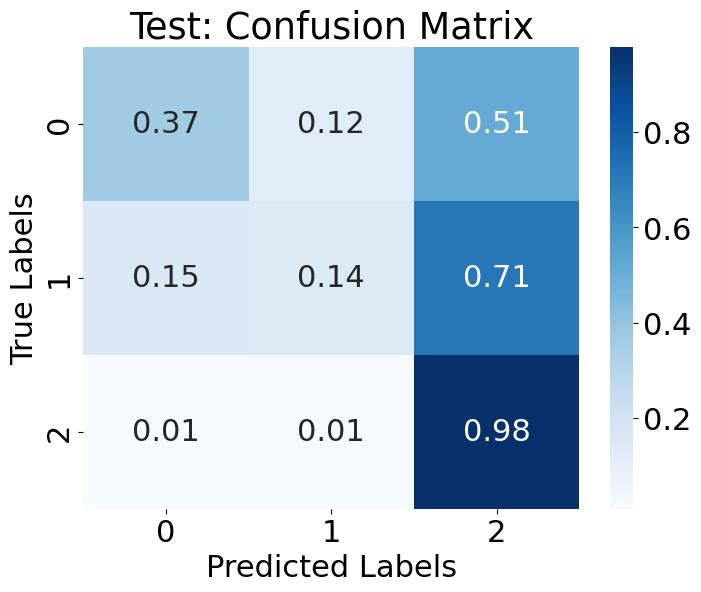



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23063, 470)
(9923, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [14874  2065  2057  2630  1172]
After removing bins that are not populated enough
[0 1 2 3 4] [14874  2065  2057  2630  1172]
(22798, 460)
(22798,)
(22798,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7394  739  619  672  395]
After removing bins that are not populated enough
[0 1 2 3 4] [7394  739  619  672  395]
(9819, 460)
(9819,)
(9819,)
Train data shape (10000, 460)
Test data shape (7364, 460)
Val data shape (2455, 460)


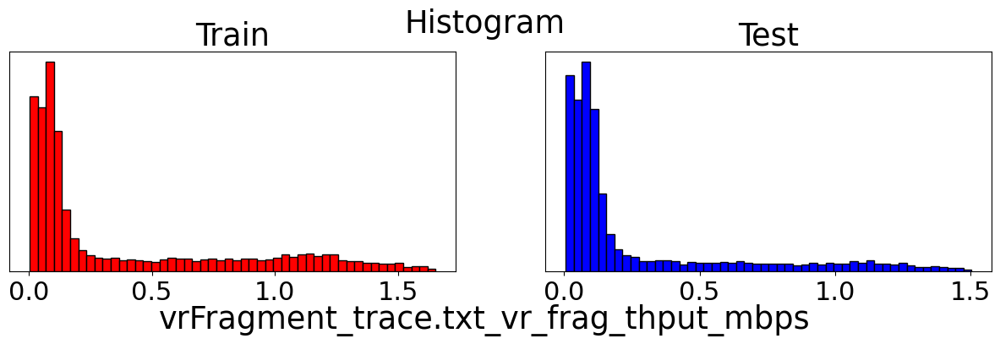

Time to process data for one learning task:  0.6733098030090332
Epoch: 10, Loss: 0.32193980746269224
Epoch: 20, Loss: 0.14946985445022584
Epoch: 30, Loss: 0.10682326211929322
Epoch: 40, Loss: 0.09082193404436112
Epoch: 50, Loss: 0.0844584888458252
Epoch: 60, Loss: 0.07820704343318939
Epoch: 70, Loss: 0.07193664501905442
Epoch: 80, Loss: 0.06774093880653381
Epoch: 90, Loss: 0.0640361533075571
Epoch: 100, Loss: 0.06218837629854679
Epoch: 110, Loss: 0.05915268912315369
Epoch: 120, Loss: 0.0568763922393322
Epoch: 130, Loss: 0.053592796063423154
Epoch: 140, Loss: 0.05578154591321945
Epoch: 150, Loss: 0.051328368520736696
Epoch: 160, Loss: 0.049066514301300046
Epoch: 170, Loss: 0.04862128867506981
Epoch: 180, Loss: 0.04598197121620178
Epoch: 190, Loss: 0.045814789354801176
Epoch: 200, Loss: 0.04326274968385697
Epoch: 210, Loss: 0.04426627913713455
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


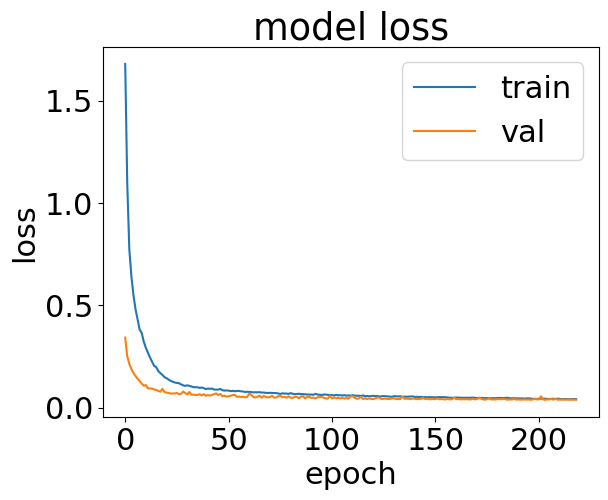

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  197.1377284526825


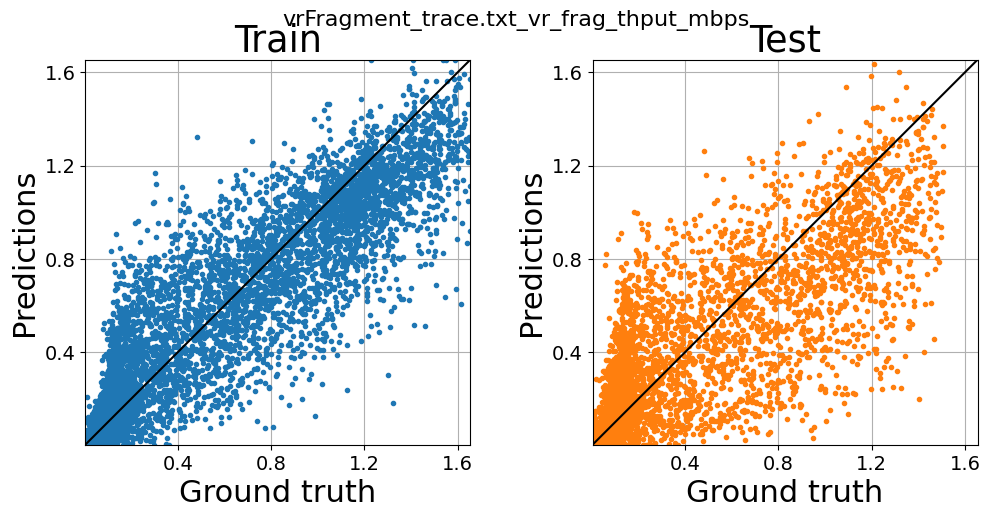



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23032, 470)
(9919, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [14940  1995  2190  2473  1172]
After removing bins that are not populated enough
[0 1 2 3 4] [14940  1995  2190  2473  1172]
(22770, 460)
(22770,)
(22770,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7451  716  617  631  400]
After removing bins that are not populated enough
[0 1 2 3 4] [7451  716  617  631  400]
(9815, 460)
(9815,)
(9815,)
Train data shape (10000, 460)
Test data shape (7361, 460)
Val data shape (2454, 460)


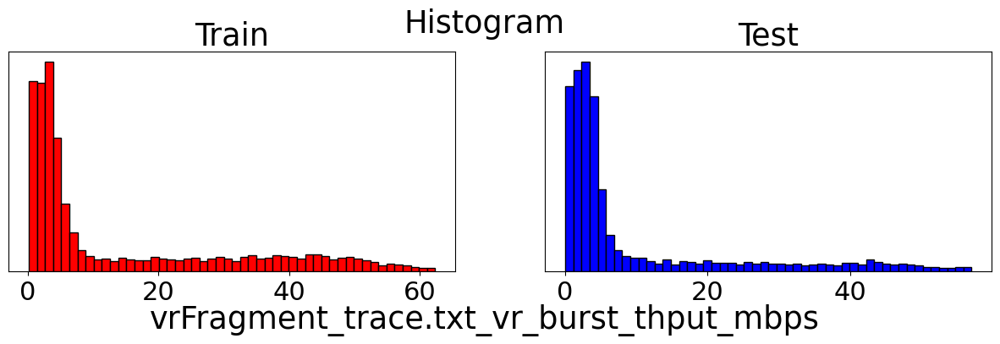

Time to process data for one learning task:  0.6463794708251953
Epoch: 10, Loss: 91.56186186523438
Epoch: 20, Loss: 80.02554091796875
Epoch: 30, Loss: 73.46002778320313
Epoch: 40, Loss: 68.54373405761719
Epoch: 50, Loss: 65.74712985839844
Epoch: 60, Loss: 61.4038830078125
Epoch: 70, Loss: 58.85054012451172
Epoch: 80, Loss: 56.757446728515625
Epoch: 90, Loss: 53.135308349609375
Epoch: 100, Loss: 54.108761376953126
Epoch: 110, Loss: 50.26642573242187
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


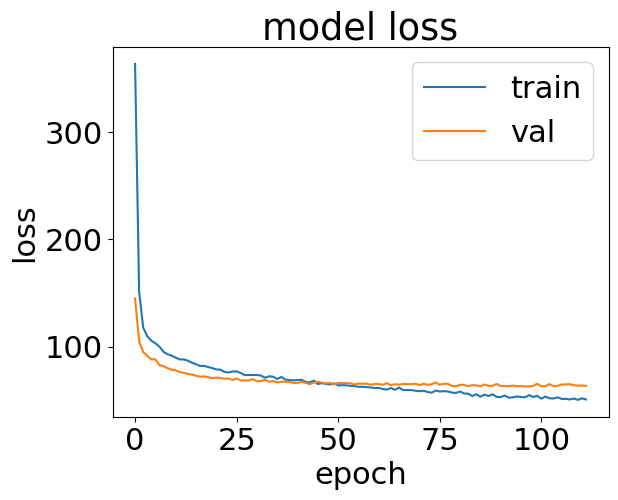

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  108.53718733787537


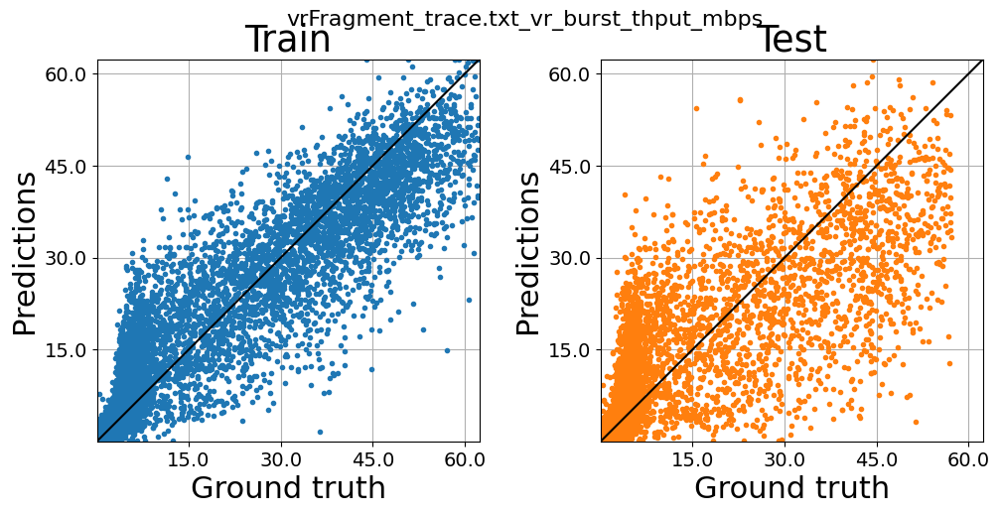



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23063, 470)
(9923, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18841  2484   871   391   211]
After removing bins that are not populated enough
[0 1 2 3 4] [18841  2484   871   391   211]
(22587, 460)
(22587,)
(22587,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7416 1413  614  279   97]
After removing bins that are not populated enough
[0 1 2 3 4] [7416 1413  614  279   97]
(9722, 460)
(9722,)
(9722,)
Train data shape (10000, 460)
Test data shape (7291, 460)
Val data shape (2431, 460)


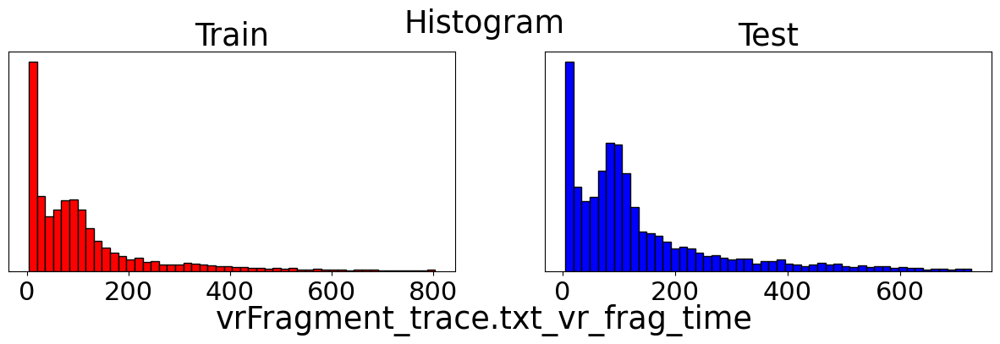

Time to process data for one learning task:  0.659989595413208
Epoch: 10, Loss: 3633.6702837890625
Epoch: 20, Loss: 2811.56225625
Epoch: 30, Loss: 2457.5861712890623
Epoch: 40, Loss: 2211.334683203125
Epoch: 50, Loss: 2046.083332421875
Epoch: 60, Loss: 1930.981891015625
Epoch: 70, Loss: 1879.1784646484375
Epoch: 80, Loss: 1738.780687890625
Epoch: 90, Loss: 1706.883301953125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


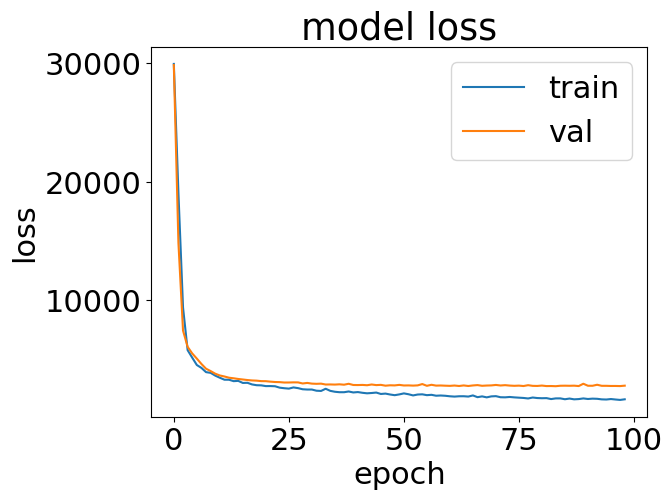

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  99.12734985351562


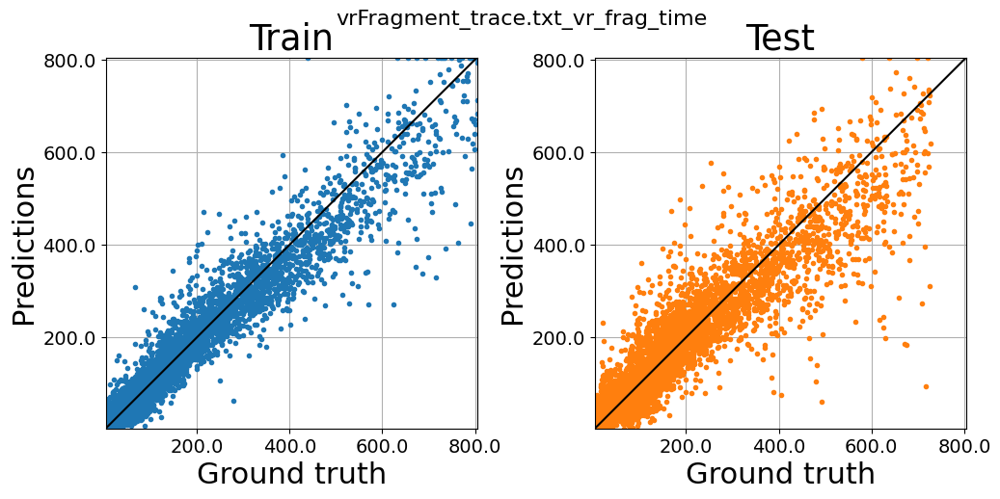



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23032, 470)
(9919, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18792  2494   884   383   217]
After removing bins that are not populated enough
[0 1 2 3 4] [18792  2494   884   383   217]
(22553, 460)
(22553,)
(22553,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7372 1412  625  304  102]
After removing bins that are not populated enough
[0 1 2 3 4] [7372 1412  625  304  102]
(9815, 460)
(9815,)
(9815,)
Train data shape (10000, 460)
Test data shape (7361, 460)
Val data shape (2454, 460)


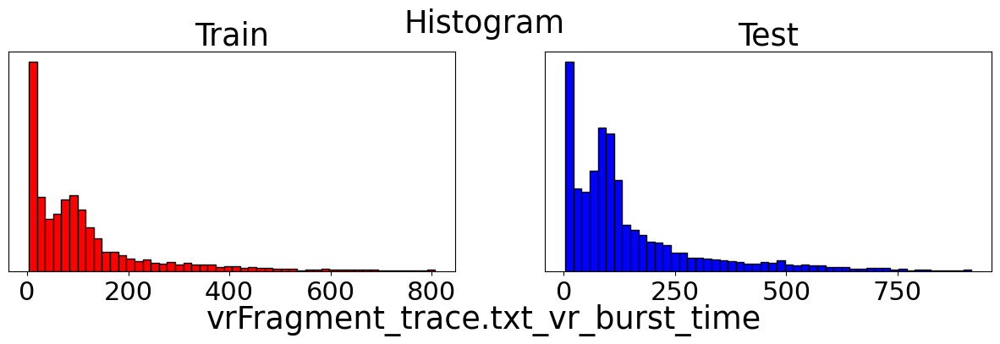

Time to process data for one learning task:  0.666426420211792
Epoch: 10, Loss: 3673.9055455078123
Epoch: 20, Loss: 2824.2660087890627
Epoch: 30, Loss: 2380.82745546875
Epoch: 40, Loss: 2192.02634921875
Epoch: 50, Loss: 2048.843022265625
Epoch: 60, Loss: 1957.49806171875
Epoch: 70, Loss: 1780.5491921875
Epoch: 80, Loss: 1764.36103203125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


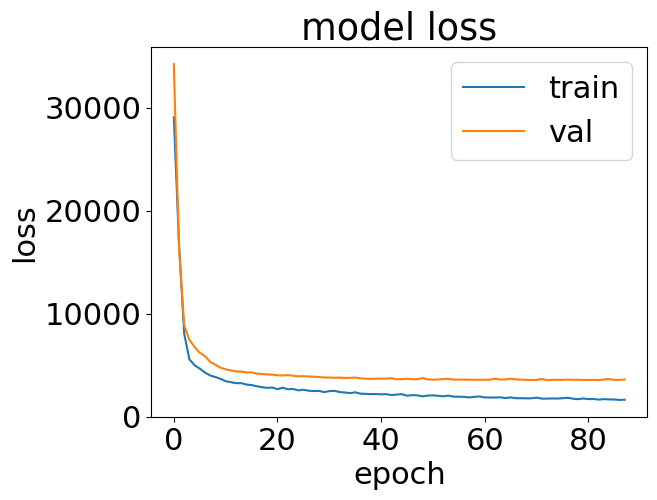

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  91.23175859451294


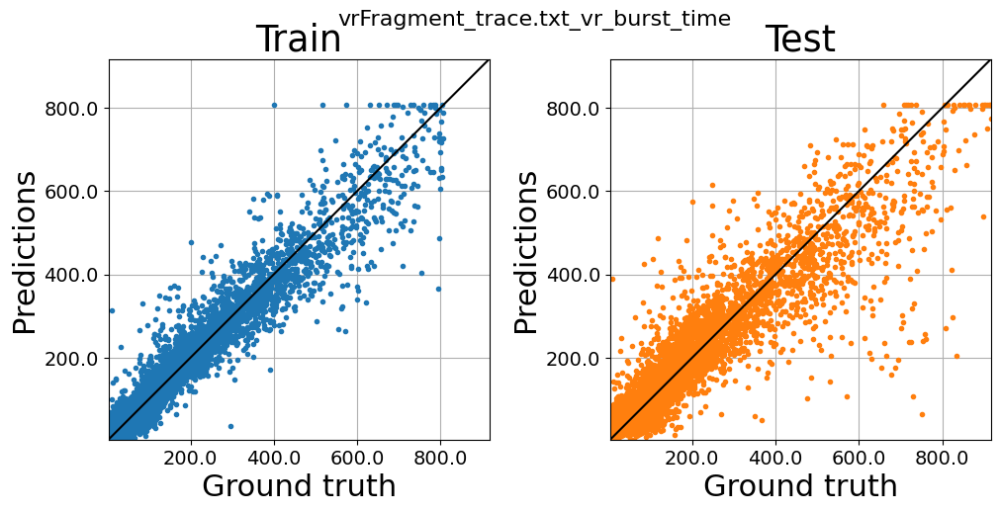



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1187110, 470)
(508600, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1165120    4760    2420    1661    1250]
After removing bins that are not populated enough
[0 1 2 3 4] [1165120    4760    2420    1661    1250]
(1165120, 460)
(1165120,)
(1165120,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [499082   2045   1055    737    584]
After removing bins that are not populated enough
[0 1 2 3 4] [499082   2045   1055    737    584]
(499082, 460)
(499082,)
(499082,)
Train data shape (10000, 460)
Test data shape (3

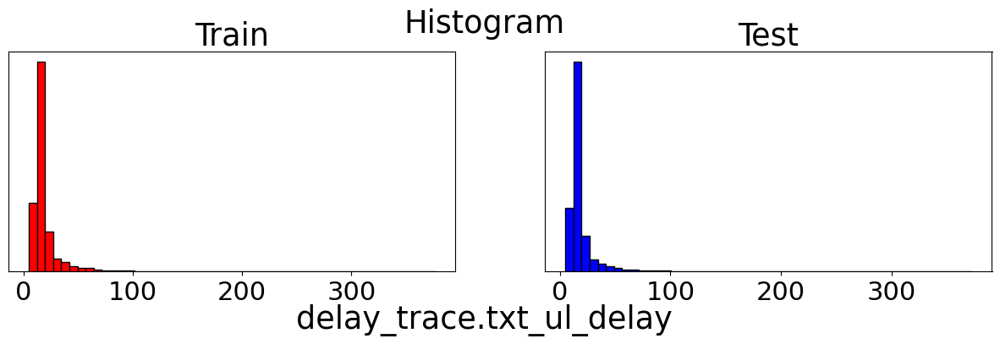

Time to process data for one learning task:  18.576011180877686
Epoch: 10, Loss: 364.23606931152347
Epoch: 20, Loss: 317.4925674316406
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


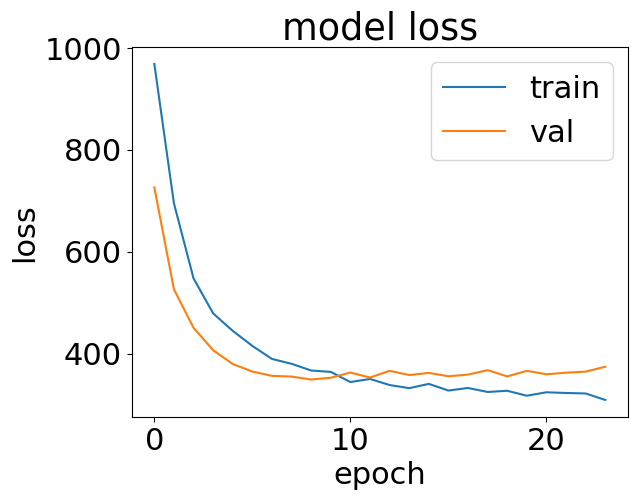

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  174.163996219635


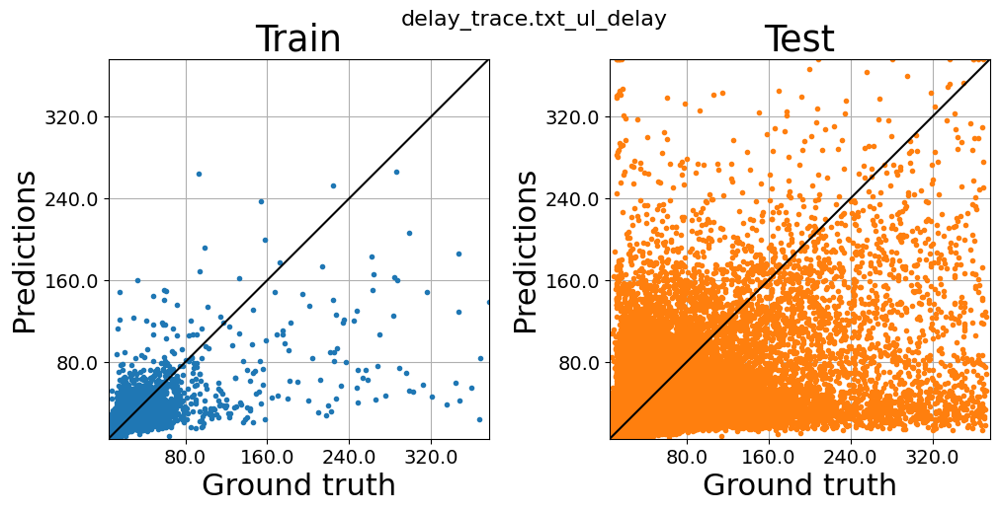



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257726, 470)
(538807, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1153992   51048   21456   10613    6197]
After removing bins that are not populated enough
[0 1 2 3 4] [1153992   51048   21456   10613    6197]
(1226496, 460)
(1226496,)
(1226496,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [496377  21313   8466   4410   2450]
After removing bins that are not populated enough
[0 1 2 3 4] [496377  21313   8466   4410   2450]
(526156, 460)
(526156,)
(526156,)
Train data shape (10000, 460)
Test data shape (3

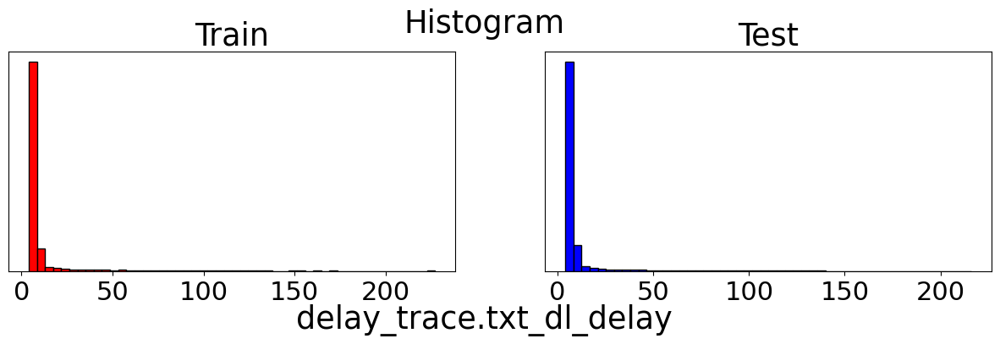

Time to process data for one learning task:  19.972842931747437
Epoch: 10, Loss: 266.51579404296876
Epoch: 20, Loss: 228.631303125
Epoch: 30, Loss: 205.78261323242188
Epoch: 40, Loss: 186.0608640991211
Epoch: 50, Loss: 173.20468758544922
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


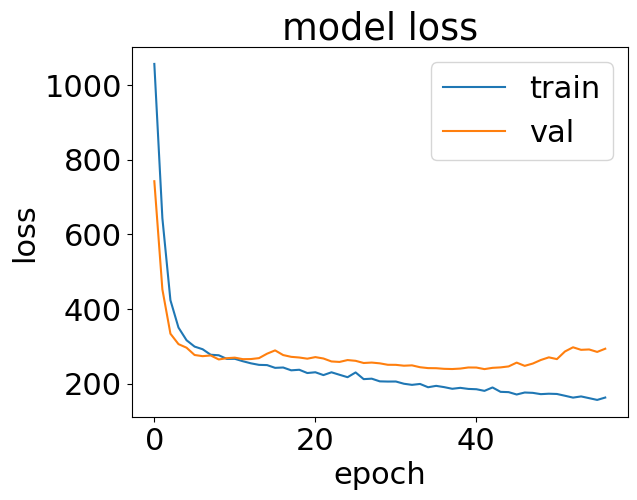

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  379.5303680896759


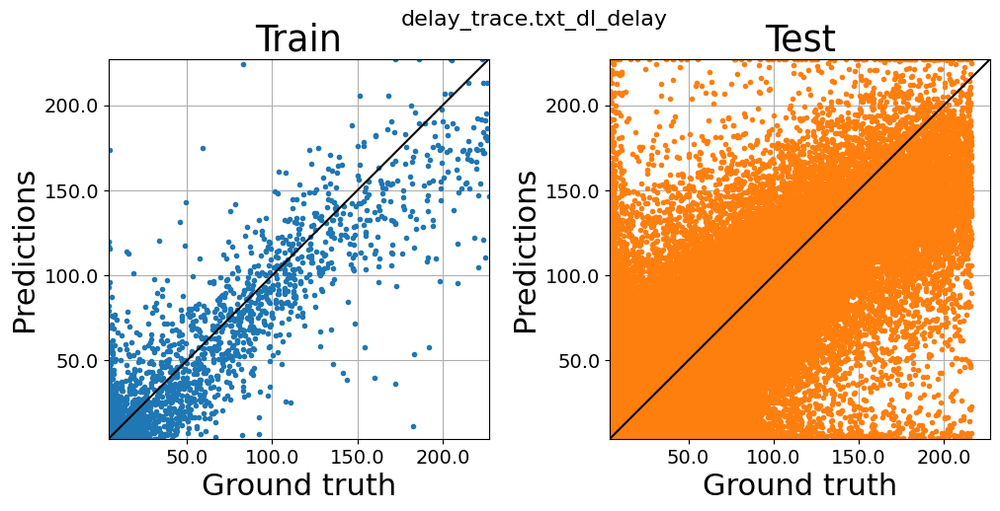



===============================  DONE  ===================================================
Random iteration:  2
# train runs used  7
# test runs used  3
Concatenating runs:  [16 12 17 15 18 14 20]
Time to read csv file for run:  13.437777519226074
Loaded run 16
Time to read csv file for run:  13.294977188110352
Loaded run 12
Time to read csv file for run:  14.485178709030151
Loaded run 17
Time to read csv file for run:  15.27635669708252
Loaded run 15
Time to read csv file for run:  15.033327341079712
Loaded run 18
Time to read csv file for run:  13.610410928726196
Loaded run 14
Time to read csv file for run:  14.666167974472046
Loaded run 20
Concatenating runs:  [11 19 13]
Time to read csv file for run:  13.912927865982056
Loaded run 11
Time to read csv file for run:  13.53718614578247
Loaded run 19
Time to read csv file for run:  13.5381338596344
Loaded run 13
Time to read data:  383.8057451248169
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping rows fo

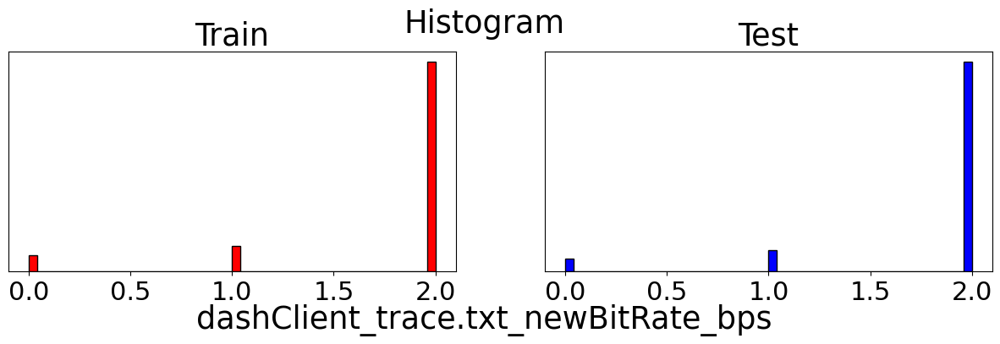

Time to process data for one learning task:  2.1772069931030273
Epoch: 10, Loss: 0.4058801696777344
Epoch: 20, Loss: 0.35479827618598936
Epoch: 30, Loss: 0.33007888355255127
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


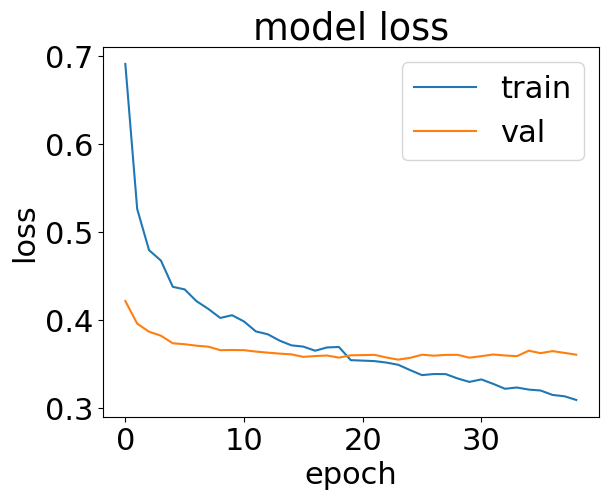

Time to train model:  57.67536425590515


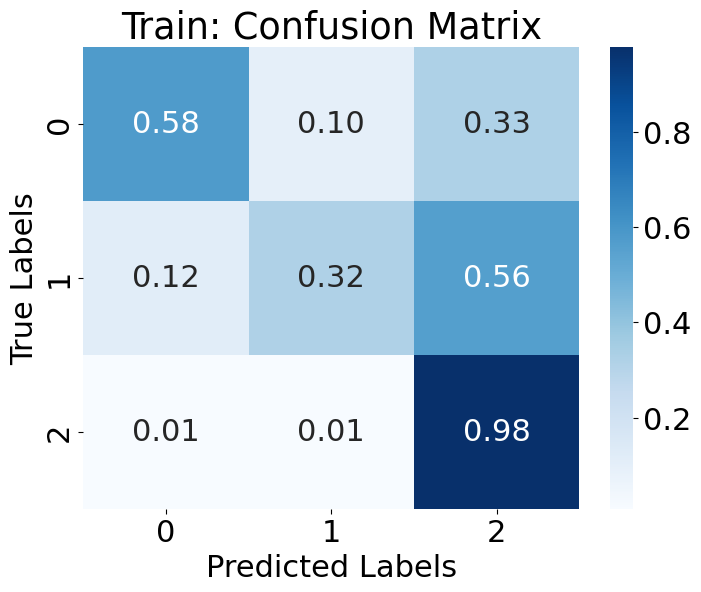

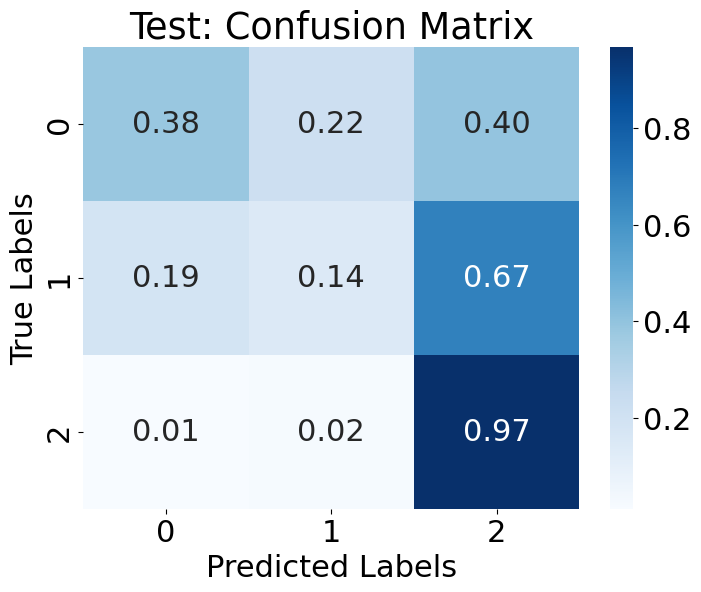



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23089, 470)
(9897, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [16085  1802  1661  2268  1037]
After removing bins that are not populated enough
[0 1 2 3 4] [16085  1802  1661  2268  1037]
(22853, 460)
(22853,)
(22853,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6211 1015  980 1061  498]
After removing bins that are not populated enough
[0 1 2 3 4] [6211 1015  980 1061  498]
(9765, 460)
(9765,)
(9765,)
Train data shape (10000, 460)
Test data shape (7323, 460)
Val data shape (2442, 460)


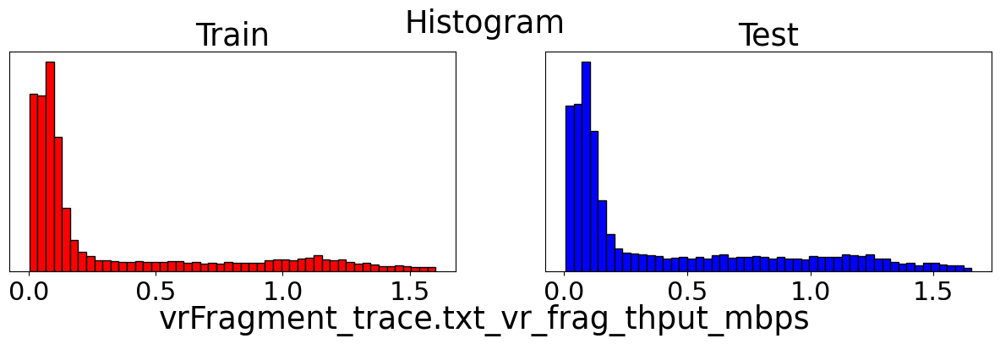

Time to process data for one learning task:  0.6588873863220215
Epoch: 10, Loss: 0.3711452380180359
Epoch: 20, Loss: 0.19391977231502533
Epoch: 30, Loss: 0.10665058274269104
Epoch: 40, Loss: 0.08171011517047883
Epoch: 50, Loss: 0.07178292737007141
Epoch: 60, Loss: 0.06553296402096748
Epoch: 70, Loss: 0.05918395348787308
Epoch: 80, Loss: 0.056146711272001264
Epoch: 90, Loss: 0.05349261528253555
Epoch: 100, Loss: 0.04927333620786667
Epoch: 110, Loss: 0.04781481903195381
Epoch: 120, Loss: 0.04640072339773178
Epoch: 130, Loss: 0.04350245162844658
Epoch: 140, Loss: 0.041160618644952775
Epoch: 150, Loss: 0.04123975598812103
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


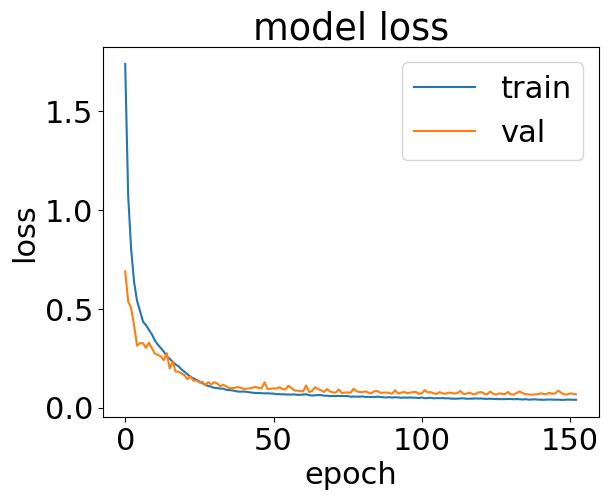

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  146.9043459892273


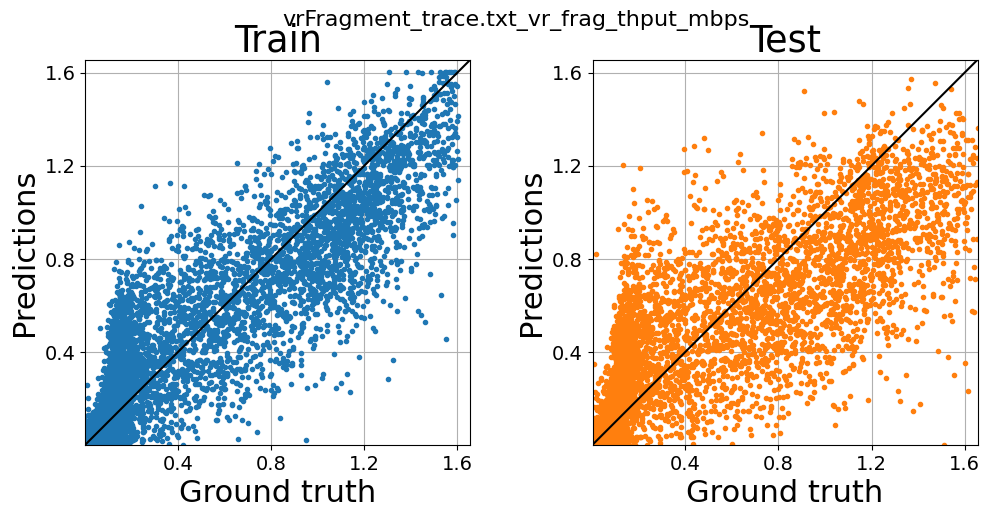



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23057, 470)
(9894, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [16179  1716  1786  2067  1074]
After removing bins that are not populated enough
[0 1 2 3 4] [16179  1716  1786  2067  1074]
(22822, 460)
(22822,)
(22822,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6243  939  987 1016  578]
After removing bins that are not populated enough
[0 1 2 3 4] [6243  939  987 1016  578]
(9763, 460)
(9763,)
(9763,)
Train data shape (10000, 460)
Test data shape (7322, 460)
Val data shape (2441, 460)


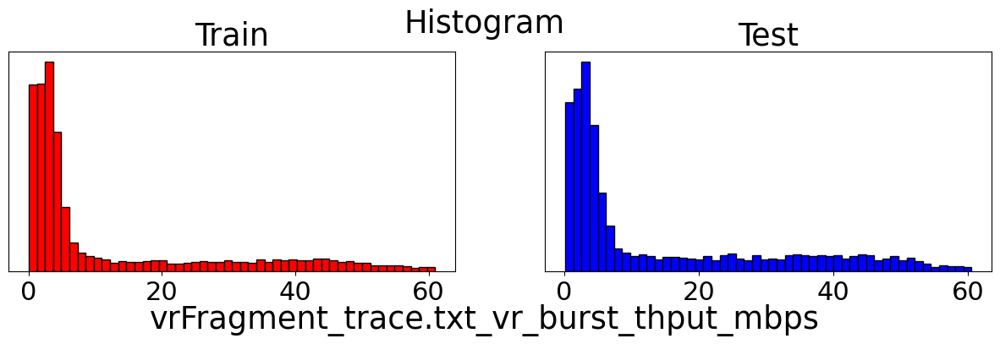

Time to process data for one learning task:  0.652918815612793
Epoch: 10, Loss: 84.45535857543945
Epoch: 20, Loss: 72.3461263305664
Epoch: 30, Loss: 64.81452307434083
Epoch: 40, Loss: 61.496963989257814
Epoch: 50, Loss: 56.577084710693356
Epoch: 60, Loss: 52.66144985351563
Epoch: 70, Loss: 50.835850201416015
Epoch: 80, Loss: 48.78057017211914
Epoch: 90, Loss: 44.54969001464844
Epoch: 100, Loss: 45.403766024780275
Epoch: 110, Loss: 44.33921733093262
Epoch: 120, Loss: 41.06676608886719
Epoch: 130, Loss: 38.77260770263672
Epoch: 140, Loss: 38.778625933837894
Epoch: 150, Loss: 36.523397174072265
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


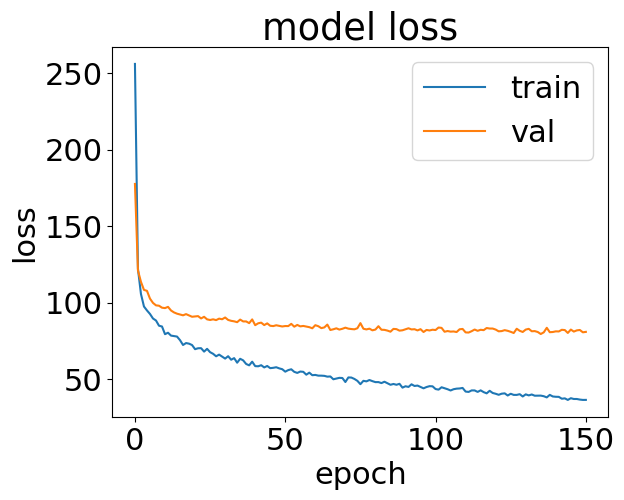

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  146.88255047798157


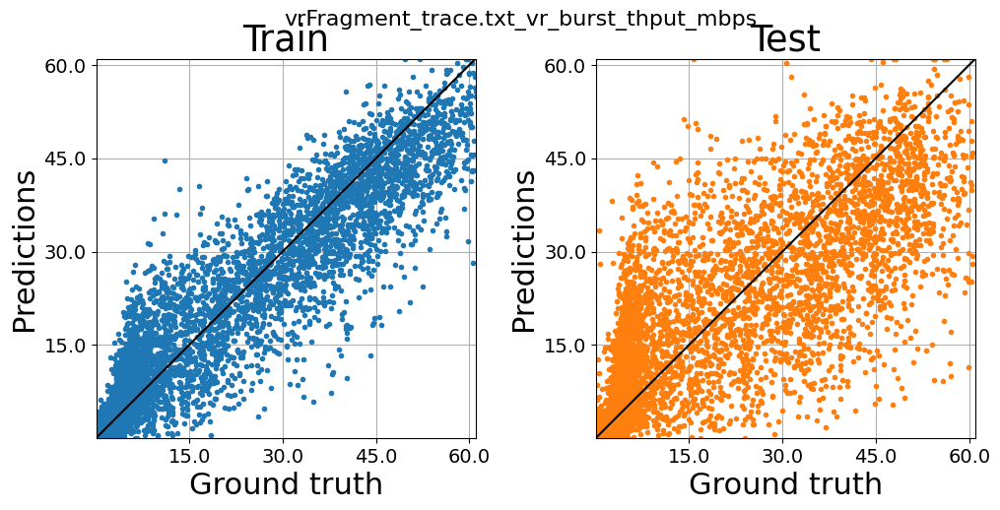



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23089, 470)
(9897, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18264  2859  1026   474   230]
After removing bins that are not populated enough
[0 1 2 3 4] [18264  2859  1026   474   230]
(22623, 460)
(22623,)
(22623,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7967 1011  467  242   78]
After removing bins that are not populated enough
[0 1 2 3 4] [7967 1011  467  242   78]
(9687, 460)
(9687,)
(9687,)
Train data shape (10000, 460)
Test data shape (7265, 460)
Val data shape (2422, 460)


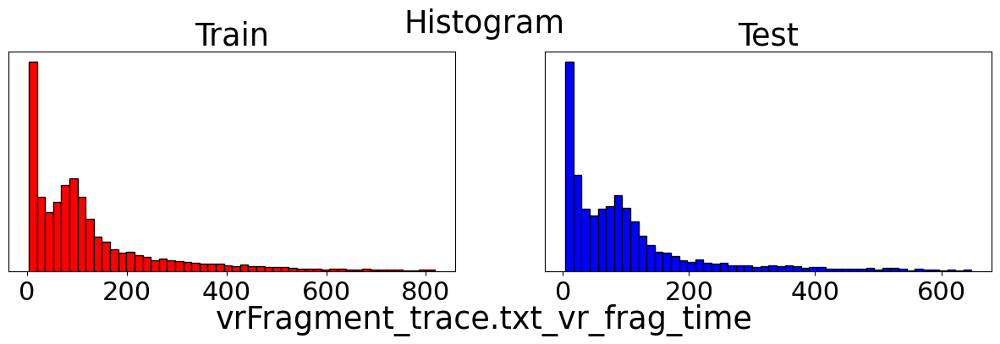

Time to process data for one learning task:  0.6364808082580566
Epoch: 10, Loss: 4592.9381484375
Epoch: 20, Loss: 3411.90108984375
Epoch: 30, Loss: 2861.90916484375
Epoch: 40, Loss: 2639.0426546875
Epoch: 50, Loss: 2557.7323482421875
Epoch: 60, Loss: 2284.0555001953126
Epoch: 70, Loss: 2186.8194712890627
Epoch: 80, Loss: 2104.6613721679687
Epoch: 90, Loss: 2022.707011328125
Epoch: 100, Loss: 1898.0941033203126
Epoch: 110, Loss: 1860.18508203125
Epoch: 120, Loss: 1739.46965
Epoch: 130, Loss: 1736.3941677734374
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


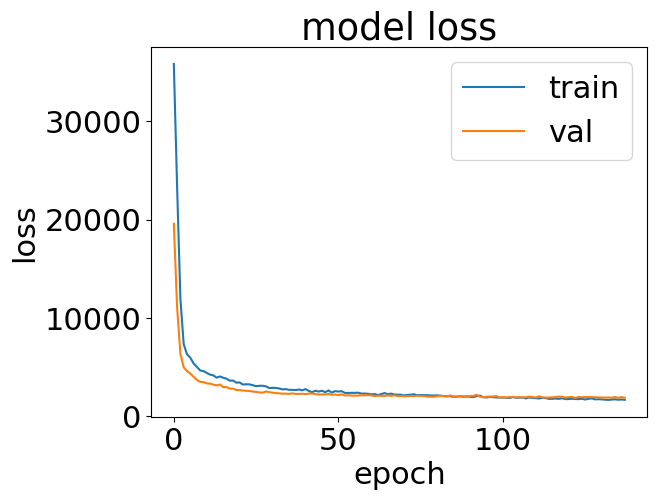

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  135.14206314086914


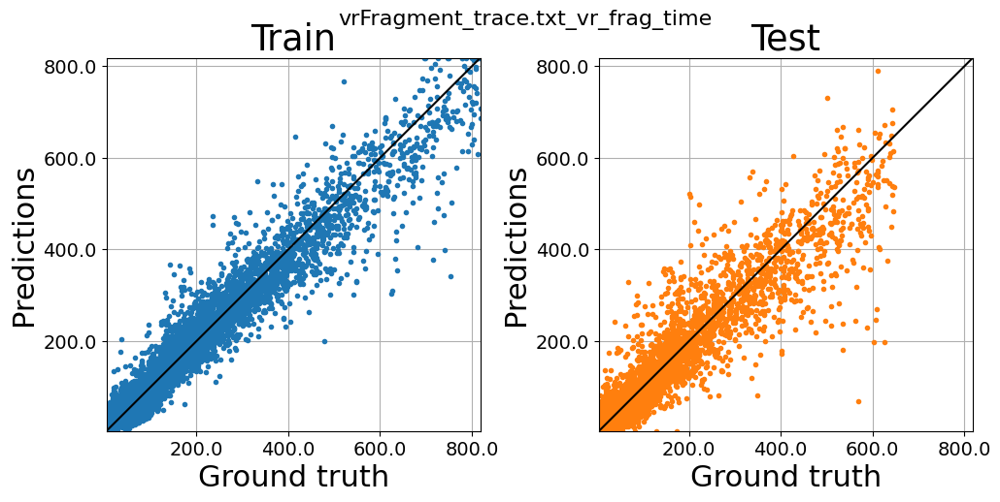



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23057, 470)
(9894, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18168  2891  1038   482   243]
After removing bins that are not populated enough
[0 1 2 3 4] [18168  2891  1038   482   243]
(22822, 460)
(22822,)
(22822,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7941 1014  470  253   85]
After removing bins that are not populated enough
[0 1 2 3 4] [7941 1014  470  253   85]
(9678, 460)
(9678,)
(9678,)
Train data shape (10000, 460)
Test data shape (7258, 460)
Val data shape (2420, 460)


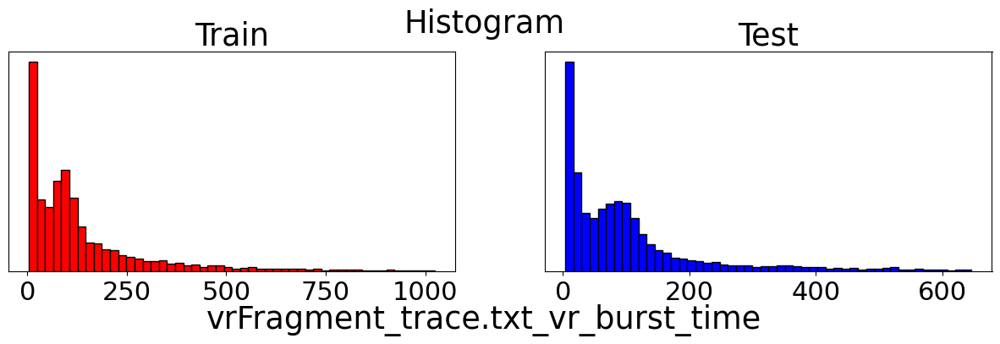

Time to process data for one learning task:  0.6589910984039307
Epoch: 10, Loss: 6111.479259375
Epoch: 20, Loss: 4742.88805546875
Epoch: 30, Loss: 3947.2348171875
Epoch: 40, Loss: 3782.511225
Epoch: 50, Loss: 3330.2367188476564
Epoch: 60, Loss: 3230.358203515625
Epoch: 70, Loss: 2985.2163796875
Epoch: 80, Loss: 2973.575504296875
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


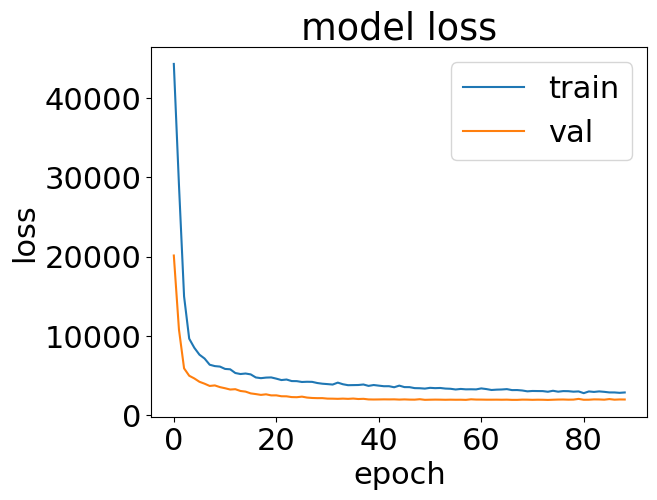

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  94.98210191726685


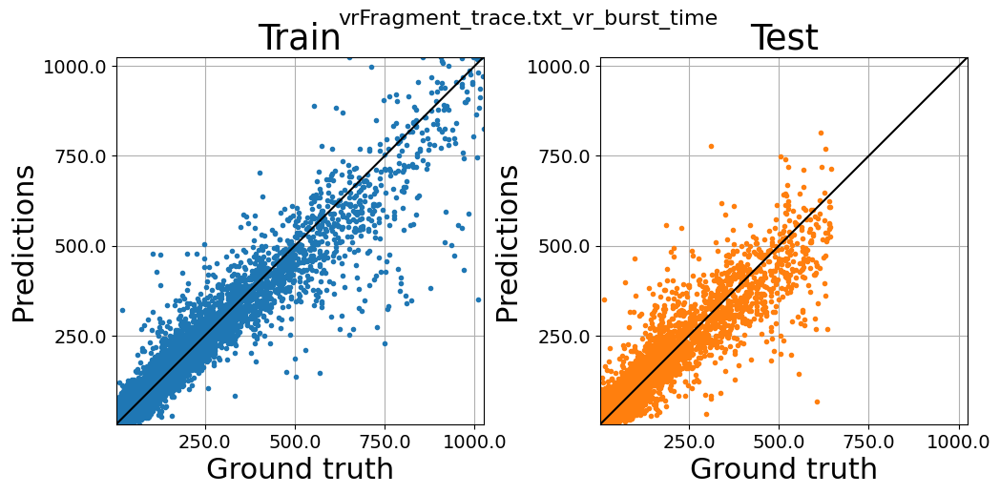



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1185056, 470)
(510654, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1163058    4748    2424    1663    1288]
After removing bins that are not populated enough
[0 1 2 3 4] [1163058    4748    2424    1663    1288]
(1163058, 460)
(1163058,)
(1163058,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [501133   2076   1035    726    562]
After removing bins that are not populated enough
[0 1 2 3 4] [501133   2076   1035    726    562]
(501133, 460)
(501133,)
(501133,)
Train data shape (10000, 460)
Test data shape (3

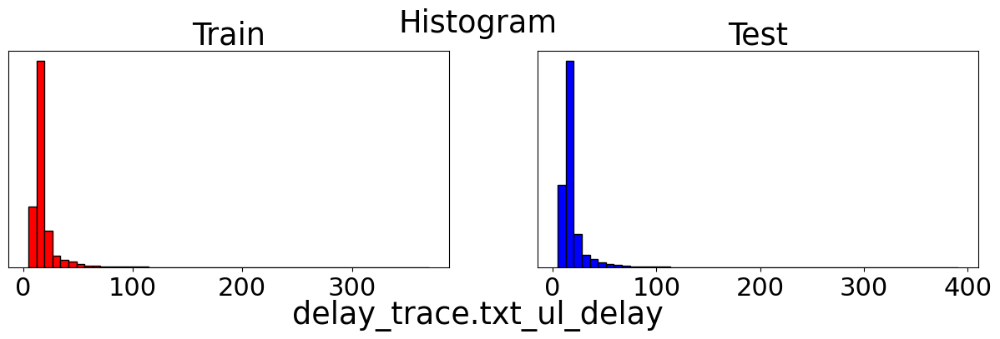

Time to process data for one learning task:  18.663448810577393
Epoch: 10, Loss: 350.1983120239258
Epoch: 20, Loss: 309.8934188232422
Epoch: 30, Loss: 290.99447935791017
Epoch: 40, Loss: 263.9780446411133
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


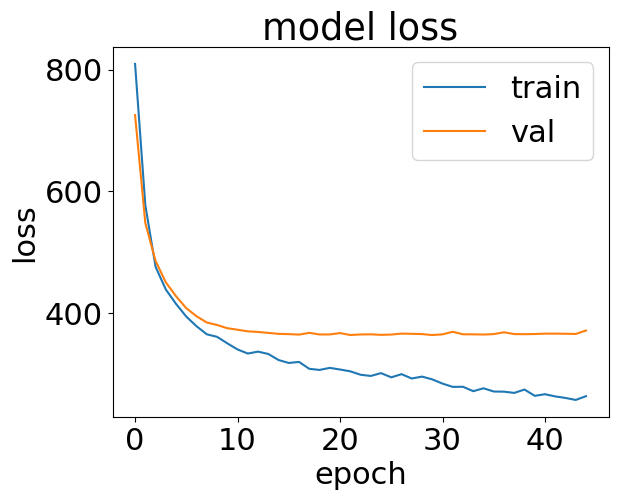

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  295.6254835128784


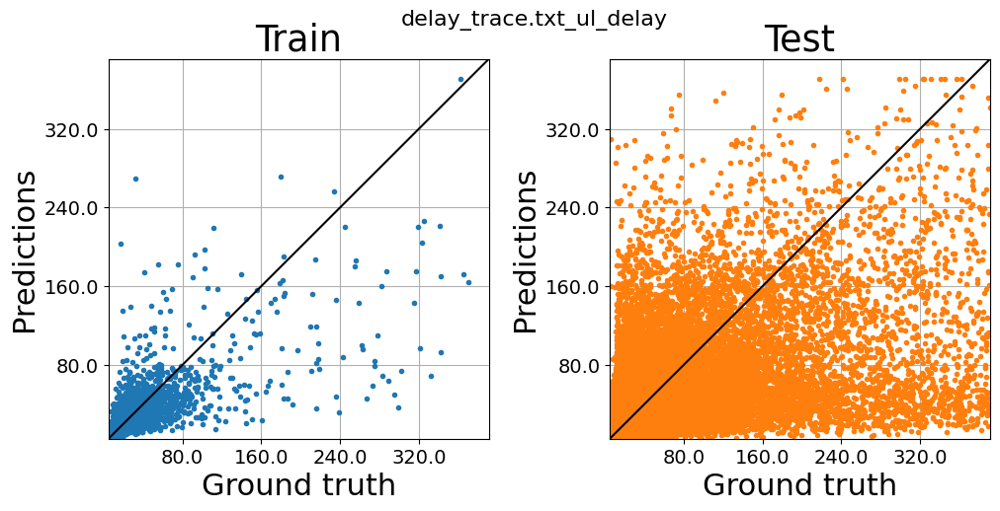



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257441, 470)
(539092, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1154462   50589   21375   10678    6219]
After removing bins that are not populated enough
[0 1 2 3 4] [1154462   50589   21375   10678    6219]
(1226426, 460)
(1226426,)
(1226426,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [495624  21728   8691   4444   2511]
After removing bins that are not populated enough
[0 1 2 3 4] [495624  21728   8691   4444   2511]
(526043, 460)
(526043,)
(526043,)
Train data shape (10000, 460)
Test data shape (3

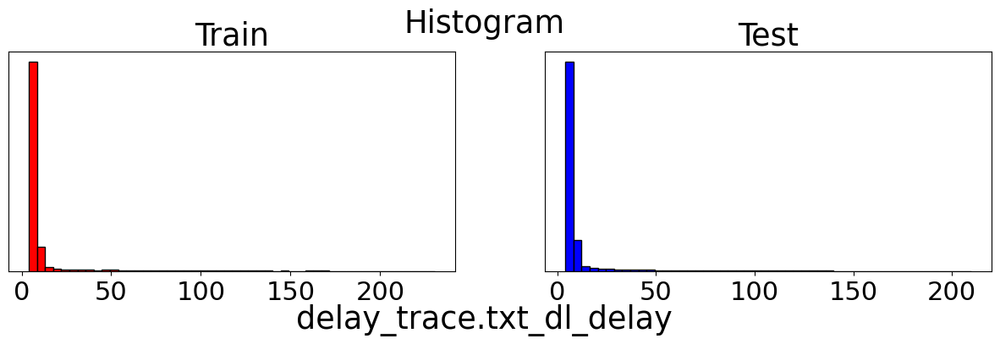

Time to process data for one learning task:  19.90962052345276
Epoch: 10, Loss: 268.30040458984377
Epoch: 20, Loss: 229.2566841003418
Epoch: 30, Loss: 202.5821769042969
Epoch: 40, Loss: 188.4371211791992
Epoch: 50, Loss: 169.46369075927734
Epoch: 60, Loss: 156.7165510192871
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


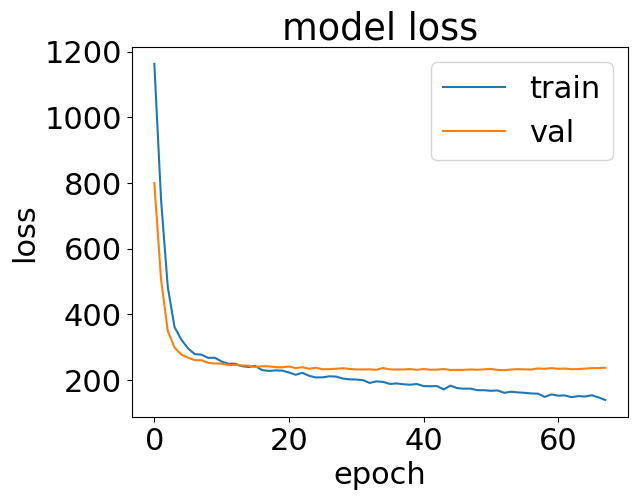

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  447.57844376564026


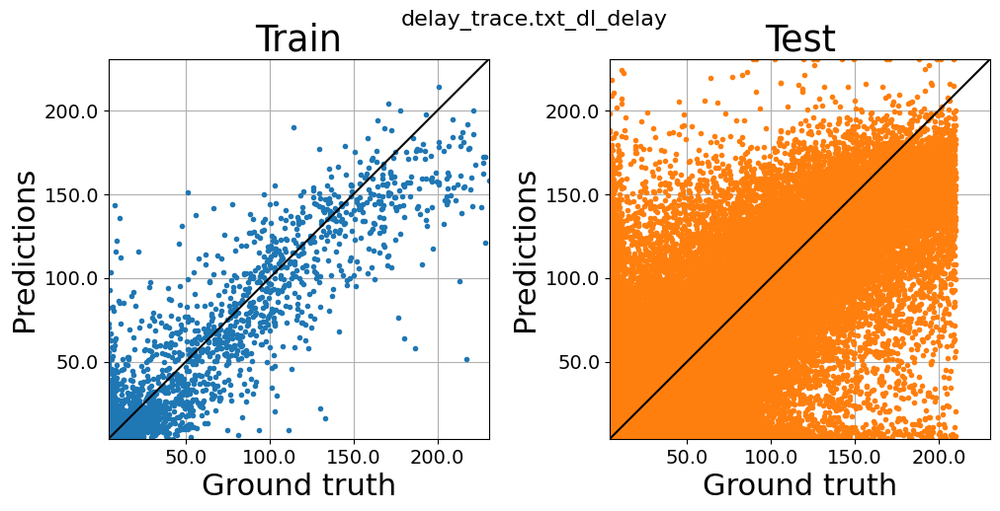



===============================  DONE  ===================================================
============================= Train set mean over runs ===================================
                                                MAE      MAPE        R2
dashClient_trace.txt_newBitRate_bps        0.885900  0.866619  0.933472
vrFragment_trace.txt_vr_frag_thput_mbps    0.113793  0.572266  0.825071
vrFragment_trace.txt_vr_burst_thput_mbps   3.681292  0.542950  0.865980
vrFragment_trace.txt_vr_frag_time         22.645855  0.395433  0.933950
vrFragment_trace.txt_vr_burst_time        25.543322  0.437030  0.922384
delay_trace.txt_ul_delay                   6.457998  0.270323  0.486950
delay_trace.txt_dl_delay                   4.913840  0.386855  0.854031
=============================== Test set results =========================================
                                                             MAE  \
dashClient_trace.txt_newBitRate_bps          [0.860 0.870 0.866]   
vrFragment_tr

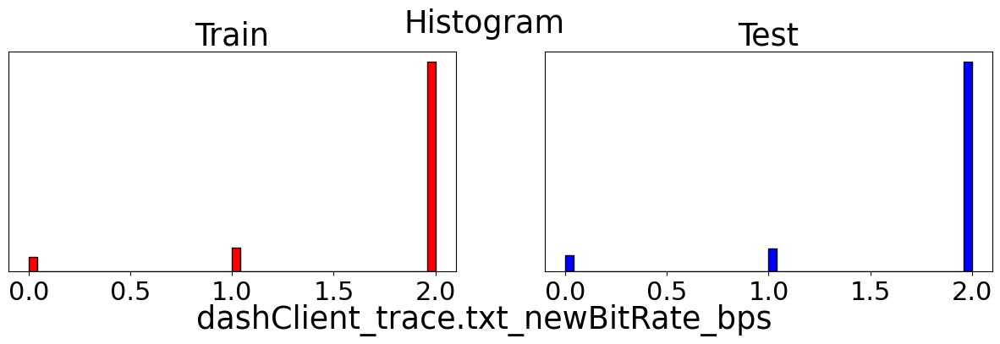

Time to process data for one learning task:  2.200375556945801
Epoch: 10, Loss: 0.38092362365722654
Epoch: 20, Loss: 0.34849393606185913
Epoch: 30, Loss: 0.32605403852462767
Epoch: 40, Loss: 0.310733358168602
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


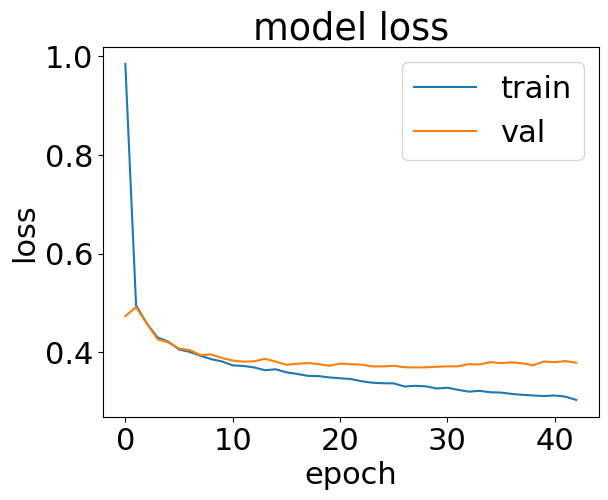

Time to train model:  98.41209411621094


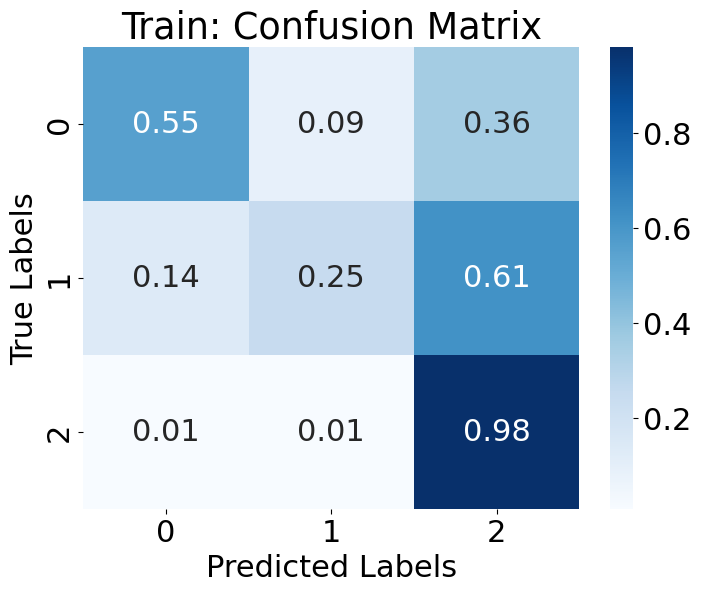

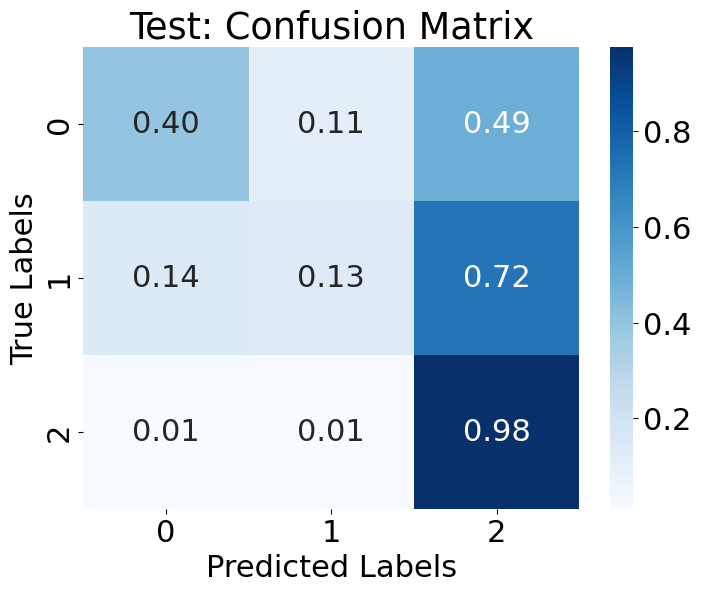



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23089, 470)
(9897, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15454  1936  1918  2406  1110]
After removing bins that are not populated enough
[0 1 2 3 4] [15454  1936  1918  2406  1110]
(22824, 460)
(22824,)
(22824,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6824  865  746  896  463]
After removing bins that are not populated enough
[0 1 2 3 4] [6824  865  746  896  463]
(9794, 460)
(9794,)
(9794,)
Train data shape (20000, 460)
Test data shape (7345, 460)
Val data shape (2449, 460)


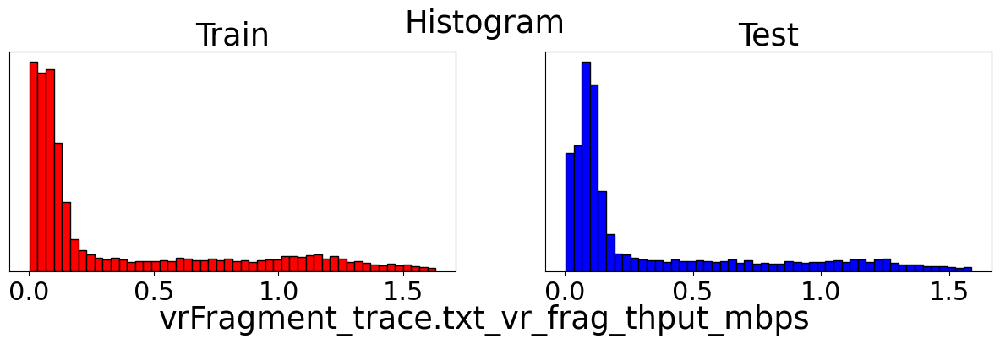

Time to process data for one learning task:  0.6349656581878662
Epoch: 10, Loss: 0.22844668469429016
Epoch: 20, Loss: 0.09856364580392837
Epoch: 30, Loss: 0.07222533056139946
Epoch: 40, Loss: 0.061917390251159665
Epoch: 50, Loss: 0.05584875095486641
Epoch: 60, Loss: 0.052596947634220126
Epoch: 70, Loss: 0.04947740083634854
Epoch: 80, Loss: 0.046395545136928555
Epoch: 90, Loss: 0.04455290370583534
Epoch: 100, Loss: 0.04279757688641548
Epoch: 110, Loss: 0.040693545752763745
Epoch: 120, Loss: 0.03960113559961319
Epoch: 130, Loss: 0.0384810687482357
Epoch: 140, Loss: 0.037458702164888384
Epoch: 150, Loss: 0.035978803253173826
Epoch: 160, Loss: 0.035186114093661305
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


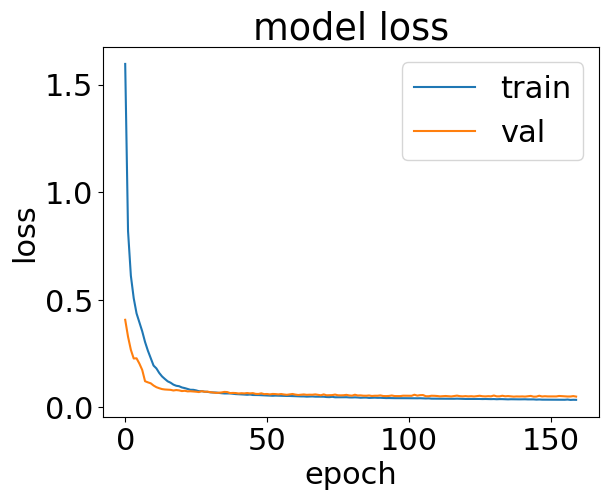

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  280.7166590690613


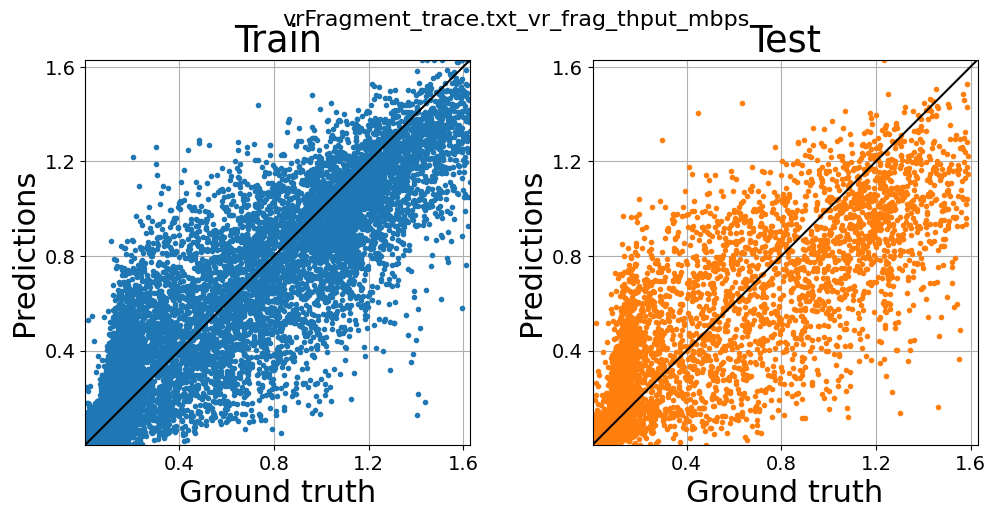



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23062, 470)
(9889, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15567  1915  2028  2231  1058]
After removing bins that are not populated enough
[0 1 2 3 4] [15567  1915  2028  2231  1058]
(22799, 460)
(22799,)
(22799,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6853  773  773  857  530]
After removing bins that are not populated enough
[0 1 2 3 4] [6853  773  773  857  530]
(9786, 460)
(9786,)
(9786,)
Train data shape (20000, 460)
Test data shape (7339, 460)
Val data shape (2447, 460)


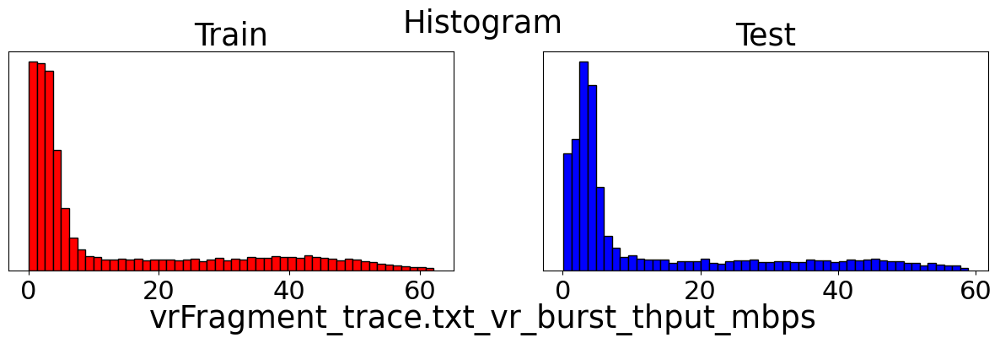

Time to process data for one learning task:  0.6245033740997314
Epoch: 10, Loss: 79.99926766967774
Epoch: 20, Loss: 69.01790505371093
Epoch: 30, Loss: 64.37506716308594
Epoch: 40, Loss: 60.239965692138675
Epoch: 50, Loss: 58.75380765991211
Epoch: 60, Loss: 56.76867178955078
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


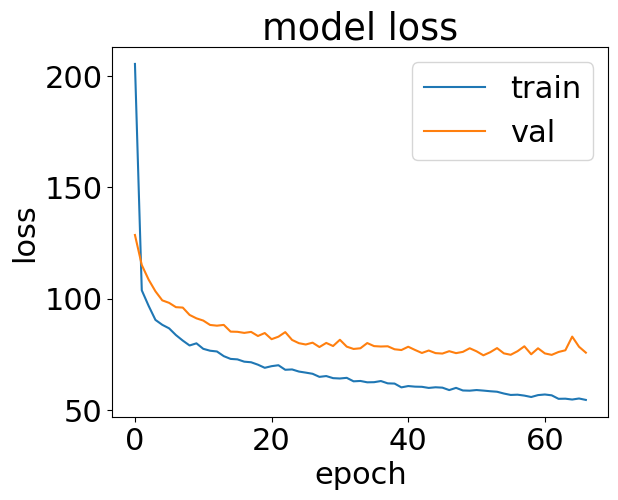

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  130.06987237930298


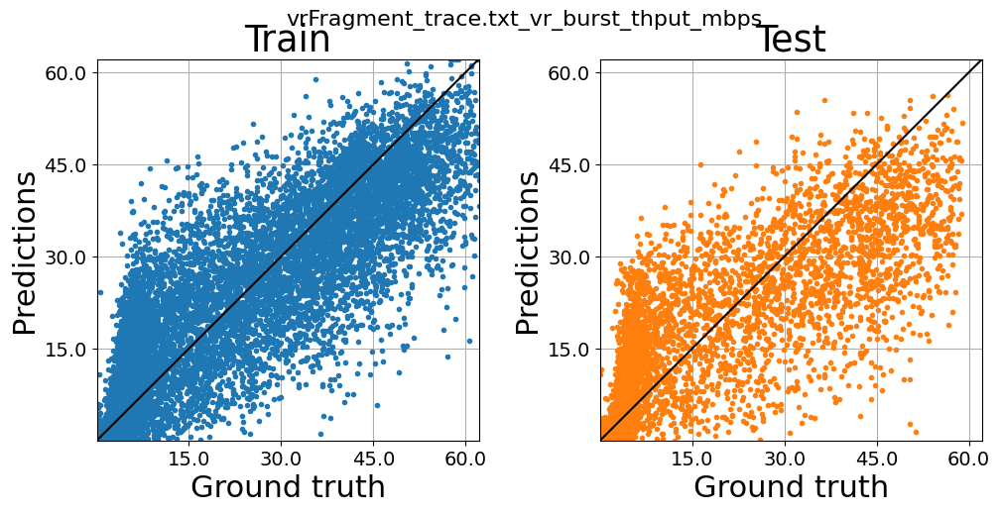



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23089, 470)
(9897, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18097  2872  1109   498   248]
After removing bins that are not populated enough
[0 1 2 3 4] [18097  2872  1109   498   248]
(22824, 460)
(22824,)
(22824,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8061 1076  416  164   77]
After removing bins that are not populated enough
[0 1 2 3 4] [8061 1076  416  164   77]
(9717, 460)
(9717,)
(9717,)
Train data shape (20000, 460)
Test data shape (7287, 460)
Val data shape (2430, 460)


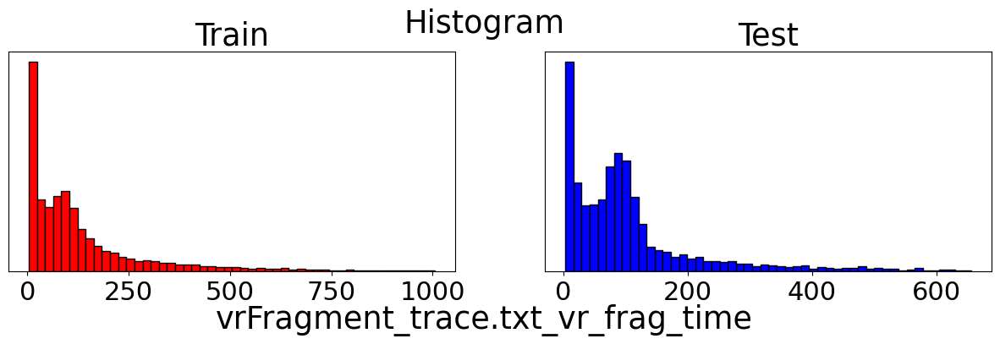

Time to process data for one learning task:  0.6403477191925049
Epoch: 10, Loss: 4178.957503125
Epoch: 20, Loss: 3407.7139736328127
Epoch: 30, Loss: 2987.8339966796875
Epoch: 40, Loss: 2804.614862890625
Epoch: 50, Loss: 2677.2239177734373
Epoch: 60, Loss: 2537.500498046875
Epoch: 70, Loss: 2403.862893359375
Epoch: 80, Loss: 2293.203243359375
Epoch: 90, Loss: 2247.214895703125
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


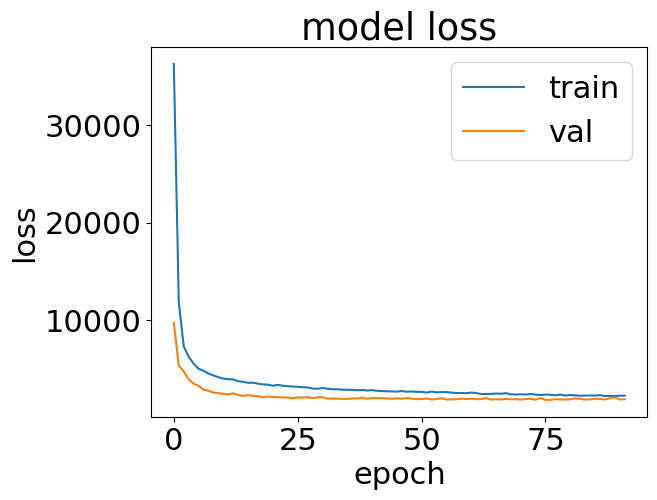

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  171.0060420036316


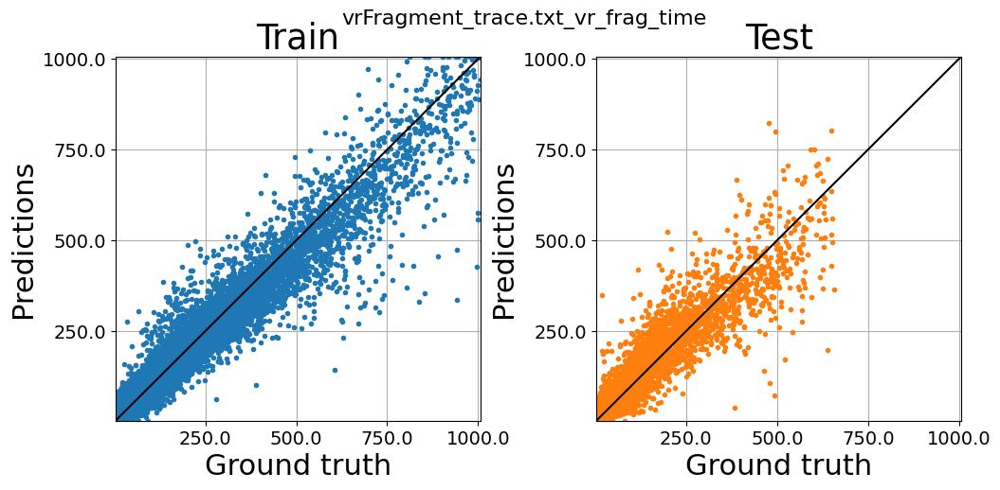



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23062, 470)
(9889, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18036  2882  1135   492   254]
After removing bins that are not populated enough
[0 1 2 3 4] [18036  2882  1135   492   254]
(22799, 460)
(22799,)
(22799,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8074 1050  421  164   77]
After removing bins that are not populated enough
[0 1 2 3 4] [8074 1050  421  164   77]
(9709, 460)
(9709,)
(9709,)
Train data shape (20000, 460)
Test data shape (7281, 460)
Val data shape (2428, 460)


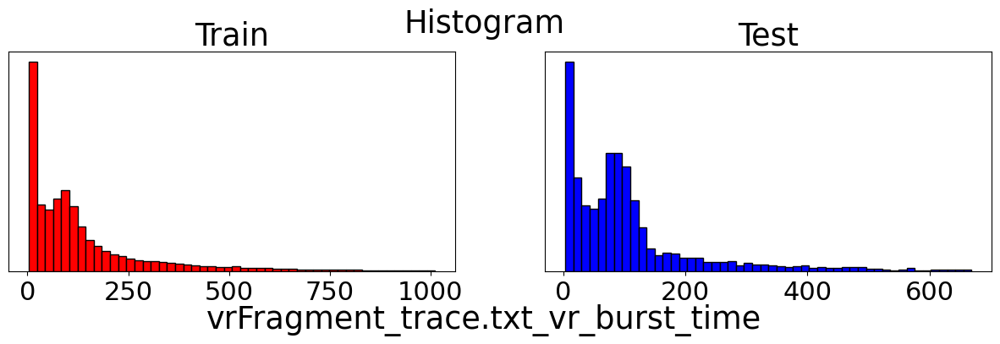

Time to process data for one learning task:  0.619234561920166
Epoch: 10, Loss: 4280.021392578125
Epoch: 20, Loss: 3545.1929970703127
Epoch: 30, Loss: 3203.188366015625
Epoch: 40, Loss: 2990.596433984375
Epoch: 50, Loss: 2853.032294921875
Epoch: 60, Loss: 2712.04375859375
Epoch: 70, Loss: 2626.532439160156
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


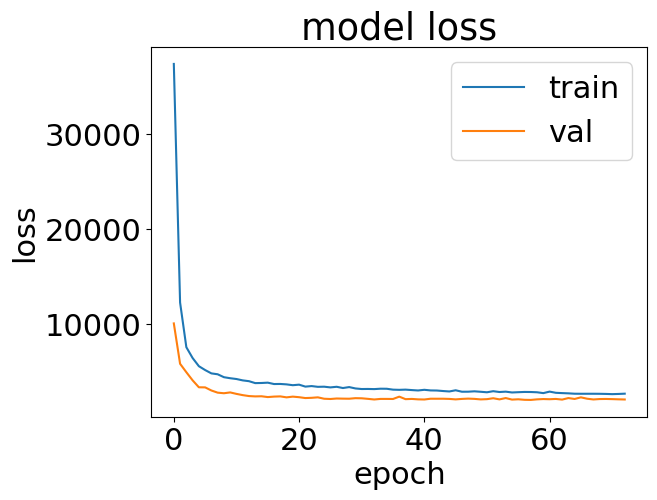

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  140.9852659702301


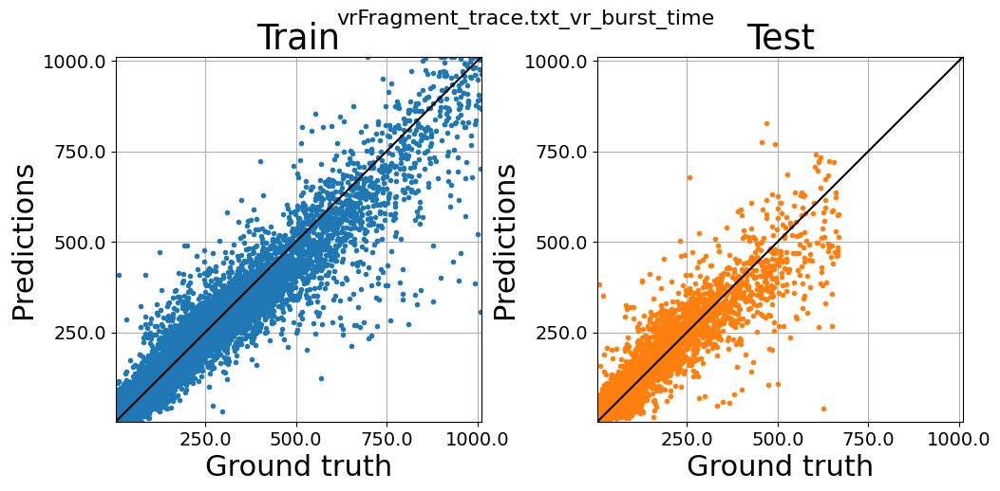



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1189581, 470)
(506129, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1167591    4800    2370    1629    1265]
After removing bins that are not populated enough
[0 1 2 3 4] [1167591    4800    2370    1629    1265]
(1167591, 460)
(1167591,)
(1167591,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [496616   2073   1074    734    561]
After removing bins that are not populated enough
[0 1 2 3 4] [496616   2073   1074    734    561]
(496616, 460)
(496616,)
(496616,)
Train data shape (20000, 460)
Test data shape (3

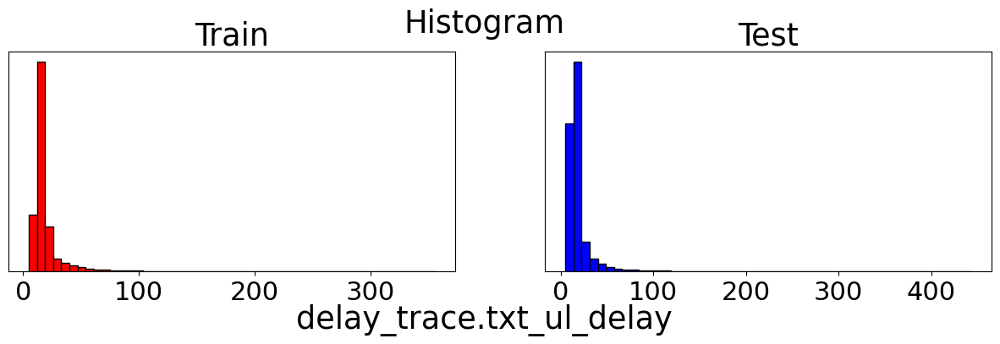

Time to process data for one learning task:  18.826233386993408
Epoch: 10, Loss: 332.1475841918945
Epoch: 20, Loss: 305.39976330566407
Epoch: 30, Loss: 289.4738741088867
Epoch: 40, Loss: 261.1472833129883
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


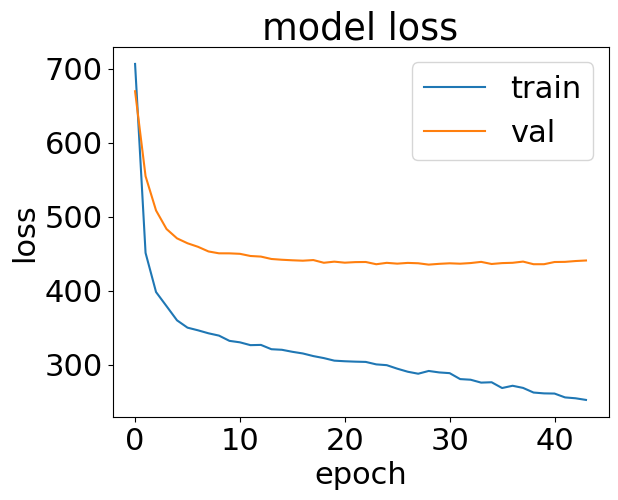

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  326.44129729270935


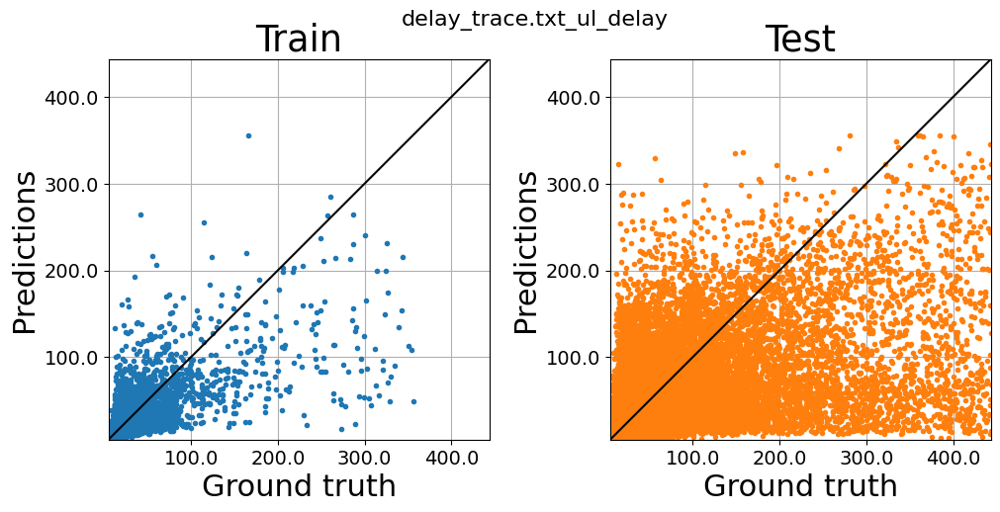



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257537, 470)
(538996, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1154690   50910   21352   10322    6141]
After removing bins that are not populated enough
[0 1 2 3 4] [1154690   50910   21352   10322    6141]
(1226952, 460)
(1226952,)
(1226952,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [495552  21549   8534   4657   2627]
After removing bins that are not populated enough
[0 1 2 3 4] [495552  21549   8534   4657   2627]
(525635, 460)
(525635,)
(525635,)
Train data shape (20000, 460)
Test data shape (3

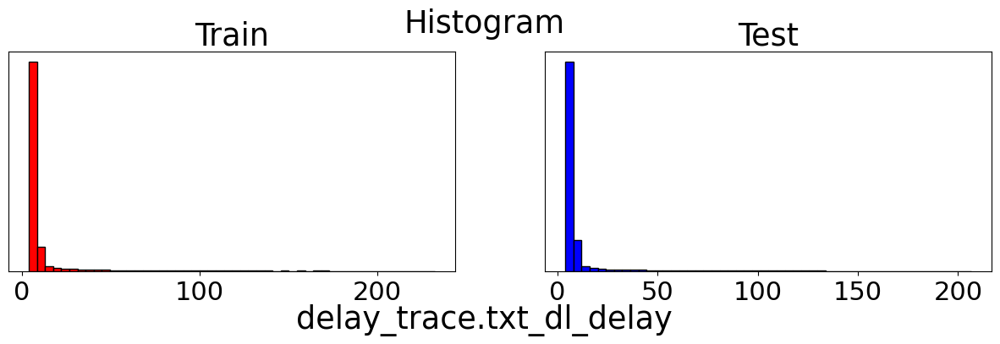

Time to process data for one learning task:  19.785957098007202
Epoch: 10, Loss: 267.98656892089843
Epoch: 20, Loss: 232.5181528564453
Epoch: 30, Loss: 217.36228348388673
Epoch: 40, Loss: 199.69283092041016
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


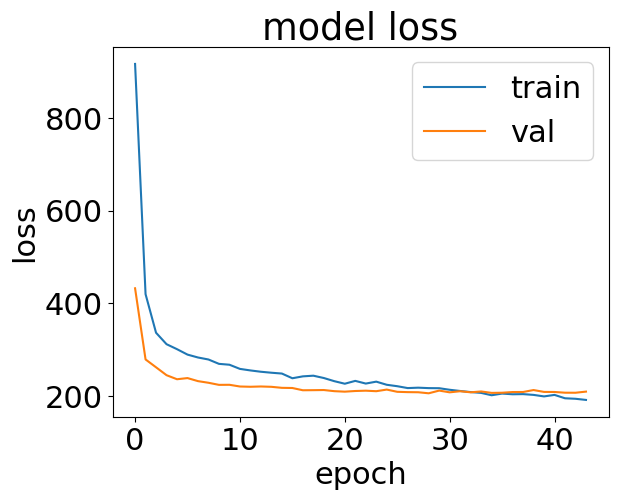

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  346.2647075653076


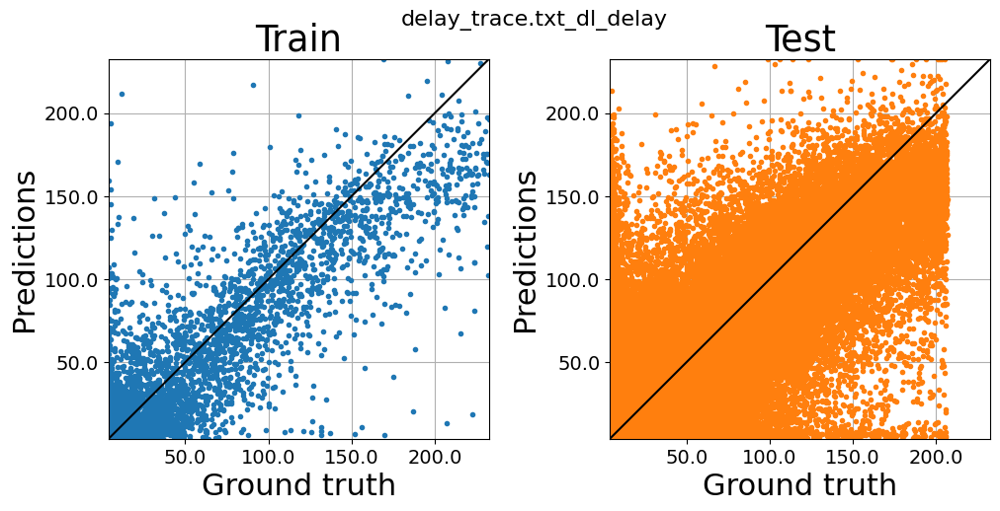



===============================  DONE  ===================================================
Random iteration:  1
# train runs used  7
# test runs used  3
Concatenating runs:  [20 11 12 15 16 14 13]
Time to read csv file for run:  15.364251852035522
Loaded run 20
Time to read csv file for run:  15.30443263053894
Loaded run 11
Time to read csv file for run:  15.377887725830078
Loaded run 12
Time to read csv file for run:  15.368301391601562
Loaded run 15
Time to read csv file for run:  15.329160690307617
Loaded run 16
Time to read csv file for run:  15.601438522338867
Loaded run 14
Time to read csv file for run:  15.305854320526123
Loaded run 13
Concatenating runs:  [18 17 19]
Time to read csv file for run:  14.778652429580688
Loaded run 18
Time to read csv file for run:  15.259066104888916
Loaded run 17
Time to read csv file for run:  15.42552638053894
Loaded run 19
Time to read data:  396.07396626472473
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping rows

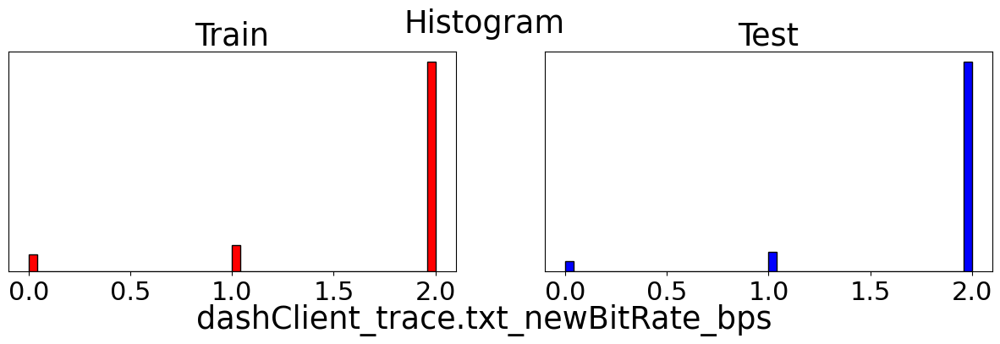

Time to process data for one learning task:  1.9274499416351318
Epoch: 10, Loss: 0.4029566128730774
Epoch: 20, Loss: 0.3662762428283691
Epoch: 30, Loss: 0.34912720804214475
Epoch: 40, Loss: 0.32950712931156156
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


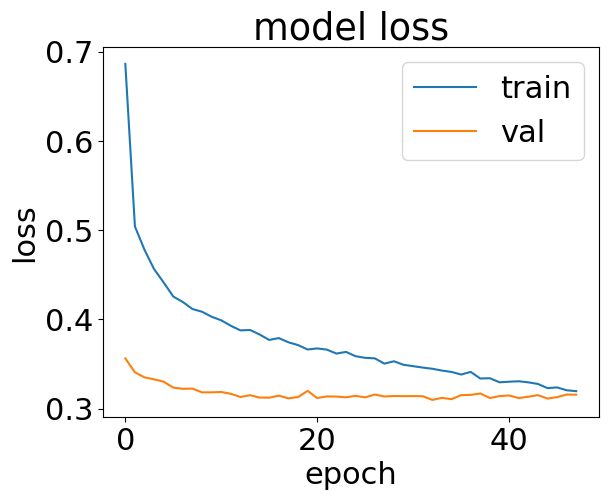

Time to train model:  110.72994637489319


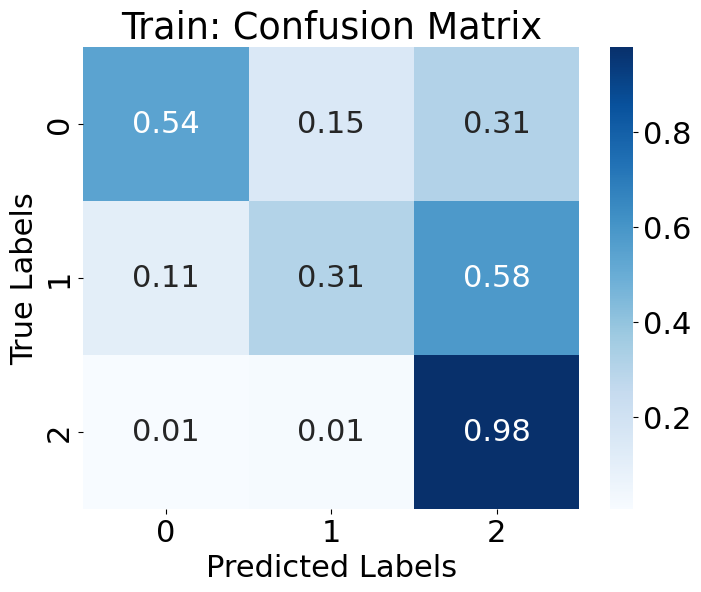

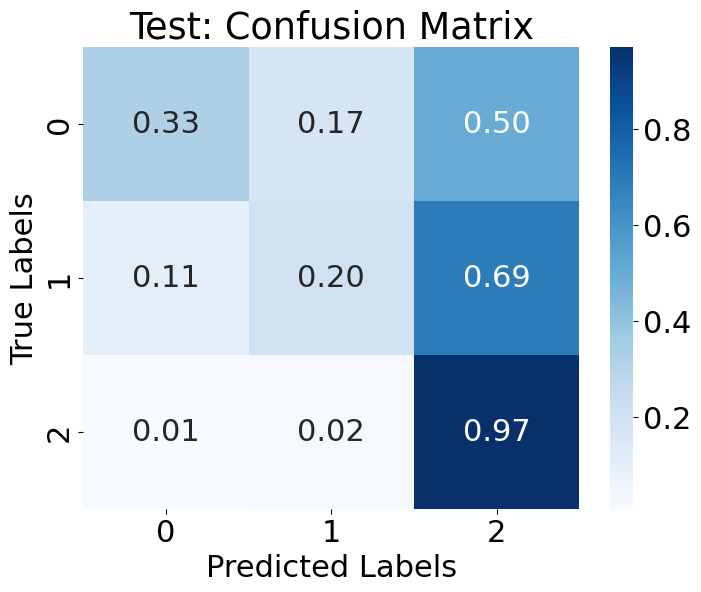



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23068, 470)
(9918, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15725  1868  1784  2368  1073]
After removing bins that are not populated enough
[0 1 2 3 4] [15725  1868  1784  2368  1073]
(22818, 460)
(22818,)
(22818,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6580  947  857  944  472]
After removing bins that are not populated enough
[0 1 2 3 4] [6580  947  857  944  472]
(9800, 460)
(9800,)
(9800,)
Train data shape (20000, 460)
Test data shape (7350, 460)
Val data shape (2450, 460)


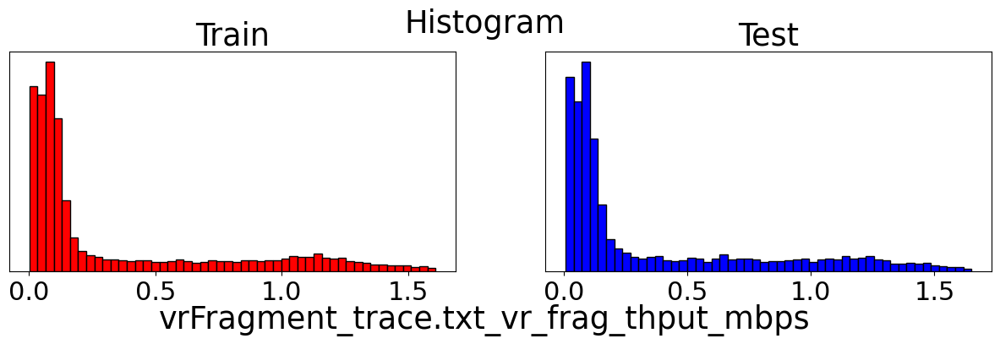

Time to process data for one learning task:  0.6516540050506592
Epoch: 10, Loss: 0.20170985417366027
Epoch: 20, Loss: 0.09512251626253128
Epoch: 30, Loss: 0.07823409231901168
Epoch: 40, Loss: 0.06793734735250473
Epoch: 50, Loss: 0.06143896601200104
Epoch: 60, Loss: 0.05739793958067894
Epoch: 70, Loss: 0.0540420169532299
Epoch: 80, Loss: 0.04973444580733776
Epoch: 90, Loss: 0.04755067442655563
Epoch: 100, Loss: 0.04627379696965218
Epoch: 110, Loss: 0.04411648383140564
Epoch: 120, Loss: 0.04347232748270035
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


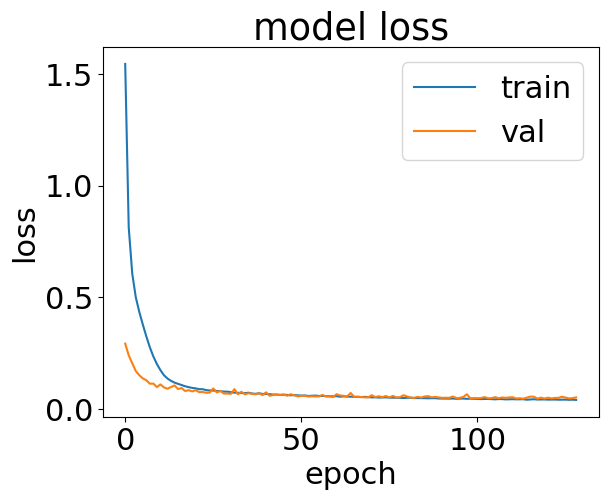

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  237.364910364151


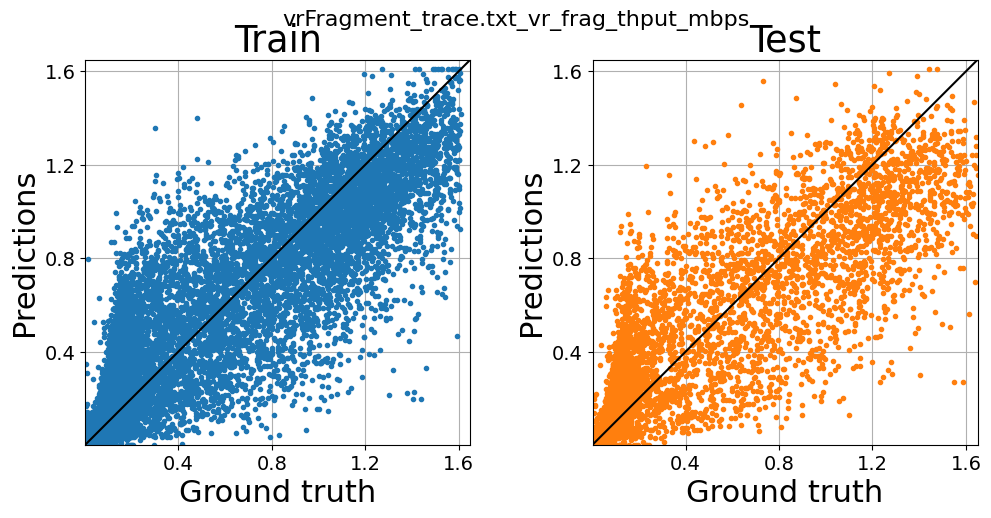



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23034, 470)
(9917, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [15821  1828  1932  2140  1065]
After removing bins that are not populated enough
[0 1 2 3 4] [15821  1828  1932  2140  1065]
(22786, 460)
(22786,)
(22786,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6588  837  881  935  558]
After removing bins that are not populated enough
[0 1 2 3 4] [6588  837  881  935  558]
(9799, 460)
(9799,)
(9799,)
Train data shape (20000, 460)
Test data shape (7349, 460)
Val data shape (2450, 460)


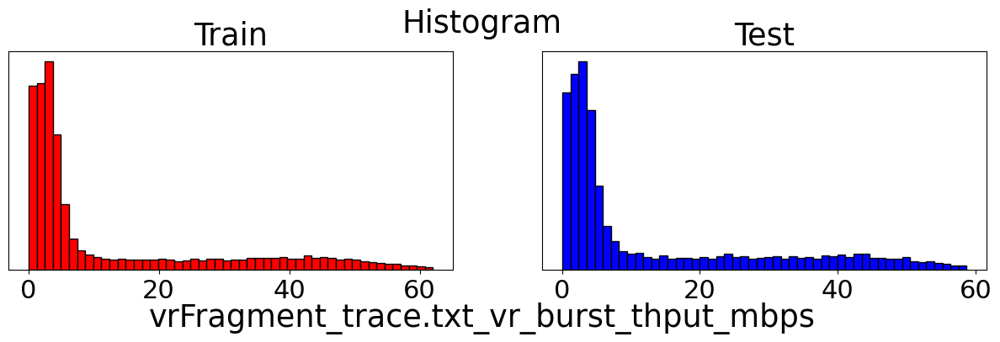

Time to process data for one learning task:  0.6690943241119385
Epoch: 10, Loss: 79.71683888549805
Epoch: 20, Loss: 70.50770880737305
Epoch: 30, Loss: 65.02613540649413
Epoch: 40, Loss: 61.9885860168457
Epoch: 50, Loss: 57.325780865478514
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


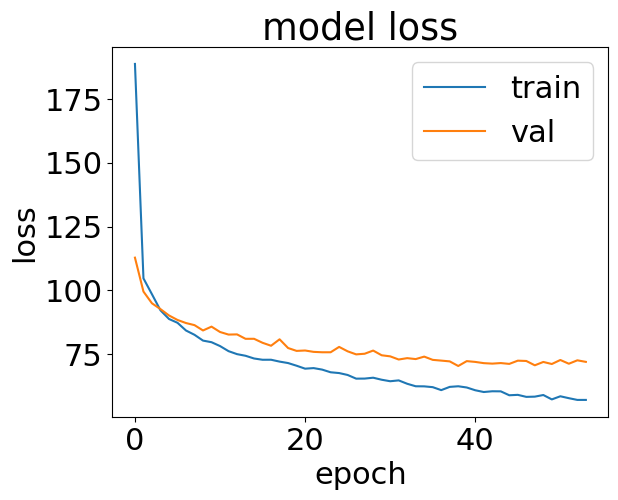

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  113.057208776474


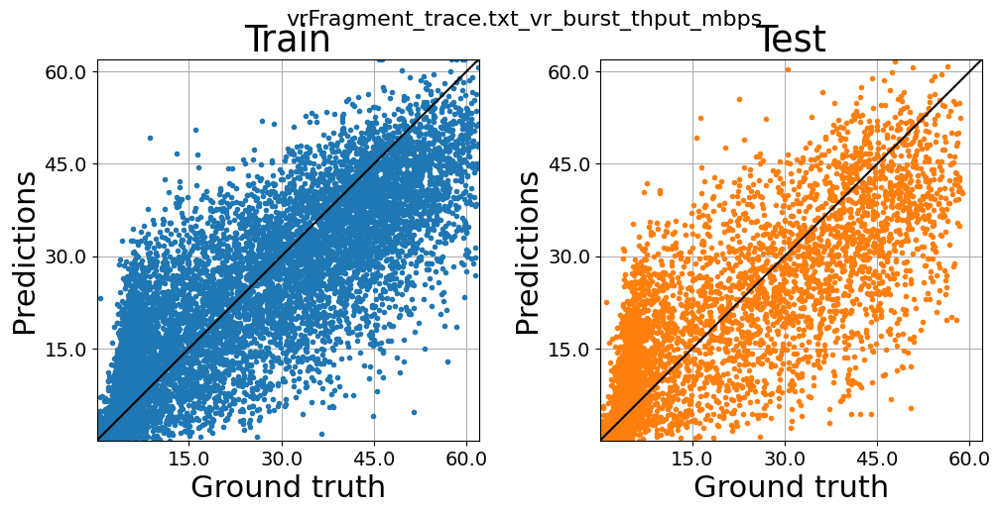



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23068, 470)
(9918, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18519  2746   920   418   215]
After removing bins that are not populated enough
[0 1 2 3 4] [18519  2746   920   418   215]
(22603, 460)
(22603,)
(22603,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7700 1176  515  290  119]
After removing bins that are not populated enough
[0 1 2 3 4] [7700 1176  515  290  119]
(9800, 460)
(9800,)
(9800,)
Train data shape (20000, 460)
Test data shape (7350, 460)
Val data shape (2450, 460)


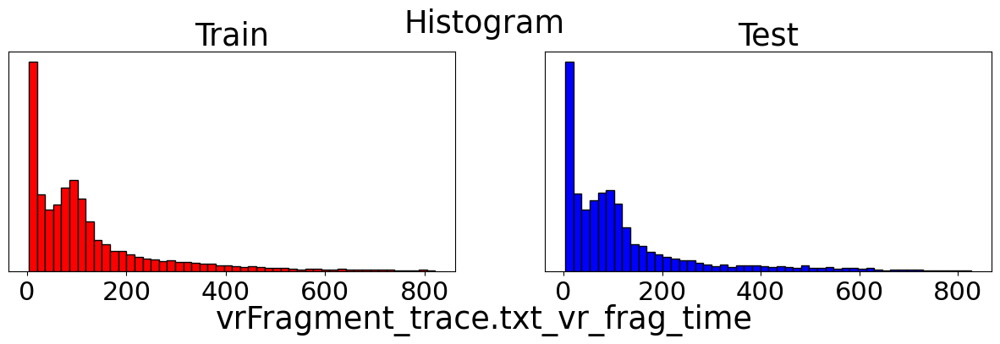

Time to process data for one learning task:  0.6595981121063232
Epoch: 10, Loss: 3270.4935931640625
Epoch: 20, Loss: 2675.0541458984376
Epoch: 30, Loss: 2419.3780029296877
Epoch: 40, Loss: 2293.7471375
Epoch: 50, Loss: 2187.172855078125
Epoch: 60, Loss: 2049.7285451171874
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


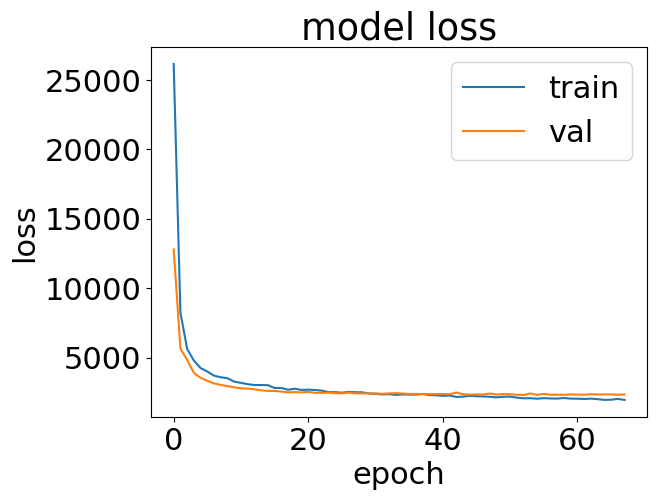

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  137.22065901756287


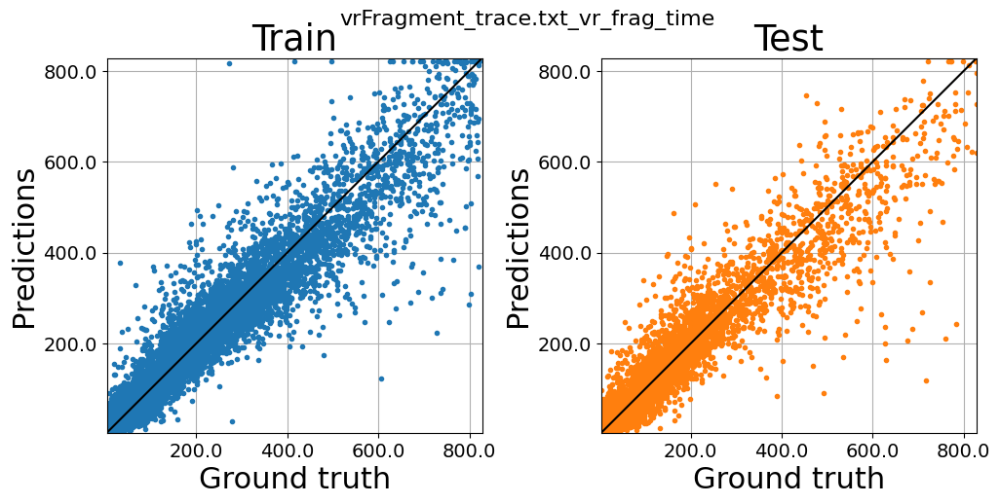



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23034, 470)
(9917, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18487  2740   934   407   218]
After removing bins that are not populated enough
[0 1 2 3 4] [18487  2740   934   407   218]
(22568, 460)
(22568,)
(22568,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [7660 1170  533  308  128]
After removing bins that are not populated enough
[0 1 2 3 4] [7660 1170  533  308  128]
(9799, 460)
(9799,)
(9799,)
Train data shape (20000, 460)
Test data shape (7349, 460)
Val data shape (2450, 460)


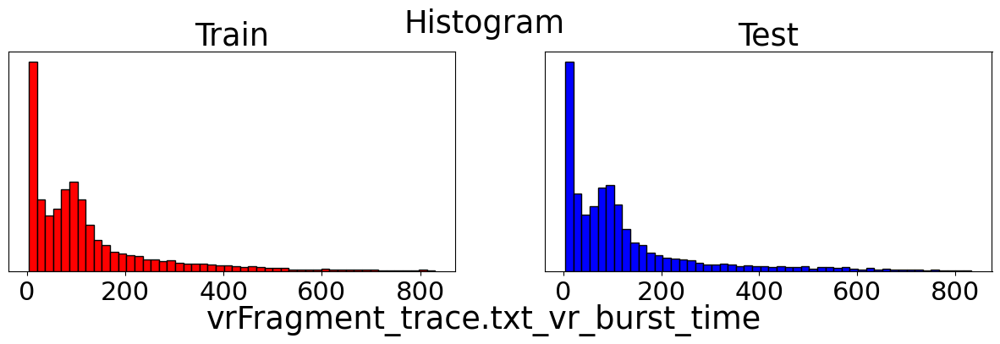

Time to process data for one learning task:  0.6630599498748779
Epoch: 10, Loss: 3468.5116388671877
Epoch: 20, Loss: 2794.48540546875
Epoch: 30, Loss: 2594.53486875
Epoch: 40, Loss: 2396.4609359375
Epoch: 50, Loss: 2321.7066560546873
Epoch: 60, Loss: 2176.86346484375
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


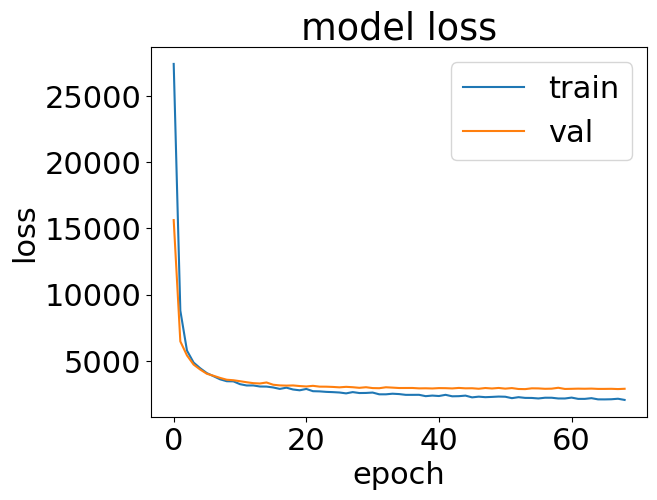

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  139.135808467865


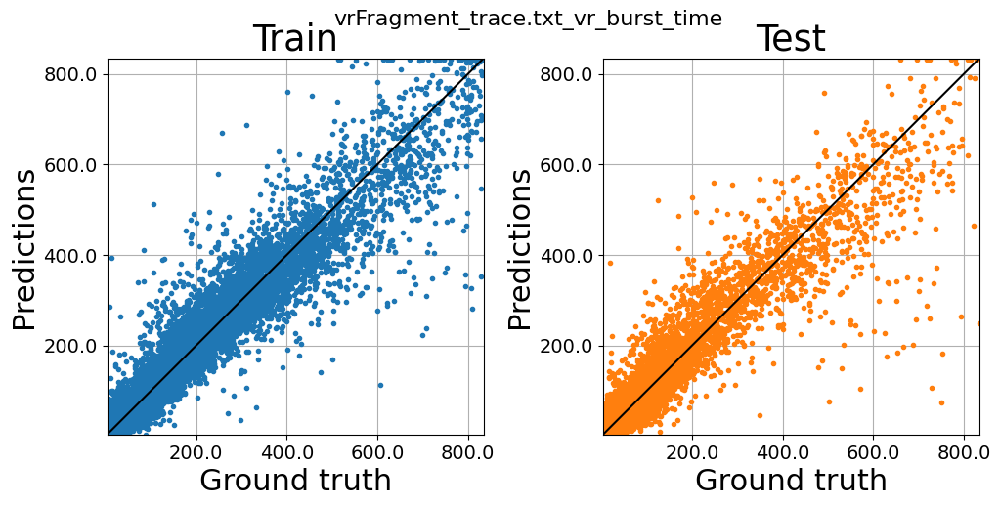



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1185247, 470)
(510463, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1163233    4734    2453    1662    1286]
After removing bins that are not populated enough
[0 1 2 3 4] [1163233    4734    2453    1662    1286]
(1163233, 460)
(1163233,)
(1163233,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [500958   2077   1026    725    559]
After removing bins that are not populated enough
[0 1 2 3 4] [500958   2077   1026    725    559]
(500958, 460)
(500958,)
(500958,)
Train data shape (20000, 460)
Test data shape (3

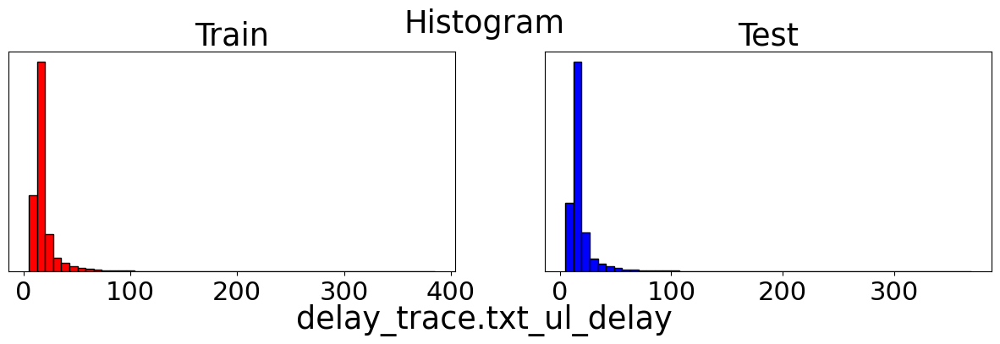

Time to process data for one learning task:  19.011592149734497
Epoch: 10, Loss: 346.2608738769531
Epoch: 20, Loss: 315.49796763916015
Epoch: 30, Loss: 291.9430387878418
Epoch: 40, Loss: 272.7580602294922
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


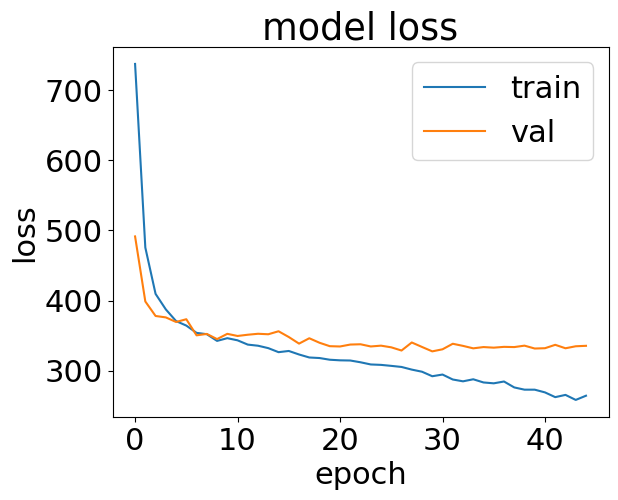

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  347.80797028541565


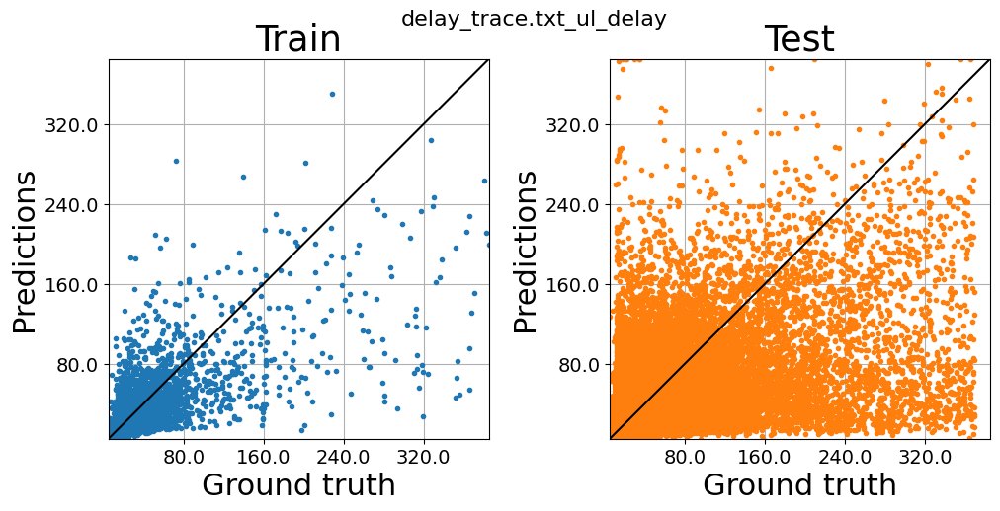



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257639, 470)
(538894, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1154518   50680   21264   10618    6269]
After removing bins that are not populated enough
[0 1 2 3 4] [1154518   50680   21264   10618    6269]
(1226462, 460)
(1226462,)
(1226462,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [494903  22095   8992   4509   2470]
After removing bins that are not populated enough
[0 1 2 3 4] [494903  22095   8992   4509   2470]
(525990, 460)
(525990,)
(525990,)
Train data shape (20000, 460)
Test data shape (3

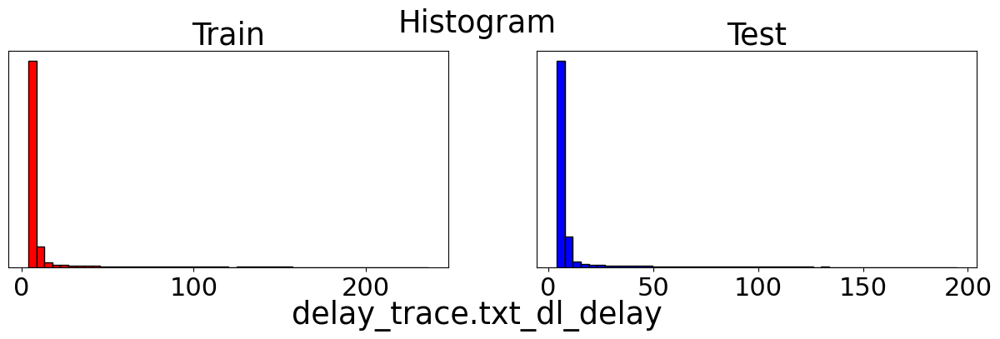

Time to process data for one learning task:  19.944886684417725
Epoch: 10, Loss: 268.6626061279297
Epoch: 20, Loss: 231.74753519897462
Epoch: 30, Loss: 212.09075093994142
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


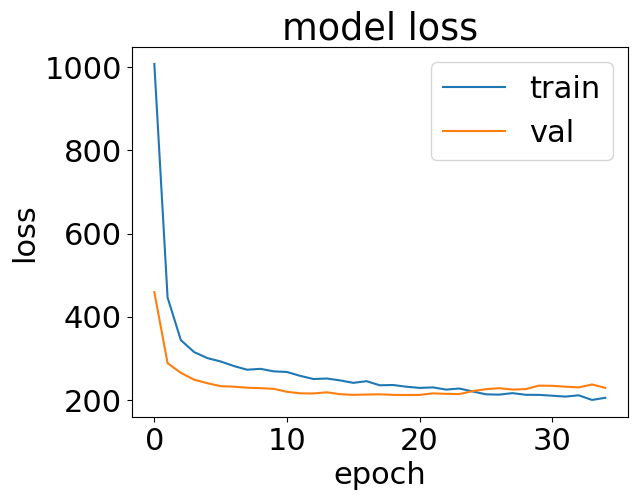

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  294.8725686073303


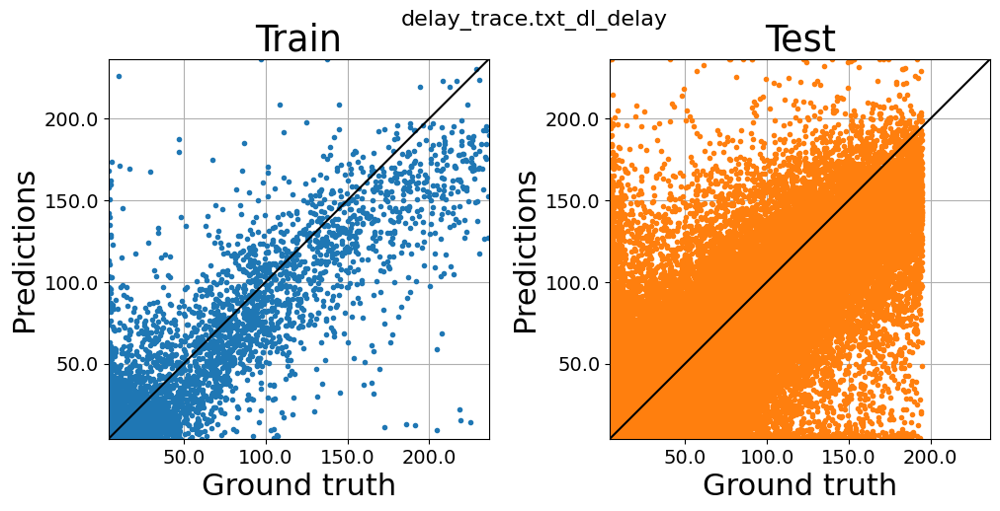



===============================  DONE  ===================================================
Random iteration:  2
# train runs used  7
# test runs used  3
Concatenating runs:  [16 20 13 18 15 12 17]
Time to read csv file for run:  15.391824960708618
Loaded run 16
Time to read csv file for run:  15.053220987319946
Loaded run 20
Time to read csv file for run:  15.470812559127808
Loaded run 13
Time to read csv file for run:  15.497117042541504
Loaded run 18
Time to read csv file for run:  15.514610290527344
Loaded run 15
Time to read csv file for run:  15.604965448379517
Loaded run 12
Time to read csv file for run:  15.60362958908081
Loaded run 17
Concatenating runs:  [11 14 19]
Time to read csv file for run:  15.038658380508423
Loaded run 11
Time to read csv file for run:  15.793102502822876
Loaded run 14
Time to read csv file for run:  15.609352827072144
Loaded run 19
Time to read data:  400.49247884750366
Learning task:  dashClient_trace.txt_newBitRate_bps task type:  clas
Dropping row

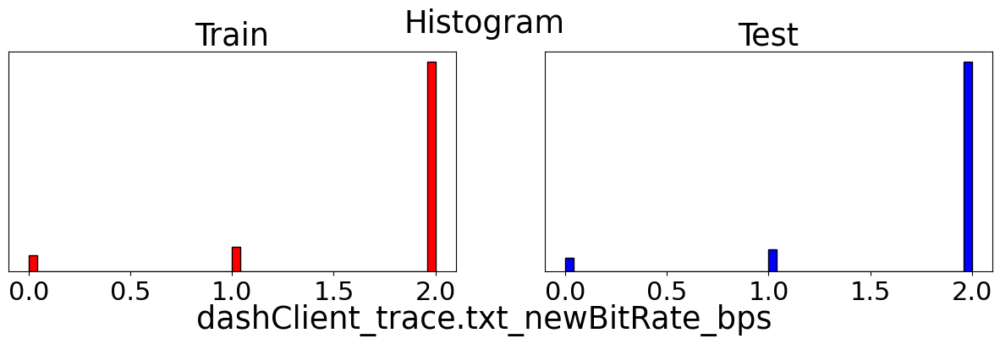

Time to process data for one learning task:  2.1545114517211914
Epoch: 10, Loss: 0.39059268383979795
Epoch: 20, Loss: 0.35316688957214354
Epoch: 30, Loss: 0.33430179462432863
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


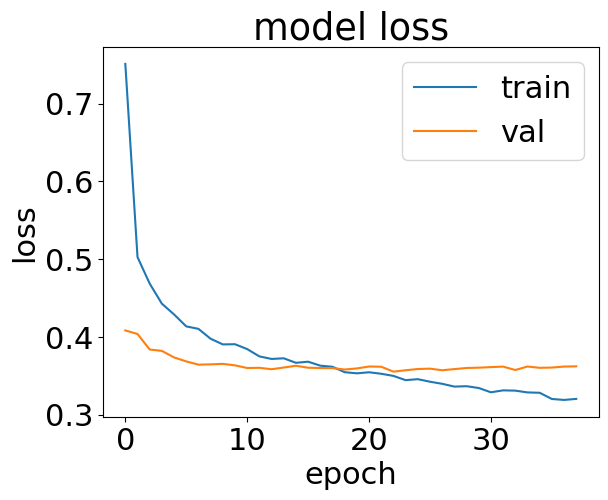

Time to train model:  97.33858633041382


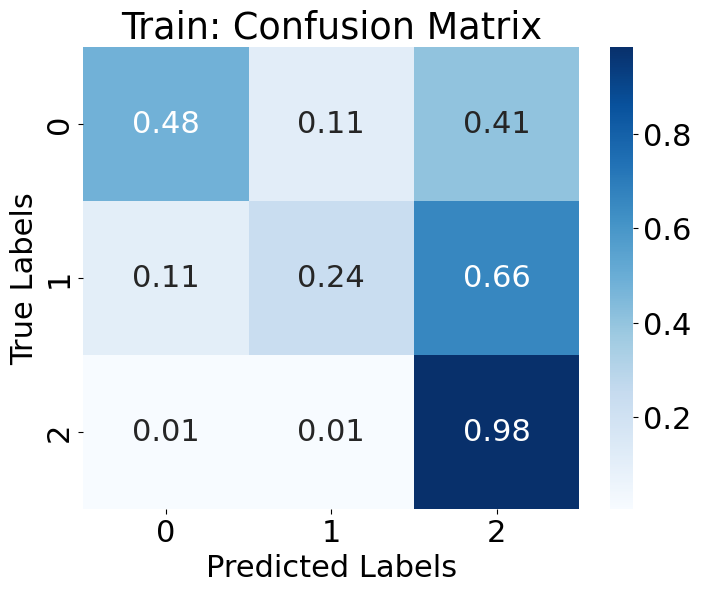

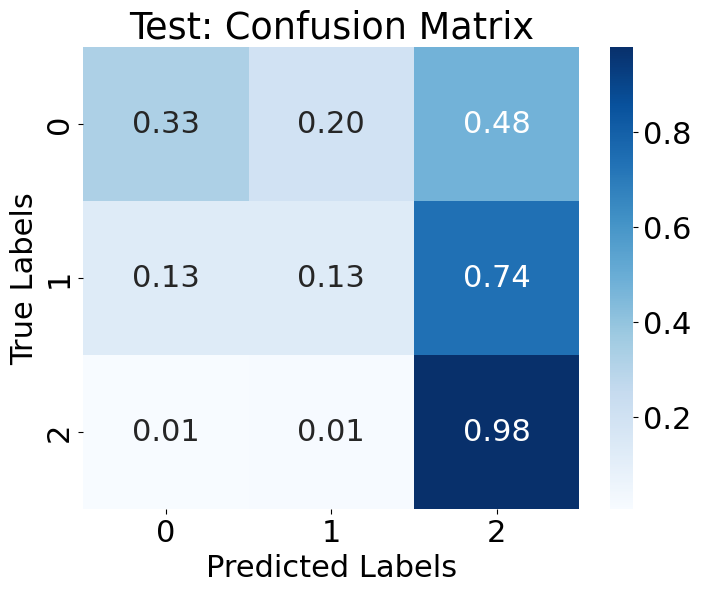



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23078, 470)
(9908, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [16203  1821  1683  2168   967]
After removing bins that are not populated enough
[0 1 2 3 4] [16203  1821  1683  2168   967]
(22842, 460)
(22842,)
(22842,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6083  987  967 1155  584]
After removing bins that are not populated enough
[0 1 2 3 4] [6083  987  967 1155  584]
(9776, 460)
(9776,)
(9776,)
Train data shape (20000, 460)
Test data shape (7332, 460)
Val data shape (2444, 460)


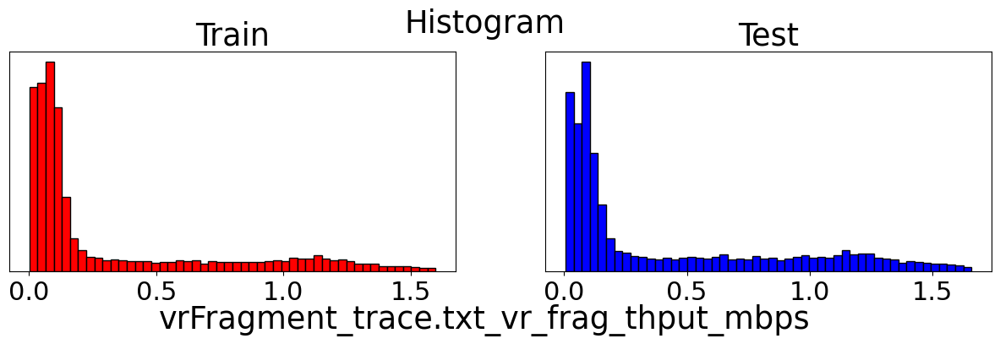

Time to process data for one learning task:  0.6104357242584229
Epoch: 10, Loss: 0.1557546529531479
Epoch: 20, Loss: 0.08383457839488984
Epoch: 30, Loss: 0.06872848898172379
Epoch: 40, Loss: 0.06071093080639839
Epoch: 50, Loss: 0.05511571898460388
Epoch: 60, Loss: 0.050641929352283475
Epoch: 70, Loss: 0.04794632093906403
Epoch: 80, Loss: 0.04506530246138573
Epoch: 90, Loss: 0.043792574900388716
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


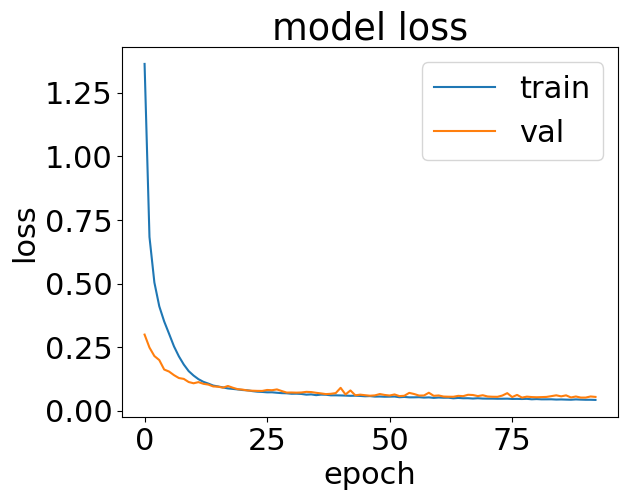

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  183.05900406837463


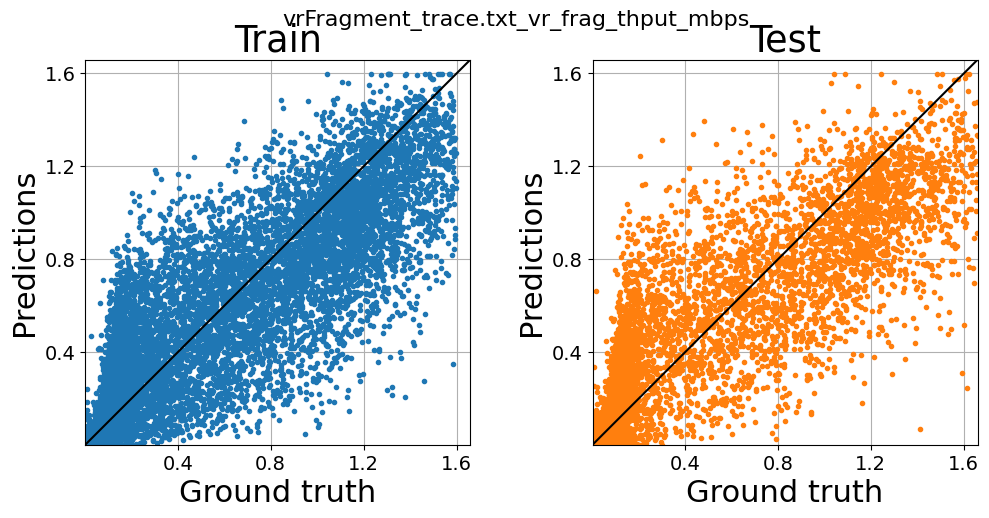



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_thput_mbps task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23048, 470)
(9903, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [16280  1711  1739  2000  1083]
After removing bins that are not populated enough
[0 1 2 3 4] [16280  1711  1739  2000  1083]
(22813, 460)
(22813,)
(22813,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [6140  996 1037 1128  471]
After removing bins that are not populated enough
[0 1 2 3 4] [6140  996 1037 1128  471]
(9772, 460)
(9772,)
(9772,)
Train data shape (20000, 460)
Test data shape (7329, 460)
Val data shape (2443, 460)


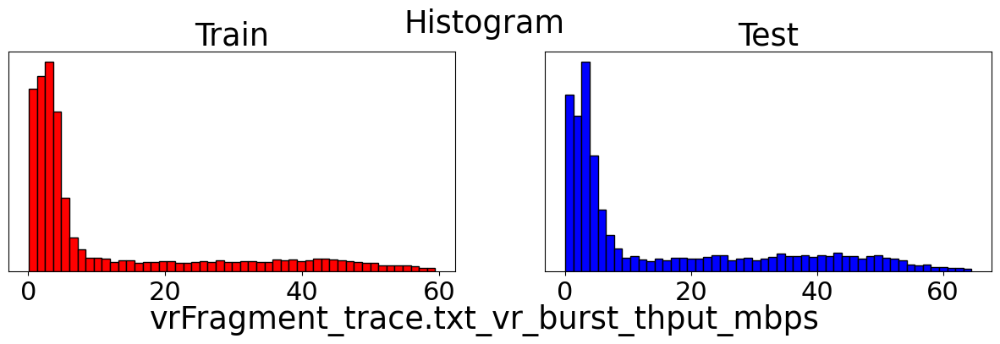

Time to process data for one learning task:  0.6561727523803711
Epoch: 10, Loss: 74.19731006469726
Epoch: 20, Loss: 65.574705859375
Epoch: 30, Loss: 60.13209058227539
Epoch: 40, Loss: 57.59257386474609
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


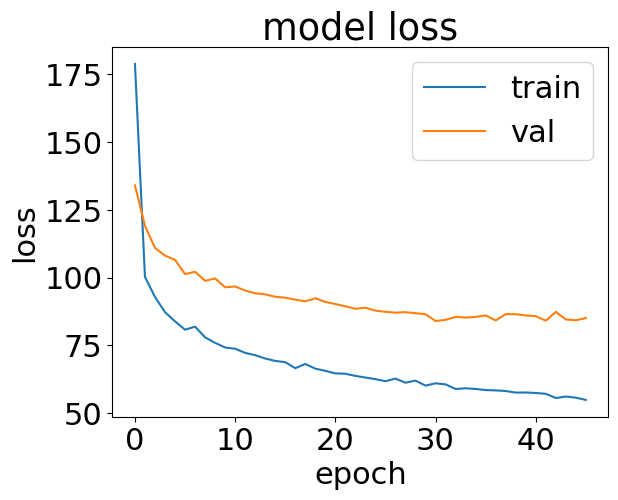

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  106.54473280906677


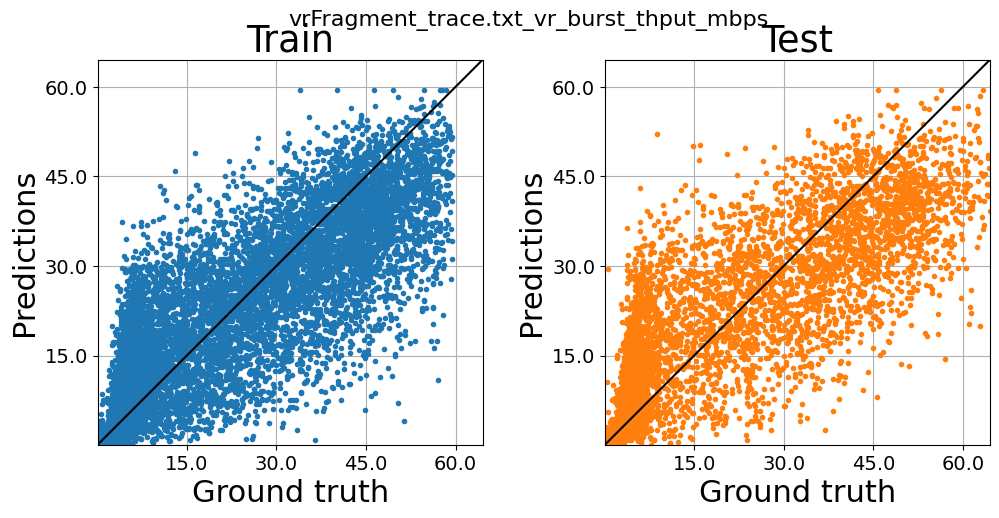



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_frag_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23078, 470)
(9908, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18247  2866  1052   455   222]
After removing bins that are not populated enough
[0 1 2 3 4] [18247  2866  1052   455   222]
(22620, 460)
(22620,)
(22620,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8118  982  430  163   83]
After removing bins that are not populated enough
[0 1 2 3 4] [8118  982  430  163   83]
(9693, 460)
(9693,)
(9693,)
Train data shape (20000, 460)
Test data shape (7269, 460)
Val data shape (2424, 460)


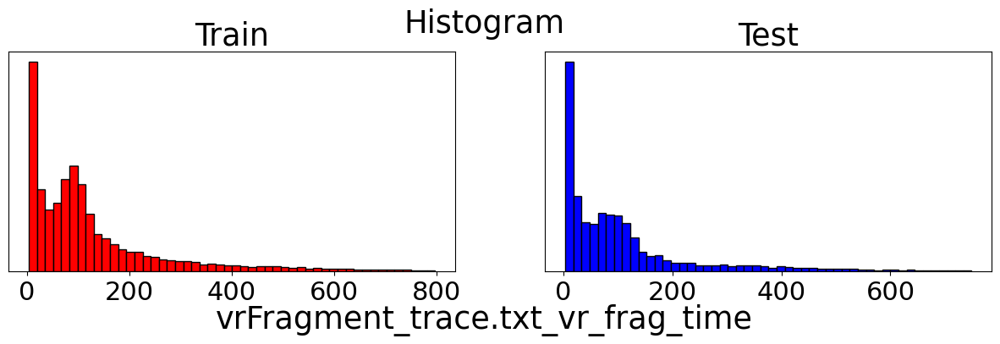

Time to process data for one learning task:  0.6864206790924072
Epoch: 10, Loss: 3081.065716015625
Epoch: 20, Loss: 2680.77574453125
Epoch: 30, Loss: 2399.21606484375
Epoch: 40, Loss: 2288.304629296875
Epoch: 50, Loss: 2147.1106203125
Epoch: 60, Loss: 2071.2851029296876
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


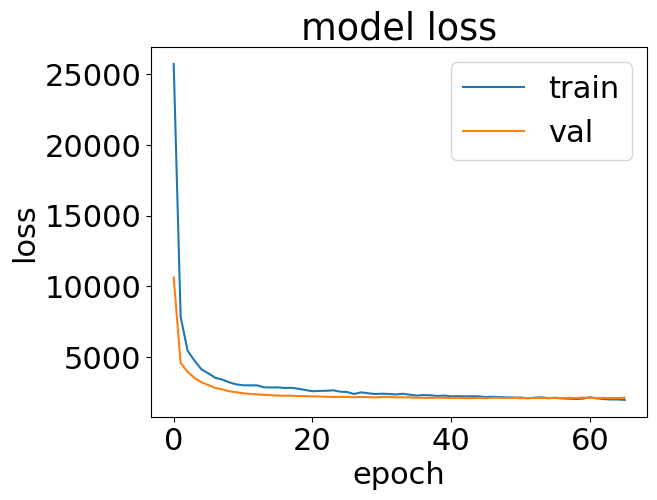

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  137.26692652702332


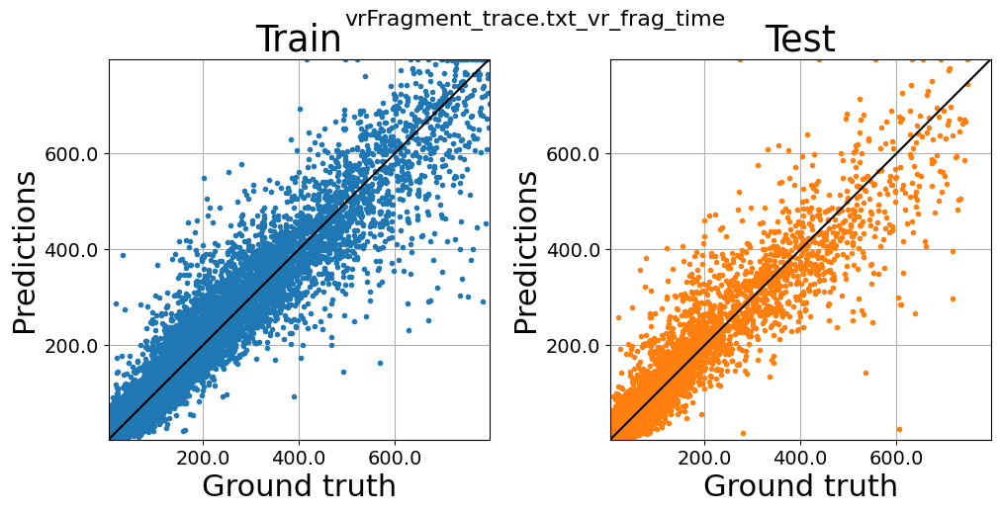



===============================  DONE  ===================================================
Learning task:  vrFragment_trace.txt_vr_burst_time task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(23048, 470)
(9903, 470)
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [18168  2872  1070   480   223]
After removing bins that are not populated enough
[0 1 2 3 4] [18168  2872  1070   480   223]
(22590, 460)
(22590,)
(22590,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [8086  999  441  162   84]
After removing bins that are not populated enough
[0 1 2 3 4] [8086  999  441  162   84]
(9688, 460)
(9688,)
(9688,)
Train data shape (20000, 460)
Test data shape (7266, 460)
Val data shape (2422, 460)


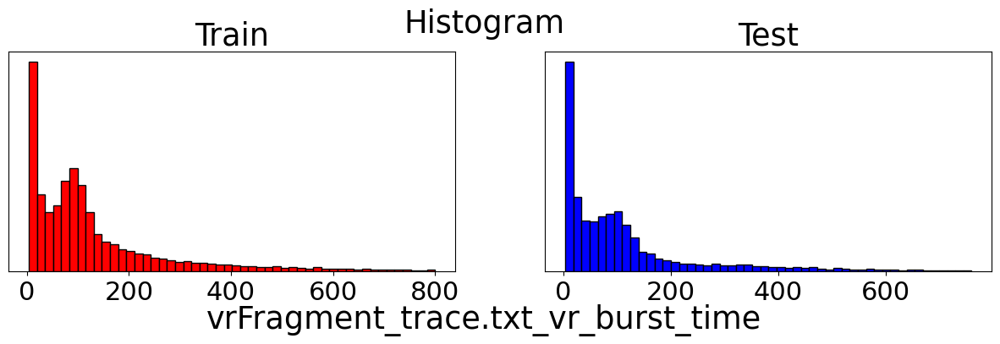

Time to process data for one learning task:  0.6573553085327148
Epoch: 10, Loss: 3450.6953859375
Epoch: 20, Loss: 2960.6676474609376
Epoch: 30, Loss: 2679.2093396484374
Epoch: 40, Loss: 2489.8420470703127
Epoch: 50, Loss: 2325.0377150390623
Epoch: 60, Loss: 2307.488101953125
Epoch: 70, Loss: 2206.6475962890627
Epoch: 80, Loss: 2174.05424296875
Epoch: 90, Loss: 2075.5487771484377
Epoch: 100, Loss: 2044.872375390625
Epoch: 110, Loss: 1965.3567489257812
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


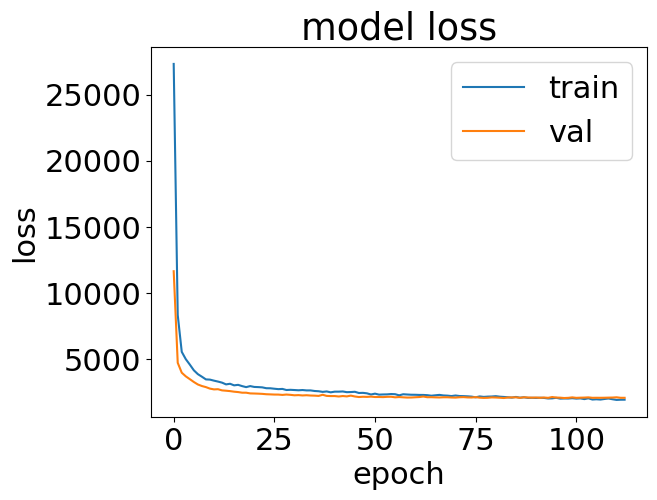

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  216.58274841308594


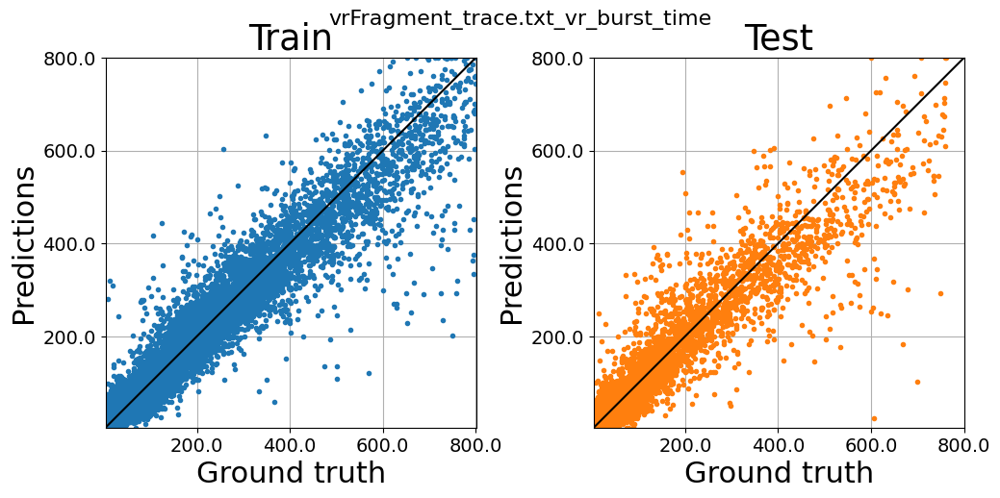



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_ul_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1185007, 470)
(510703, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1162671    4898    2529    1725    1308]
After removing bins that are not populated enough
[0 1 2 3 4] [1162671    4898    2529    1725    1308]
(1162671, 460)
(1162671,)
(1162671,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [501557   1916    948    658    504]
After removing bins that are not populated enough
[0 1 2 3 4] [501557   1916    948    658    504]
(501557, 460)
(501557,)
(501557,)
Train data shape (20000, 460)
Test data shape (3

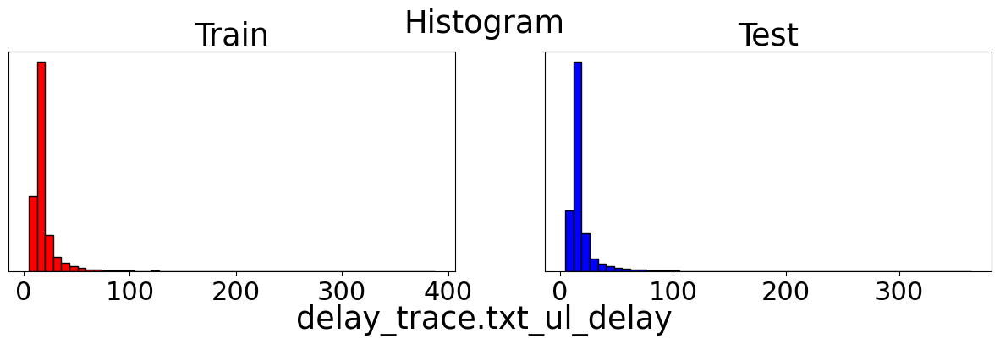

Time to process data for one learning task:  18.739193439483643
Epoch: 10, Loss: 422.3266225341797
Epoch: 20, Loss: 392.00020920410157
Epoch: 30, Loss: 365.8712188476562
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


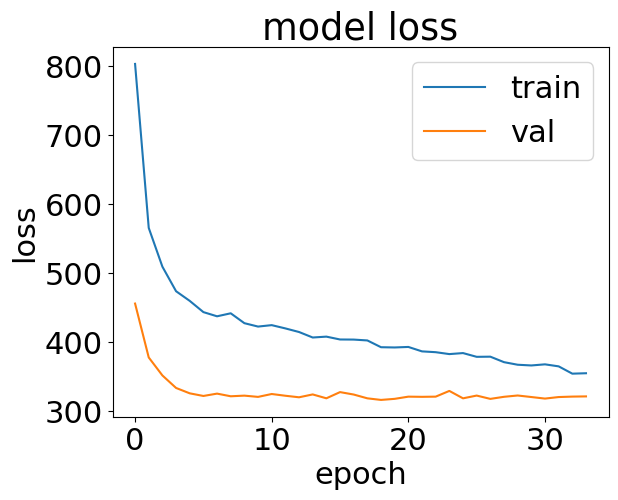

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  288.35743021965027


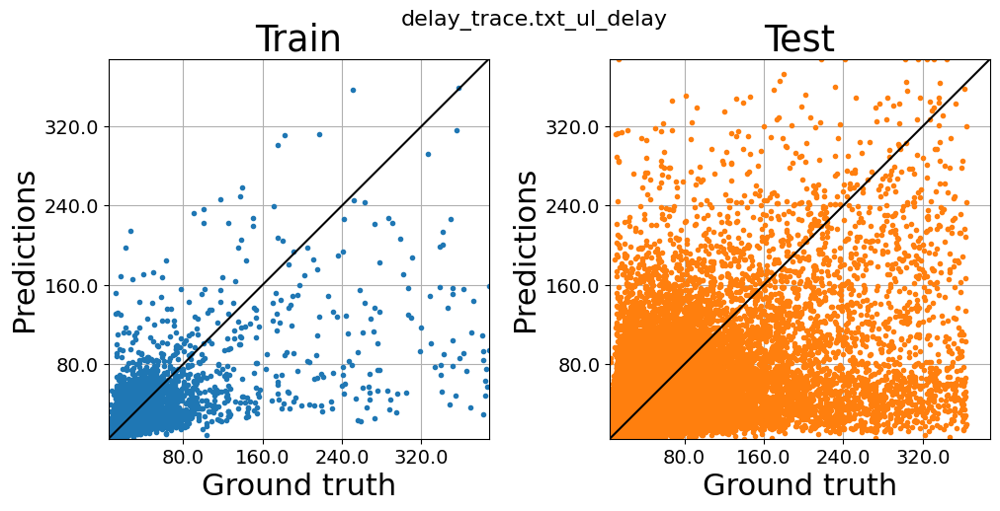



===============================  DONE  ===================================================
Learning task:  delay_trace.txt_dl_delay task type:  reg
Dropping rows for which this learning_tasks label is NA, since there is no ground truth
(1257433, 470)
(539100, 470)
NOTE: clipping all rows with delay values >  5000
NOTE: removing samples that are above the 99th percentile
NOTE: stratifying regression samples using 5 bins
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [1154139   50494   21482   11001    6227]
After removing bins that are not populated enough
[0 1 2 3 4] [1154139   50494   21482   11001    6227]
(1226115, 460)
(1226115,)
(1226115,)
bin_and_remove_outliers
Before removing bins that are not populated enough
[0 1 2 3 4] [496121  21670   8610   4098   2475]
After removing bins that are not populated enough
[0 1 2 3 4] [496121  21670   8610   4098   2475]
(526401, 460)
(526401,)
(526401,)
Train data shape (20000, 460)
Test data shape (3

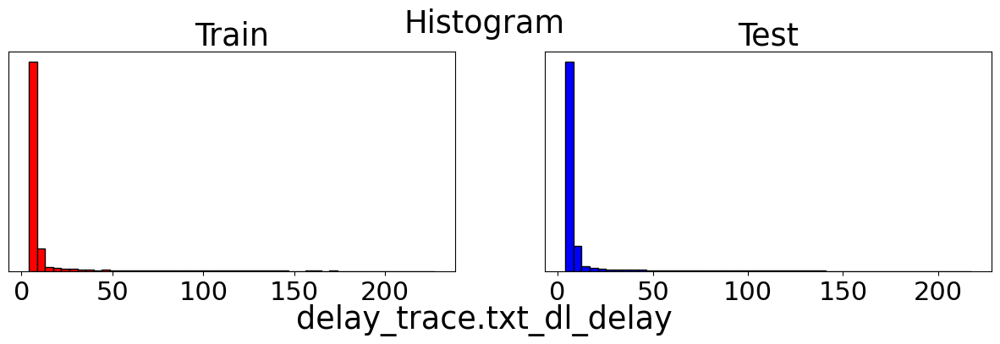

Time to process data for one learning task:  19.891345977783203
Epoch: 10, Loss: 257.59712188720704
Epoch: 20, Loss: 225.85752790527343
Epoch: 30, Loss: 210.6413572265625
Epoch: 40, Loss: 192.56522984008788
Epoch: 50, Loss: 179.47547571105957
Epoch: 60, Loss: 171.796817376709
INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


INFO:tensorflow:Assets written to: models/mlp_models/all_mlp/assets


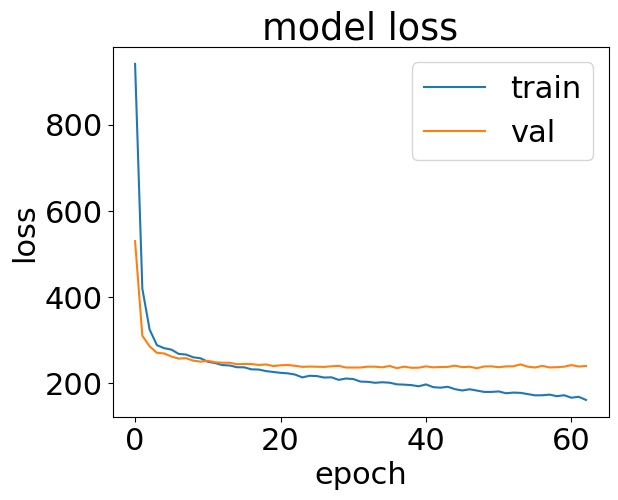

NOTE: Clipping the predictions to be within the range of the ground-truth values
Time to train model:  504.3563289642334


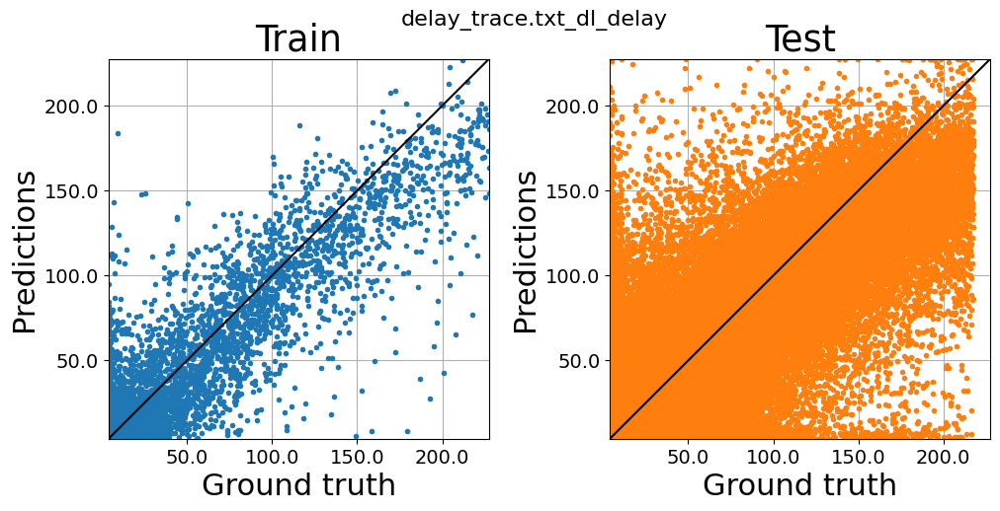



===============================  DONE  ===================================================
============================= Train set mean over runs ===================================
                                                MAE      MAPE        R2
dashClient_trace.txt_newBitRate_bps        0.881667  0.863179  0.929082
vrFragment_trace.txt_vr_frag_thput_mbps    0.106867  0.566948  0.830293
vrFragment_trace.txt_vr_burst_thput_mbps   4.198731  0.575046  0.813564
vrFragment_trace.txt_vr_frag_time         24.248101  0.379474  0.926197
vrFragment_trace.txt_vr_burst_time        24.360086  0.388606  0.924758
delay_trace.txt_ul_delay                   6.250126  0.245390  0.501434
delay_trace.txt_dl_delay                   5.120884  0.373301  0.835839
=============================== Test set results =========================================
                                                             MAE  \
dashClient_trace.txt_newBitRate_bps          [0.861 0.881 0.868]   
vrFragment_tr

In [5]:
# Erase the contents of the results file into which we append as we loop through 
open('train_results.csv', 'w').close()
open('test_results.csv', 'w').close()

# Iterate over different number of labeled samples 
for label_no in num_samples_list:
    
    EXP_PARAM['label_no'] = label_no
    print('==========================================================================')
    print('NUM. LABELLED SAMPLES: ', label_no)
    print('==========================================================================')

    # Aggregate results over runs
    train_results = pd.DataFrame(index=learning_tasks, columns=['MAE', 'MAPE', 'R2']) # or ['ACC', 'F1', 'ROC_AUC']
    test_results = pd.DataFrame(index=learning_tasks, columns=['MAE', 'MAPE', 'R2']) # or ['ACC', 'F1', 'ROC_AUC']
    # Apply the function to each cell in the DataFrame
    train_results = train_results.applymap(lambda x: create_nan_array(EXP_PARAM['num_rand_runs']))
    test_results = test_results.applymap(lambda x: create_nan_array(EXP_PARAM['num_rand_runs']))

    # Iterate over different random initializations
    for rs in range(0, EXP_PARAM['num_rand_runs']):
        read_data_start_time = time.time()
        print('==========================================================================')
        print('Random iteration: ', rs)
        print('==========================================================================')
                    
        # Randomly select which runs shall be train and which shall be test 
        shuffled_run_ind = np.random.permutation(len(train_test_run_nums))
        train_runs = train_test_run_nums[shuffled_run_ind[:num_train_runs]]
        test_runs = train_test_run_nums[shuffled_run_ind[num_train_runs:]]
        print('# train runs used ', len(train_runs))
        print('# test runs used ', len(test_runs))
        
        # Read the runs from files and creater a train and test dataset 
        train_data = read_and_concatenate_runs(train_runs, dataset_folder, train_slice, network_info, time_step_size, 
                                               use_all_feats, drop_col_substr, learning_tasks, shift_samp_for_predict, 
                                               impute_method, sum_cols_substr, all_learning_tasks_in_data)
        test_data = read_and_concatenate_runs(test_runs, dataset_folder, test_slice, network_info, time_step_size, 
                                              use_all_feats, drop_col_substr, learning_tasks, shift_samp_for_predict, 
                                              impute_method, sum_cols_substr, all_learning_tasks_in_data)
        print('Time to read data: ', time.time() - read_data_start_time)
        for idx, learning_task in enumerate(learning_tasks):
            
            task_it_start_time = time.time()
            print('================================================================================')
            print('Learning task: ', learning_task, 'task type: ', learning_task_types[idx] )
            print('================================================================================')
    
            learning_task_type = learning_task_types[idx]

            # Prepare the train and test sets and drop rows which dont have ground truth 
            print('Dropping rows for which this learning_tasks label is NA, since there is no ground truth')
            train_data_na_dropped = train_data.dropna(subset=[learning_task])
            test_data_na_dropped = test_data.dropna(subset=[learning_task])
            print(train_data_na_dropped.shape)
            print(test_data_na_dropped.shape)

            # Create classes from the bitrate levels 
            if learning_task == 'dashClient_trace.txt_newBitRate_bps' or learning_task == 'dashClient_trace.txt_oldBitRate_bps':
                train_data_na_dropped[learning_task] = dash_create_classes(train_data_na_dropped[learning_task], bitrate_levels)
                test_data_na_dropped[learning_task] = dash_create_classes(test_data_na_dropped[learning_task], bitrate_levels)
    
            # Separate the X and the y from the data 
            y_train = train_data_na_dropped[learning_task]
            y_test = test_data_na_dropped[learning_task]
            X_train = train_data_na_dropped.drop(all_learning_tasks_in_data, axis=1, errors='ignore')
            X_test = test_data_na_dropped.drop(all_learning_tasks_in_data, axis=1, errors='ignore')

            # If the beginning of the dataset has nans and we are using ffill then there might still be nans in the data 
            # so drop any additional rows with nans that have remained because of this
            X_train = X_train.dropna()
            X_test = X_test.dropna()
            # Do the same for y as well                 
            y_train = y_train.loc[X_train.index]
            y_test = y_test.loc[X_test.index]
        
            if (learning_task in ['delay_trace.txt_ul_delay', 'delay_trace.txt_dl_delay']) and clip_outliers:
                print('NOTE: clipping all rows with delay values > ', delay_clip_th)
                y_train.loc[y_train > delay_clip_th] = delay_clip_th
                y_test.loc[y_test > delay_clip_th] = delay_clip_th
                #print('NOTE: dropping all rows with delay values > ', delay_drop_th)
                #data = data[data['owd_ul'] <= delay_drop_th]
            
            # Save the columns to use for feature importance graphs
            X_feats = np.array(X_train.columns)
            np.savetxt('input_feature_list.csv', X_feats, delimiter=',', fmt="%s")
            # Convert everything to numpy 
            X_train = X_train.to_numpy()
            y_train = y_train.to_numpy()
            X_test = X_test.to_numpy()
            y_test = y_test.to_numpy()
                
            # Sample a certain number of labeled samples from the train set to use in fine-tunin
            # This step needs to be done after all operations that could drop rows are done 
            if learning_task_type == 'reg':
                print('NOTE: removing samples that are above the 99th percentile')
                print('NOTE: stratifying regression samples using 5 bins')
                X_train, y_train, train_strat_array = bin_and_remove_outliers(X_train, y_train, bins=5, perc=0.99, sample_ratio_limit=0.01)
                X_test, y_test, test_strat_array = bin_and_remove_outliers(X_test, y_test, bins=5, perc=0.99, sample_ratio_limit=0.01)
            else: # 'clas'
                train_strat_array = y_train
                test_strat_array = y_test
    
            # Sample a subset of the train samples to be equal to the num of labelled samples we need
            sample_size = EXP_PARAM['label_no']
            if len(y_train) <= EXP_PARAM['label_no']:
                print("\n\nWARNING !!!!\n\nAsked to sample from train set of size "+str(len(y_train))+ " a number greater than or equal to its size "+str(EXP_PARAM['label_no']))
                print('Going to just take as many samples as available, No need to random sample')
            else:
                # This functions helps me random sample with stratification 
                X_train, _, y_train, _ = train_test_split(X_train, y_train,
                                                                      train_size=EXP_PARAM['label_no'], shuffle=True,
                                                                      stratify=train_strat_array)
                
            # create a validation set from the test set 
            X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, 
                                                          test_size=0.25, shuffle=True, 
                                                          stratify=test_strat_array)  
            
            print('Train data shape ' + str(X_train.shape))
            print('Test data shape ' + str(X_test.shape))
            print('Val data shape ' + str(X_val.shape))
    
            plot_hist_of_y(y_train, y_test, learning_task)
             
            print('Time to process data for one learning task: ', time.time() - task_it_start_time)
            
            #=============================================== Train and test the model ==================================
        
            start_time = time.time()
        
        
            if use_pretrained_model:
                # get the latent representations from pretrained model
                # Load the pretrained model and scaler 
                # Load the saved MinMaxScaler object from the file
                with open(models_folder + scaler_to_load_name, 'rb') as f:
                    val_scaler = pickle.load(f)
                    
                X_train = val_scaler.transform(X_train).copy()
                X_test = val_scaler.transform(X_test).copy()
                X_val = val_scaler.transform(X_val).copy()
                
                # Load the pretrained model
                if pretrain_model_to_load_type == 'dae':
                    pretrain_model = dae_load(models_folder+pretrain_model_to_load_name)
                    X_train = pretrain_model.transform(pd.DataFrame(X_train))#[:, -hid_size:]
                    X_test = pretrain_model.transform(pd.DataFrame(X_test))#[:, -hid_size:]
                    X_val = pretrain_model.transform(pd.DataFrame(X_val))#[:, -hid_size:]
                elif pretrain_model_to_load_type == 'tabnet':
                    pretrain_model = TabNetPretrainer()
                    pretrain_model.load_model(models_folder+pretrain_model_to_load_name)
                    X_train = pretrain_model.predict(X_train)[0]
                    X_test = pretrain_model.predict(X_test)[0]
                    X_val = pretrain_model.predict(X_val)[0]
                elif pretrain_model_to_load_type == 'vime':
                    #print('No need to load model if pretrained model is VIME SSL')
                    # This is because the filename is directly given to the semi training function 
                    # However I do need to prepare the unlabeled data for the semi supervised part 
                    # Separate the X and the ys from the data
                    # remove the labels of all prediction tasks which are also in the datset 
                    X_pretrain = pretrain_data.drop(all_learning_tasks_in_data, axis=1, errors='ignore')
                    print('Pretrain data shape ' + str(X_pretrain.shape))
                    X_pretrain = impute_data(X_pretrain, impute_method, sum_cols_substr)
                    # Use the scaler to scale
                    X_pretrain = val_scaler.transform(X_pretrain).copy()
                else:    
                    print('Do not know model type')
                
            else: # only supervised training 
                val_scaler = create_scaler(X_train, EXP_PARAM['scaler'])
                # save the scaler model to a file
                with open(models_folder + scaler_to_save_name + '.pkl', 'wb') as f:
                    pickle.dump(val_scaler, f)
                
                X_train = val_scaler.transform(X_train).copy()
                X_test = val_scaler.transform(X_test).copy()
                X_val = val_scaler.transform(X_val).copy()



            
            if load_sup_model:
                # Load the supervised trained model
                if sup_model_to_load_type == 'mlp':
                    with open(models_folder+sup_model_to_load_name+'.pkl', 'rb') as file:
                        model = pickle.load(file)
                elif sup_model_to_load_type == 'tabnet':
                    model = TabNetRegressor()
                    model.load_model(models_folder+sup_model_to_load_name+'.zip')
                    # Feature importance 
                    train_dataloader, valid_dataloaders = model._construct_loaders(X_train, y_train, list(zip(X_test, y_test)))
                    plot_feature_importance(model._compute_feature_importances(train_dataloader), X_feats, feat_filter)
                    #tabnet_explain(model, X_test, feat_filter, X_feats)
                elif sup_model_to_load_type == 'xgb':
                    model = XGBRegressor()
                    model.load_model(models_folder+sup_model_to_load_name+'.json')
                    # Feature importance 
                    plot_feature_importance(model.feature_importances_, X_feats, feat_filter)
                else:
                    print('Do not know model type')
            else: # Need to train the model
                # Train and save the model 
                if sup_model_type == 'vime':
                    # This is kept separate since the others don't need X_pretrain for the supervised training while the
                    # VIME semi supervised training needs the X_pretrain unlabeled samples
                    vime_semi_parameters = dict()
                    vime_semi_parameters['hidden_dim'] = hyp_ssl_semi_vime['semi_hidden_dim']
                    vime_semi_parameters['batch_size'] = hyp_ssl_semi_vime['semi_batch_size']
                    vime_semi_parameters['iterations'] = hyp_ssl_semi_vime['semi_iterations']
        
                    print(y_train.shape)
                    print(np.expand_dims(y_train, axis=1).shape)
                    # If using vime_semi_mod
                    yhat_train, yhat_test = vime_semi_mod(X_train, np.expand_dims(y_train, axis=1), X_pretrain, X_test, 
                                       vime_semi_parameters, hyp_ssl_semi_vime['p_m'], hyp_ssl_semi_vime['K'], hyp_ssl_semi_vime['beta'], 
                                          models_folder+pretrain_model_to_load_name, is_regression=(learning_task_type == 'reg'))
                    if learning_task_type == 'clas':
                        print(yhat_test.shape)
                        print('I need a way to get the equivalent of predict_proba here from VIME, just labels wont do')
                    yhat_train = yhat_train.flatten()
                    yhat_test = yhat_test.flatten()
                    
        
                else: #         
                    model, history = train_model(X_train, X_val, 
                                                y_train, y_val, 
                                                sup_model_type, learning_task_type,
                                                models_folder + suptrain_model_to_save_name,
                                                sup_hyper_params)
                    if learning_task_type == 'reg':
                        yhat_test = model.predict(X_test).flatten()
                        yhat_train = model.predict(X_train).flatten()
                        # Clip predictions to the range of the training data
                        print('NOTE: Clipping the predictions to be within the range of the ground-truth values')
                        yhat_train = np.clip(yhat_train, y_train.min(), y_train.max())
                        yhat_test = np.clip(yhat_test, y_train.min(), y_train.max())
                        
                    else: #learning_task_type == 'clas':
                        if sup_model_type == 'xgb':
                            yhat_test = model.predict(X_test).flatten()
                            yhat_train = model.predict(X_train).flatten()
                            yhat_test_proba = model.predict_proba(X_test)
                            yhat_train_proba = model.predict_proba(X_train)
                        else:
                            yhat_test = np.argmax(model.predict(X_test), axis=1)
                            yhat_train = np.argmax(model.predict(X_train), axis=1)
                            yhat_test_proba = model.predict(X_test)
                            yhat_train_proba = model.predict(X_train)
                        
            
                end_time = time.time()
                print('Time to train model: ', end_time - start_time)
                if not use_pretrained_model:
                    # Feature importance
                    if ((sup_model_type == 'tabnet') or (sup_model_type == 'xgb')):
                        plot_feature_importance(model.feature_importances_, X_feats, feat_filter)
            
            #====================================
            # Predict using the supervised model 
            #====================================
            
            if learning_task_type == 'reg':
                if np.isnan(yhat_train).any():
                    print('WARNING: nans in the predicted train vals')
                    print(yhat_train)
                train_results.loc[learning_task, 'MAE'][rs] = compute_error(y_train, yhat_train, 'mae')
                train_results.loc[learning_task, 'MAPE'][rs] = compute_error(y_train, yhat_train, 'mape')
                train_results.loc[learning_task, 'R2'][rs] = compute_error(y_train, yhat_train, 'r2')
                # Compute and Print Test set errors
                if np.isnan(yhat_test).any():
                    print('WARNING: NaNs in the predicted test vals')
                    print(yhat_test)
                test_results.loc[learning_task, 'MAE'][rs] = compute_error(y_test, yhat_test, 'mae')
                test_results.loc[learning_task, 'MAPE'][rs] = compute_error(y_test, yhat_test, 'mape')
                test_results.loc[learning_task, 'R2'][rs] = compute_error(y_test, yhat_test, 'r2')

                # Predicted versus ground-truth plots
                fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
                fig.suptitle(learning_task, fontsize=16)
                y = np.concatenate((y_train, y_test))
                yhat = np.concatenate((yhat_train, yhat_test))
                bounds=[min( min(y),min(yhat) ), max( max(y),max(yhat) )]        
                # Configure each subplot
                setup_axes(axes[0], y_train, yhat_train, 'Train', COLOUR_HEX[0], bounds)  # Adjust color as needed
                setup_axes(axes[1], y_test, yhat_test, 'Test', COLOUR_HEX[1], bounds)  # Adjust color as needed
                #plt.tight_layout()
                plt.show()
            else: 
                if np.isnan(yhat_train).any():
                    print('WARNING: nans in the predicted train vals')
                    print(yhat_train)
                train_results.loc[learning_task, 'MAE'][rs] = compute_error(y_train, yhat_train, 'acc')
                train_results.loc[learning_task, 'MAPE'][rs] = compute_error(y_train, yhat_train, 'f1score')
                train_results.loc[learning_task, 'R2'][rs] = compute_error(y_train, yhat_train_proba, 'roc_auc')
            
                # Compute and Print Test set errors
                if np.isnan(yhat_test).any():
                    print('WARNING: NaNs in the predicted test vals')
                    print(yhat_test)
                test_results.loc[learning_task, 'MAE'][rs] = compute_error(y_test, yhat_test, 'acc')
                test_results.loc[learning_task, 'MAPE'][rs] = compute_error(y_test, yhat_test, 'f1score')
                test_results.loc[learning_task, 'R2'][rs] = compute_error(y_test, yhat_test_proba, 'roc_auc')
                
                # Confusion matrix plots
                draw_confusion_matrix(y_train, yhat_train, 'Train: Confusion Matrix')
                draw_confusion_matrix(y_test, yhat_test, 'Test: Confusion Matrix')
           
            print('')
            print('')
            print('===============================  DONE  ===================================================')
            
    #print('============================= Train set results ==========================================')
    #print(train_results.applymap(format_array))
    print('============================= Train set mean over runs ===================================')
    mean_train_results = train_results.applymap(mean_array)
    print(mean_train_results)
    #print('============================= Train set SD over runs =====================================')
    #print(train_results.applymap(std_array))
    print('=============================== Test set results =========================================')
    print(test_results.applymap(format_array))
    print('============================= Test set mean over runs ====================================')
    mean_test_results = test_results.applymap(mean_array)
    print(test_results.applymap(mean_array))
    #print('============================= Test set SD over runs ======================================')
    #print(test_results.applymap(std_array))
    print('==========================================================================================')
    mean_train_results.to_csv('train_results.csv', mode='a')    
    mean_test_results.to_csv('test_results.csv', mode='a')
    

In [6]:
os.system('cp train_and_eval.ipynb '+'../saved_results_notebooks/'+notebook_save_str+'.ipynb')
os.system('cp train_results.csv '+'../saved_results_notebooks/'+notebook_save_str+'_train_results.csv')
os.system('cp test_results.csv '+'../saved_results_notebooks/'+notebook_save_str+'_test_results.csv')

0